In [1]:
# All imports
import os
import shutil
import random
from PIL import Image
import torch
from random import choice
import subprocess

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from IPython.display import Image as IPImage

from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array, array_to_img
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

2025-05-15 20:13:52.081119: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-15 20:13:52.081271: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-15 20:13:52.225429: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


## Short Instructions
This project was made on kaggle.com. If You are using it on your local machine, You can skip this part and download all needed files/datasets etc. from kaggle linked in README on this repository
- Before starting ADD P100 GPU at the RIGHT CORNER for faster image processing
- All datasets are on the right side in dataset sections and available in this notebook
- Adapt code to Your goals

OK so lets get started..

## Moving data to working directories (we have 4 datasets)
* Original Dataset
* With deleted categories with less than 100 images
* With augmentation in categories with less than 100 images
* With deleted categories with less than 100 images && with augmentation to the same images number

In [ ]:
# Original data paths
train_data_dir_input = '/kaggle/input/polish-traffic-signs-dataset/train'
val_data_dir_input = '/kaggle/input/polish-traffic-signs-dataset/test'

# Clear working directories if u need to
if os.path.exists('/kaggle/working/original_dataset'):
    print("Removing files from original_dataset")
    shutil.rmtree('/kaggle/working/original_dataset')
    
if os.path.exists('/kaggle/working/deleted_dataset'):
    print("Removing files from deleted_dataset")
    shutil.rmtree('/kaggle/working/deleted_dataset')
    
if os.path.exists('/kaggle/working/augmented_dataset'):
    print("Removing files from augmented_dataset")
    shutil.rmtree('/kaggle/working/augmented_dataset')
    
if os.path.exists('/kaggle/working/augmented_and_deleted_dataset'):
    print("Removing files from augmented_and_deleted_dataset")
    shutil.rmtree('/kaggle/working/augmented_and_deleted_dataset')

In [93]:
# ORIGINAL DATA - DIRECTORY CREATED
print("Copying files to original_dataset")
shutil.copytree('/kaggle/input/polish-traffic-signs-dataset', '/kaggle/working/original_dataset')
# Paths definition
original_train_data_dir = '/kaggle/working/original_dataset/train'
original_test_data_dir = '/kaggle/working/original_dataset/test'

# WITH DELETED CATEGORIES - DIRECTORY CREATED
print("Copying files to deleted_dataset")
shutil.copytree('/kaggle/input/polish-traffic-signs-dataset', '/kaggle/working/deleted_dataset')
# Paths definition
deleted_train_data_dir = '/kaggle/working/deleted_dataset/train'
deleted_test_data_dir = '/kaggle/working/deleted_dataset/test'

# WITH AUGMENTED CATEGORIES - DIRECTORY CREATED
print("Copying files to augmented_dataset")
shutil.copytree('/kaggle/input/polish-traffic-signs-dataset', '/kaggle/working/augmented_dataset')
# Paths definition
augmented_train_data_dir = '/kaggle/working/augmented_dataset/train'
augmented_test_data_dir = '/kaggle/working/augmented_dataset/test'

# WITH AUGMENTED AND DELETED CATEGORIES - DIRECTORY CREATED
print("Copying files to agmented_and_deleted_dataset")
shutil.copytree('/kaggle/input/polish-traffic-signs-dataset', '/kaggle/working/augmented_and_deleted_dataset')
# Paths definition
augmented_and_deleted_train_data_dir = '/kaggle/working/augmented_and_deleted_dataset/train'
augmented_and_deleted_test_data_dir = '/kaggle/working/augmented_and_deleted_dataset/test'

Copying files to original_dataset
Copying files to deleted_dataset
Copying files to augmented_dataset
Copying files to agmented_and_deleted_dataset


## All classes from dataset

In [94]:
# Thats all classes we have in dataset of Polish Traffic Signs
class_names = {
            'A-1': 'Niebezpieczny zakręt w prawo',
            'A-11': 'Nierówna droga',
            'A-11a': 'Próg zwalniający',
            'A-12a': 'Zwężenie jezdni - dwustronne',
            'A-14': 'Roboty drogowe',
            'A-15': 'Śliska jezdnia',
            'A-16': 'Przejście dla pieszych',
            'A-17': 'Dzieci',
            'A-18b': 'Zwierzęta dzikie',
            'A-2': 'Niebezpieczny zakręt w lewo',
            'A-20': 'Odcinek jezdni o ruchu dwukierunkowym',
            'A-21': 'Tramwaj',
            'A-24': 'Rowerzyści',
            'A-29': 'Sygnały świetlne',
            'A-3': 'Niebezpieczne zakręty, pierwszy w prawo',
            'A-30': 'Inne niebezpieczeństwo',
            'A-32': 'Oszronienie jezdni',
            'A-4': 'Niebezpieczne zakręty, pierwszy w lewo',
            'A-6a': 'Skrzyżowanie z drogą podporządkowaną występującą po obu stronach',
            'A-6b': 'Skrzyżowanie z drogą podporządkowaną występującą po prawej stronie',
            'A-6c': 'Skrzyżowanie z drogą podporządkowaną występującą po lewej stronie',
            'A-6d': 'Wlot drogi jednokierunkowej z prawej strony',
            'A-6e': 'Wlot drogi jednokierunkowej z lewej strony',
            'A-7': 'Ustąp pierwszeństwa',
            'A-8': 'Skrzyżowanie o ruchu okrężnym',
            'B-1': 'Zakaz ruchu w obu kierunkach',
            'B-18': 'Zakaz wjazdu pojazdów o rzeczywistej masie całkowitej ponad ... t.',
            'B-2': 'Zakaz wjazdu',
            'B-20': 'STOP',
            'B-21': 'Zakaz skręcania w lewo',
            'B-22': 'Zakaz skręcania w prawo',
            'B-25': 'Zakaz wyprzedzania',
            'B-26': 'Zakaz wyprzedzania przez samochody ciężarowe',
            'B-27': 'Koniec zakazu wyprzedzania',
            'B-33': 'Ograniczenie prędkości',
            'B-34': 'Koniec ograniczenia prędkości',
            'B-36': 'Zakaz zatrzymywania się',
            'B-41': 'Zakaz ruchu pieszych',
            'B-42': 'Koniec zakazów',
            'B-43': 'Strefa ograniczonej prędkości',
            'B-44': 'Koniec strefy ograniczonej prędkości',
            'B-5': 'Zakaz wjazdu samochodów ciężarowych',
            'B-6-B-8-B-9': 'Zakaz wjazdu pojazdów innych niż samochodowe',
            'B-8': 'Zakaz wjazdu pojazdów zaprzęgowych',
            'B-9': 'Zakaz wjazdu rowerów',
            'C-10': 'Nakaz jazdy z lewej strony znaku',
            'C-12': 'Ruch okrężny',
            'C-13': 'Droga dla rowerów',
            'C-13-C-16': 'Droga dla pieszych i rowerzystów',
            'C-13a': 'Koniec drogi dla rowerów',
            'C-13a-C-16a': 'Koniec drogi dla pieszych i rowerzystów',
            'C-16': 'Droga dla pieszych',
            'C-2': 'Nakaz jazdy w prawo za znakiem',
            'C-4': 'Nakaz jazdy w lewo za znakiem',
            'C-5': 'Nakaz jazdy prosto',
            'C-6': 'Nakaz jazdy prosto lub w prawo',
            'C-7': 'Nakaz jazdy prosto lub w lewo',
            'C-9': 'Nakaz jazdy z prawej strony znaku',
            'D-1': 'Droga z pierwszeństwem',
            'D-14': 'Koniec pasa ruchu',
            'D-15': 'Przystanek autobusowy',
            'D-18': 'Parking',
            'D-18b': 'Parking zadaszony',
            'D-2': 'Koniec drogi z pierwszeństwem',
            'D-21': 'Szpital',
            'D-23': 'Stacja paliwowa',
            'D-23a': 'Stacja paliwowa tylko z gazem do napędu pojazdów',
            'D-24': 'Telefon',
            'D-26': 'Stacja obsługi technicznej',
            'D-26b': 'Myjnia',
            'D-26c': 'Toaleta publiczna',
            'D-27': 'Bufet lub kawiarnia',
            'D-28': 'Restauracja',
            'D-29': 'Hotel (motel)',
            'D-3': 'Droga jednokierunkowa',
            'D-40': 'Strefa zamieszkania',
            'D-41': 'Koniec strefy zamieszkania',
            'D-42': 'Obszar zabudowany',
            'D-43': 'Koniec obszaru zabudowanego',
            'D-4a': 'Droga bez przejazdu',
            'D-4b': 'Wjazd na drogę bez przejazdu',
            'D-51': 'Automatyczna kontrola prędkości',
            'D-52': 'Strefa ruchu',
            'D-53': 'Koniec strefy ruchu',
            'D-6': 'Przejście dla pieszych',
            'D-6b': 'Przejście dla pieszych i przejazd dla rowerzystów',
            'D-7': 'Droga ekspresowa',
            'D-8': 'Koniec drogi ekspresowej',
            'D-9': 'Autostrada',
            'D-tablica': 'Zbiorcza tablica informacyjna',
            'G-1a': 'Słupek wskaźnikowy z trzema kreskami umieszczany po prawej stronie jezdni',
            'G-3': 'Krzyż św. Andrzeja przed przejazdem kolejowym jednotorowym'
        }

## This function is used to mark that the dataset is not balanced with a simple plot

In [ ]:
def create_and_plot_data(data_dir):
    data={}
    
    for root, dirs, files in os.walk(data_dir):
        for dir_name in dirs:
            files_in_dir = os.listdir(os.path.join(root, dir_name))
            data[dir_name] = len(files_in_dir)
    
    # Let's see what number of images each category have
    plt.figure(figsize=(15, 4))
    plt.bar(range(len(data)), data.values(), color="purple", align="center", width=0.8)
    plt.xticks(range(len(data)), data.keys(), rotation=90, fontsize=8)
    plt.yticks(fontsize=8)

    for i, val in enumerate(data.values()):
        plt.text(i, val + 1, str(val), ha='center', fontsize=8)
    
    # Show plot
    plt.tight_layout()
        

## Function for augmenting images in categories. End effect is that all classes have similiar amount of images in them, but the images are also augmented (shifted, darkened, rotated and etc..) so the model won't overfit.

In [ ]:
augmented_data = []

def augment_images(image_dir, target_count):
    images = os.listdir(image_dir)
    num_images = len(images)
    
    # remove excess images
    if num_images > target_count:
        excess_images = images[target_count:]
        for image in excess_images:
            os.remove(os.path.join(image_dir, image))
    
    datagen = ImageDataGenerator(
        rotation_range=0.1,
        width_shift_range=0.1,
        height_shift_range=0.1,
        brightness_range=[0.5, 1.5],
        channel_shift_range=0.2
    )
    
    # generate more images
    if num_images < target_count:
        num_augmented_images = target_count - num_images
        for i in range(num_augmented_images):
            # choosing image to augment
            image_path = os.path.join(image_dir, images[i % num_images])
            img = load_img(image_path)
            # image to array
            x = img_to_array(img)
            # We need to add 4th dimention to the picture (it changes nothing visually)
            x = x.reshape((1,) + x.shape)
            i = 0
            for batch in datagen.flow(
                x, 
                batch_size=1, 
                save_to_dir=image_dir, 
                save_prefix='augmented', 
                save_format='jpg'):
                i += 1
                if i >= 1:
                    break

def augment_categories(root_dir, target_num):
    for category in os.listdir(root_dir):
        category_dir = os.path.join(root_dir, category)
        if os.path.isdir(category_dir):
            augment_images(category_dir, target_num)

## Function to remove categories with less than 100 images, as there are unusual traffic signs which confuse model

In [ ]:
def remove_categories(root_dir, threshold):
    categories = os.listdir(root_dir)
    
    for category in categories:
        num_of_images = len(os.listdir(os.path.join(root_dir, category)))
        if num_of_images < threshold:
            shutil.rmtree(os.path.join(root_dir, category))

## Function for synchronizing Test Dataset with Traing Dataset categories

In [ ]:
def synchronize_folders(train_data_dir, test_data_dir):
    train_categories = os.listdir(train_data_dir)
    test_categories = os.listdir(test_data_dir)
    
    for category in test_categories:
        if category not in train_categories:
            folder_to_delete = os.path.join(test_data_dir, category)
            shutil.rmtree(folder_to_delete)
    
    test_categories = os.listdir(test_data_dir)
    
    num_train_folders = len(train_categories)
    num_test_folders = len(test_categories)
    
    print(f"Liczba folderów w {train_data_dir}: {num_train_folders}")
    print(f"Liczba folderów w {test_data_dir}: {num_test_folders}")

## Lets see what number of images we have in each category of *Original Dataset*

In [ ]:
create_and_plot_data(original_train_data_dir)

## Lets see what number of images we have in each category of *Deleted Dataset*
Deleted Dataset -> category with less than 100 images is being removed from dataset

In [ ]:
# Training Dataset
remove_categories(deleted_train_data_dir, 100)
# Test Dataset
synchronize_folders(deleted_train_data_dir, deleted_test_data_dir)
# Plot
create_and_plot_data(deleted_train_data_dir)

## Lets see what number of images we have in each category of *Augmented Dataset*
Agumented Dataset -> categories have similiar count of images by augmentation

In [ ]:
# Training Dataset
augment_categories(augmented_train_data_dir, 300)
# Plot
create_and_plot_data(augmented_train_data_dir)

## Lets see what number of images we have in each category of *Deleted and Augmented Dataset*
Deleted and Augmented Dataset -> First deletion then augmentation

In [ ]:
# Training Dataset
remove_categories(augmented_and_deleted_train_data_dir, 100)
augment_categories(augmented_and_deleted_train_data_dir, 300)
# Test Dataset
synchronize_folders(augmented_and_deleted_train_data_dir, augmented_and_deleted_test_data_dir)
# Plot
create_and_plot_data(augmented_and_deleted_train_data_dir)

## Displaying random 5 categories of images with 5 images each

In [ ]:
def plot_random_images(category_dir):
    images = os.listdir(category_dir)
    random_images = random.sample(images, 5)
    plt.figure(figsize=(10, 150))
    for i, image_name in enumerate(random_images):
        image_path = os.path.join(category_dir, image_name)
        image = Image.open(image_path)
        plt.subplot(1, 5, i+1)
        plt.imshow(image)
        plt.axis('off')
        plt.title(f"Znak {i+1}")
    plt.show()

In [ ]:
idx = 0

for category in os.listdir(augmented_and_deleted_train_data_dir):
    category_dir = os.path.join(augmented_and_deleted_train_data_dir, category)
    plot_random_images(category_dir)
    idx += 1
    if idx > 5:
        break

# Using YOLOv5 to detect and cut out traffic signs from photograph

In [2]:
# go to working directory
%cd
%cd /kaggle/working/
%pwd

# clear YOLOv5 directory and dataset directory if exists
try:
    shutil.rmtree("/kaggle/working/yolov5")
    shutil.rmtree("/kaggle/working/yolo_dataset")
except:
    pass

# clone YOLOv5 repo
!git clone https://github.com/ultralytics/yolov5
print("repo cloned")

# go into repo catalog
%cd yolov5/

# install requirements (q - quiet, r - requirements)
!pip install -qr requirements.txt
print("requierements installed")

# go to working directory
%cd
%cd /kaggle/working/
%pwd

print(f'Setup complete. Using torch {torch.__version__}')

/root
/kaggle/working
Cloning into 'yolov5'...
remote: Enumerating objects: 16620, done.
remote: Counting objects: 100% (98/98), done.
remote: Compressing objects: 100% (69/69), done.
remote: Total 16620 (delta 55), reused 62 (delta 29), pack-reused 16522
Receiving objects: 100% (16620/16620), 15.10 MiB | 24.97 MiB/s, done.
Resolving deltas: 100% (11414/11414), done.
repo cloned
/kaggle/working/yolov5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
spopt 0.6.0 requires shapely>=2.0.1, but you have shapely 1.8.5.post1 which is incompatible.
ydata-profiling 4.6.4 requires numpy<1.26,>=1.16.0, but you have numpy 1.26.4 which is incompatible.
requierements installed
/root
/kaggle/working
Setup complete. Using torch 2.1.2


## Data preparation on kaggle

In [5]:
shutil.copytree('/kaggle/input/polish-traffic-signs-dataset', '/kaggle/working/original_dataset')

# Paths definitions
original_train_data_dir = '/kaggle/working/original_dataset/train'
original_test_data_dir = '/kaggle/working/original_dataset/test'

orig_dataset_dir = "/kaggle/input/polish-traffic-signs-dataset"
prepared_dataset_dir = "/kaggle/working/datasets/"

detection_images_dir = os.path.join(orig_dataset_dir, "detection/imgs")
detection_labels_dir = os.path.join(orig_dataset_dir, "detection/labels")

detection_train_dir = os.path.join(prepared_dataset_dir, "detection/train")
detection_val_dir = os.path.join(prepared_dataset_dir, "detection/val")
detection_test_dir = os.path.join(prepared_dataset_dir, "detection/test")

# shuffle the data
data = os.listdir(detection_images_dir)
random.shuffle(data)

# 70-10-20 data split
train_data = data[:7 * len(data) // 10]
val_data = data[7 * len(data) // 10: 8 * len(data) // 10]
test_data = data[8 * len(data) // 10:]


def copy_data(data, target_dir):
    if not os.path.exists(target_dir):
        os.makedirs(target_dir)
    
    # assuming the label file name is the same as image file name
    for image_file_name in data:
        image_path = os.path.join(detection_images_dir, image_file_name)
        label_path = os.path.join(detection_labels_dir, os.path.splitext(image_file_name)[0] + ".txt")
        
        # copy the data into a new folder
        shutil.copy(image_path, target_dir)
        shutil.copy(label_path, target_dir)


# split data into different folders
copy_data(train_data, detection_train_dir)
copy_data(val_data, detection_val_dir)
copy_data(test_data, detection_test_dir)

FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/input/polish-traffic-signs-dataset/detection/imgs'

## Yaml needed for dataset used by YOLOv5

In [ ]:
# Clear yaml if you have it already
try:
    if os.path.exists('/kaggle/working/yolo_dataset/dataset.yaml'):
        os.remove('/kaggle/working/yolo_dataset/dataset.yaml')
        print('yaml removed')
except:
    pass

yaml_text = '''
train: /kaggle/working/yolo_dataset/images/train
val: /kaggle/working/yolo_dataset/images/val
nc: 4
names: ['speed limit','yield','mandatory','other']
'''

# Path to .yaml
file_path = '/kaggle/working/yolo_dataset/dataset.yaml'

# Saving .yaml
with open(file_path, 'w') as file:
    file.write(yaml_text)

## Training YOLOv5

In [ ]:
%cd yolov5
!wandb disabled
!python train.py --img 415 --batch 16 --epochs 15 --data /kaggle/working/yolo_dataset/dataset.yaml --weights yolov5s.pt --cache --workers 2

## Function to find latest directory in results

In [ ]:
def find_latest_results_dir_jpg(file_jpg):
    # Detection results directory path
    results_dir = './runs/detect/'
    # List all subdirectories (all exps)
    all_subdirs = [os.path.join(results_dir, sub_dir) for sub_dir in os.listdir(results_dir) if os.path.isdir(os.path.join(results_dir, sub_dir))]
    # Find latest path, it will be from last detection
    latest_dir = max(all_subdirs, key=os.path.getmtime)
    # Whole path
    results_path = latest_dir
    # Getting image
    file_jpg_detected = f'{results_path}/{file_jpg}'
    
    return file_jpg_detected, results_path

## Function to collect all img paths (there can be many signs detected)

In [ ]:
def collect_jpg_paths(folder_path, jpg_paths):

    for item in os.listdir(folder_path):
        item_path = os.path.join(folder_path, item)

        if os.path.isdir(item_path):
            collect_jpg_paths(item_path, jpg_paths)
        elif os.path.isfile(item_path) and item.lower().endswith('.jpg'):
            jpg_paths.append(item_path)
    return jpg_paths

## Function to choose a image and detect sign

In [ ]:
def detect_sign_and_crop(file_jpg_path='/kaggle/input/road-photos/road_photos/sign1.jpg'):
    cropped_signs_list = []
    command = f"python detect.py --source '{file_jpg_path}' --weights ./runs/train/exp/weights/best.pt --save-crop"
    try:
        # Run detect.py
        subprocess.run(command, shell=True, check=True)
        print("Detect.py Successfull")
    except subprocess.CalledProcessError as e:
        print(f"Error during detection: {e}")
    
    # Get the detected image path
    file_jpg = file_jpg_path.split('/')[-1]
    file_jpg_detected_path, results_path = find_latest_results_dir_jpg(file_jpg)
    
    # Find the path to directory exp/crops/obj_class
    explicit_crops_path = f'{results_path}/crops/'
    crops_class_dir_name = os.listdir(explicit_crops_path)[0]
    
    # Get cropped image paths
    jpg_paths = []
    jpg_paths.append(file_jpg_path)
    jpg_paths.append(file_jpg_detected_path)
    cropped_img_paths = collect_jpg_paths(explicit_crops_path, jpg_paths)
    print(jpg_paths)
    
    # Plotting
    num_images_per_row = 3
    num_images = len(jpg_paths)
    num_rows = (num_images + num_images_per_row - 1) // num_images_per_row

    plt.figure(figsize=(15, 5 * num_rows))

    for i, jpg_path in enumerate(jpg_paths):
        img = mpimg.imread(jpg_path)
    
        plt.subplot(num_rows, num_images_per_row, i + 1)
        plt.imshow(img)
        plt.axis('off')
        
        if i == 0:
            plt.title(f'Basic image')
        elif i == 1:
            plt.title(f'Detected objects')
        elif i > 1:
            plt.title(f'Cropped object {i - 1}')
            cropped_signs_list.append('/kaggle/working/yolov5' + jpg_path[1:])

    plt.tight_layout()
    plt.show()
    jpg_paths = []
    
    return cropped_signs_list

## Plotting the results

In [ ]:
!pwd
file_jpg = choice(os.listdir('/kaggle/working/yolo_dataset/images/val/'))
file_jpg_path = '/kaggle/working/yolo_dataset/images/val/' + file_jpg

signs_to_classify = detect_sign_and_crop(file_jpg_path)
signs_to_classify

## Wrapper for hybrid model

In [ ]:
model = load_model('/kaggle/input/best_model/tensorflow1/best1/1/model_original.h5')

In [ ]:
def predict_sign_class_from_image(image_path):
    image = Image.open(image_path)
    image = image.resize((32,32))
    image_array = np.array(image.convert('RGB'))
    image_array.shape = (1, 32, 32, 3)
        
    if os.path.exists(image_path):
        sign_class_name = os.path.basename(os.path.dirname(image_path))
    else:
        return 'Path does not exist!'
    
    result = model.predict(image_array, verbose=0)
    ind = np.argmax(result)
    key_for_ind = list(class_names.keys())[ind]
    prediction = class_names[key_for_ind]
    
    plt.imshow(image)
    plt.show()
    print(f'The traffic sign is: {sign_class_name} | Model predicted: {key_for_ind} | Class name: {prediction}')

In [ ]:
def predict_with_hybrid_model(image_path):
    
    # yolov5 signs detection and cropping (we take only cropped signs)
    try:
        signs_paths_to_detect = detect_sign_and_crop(image_path)
    # signs_paths_to_detect = signs_paths_to_detect[2:]
        if len(signs_paths_to_detect) == 0:
            raise ValueError("No signs detected on this image")
    except ValueError as ve:
        print("Error:", ve)
    
    # predicting class of cropped images with pretrained CNN model
    for sign_path in signs_paths_to_detect:
        predict_sign_class_from_image(sign_path)

## The prediction

In [ ]:
file_jpg = choice(os.listdir('/kaggle/working/yolo_dataset/images/val/'))
file_jpg_path = '/kaggle/working/yolo_dataset/images/val/' + file_jpg

predict_with_hybrid_model(file_jpg_path)

## Actual Convolutional Neural Network Model
### Data Generators
Rotations, rescaling to 32px x 32px, generating batches and providing shuffled, augmented images every epoch

1) 2 of our datasets is already augmented, but we must augment every dataset:
* rotation_range=0.1,
* width_shift_range=0.1,
* height_shift_range=0.1,
* brightness_range=[0.5, 1.5],
* channel_shift_range=0.2
* rescale 1./255

We will add those values to not augmented datasets, for better learning effects

VALIDATION SETS ARE ONLY RESCALED as we want to use them as a test

In [95]:
# Original Data generator for Training - we use Augmentation, because this dataset was not processed earlier
original_train_image_generator = ImageDataGenerator(
    rescale=1./255,
)

# Original Data generator for Testing
original_test_image_generator = ImageDataGenerator(
    rescale=1./255,
)

# Original Data from training directory
original_train_data_generator = original_train_image_generator.flow_from_directory(
    batch_size = 64,
    directory = original_train_data_dir,
    class_mode = 'sparse', # -> classes are mutually exclusive
    shuffle = True,
    target_size=(32,32)
)

# Original Data from validation directory
original_test_data_generator = original_test_image_generator.flow_from_directory(
    batch_size = 64,
    directory = original_test_data_dir,
    class_mode = 'sparse', # -> classes are mutually exclusive
    shuffle = True,
    target_size=(32,32)
)

Found 16746 images belonging to 92 classes.
Found 4298 images belonging to 92 classes.


In [ ]:
# Deleted Data generator for training  - we use Augmentation, because this dataset was not processed earlier
deleted_train_image_generator =  ImageDataGenerator(
    rescale=1./255,
    rotation_range=0.1,
    width_shift_range=0.1,
    height_shift_range=0.1,
    brightness_range=[0.5, 1.5],
    channel_shift_range=0.2
)

# Deleted Data generator for Testing
deleted_test_image_generator = ImageDataGenerator(
    rescale=1./255,
)

# Deleted Data from training directory
deleted_train_data_generator = deleted_train_image_generator.flow_from_directory(
    batch_size = 64,
    directory = deleted_train_data_dir,
    class_mode = 'sparse', # -> classes are mutually exclusive
    shuffle = True,
    target_size=(32,32)
)

# Deleted Data from training directory
deleted_test_data_generator = deleted_test_image_generator.flow_from_directory(
    batch_size = 64,
    directory = deleted_test_data_dir,
    class_mode = 'sparse', # -> classes are mutually exclusive
    shuffle = True,
    target_size=(32,32)
)

In [ ]:
# Augmented Data generator for training - we do not Augment this dataset as it was augmented earlier to extend number of images
augmented_train_image_generator =  ImageDataGenerator(
    rescale=1./255,
)

# Augmented Data generator for Testing
augmented_test_image_generator = ImageDataGenerator(
    rescale=1./255,
)

# Augmented Data from training directory
augmented_train_data_generator = augmented_train_image_generator.flow_from_directory(
    batch_size = 64,
    directory = augmented_train_data_dir,
    class_mode = 'sparse', # -> classes are mutually exclusive
    shuffle = True,
    target_size=(32,32)
)

# Agumented Data from testing directory
augmented_test_data_generator = augmented_test_image_generator.flow_from_directory(
    batch_size = 64,
    directory = augmented_test_data_dir,
    class_mode = 'sparse', # -> classes are mutually exclusive
    shuffle = True,
    target_size=(32,32)
)

In [ ]:
# Augmented and Deleted Data generator for training - we do not Augment this dataset as it was augmented earlier to extend number of images
augmented_and_deleted_train_image_generator =  ImageDataGenerator(
    rescale=1./255,
)

# Augmented and Deleted Data generator for Testing
augmented_and_deleted_test_image_generator = ImageDataGenerator(
    rescale=1./255,
)

# Augmented and Deleted Data from training directory
augmented_and_deleted_train_data_generator = augmented_and_deleted_train_image_generator.flow_from_directory(
    batch_size = 64,
    directory = augmented_and_deleted_train_data_dir,
    class_mode = 'sparse', # -> classes are mutually exclusive
    shuffle = True,
    target_size=(32,32)
)

# Augmented and Deleted Data from testing directory
augmented_and_deleted_test_data_generator = augmented_and_deleted_test_image_generator.flow_from_directory(
    batch_size = 64,
    directory = augmented_and_deleted_test_data_dir,
    class_mode = 'sparse', # -> classes are mutually exclusive
    shuffle = True,
    target_size=(32,32)
)

## Defining a function for pltting accuracy and loss

In [ ]:
def acc_loss_eval(history_list, test_dataset_list):
    # Tworzenie siatki wykresów o wymiarach 2x2 (4 części)
    fig, axes = plt.subplots(2, 4, figsize=(10, 8))
    
    row = 0
    col = 0
    idx=0
    
    for item in history_list:
        acc = item.history['accuracy']
        val_acc = item.history['val_accuracy']
    
        loss = item.history['loss']
        val_loss = item.history['val_loss']
    
        epochs_range = range(len(item.epoch))
        
        axes[row, col].plot(epochs_range, acc, color="olive", label='Training Accuracy')
        axes[row, col].plot(epochs_range, val_acc, color="green", label='Validation Accuracy')
        axes[row, col].set_ylim(0, 1)
        axes[row, col].set_title('Train and Val Accuracy', fontsize=10)  # Usunięcie obiektów z tytułu Accuracy
        
        axes[row, col+1].plot(epochs_range, loss, color="purple", label='Training Loss')
        axes[row, col+1].plot(epochs_range, val_loss, color="pink", label='Validation Loss')
        axes[row, col+1].set_title('Train and Val Loss', fontsize=10)  # Usunięcie obiektów z tytułu Loss
        
        plt.legend(loc='lower right')
        
        idx += 1
        
        if idx % 2 == 0:
            col = 0
            row = 1
        else:
            col += 2
    
    plt.tight_layout()
    plt.show()


# Basic Model: Conv | Pool | Conv | Pool | Dense | Output

In [ ]:
model_original = Sequential([
     Conv2D(60, (5, 5), input_shape=(32, 32, 3), activation='relu', kernel_regularizer=l2(0.001)), 
     Conv2D(60, (5, 5), activation='relu', kernel_regularizer=l2(0.001)),
     MaxPooling2D(pool_size=(2, 2)),
    
     Conv2D(30, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),
     Conv2D(30, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),
     MaxPooling2D(pool_size=(2, 2)),
    
     Flatten(),
     Dense(500, activation='relu'),
     Dropout(0.5),
     Dense(92, activation='softmax')
])
model_original.compile(Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

print('-------- Original Dataset ---------')
history_original = model_original.fit(
    original_train_data_generator, 
    epochs=30,
    validation_data=original_test_data_generator,
    verbose=1
)

In [ ]:
model_on_deleted = Sequential([
     Conv2D(60, (5, 5), input_shape=(32, 32, 3), activation='relu', kernel_regularizer=l2(0.001)), 
     Conv2D(60, (5, 5), activation='relu', kernel_regularizer=l2(0.001)),
     MaxPooling2D(pool_size=(2, 2)),
    
     Conv2D(30, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),
     Conv2D(30, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),
     MaxPooling2D(pool_size=(2, 2)),
    
     Flatten(),
     Dense(500, activation='relu'),
     Dropout(0.5),
     Dense(42, activation='softmax')
])

model_deleted.compile(Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

print('-------- class >100 Dataset ---------')
history_deleted = model_deleted.fit(
    deleted_train_data_generator, 
    epochs=30,
    validation_data=deleted_test_data_generator,
    verbose=1
)

In [ ]:
model_on_augmented = Sequential([
     Conv2D(60, (5, 5), input_shape=(32, 32, 3), activation='relu', kernel_regularizer=l2(0.001)), 
     Conv2D(60, (5, 5), activation='relu', kernel_regularizer=l2(0.001)),
     MaxPooling2D(pool_size=(2, 2)),
    
     Conv2D(30, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),
     Conv2D(30, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),
     MaxPooling2D(pool_size=(2, 2)),
    
     Flatten(),
     Dense(500, activation='relu'),
     Dropout(0.5),
     Dense(92, activation='softmax')
])

model_augmented.compile(Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

print('-------- Augmented Dataset ---------')
history_augmented = model_augmented.fit(
    augmented_train_data_generator, 
    epochs=30,
    validation_data=augmented_test_data_generator,
    verbose=1
)


In [ ]:
model_on_augmented_deleted = Sequential([
     Conv2D(60, (5, 5), input_shape=(32, 32, 3), activation='relu', kernel_regularizer=l2(0.001)), 
     Conv2D(60, (5, 5), activation='relu', kernel_regularizer=l2(0.001)),
     MaxPooling2D(pool_size=(2, 2)),
    
     Conv2D(30, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),
     Conv2D(30, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),
     MaxPooling2D(pool_size=(2, 2)),
    
     Flatten(),
     Dense(500, activation='relu'),
     Dropout(0.5),
     Dense(42, activation='softmax')
])

model_augmented_deleted.compile(Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

print('-------- Augmented Dataset with class > 100 ---------')
history_augmented_and_deleted = model_augmented_deleted.fit(
    augmented_and_deleted_train_data_generator, 
    epochs=30,
    validation_data=augmented_and_deleted_test_data_generator,
    verbose=1
)

In [ ]:
acc_loss_eval(
    [history_original, history_deleted, history_augmented, history_augmented_and_deleted], 
    [original_test_data_generator,deleted_test_data_generator, augmented_test_data_generator, augmented_and_deleted_test_data_generator]
)

In [ ]:
print('------ Original Dataset ------')
model_original.evaluate(original_test_data_generator)
print('------ Dataset with classes > 100 images ------')
model_deleted.evaluate(deleted_test_data_generator)
print('------ Augmnented Dataset to 300 images per class ------')
model_augmented.evaluate(augmented_test_data_generator)
print('------ Dataset with classes > 100 images augmented to 300 per class ------')
model_augmented_deleted.evaluate(augmented_and_deleted_test_data_generator)

## You can load model from kaggle/models in notebook instead of training it

In [98]:
model_original = load_model('/kaggle/input/best_model/tensorflow1/best1/1/model_original.h5')

## Testing CNN prediction results

In [99]:
def predict_sign_from_image(model, image_paths):
    global correct_tries
    
    for image_path in image_paths:
        if os.path.isdir(image_path):
            print(f"Skipping directory: {image_path}")
            continue
        
        image = Image.open(image_path)
        image = image.resize((32,32))
        image_array = np.array(image.convert('RGB'))
        image_array.shape = (1, 32, 32, 3)
        
        if os.path.exists(image_path):
            sign_class_name = os.path.basename(os.path.dirname(image_path))
        else:
            return 'Path does not exist!'
    
        result = model.predict(image_array, verbose=0)
        ind = np.argmax(result)
        classes = list(original_train_data_generator.class_indices.keys())
        prediction = classes[ind]
    
        plt.imshow(image)
        plt.show()
        print(f'The traffic is: {sign_class_name} | Model predicted: {prediction} | Class name: {class_names[prediction]}')
        
        if sign_class_name == prediction:
            correct_tries +=  1

## Function to choose some random pictures to test the CNN on it

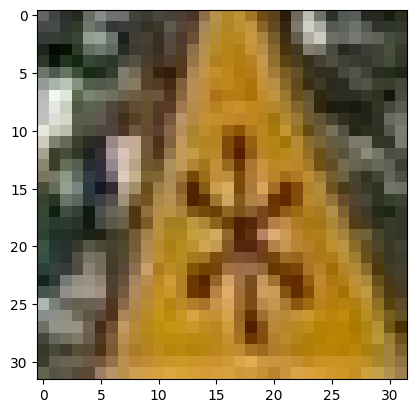

The traffic is: A-32 | Model predicted: A-17 | Class name: Dzieci


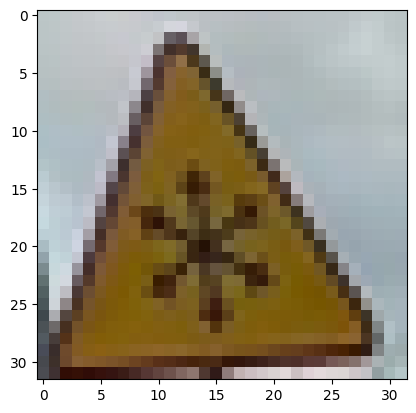

The traffic is: A-32 | Model predicted: A-32 | Class name: Oszronienie jezdni


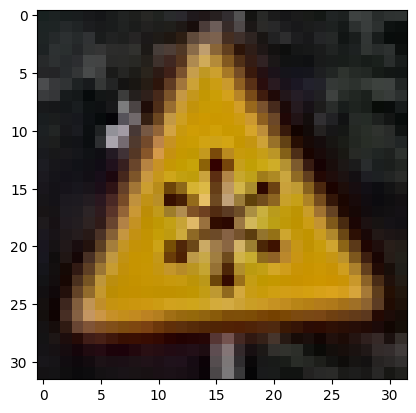

The traffic is: A-32 | Model predicted: A-32 | Class name: Oszronienie jezdni


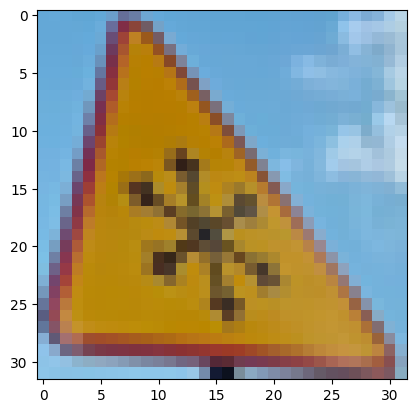

The traffic is: A-32 | Model predicted: A-32 | Class name: Oszronienie jezdni


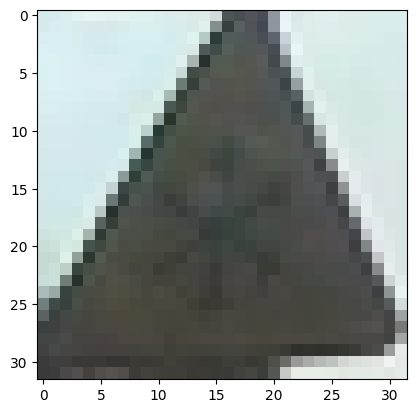

The traffic is: A-32 | Model predicted: A-6a | Class name: Skrzyżowanie z drogą podporządkowaną występującą po obu stronach


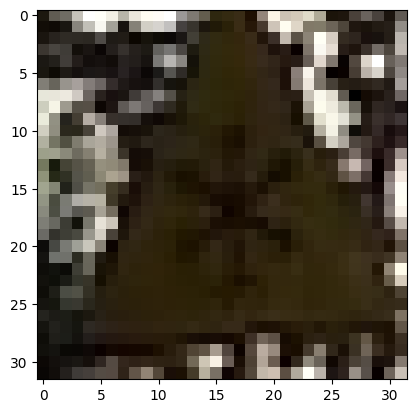

The traffic is: A-32 | Model predicted: A-32 | Class name: Oszronienie jezdni


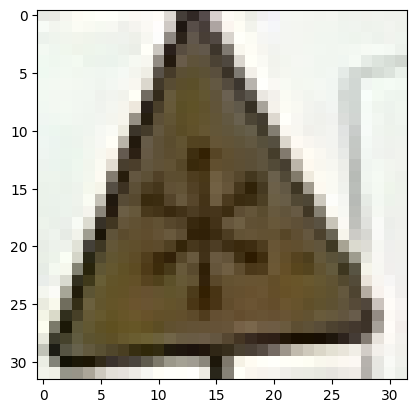

The traffic is: A-32 | Model predicted: A-32 | Class name: Oszronienie jezdni


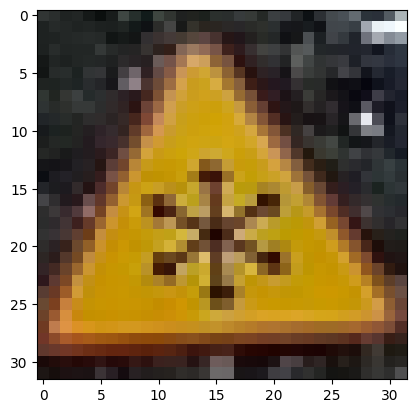

The traffic is: A-32 | Model predicted: A-32 | Class name: Oszronienie jezdni


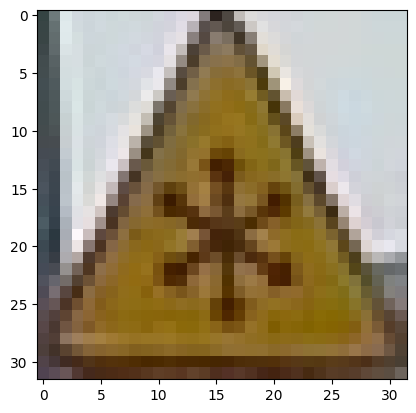

The traffic is: A-32 | Model predicted: A-32 | Class name: Oszronienie jezdni


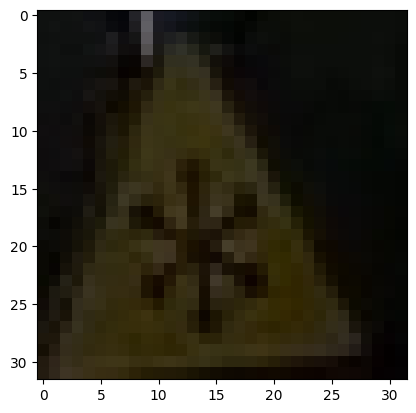

The traffic is: A-32 | Model predicted: A-32 | Class name: Oszronienie jezdni


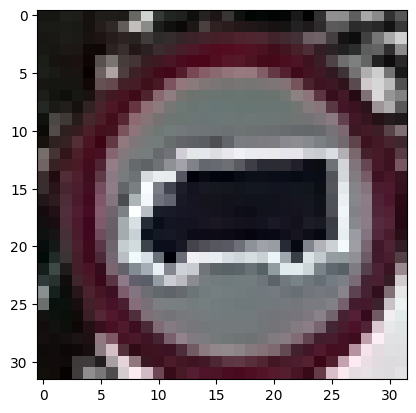

The traffic is: B-5 | Model predicted: B-43 | Class name: Strefa ograniczonej prędkości


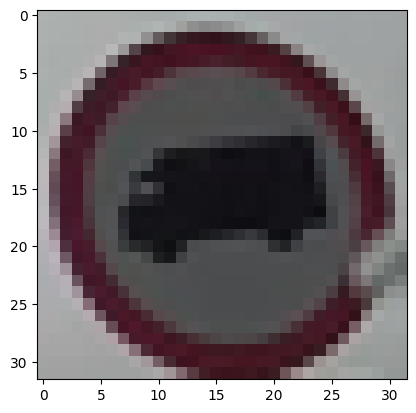

The traffic is: B-5 | Model predicted: B-5 | Class name: Zakaz wjazdu samochodów ciężarowych


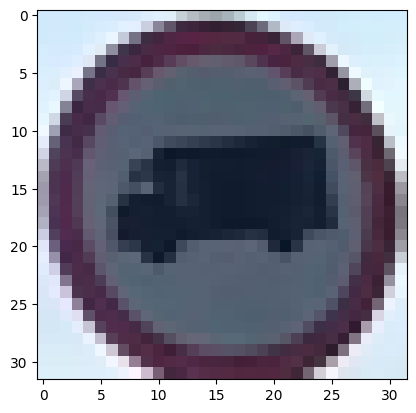

The traffic is: B-5 | Model predicted: B-5 | Class name: Zakaz wjazdu samochodów ciężarowych


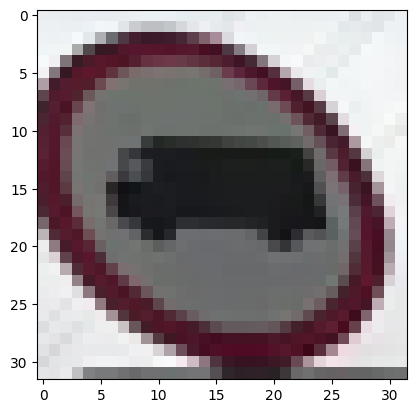

The traffic is: B-5 | Model predicted: B-5 | Class name: Zakaz wjazdu samochodów ciężarowych


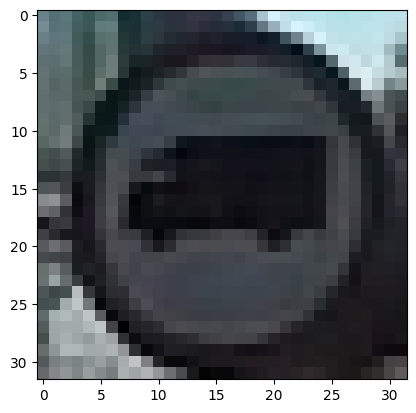

The traffic is: B-5 | Model predicted: B-5 | Class name: Zakaz wjazdu samochodów ciężarowych


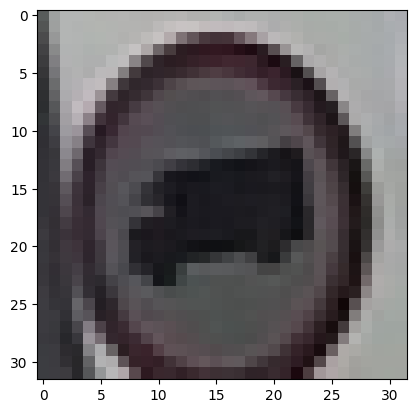

The traffic is: B-5 | Model predicted: B-5 | Class name: Zakaz wjazdu samochodów ciężarowych


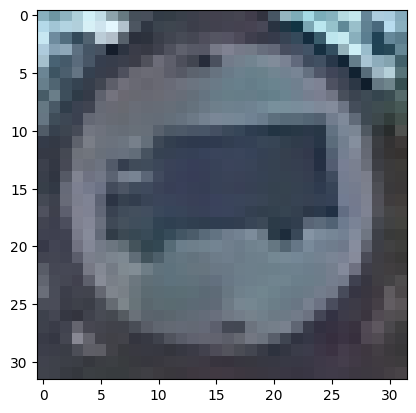

The traffic is: B-5 | Model predicted: D-26c | Class name: Toaleta publiczna


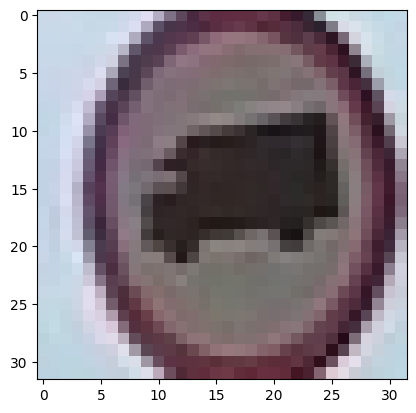

The traffic is: B-5 | Model predicted: B-5 | Class name: Zakaz wjazdu samochodów ciężarowych


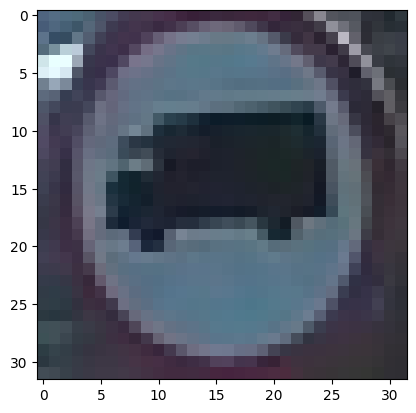

The traffic is: B-5 | Model predicted: D-26c | Class name: Toaleta publiczna


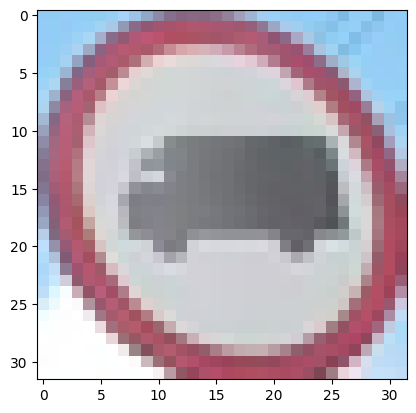

The traffic is: B-5 | Model predicted: B-5 | Class name: Zakaz wjazdu samochodów ciężarowych


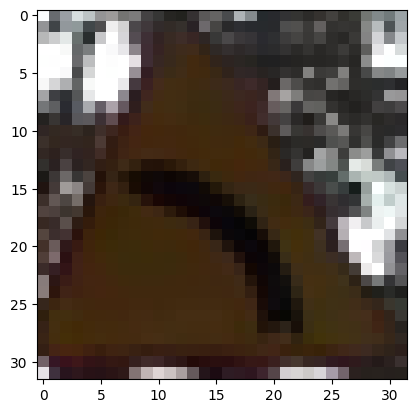

The traffic is: A-2 | Model predicted: A-2 | Class name: Niebezpieczny zakręt w lewo


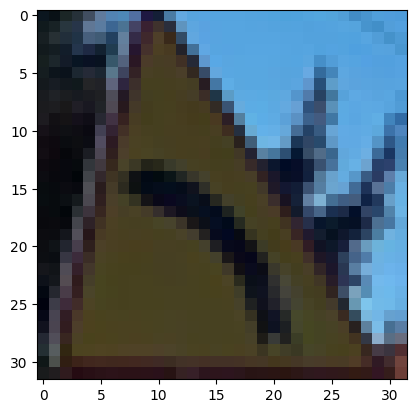

The traffic is: A-2 | Model predicted: A-2 | Class name: Niebezpieczny zakręt w lewo


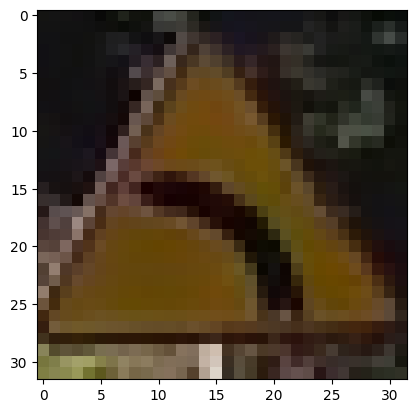

The traffic is: A-2 | Model predicted: A-2 | Class name: Niebezpieczny zakręt w lewo


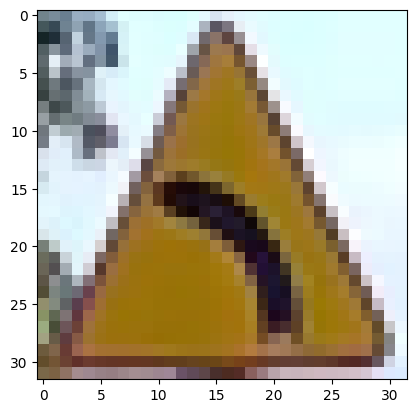

The traffic is: A-2 | Model predicted: A-2 | Class name: Niebezpieczny zakręt w lewo


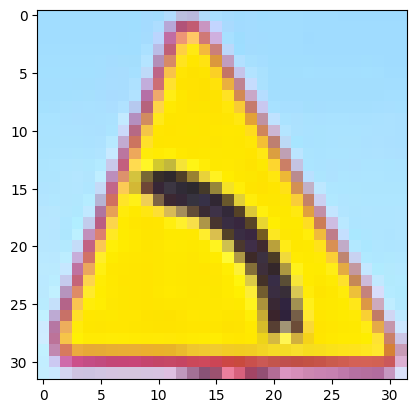

The traffic is: A-2 | Model predicted: A-2 | Class name: Niebezpieczny zakręt w lewo


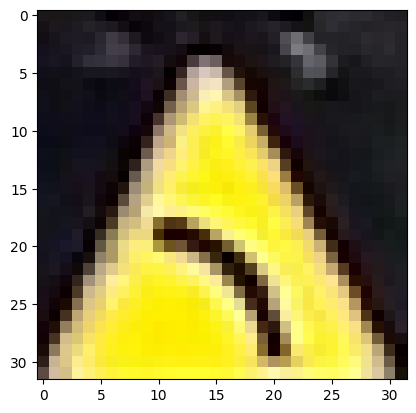

The traffic is: A-2 | Model predicted: A-32 | Class name: Oszronienie jezdni


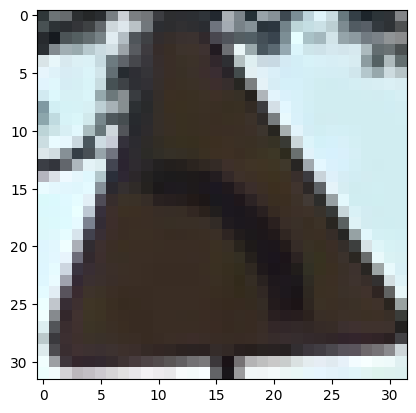

The traffic is: A-2 | Model predicted: B-43 | Class name: Strefa ograniczonej prędkości


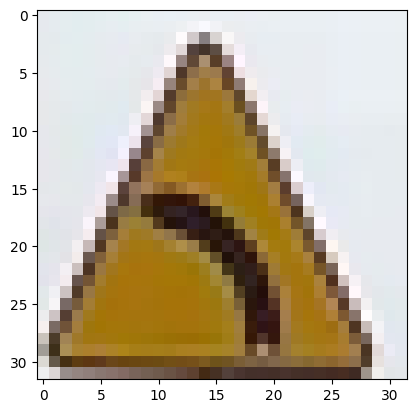

The traffic is: A-2 | Model predicted: A-2 | Class name: Niebezpieczny zakręt w lewo


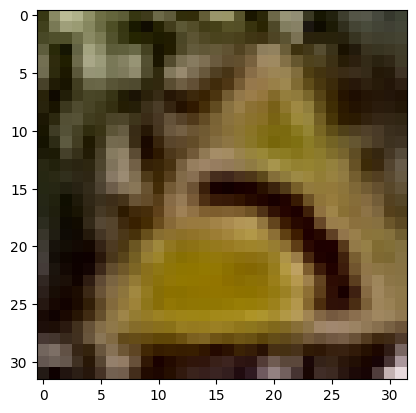

The traffic is: A-2 | Model predicted: A-2 | Class name: Niebezpieczny zakręt w lewo


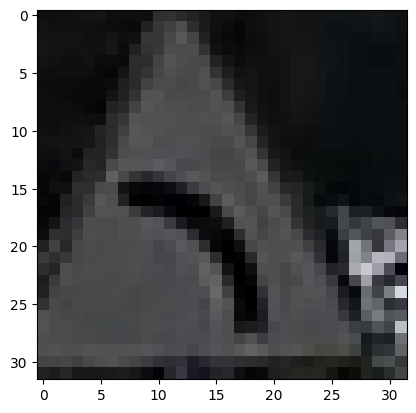

The traffic is: A-2 | Model predicted: A-2 | Class name: Niebezpieczny zakręt w lewo


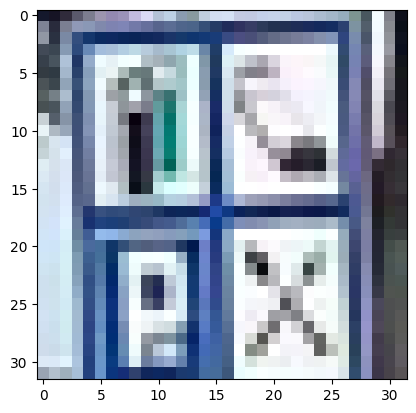

The traffic is: D-tablica | Model predicted: B-33 | Class name: Ograniczenie prędkości


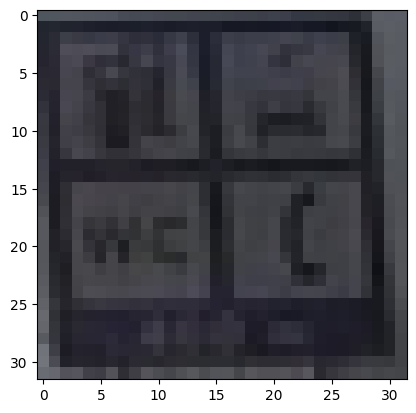

The traffic is: D-tablica | Model predicted: D-tablica | Class name: Zbiorcza tablica informacyjna


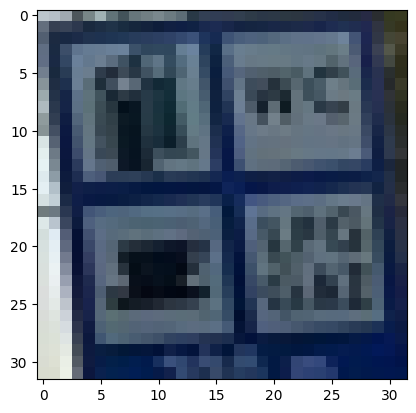

The traffic is: D-tablica | Model predicted: D-tablica | Class name: Zbiorcza tablica informacyjna


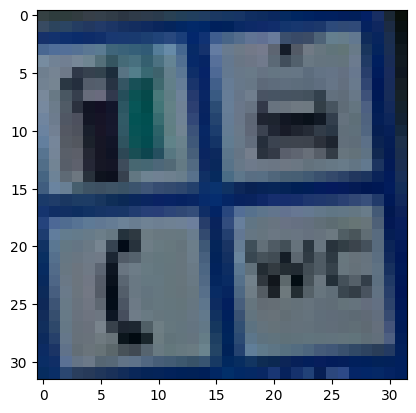

The traffic is: D-tablica | Model predicted: D-tablica | Class name: Zbiorcza tablica informacyjna


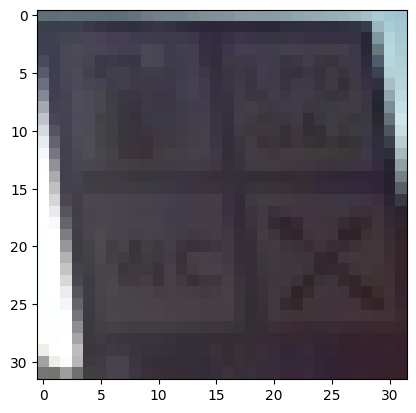

The traffic is: D-tablica | Model predicted: B-33 | Class name: Ograniczenie prędkości


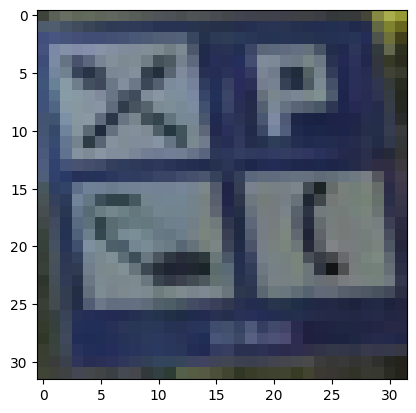

The traffic is: D-tablica | Model predicted: D-tablica | Class name: Zbiorcza tablica informacyjna


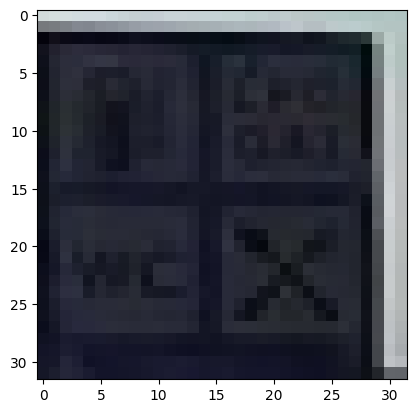

The traffic is: D-tablica | Model predicted: B-33 | Class name: Ograniczenie prędkości


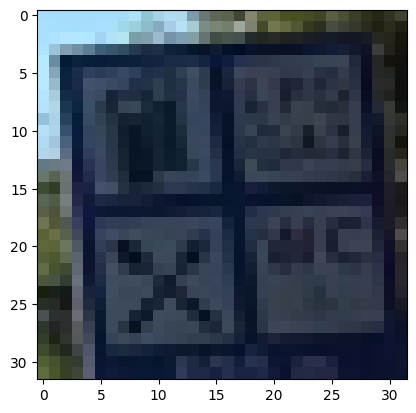

The traffic is: D-tablica | Model predicted: D-tablica | Class name: Zbiorcza tablica informacyjna


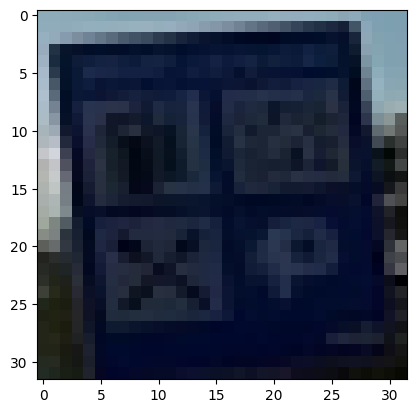

The traffic is: D-tablica | Model predicted: D-tablica | Class name: Zbiorcza tablica informacyjna


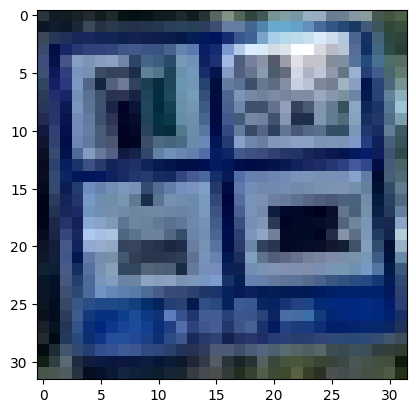

The traffic is: D-tablica | Model predicted: B-33 | Class name: Ograniczenie prędkości


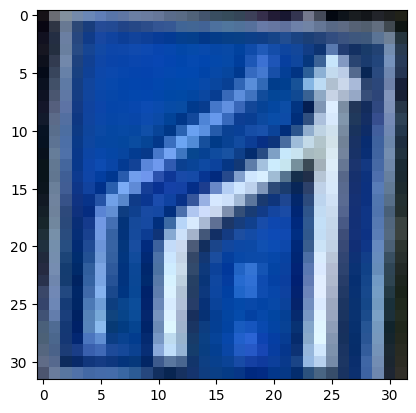

The traffic is: D-14 | Model predicted: D-14 | Class name: Koniec pasa ruchu


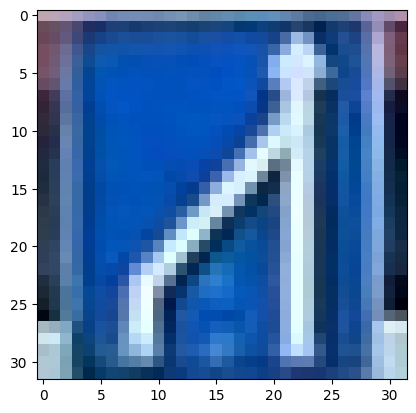

The traffic is: D-14 | Model predicted: D-14 | Class name: Koniec pasa ruchu


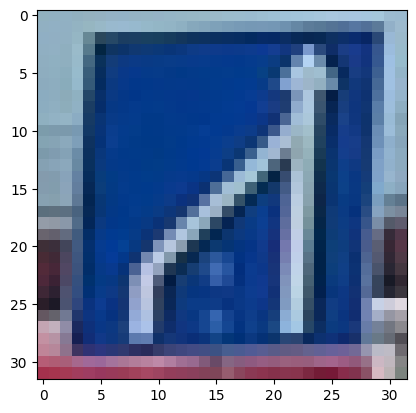

The traffic is: D-14 | Model predicted: D-14 | Class name: Koniec pasa ruchu


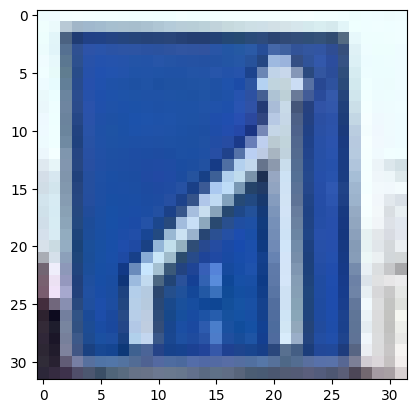

The traffic is: D-14 | Model predicted: D-14 | Class name: Koniec pasa ruchu


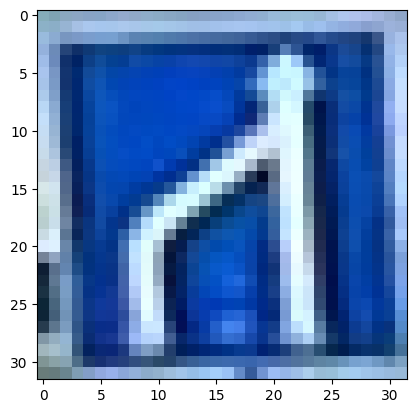

The traffic is: D-14 | Model predicted: D-14 | Class name: Koniec pasa ruchu


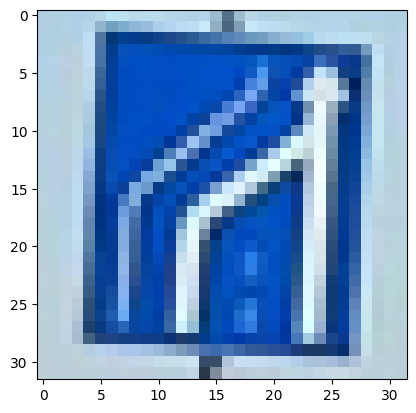

The traffic is: D-14 | Model predicted: D-14 | Class name: Koniec pasa ruchu


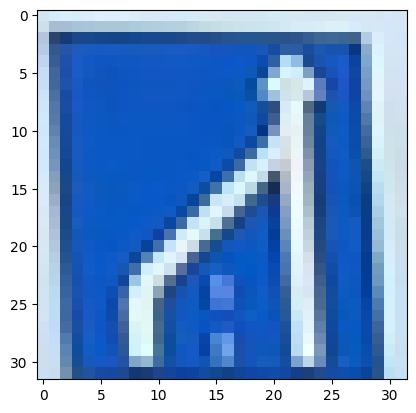

The traffic is: D-14 | Model predicted: D-14 | Class name: Koniec pasa ruchu


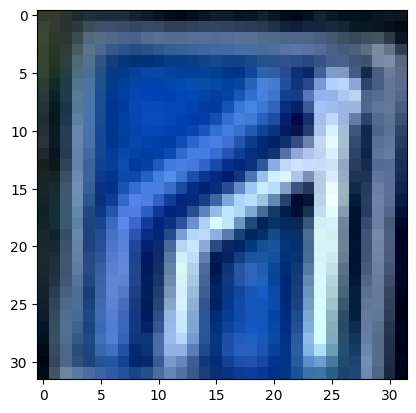

The traffic is: D-14 | Model predicted: D-14 | Class name: Koniec pasa ruchu


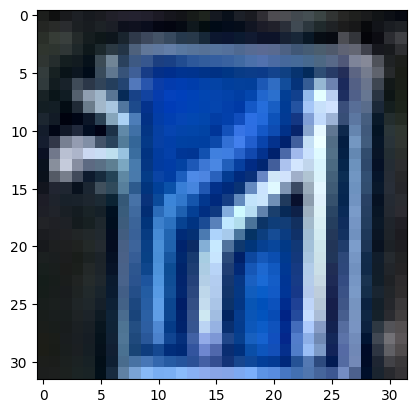

The traffic is: D-14 | Model predicted: D-14 | Class name: Koniec pasa ruchu


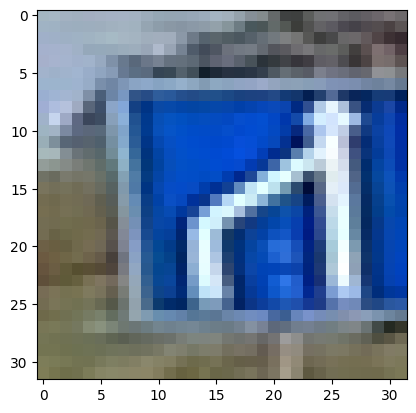

The traffic is: D-14 | Model predicted: D-14 | Class name: Koniec pasa ruchu


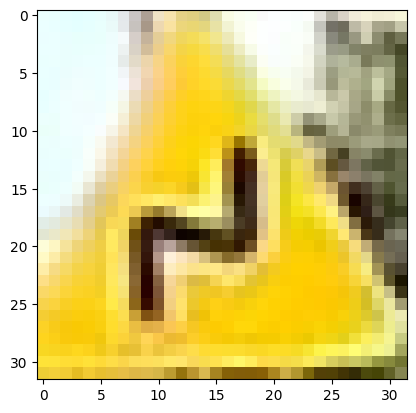

The traffic is: A-3 | Model predicted: A-17 | Class name: Dzieci


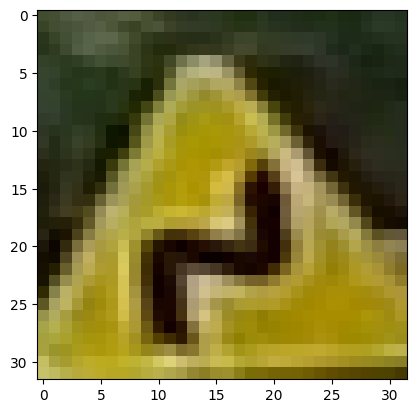

The traffic is: A-3 | Model predicted: A-17 | Class name: Dzieci


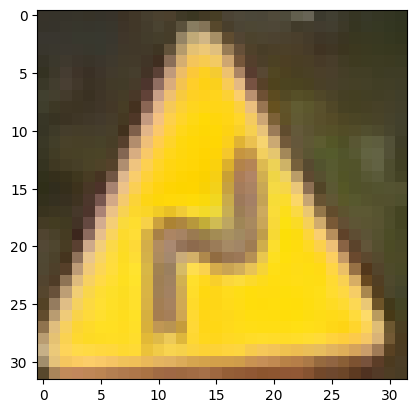

The traffic is: A-3 | Model predicted: A-17 | Class name: Dzieci


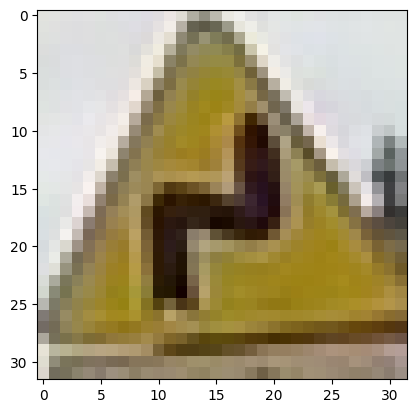

The traffic is: A-3 | Model predicted: A-3 | Class name: Niebezpieczne zakręty, pierwszy w prawo


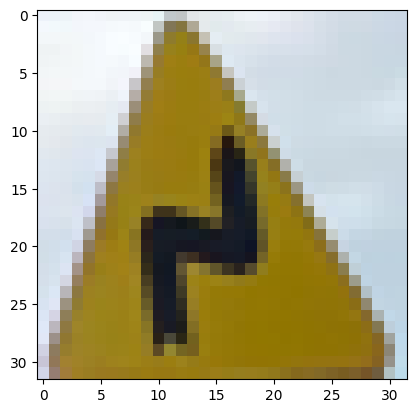

The traffic is: A-3 | Model predicted: A-17 | Class name: Dzieci


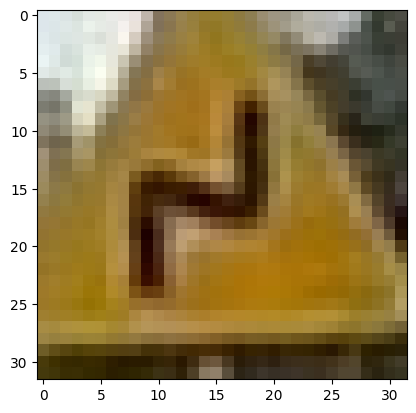

The traffic is: A-3 | Model predicted: A-17 | Class name: Dzieci


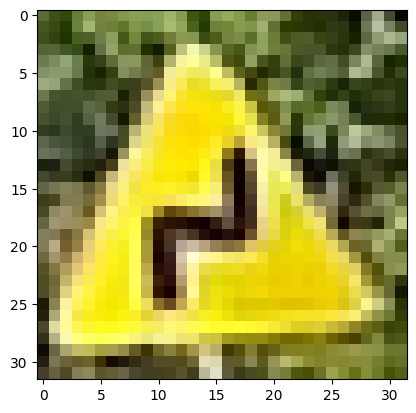

The traffic is: A-3 | Model predicted: A-17 | Class name: Dzieci


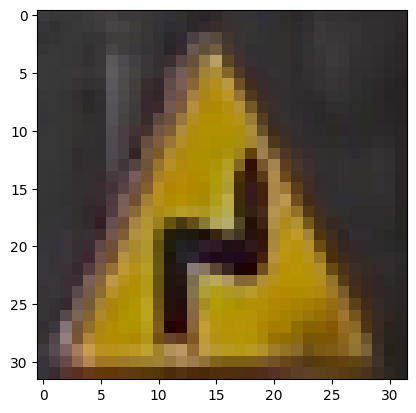

The traffic is: A-3 | Model predicted: A-3 | Class name: Niebezpieczne zakręty, pierwszy w prawo


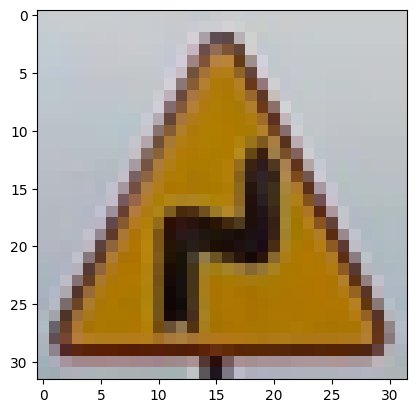

The traffic is: A-3 | Model predicted: A-3 | Class name: Niebezpieczne zakręty, pierwszy w prawo


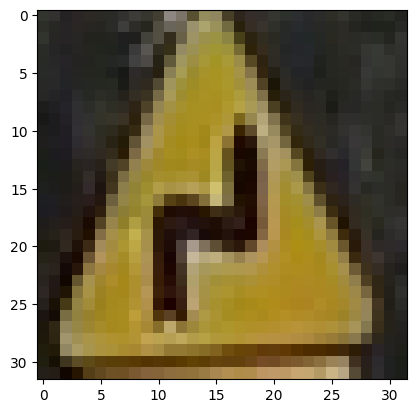

The traffic is: A-3 | Model predicted: A-17 | Class name: Dzieci


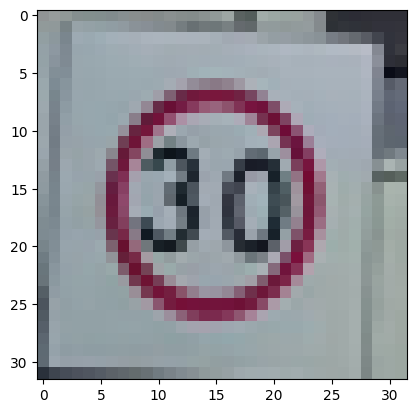

The traffic is: B-43 | Model predicted: B-43 | Class name: Strefa ograniczonej prędkości


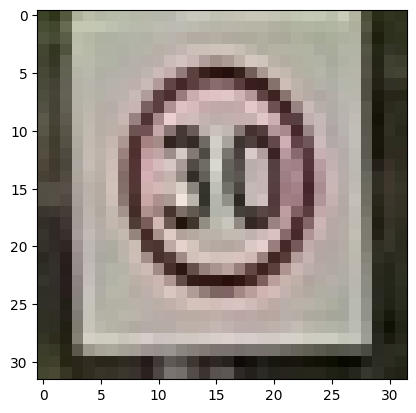

The traffic is: B-43 | Model predicted: B-43 | Class name: Strefa ograniczonej prędkości


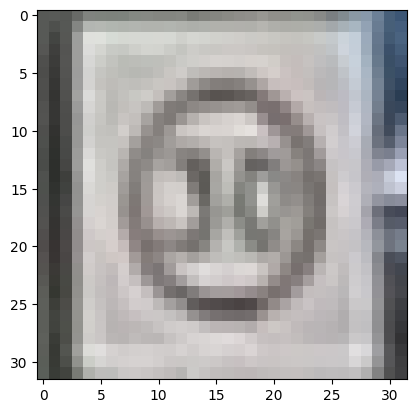

The traffic is: B-43 | Model predicted: B-43 | Class name: Strefa ograniczonej prędkości


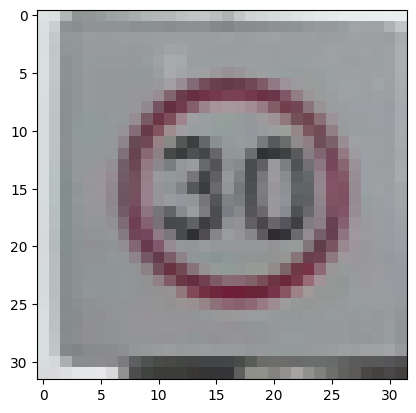

The traffic is: B-43 | Model predicted: B-43 | Class name: Strefa ograniczonej prędkości


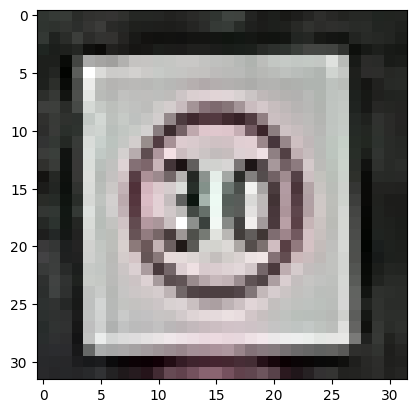

The traffic is: B-43 | Model predicted: B-43 | Class name: Strefa ograniczonej prędkości


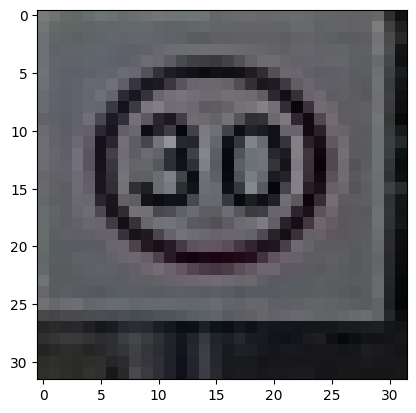

The traffic is: B-43 | Model predicted: B-33 | Class name: Ograniczenie prędkości


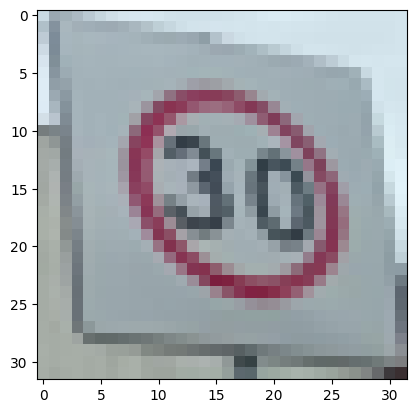

The traffic is: B-43 | Model predicted: B-43 | Class name: Strefa ograniczonej prędkości


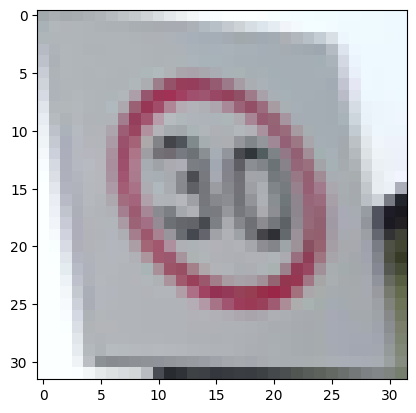

The traffic is: B-43 | Model predicted: B-43 | Class name: Strefa ograniczonej prędkości


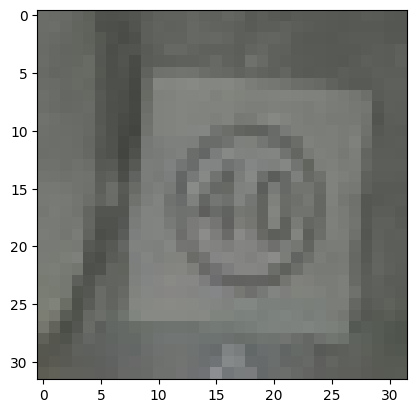

The traffic is: B-43 | Model predicted: B-43 | Class name: Strefa ograniczonej prędkości


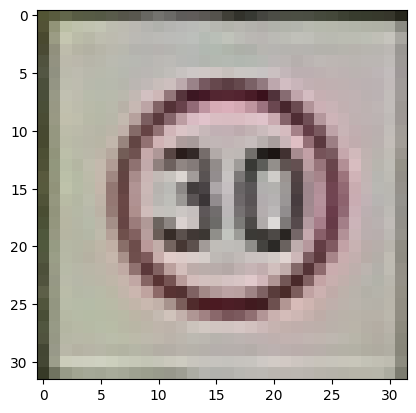

The traffic is: B-43 | Model predicted: B-43 | Class name: Strefa ograniczonej prędkości


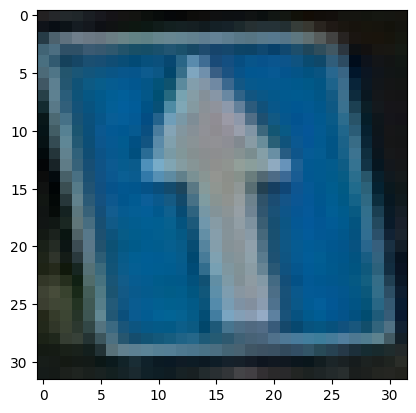

The traffic is: D-3 | Model predicted: D-3 | Class name: Droga jednokierunkowa


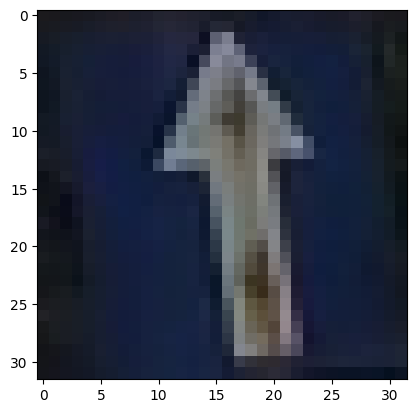

The traffic is: D-3 | Model predicted: C-5 | Class name: Nakaz jazdy prosto


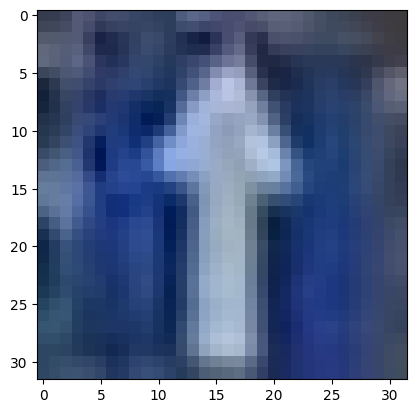

The traffic is: D-3 | Model predicted: C-5 | Class name: Nakaz jazdy prosto


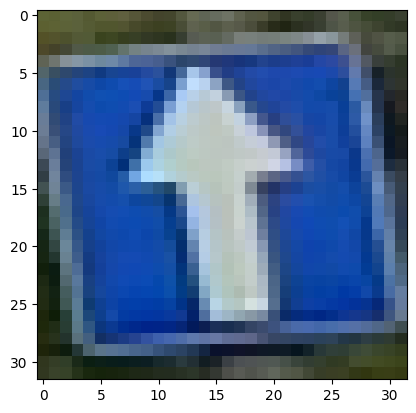

The traffic is: D-3 | Model predicted: D-3 | Class name: Droga jednokierunkowa


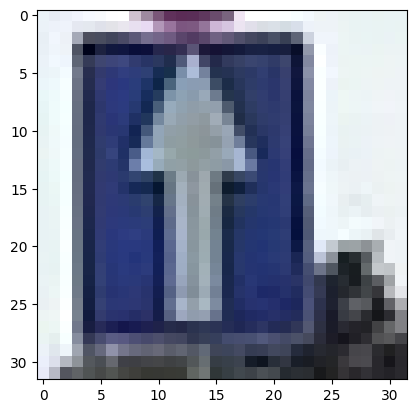

The traffic is: D-3 | Model predicted: D-3 | Class name: Droga jednokierunkowa


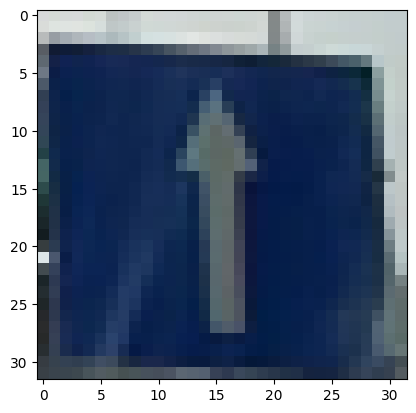

The traffic is: D-3 | Model predicted: D-3 | Class name: Droga jednokierunkowa


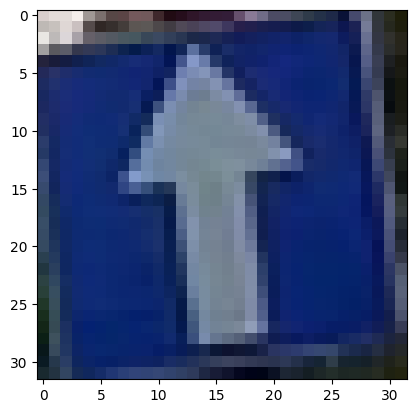

The traffic is: D-3 | Model predicted: D-3 | Class name: Droga jednokierunkowa


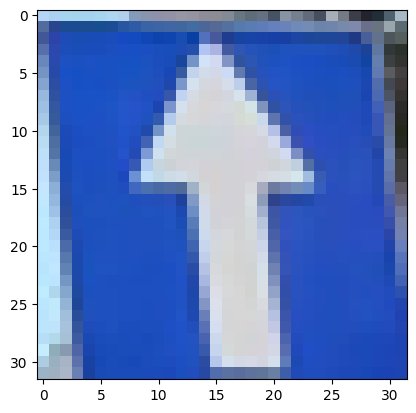

The traffic is: D-3 | Model predicted: D-3 | Class name: Droga jednokierunkowa


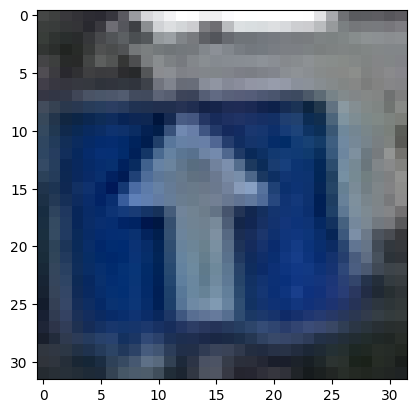

The traffic is: D-3 | Model predicted: D-3 | Class name: Droga jednokierunkowa


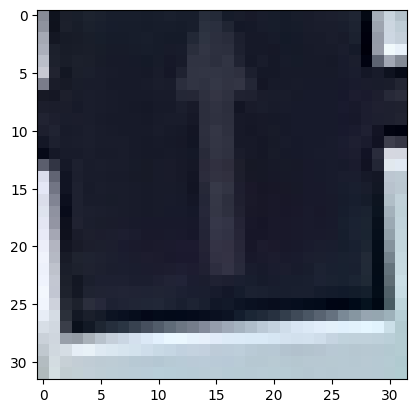

The traffic is: D-3 | Model predicted: B-33 | Class name: Ograniczenie prędkości


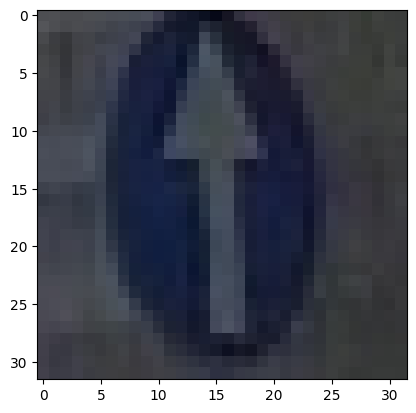

The traffic is: C-5 | Model predicted: C-5 | Class name: Nakaz jazdy prosto


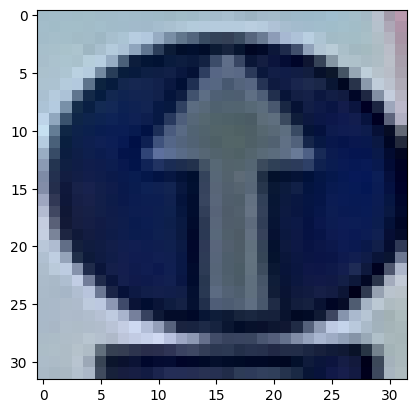

The traffic is: C-5 | Model predicted: C-5 | Class name: Nakaz jazdy prosto


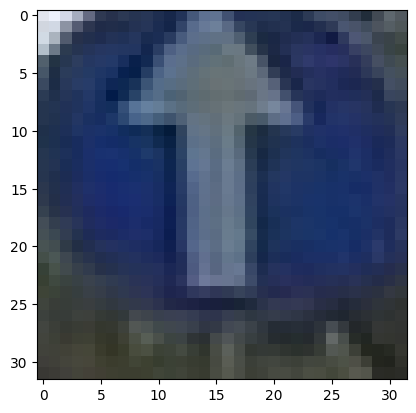

The traffic is: C-5 | Model predicted: C-5 | Class name: Nakaz jazdy prosto


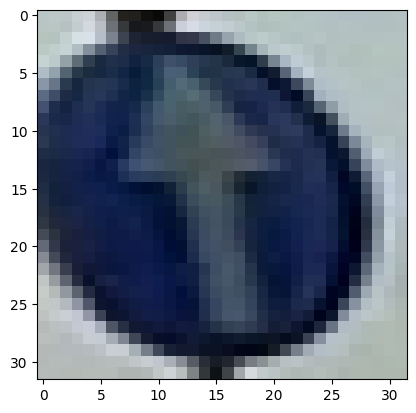

The traffic is: C-5 | Model predicted: C-5 | Class name: Nakaz jazdy prosto


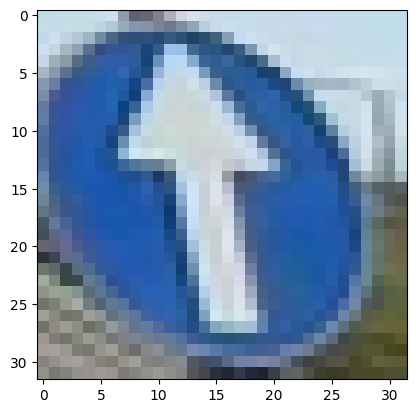

The traffic is: C-5 | Model predicted: C-5 | Class name: Nakaz jazdy prosto


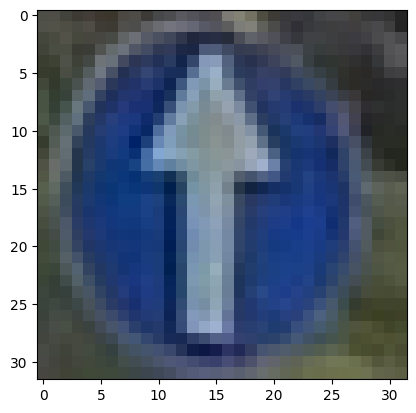

The traffic is: C-5 | Model predicted: C-5 | Class name: Nakaz jazdy prosto


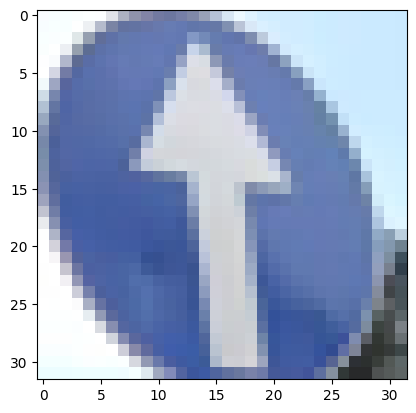

The traffic is: C-5 | Model predicted: C-5 | Class name: Nakaz jazdy prosto


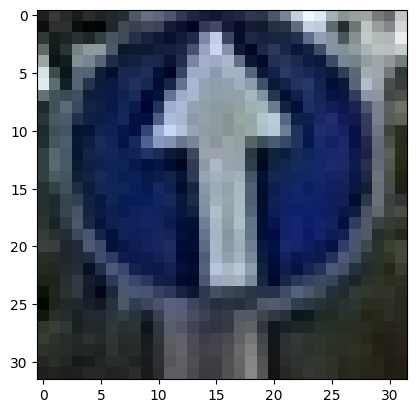

The traffic is: C-5 | Model predicted: C-5 | Class name: Nakaz jazdy prosto


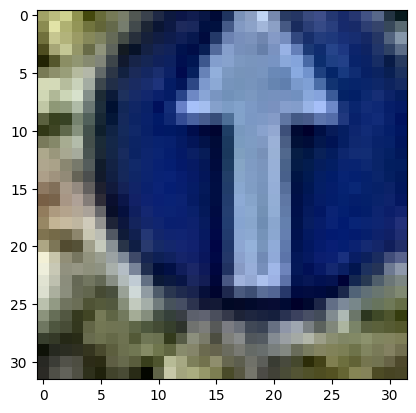

The traffic is: C-5 | Model predicted: B-33 | Class name: Ograniczenie prędkości


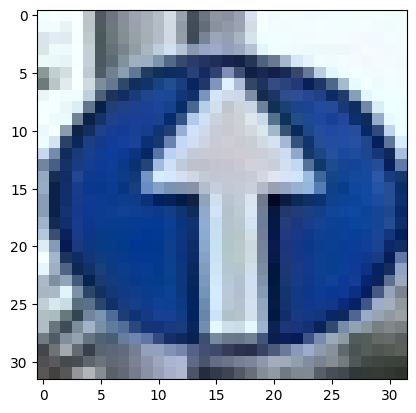

The traffic is: C-5 | Model predicted: C-5 | Class name: Nakaz jazdy prosto


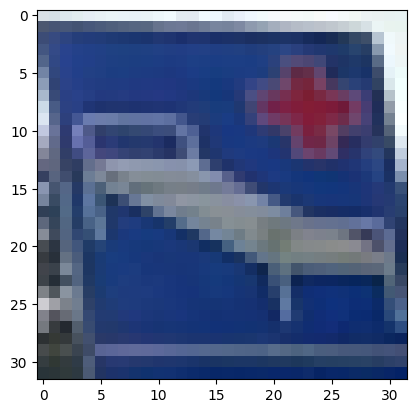

The traffic is: D-21 | Model predicted: B-36 | Class name: Zakaz zatrzymywania się


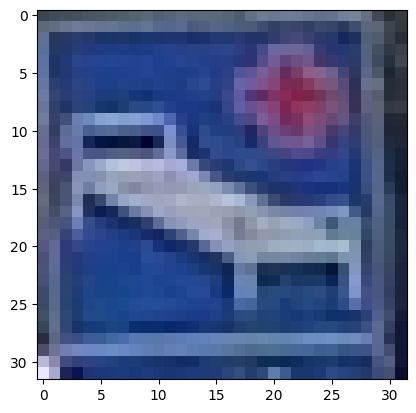

The traffic is: D-21 | Model predicted: D-23a | Class name: Stacja paliwowa tylko z gazem do napędu pojazdów


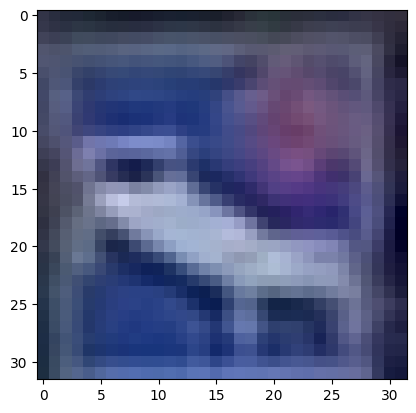

The traffic is: D-21 | Model predicted: B-33 | Class name: Ograniczenie prędkości


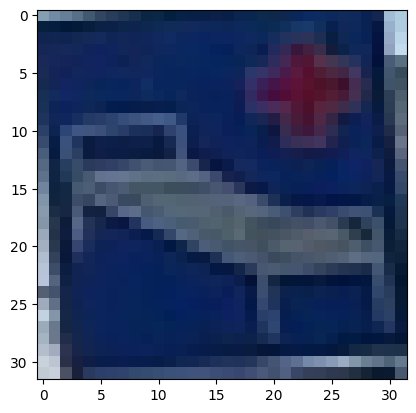

The traffic is: D-21 | Model predicted: D-23a | Class name: Stacja paliwowa tylko z gazem do napędu pojazdów


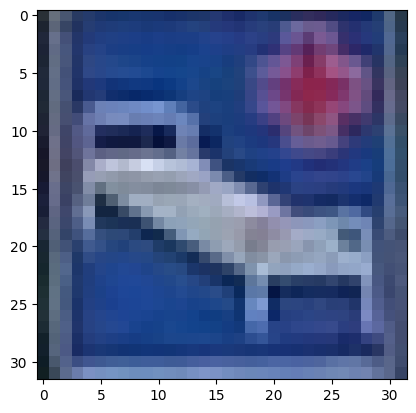

The traffic is: D-21 | Model predicted: D-6 | Class name: Przejście dla pieszych


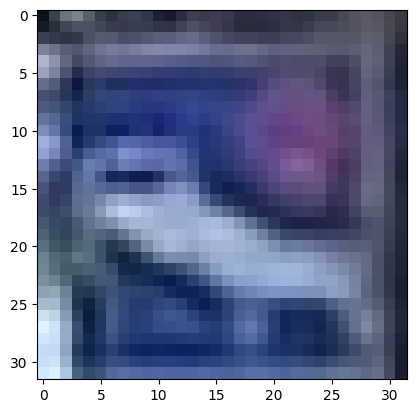

The traffic is: D-21 | Model predicted: B-33 | Class name: Ograniczenie prędkości


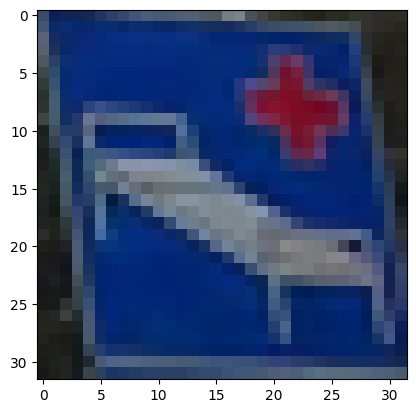

The traffic is: D-21 | Model predicted: B-36 | Class name: Zakaz zatrzymywania się


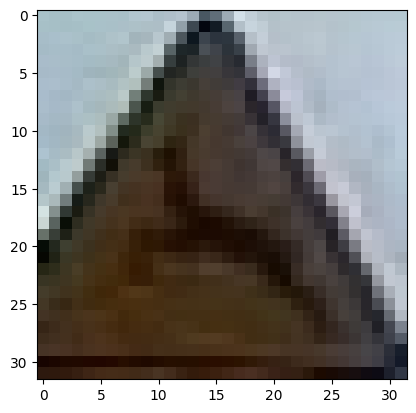

The traffic is: A-18b | Model predicted: A-18b | Class name: Zwierzęta dzikie


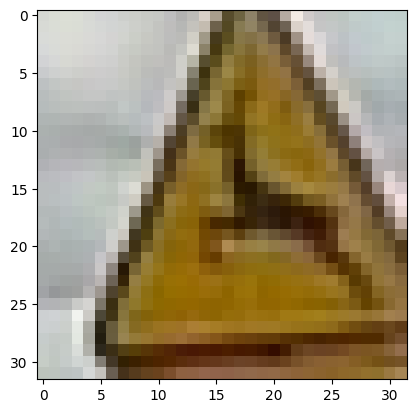

The traffic is: A-18b | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


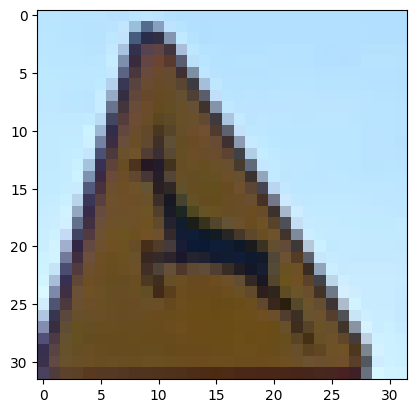

The traffic is: A-18b | Model predicted: A-17 | Class name: Dzieci


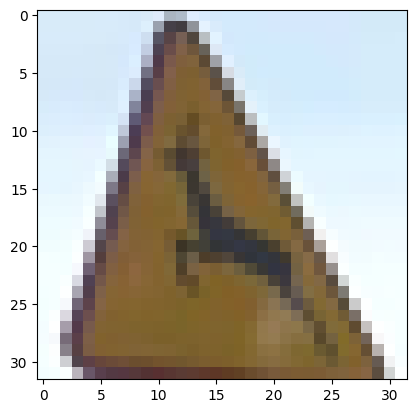

The traffic is: A-18b | Model predicted: A-18b | Class name: Zwierzęta dzikie


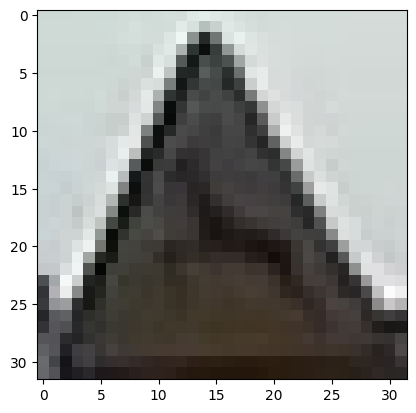

The traffic is: A-18b | Model predicted: A-18b | Class name: Zwierzęta dzikie


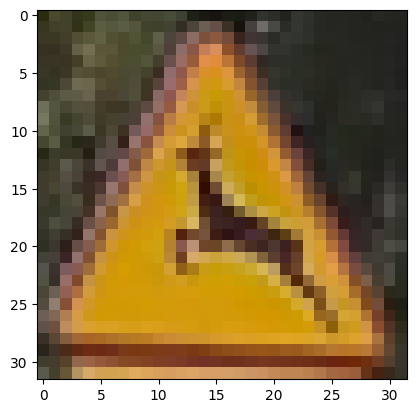

The traffic is: A-18b | Model predicted: A-18b | Class name: Zwierzęta dzikie


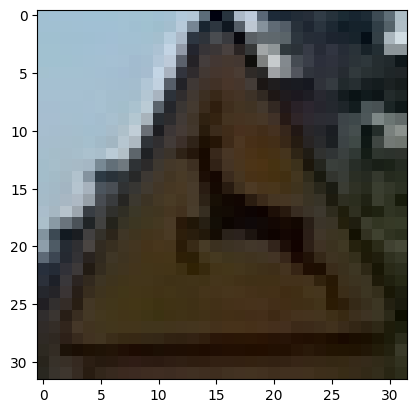

The traffic is: A-18b | Model predicted: A-18b | Class name: Zwierzęta dzikie


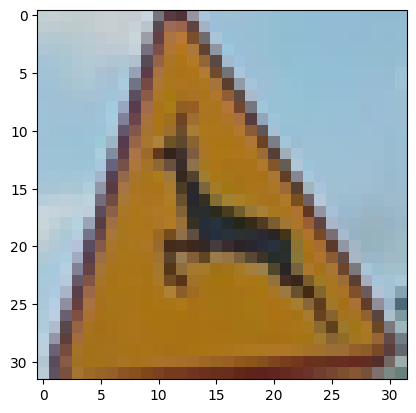

The traffic is: A-18b | Model predicted: A-18b | Class name: Zwierzęta dzikie


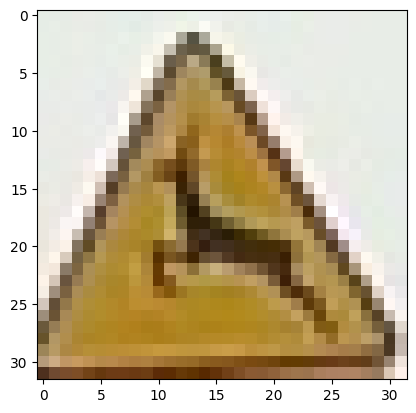

The traffic is: A-18b | Model predicted: A-18b | Class name: Zwierzęta dzikie


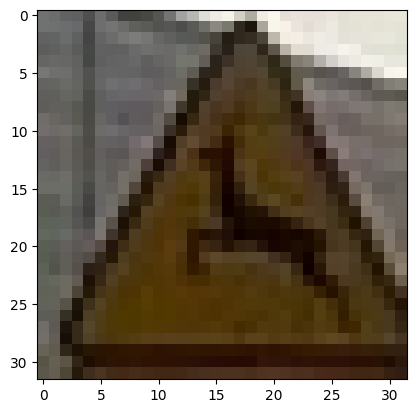

The traffic is: A-18b | Model predicted: A-18b | Class name: Zwierzęta dzikie


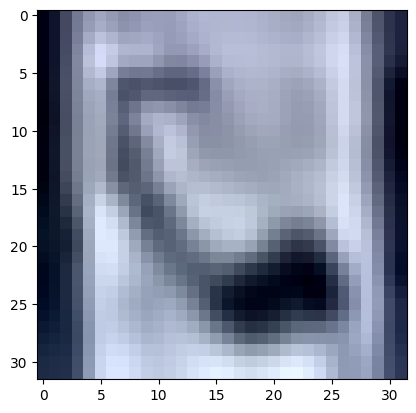

The traffic is: D-29 | Model predicted: B-33 | Class name: Ograniczenie prędkości


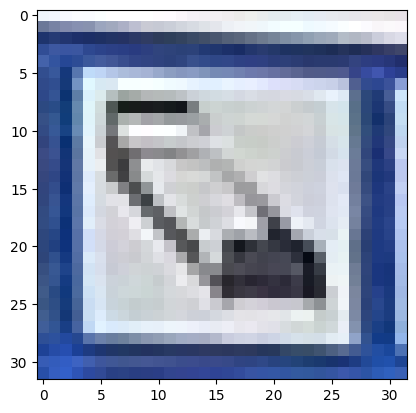

The traffic is: D-29 | Model predicted: D-29 | Class name: Hotel (motel)


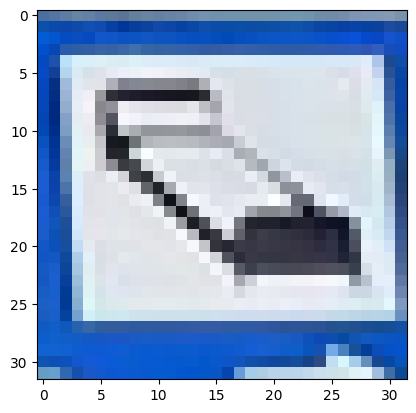

The traffic is: D-29 | Model predicted: B-33 | Class name: Ograniczenie prędkości


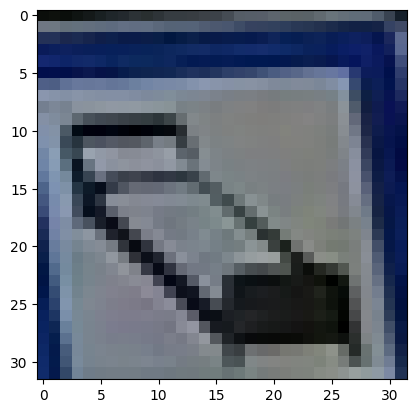

The traffic is: D-29 | Model predicted: B-33 | Class name: Ograniczenie prędkości


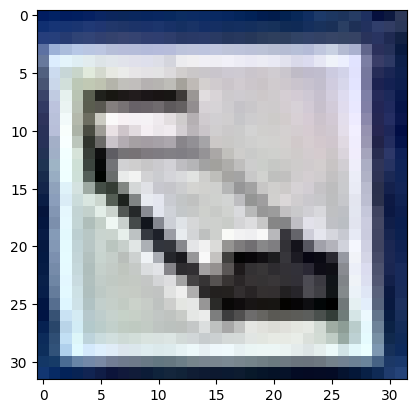

The traffic is: D-29 | Model predicted: B-33 | Class name: Ograniczenie prędkości


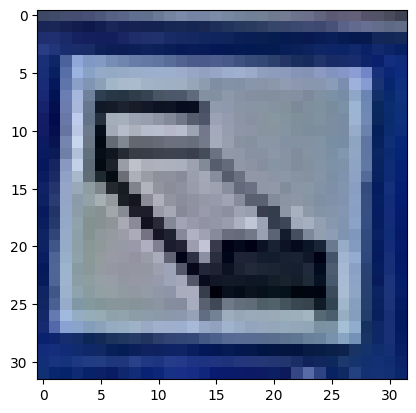

The traffic is: D-29 | Model predicted: D-29 | Class name: Hotel (motel)


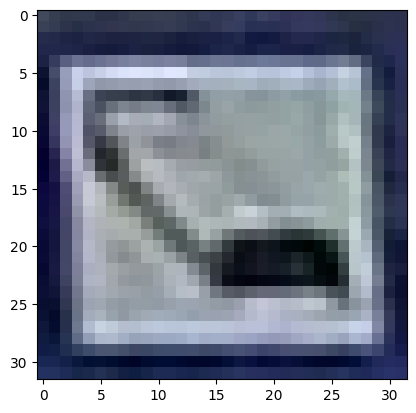

The traffic is: D-29 | Model predicted: D-29 | Class name: Hotel (motel)


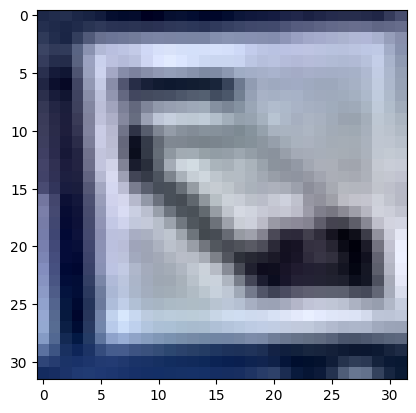

The traffic is: D-29 | Model predicted: D-29 | Class name: Hotel (motel)


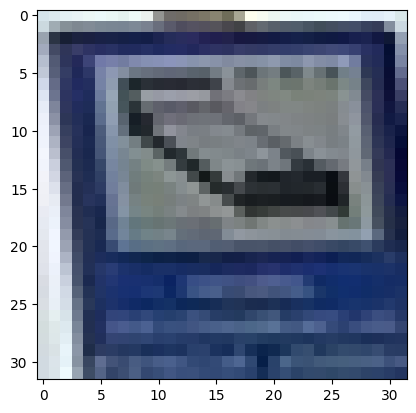

The traffic is: D-29 | Model predicted: D-23a | Class name: Stacja paliwowa tylko z gazem do napędu pojazdów


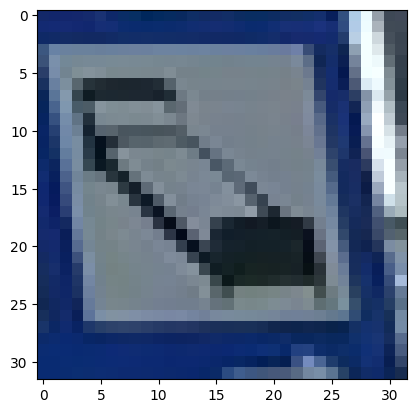

The traffic is: D-29 | Model predicted: D-29 | Class name: Hotel (motel)


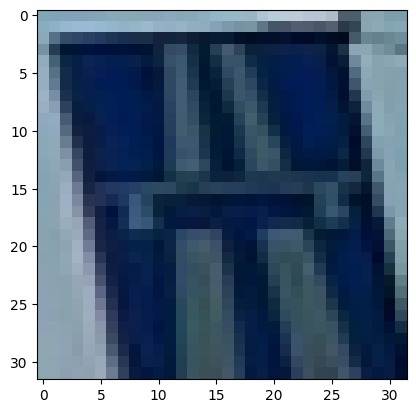

The traffic is: D-9 | Model predicted: D-9 | Class name: Autostrada


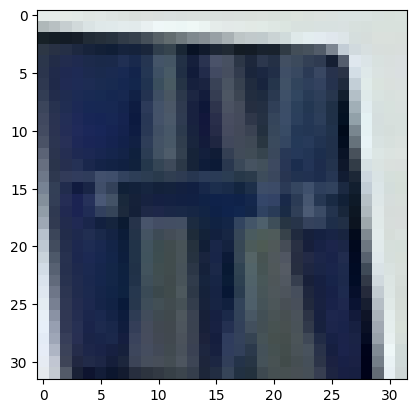

The traffic is: D-9 | Model predicted: D-18 | Class name: Parking


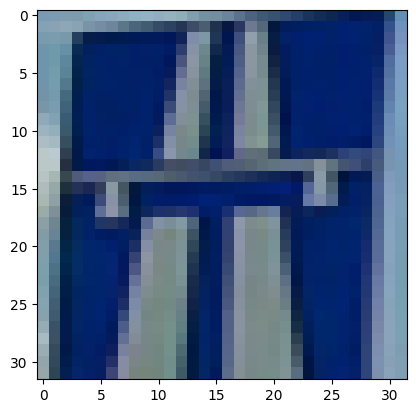

The traffic is: D-9 | Model predicted: D-9 | Class name: Autostrada


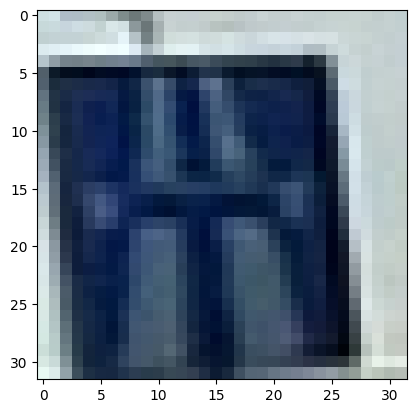

The traffic is: D-9 | Model predicted: D-18 | Class name: Parking


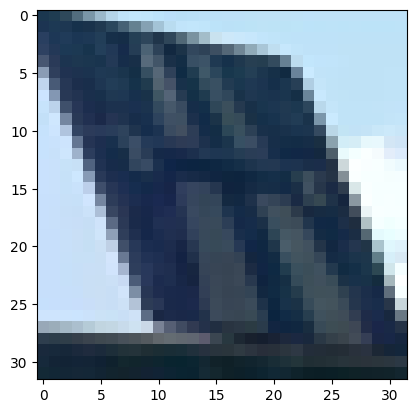

The traffic is: D-9 | Model predicted: B-33 | Class name: Ograniczenie prędkości


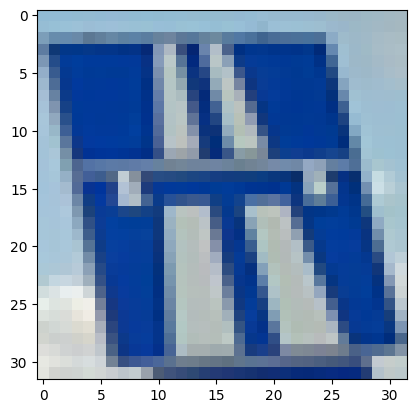

The traffic is: D-9 | Model predicted: B-33 | Class name: Ograniczenie prędkości


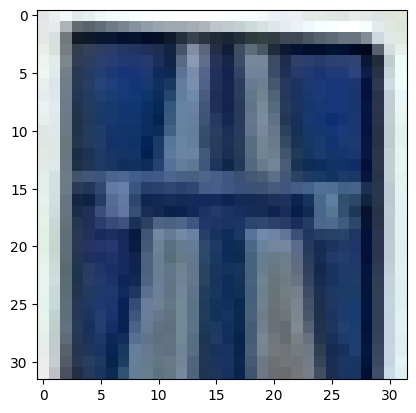

The traffic is: D-9 | Model predicted: D-9 | Class name: Autostrada


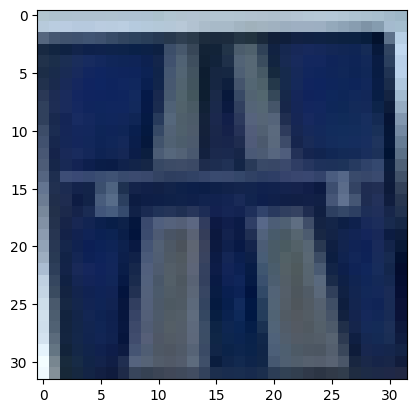

The traffic is: D-9 | Model predicted: D-9 | Class name: Autostrada


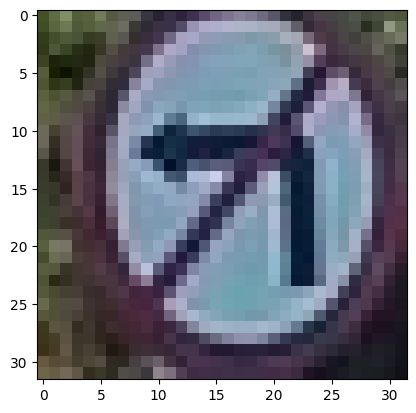

The traffic is: B-21 | Model predicted: B-33 | Class name: Ograniczenie prędkości


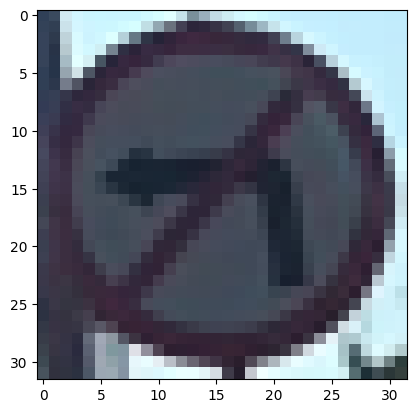

The traffic is: B-21 | Model predicted: B-21 | Class name: Zakaz skręcania w lewo


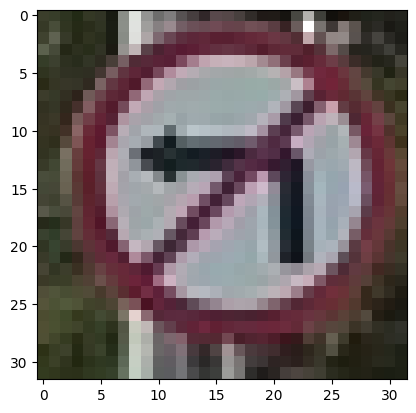

The traffic is: B-21 | Model predicted: B-33 | Class name: Ograniczenie prędkości


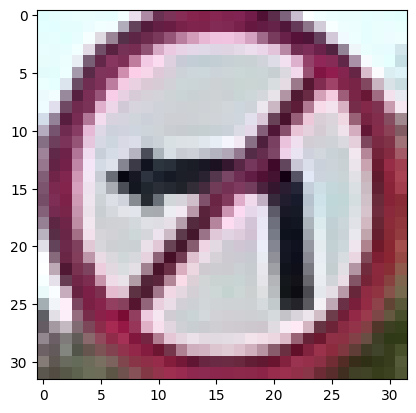

The traffic is: B-21 | Model predicted: B-21 | Class name: Zakaz skręcania w lewo


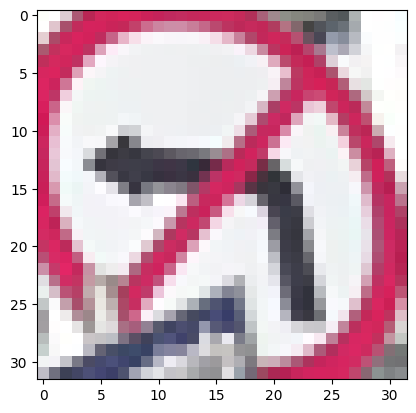

The traffic is: B-21 | Model predicted: B-21 | Class name: Zakaz skręcania w lewo


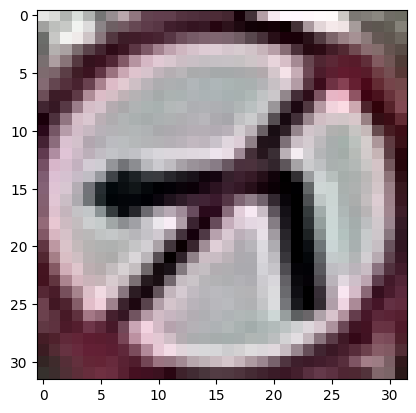

The traffic is: B-21 | Model predicted: B-21 | Class name: Zakaz skręcania w lewo


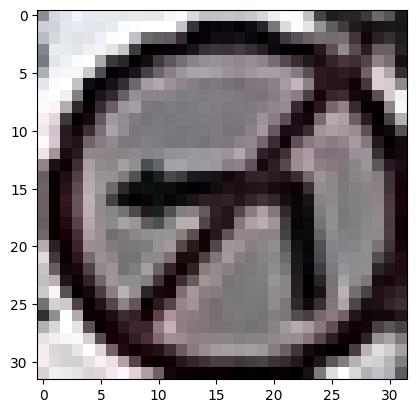

The traffic is: B-21 | Model predicted: B-21 | Class name: Zakaz skręcania w lewo


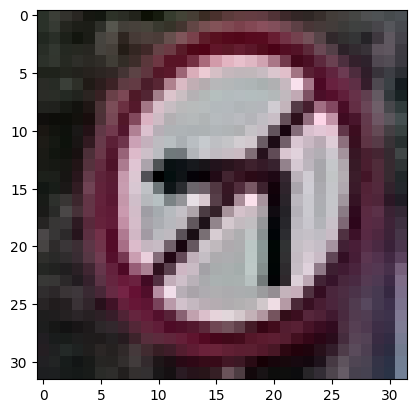

The traffic is: B-21 | Model predicted: B-21 | Class name: Zakaz skręcania w lewo


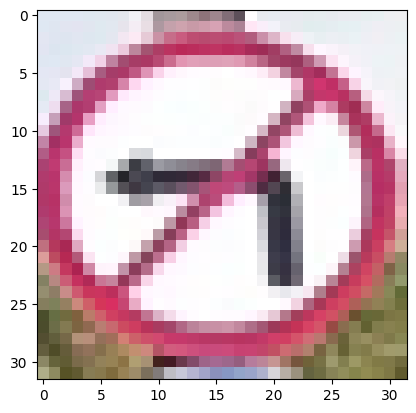

The traffic is: B-21 | Model predicted: B-21 | Class name: Zakaz skręcania w lewo


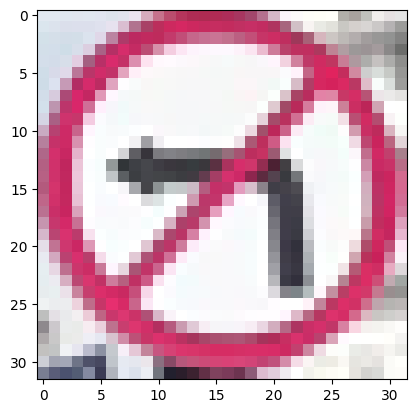

The traffic is: B-21 | Model predicted: B-21 | Class name: Zakaz skręcania w lewo


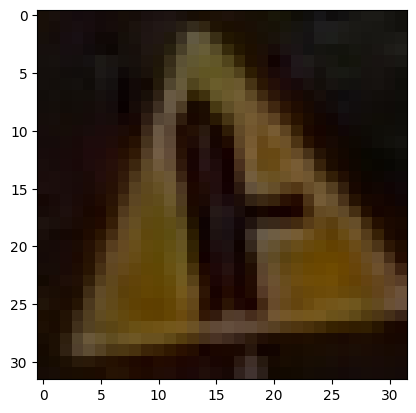

The traffic is: A-6b | Model predicted: A-6b | Class name: Skrzyżowanie z drogą podporządkowaną występującą po prawej stronie


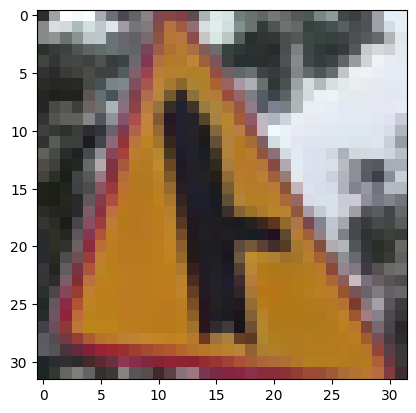

The traffic is: A-6b | Model predicted: A-6b | Class name: Skrzyżowanie z drogą podporządkowaną występującą po prawej stronie


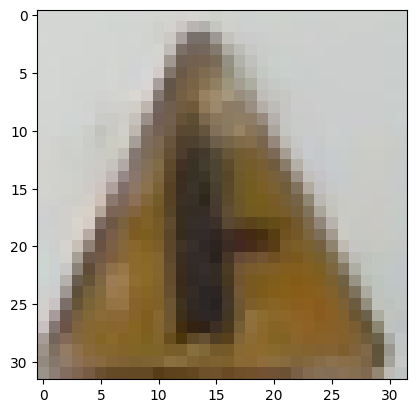

The traffic is: A-6b | Model predicted: A-6b | Class name: Skrzyżowanie z drogą podporządkowaną występującą po prawej stronie


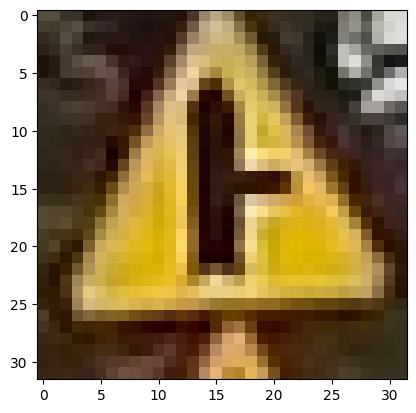

The traffic is: A-6b | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


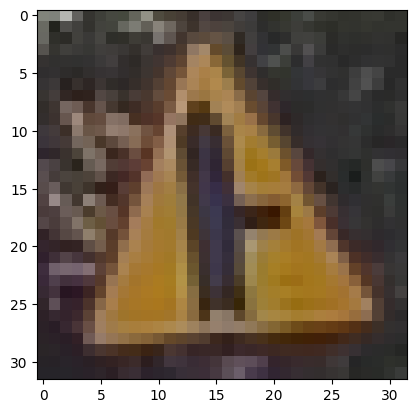

The traffic is: A-6b | Model predicted: A-6b | Class name: Skrzyżowanie z drogą podporządkowaną występującą po prawej stronie


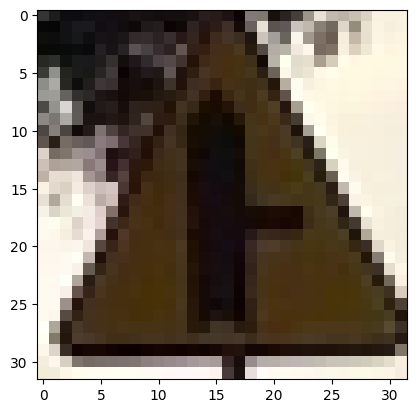

The traffic is: A-6b | Model predicted: A-6b | Class name: Skrzyżowanie z drogą podporządkowaną występującą po prawej stronie


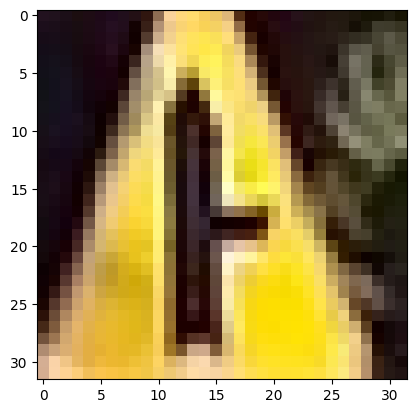

The traffic is: A-6b | Model predicted: A-6b | Class name: Skrzyżowanie z drogą podporządkowaną występującą po prawej stronie


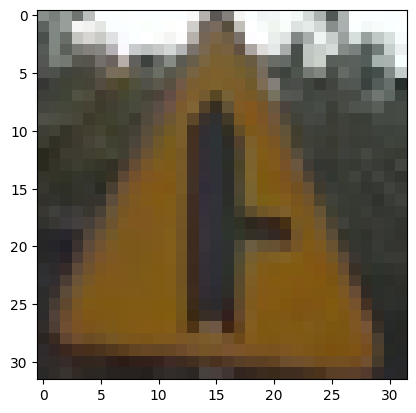

The traffic is: A-6b | Model predicted: A-6b | Class name: Skrzyżowanie z drogą podporządkowaną występującą po prawej stronie


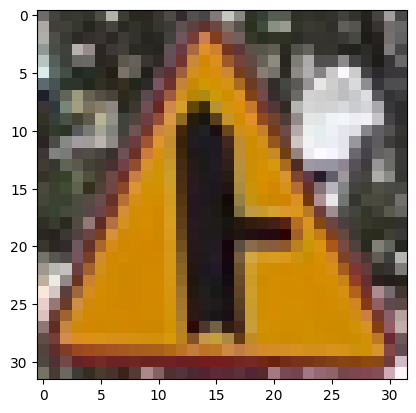

The traffic is: A-6b | Model predicted: A-6b | Class name: Skrzyżowanie z drogą podporządkowaną występującą po prawej stronie


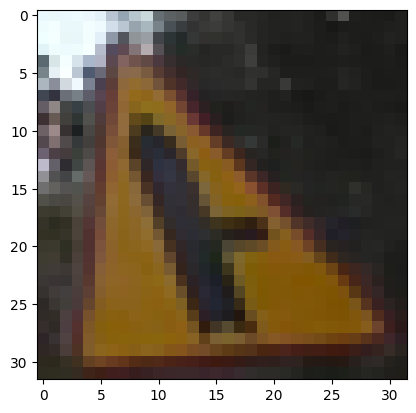

The traffic is: A-6b | Model predicted: A-6b | Class name: Skrzyżowanie z drogą podporządkowaną występującą po prawej stronie


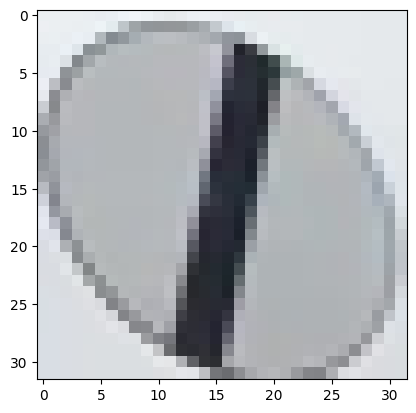

The traffic is: B-42 | Model predicted: B-42 | Class name: Koniec zakazów


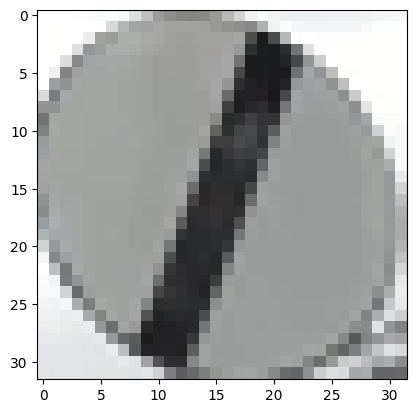

The traffic is: B-42 | Model predicted: B-42 | Class name: Koniec zakazów


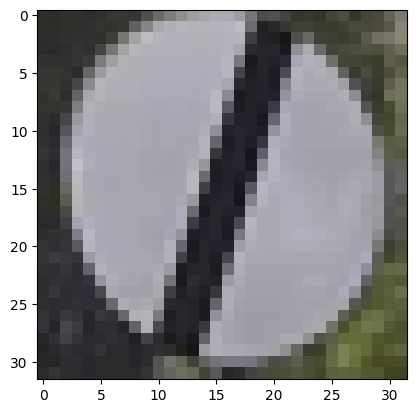

The traffic is: B-42 | Model predicted: B-42 | Class name: Koniec zakazów


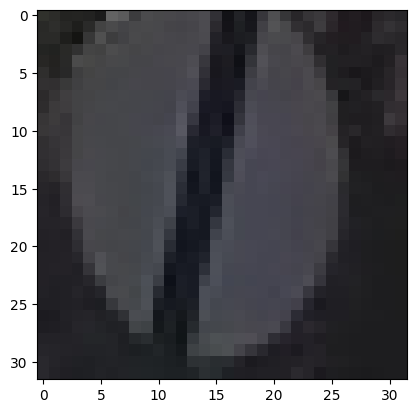

The traffic is: B-42 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


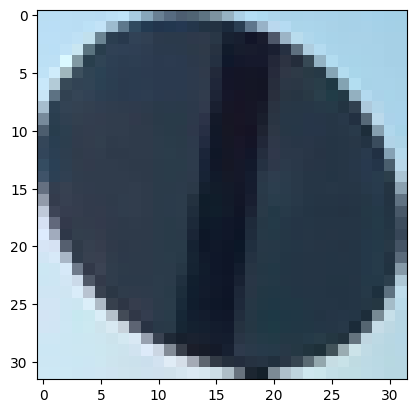

The traffic is: B-42 | Model predicted: B-42 | Class name: Koniec zakazów


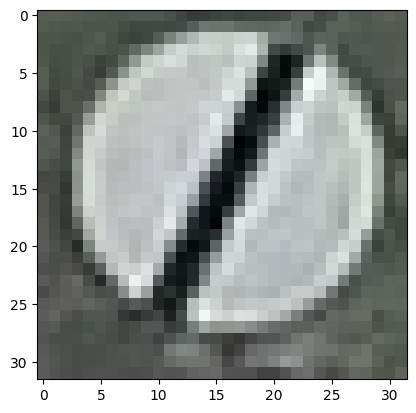

The traffic is: B-42 | Model predicted: B-42 | Class name: Koniec zakazów


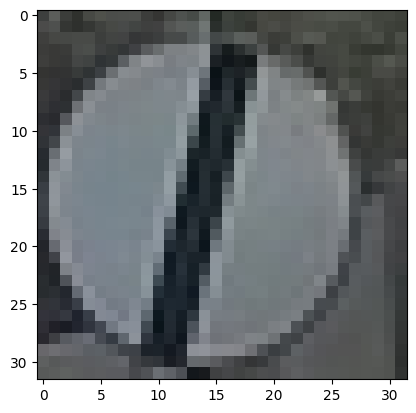

The traffic is: B-42 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


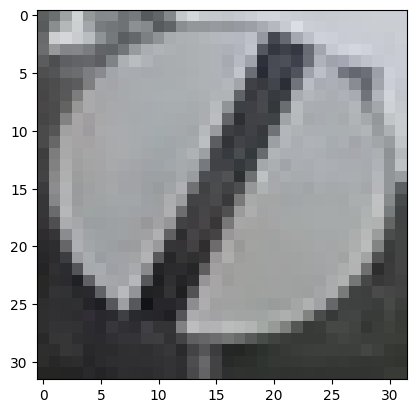

The traffic is: B-42 | Model predicted: B-42 | Class name: Koniec zakazów


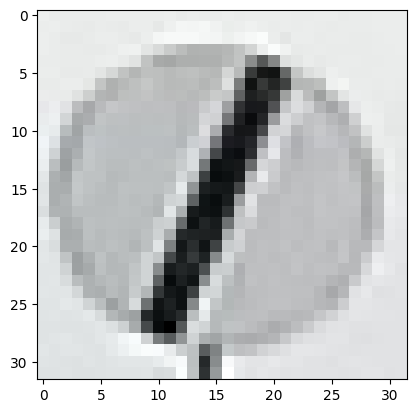

The traffic is: B-42 | Model predicted: B-42 | Class name: Koniec zakazów


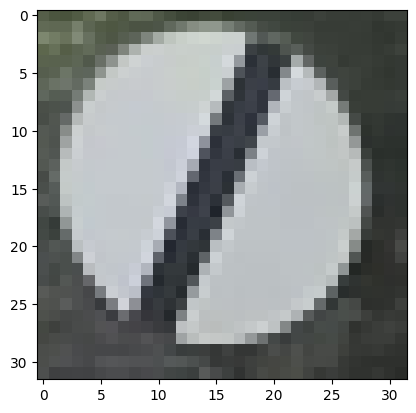

The traffic is: B-42 | Model predicted: B-42 | Class name: Koniec zakazów


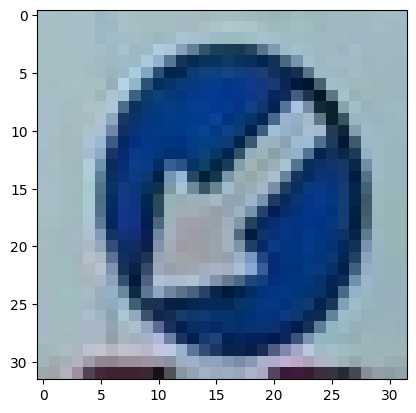

The traffic is: C-10 | Model predicted: C-10 | Class name: Nakaz jazdy z lewej strony znaku


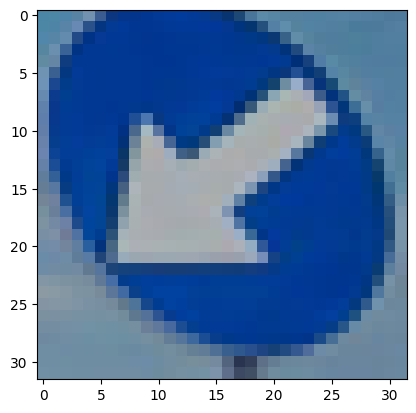

The traffic is: C-10 | Model predicted: C-10 | Class name: Nakaz jazdy z lewej strony znaku


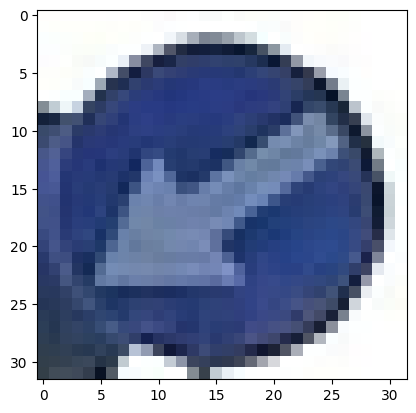

The traffic is: C-10 | Model predicted: C-10 | Class name: Nakaz jazdy z lewej strony znaku


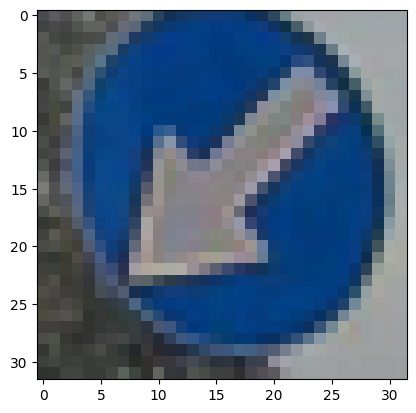

The traffic is: C-10 | Model predicted: C-10 | Class name: Nakaz jazdy z lewej strony znaku


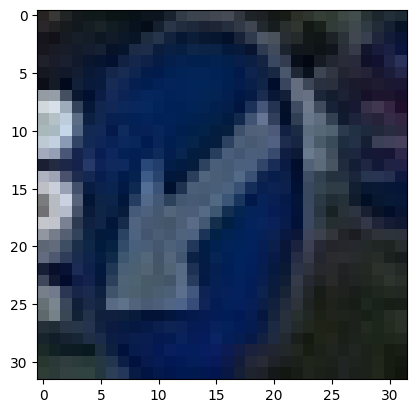

The traffic is: C-10 | Model predicted: C-10 | Class name: Nakaz jazdy z lewej strony znaku


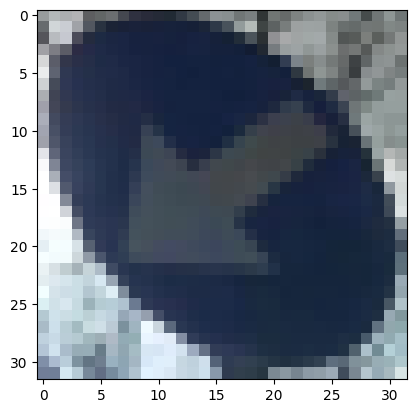

The traffic is: C-10 | Model predicted: C-10 | Class name: Nakaz jazdy z lewej strony znaku


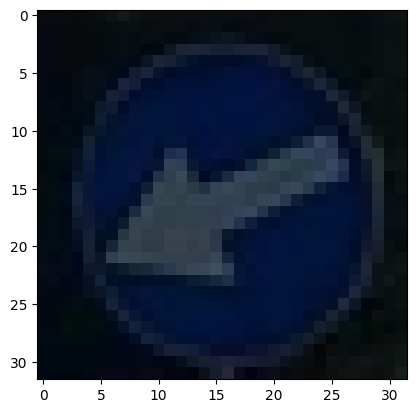

The traffic is: C-10 | Model predicted: C-10 | Class name: Nakaz jazdy z lewej strony znaku


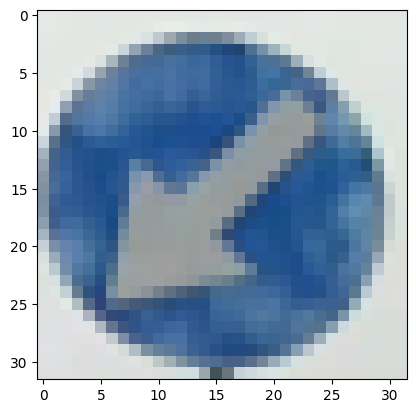

The traffic is: C-10 | Model predicted: C-10 | Class name: Nakaz jazdy z lewej strony znaku


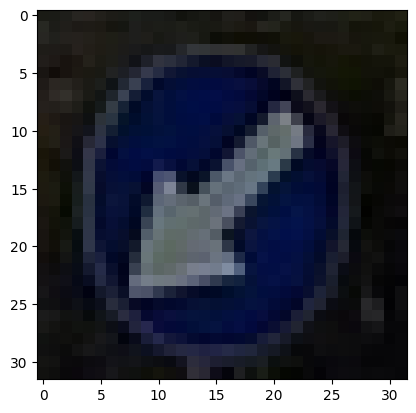

The traffic is: C-10 | Model predicted: C-10 | Class name: Nakaz jazdy z lewej strony znaku


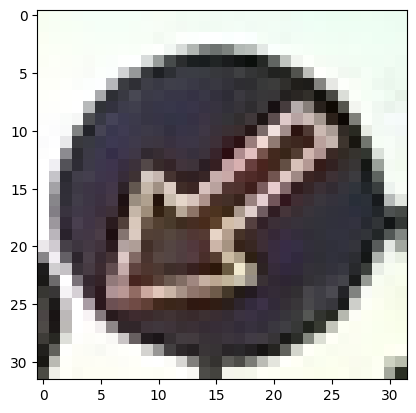

The traffic is: C-10 | Model predicted: C-10 | Class name: Nakaz jazdy z lewej strony znaku


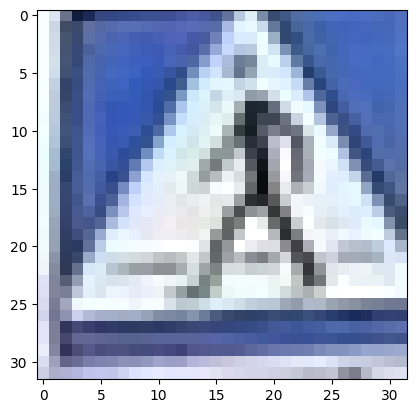

The traffic is: D-6 | Model predicted: D-6 | Class name: Przejście dla pieszych


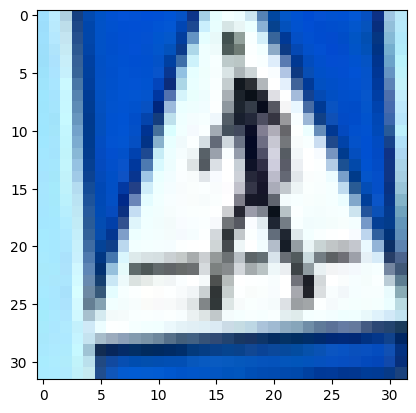

The traffic is: D-6 | Model predicted: D-6 | Class name: Przejście dla pieszych


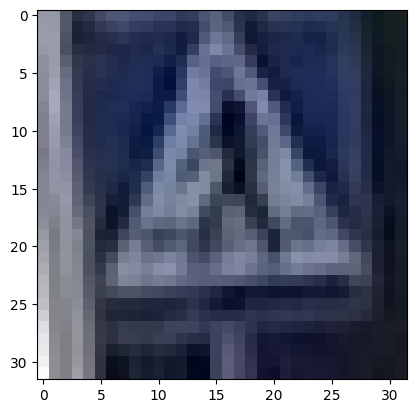

The traffic is: D-6 | Model predicted: D-6 | Class name: Przejście dla pieszych


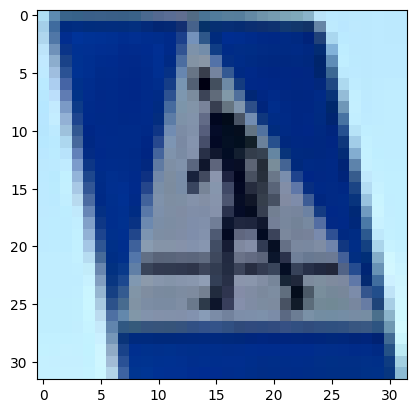

The traffic is: D-6 | Model predicted: D-6 | Class name: Przejście dla pieszych


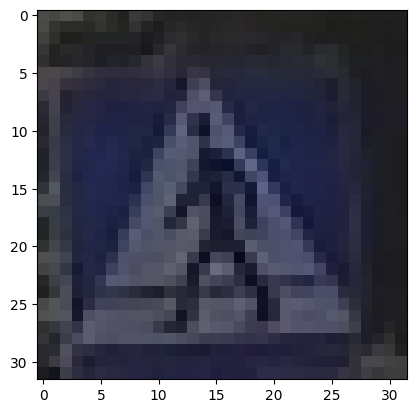

The traffic is: D-6 | Model predicted: D-6 | Class name: Przejście dla pieszych


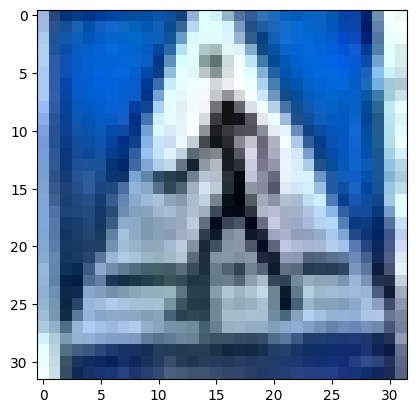

The traffic is: D-6 | Model predicted: D-6 | Class name: Przejście dla pieszych


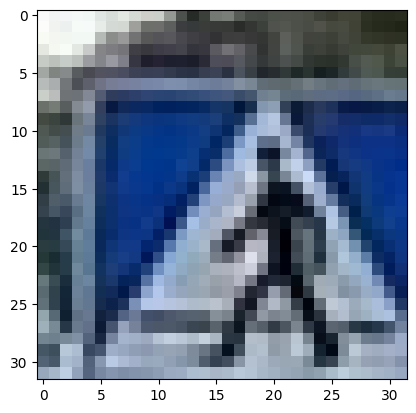

The traffic is: D-6 | Model predicted: C-10 | Class name: Nakaz jazdy z lewej strony znaku


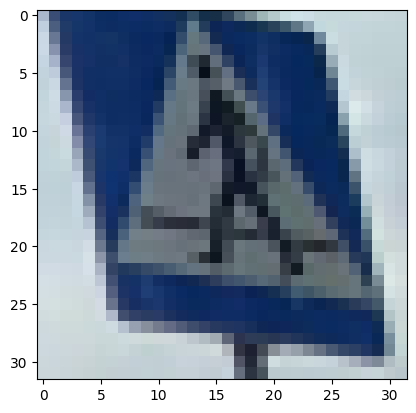

The traffic is: D-6 | Model predicted: D-6 | Class name: Przejście dla pieszych


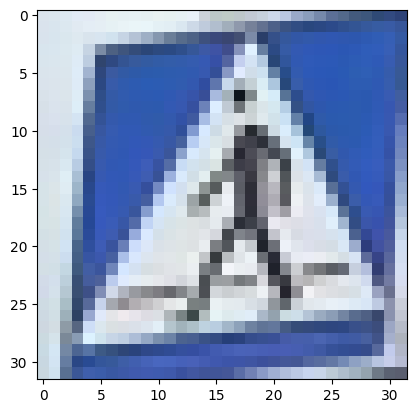

The traffic is: D-6 | Model predicted: D-6 | Class name: Przejście dla pieszych


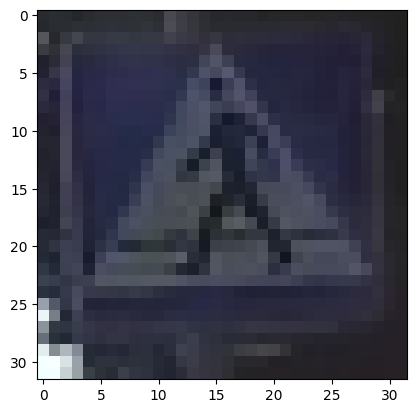

The traffic is: D-6 | Model predicted: D-6 | Class name: Przejście dla pieszych


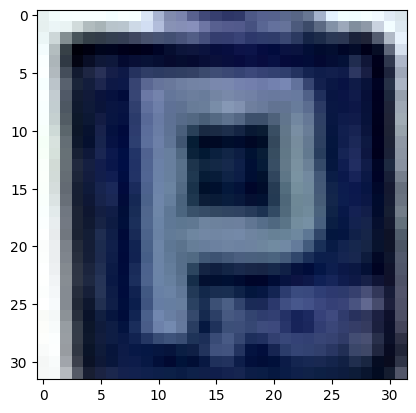

The traffic is: D-18 | Model predicted: D-18 | Class name: Parking


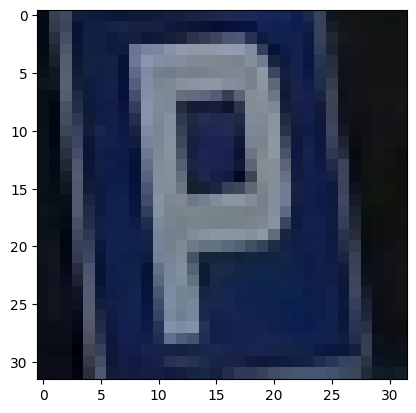

The traffic is: D-18 | Model predicted: D-18 | Class name: Parking


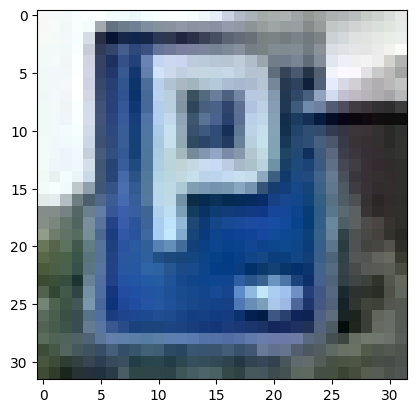

The traffic is: D-18 | Model predicted: D-18 | Class name: Parking


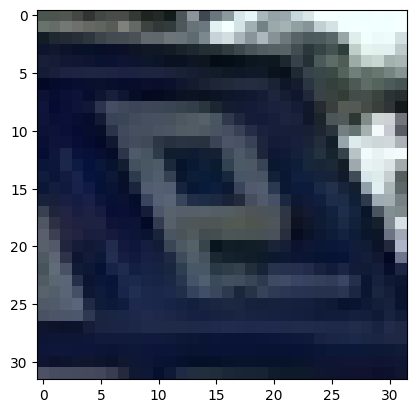

The traffic is: D-18 | Model predicted: D-18 | Class name: Parking


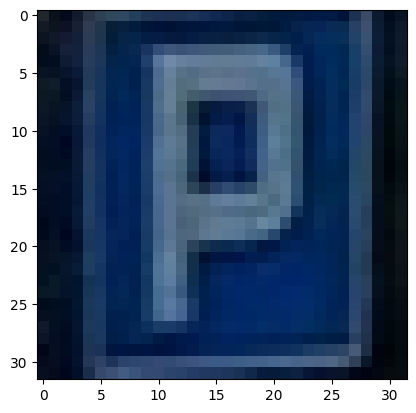

The traffic is: D-18 | Model predicted: D-18 | Class name: Parking


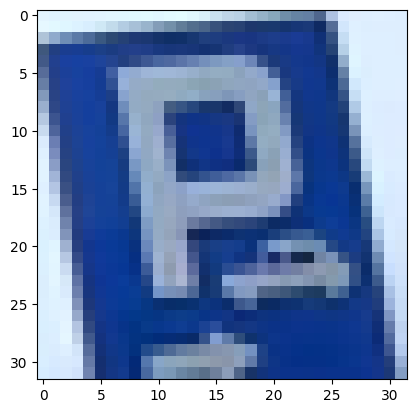

The traffic is: D-18 | Model predicted: D-18 | Class name: Parking


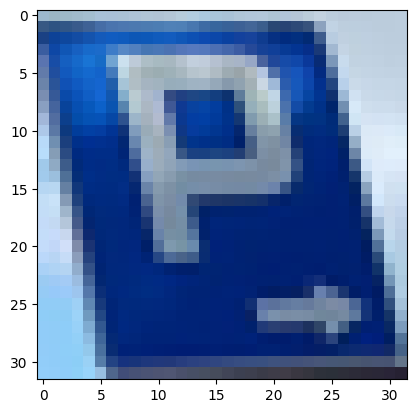

The traffic is: D-18 | Model predicted: D-18 | Class name: Parking


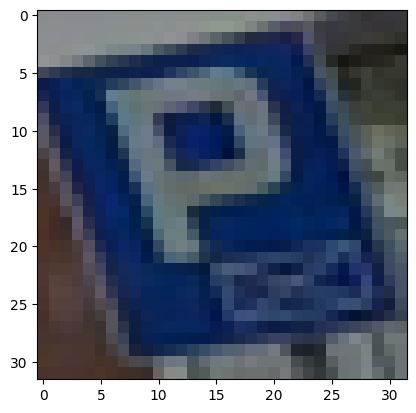

The traffic is: D-18 | Model predicted: D-18 | Class name: Parking


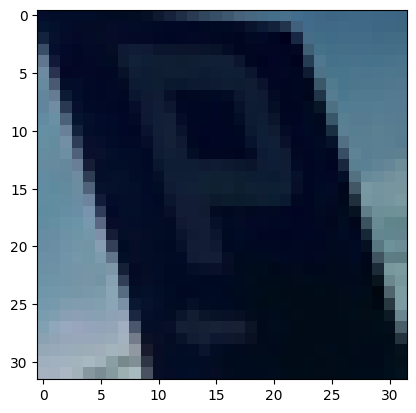

The traffic is: D-18 | Model predicted: B-36 | Class name: Zakaz zatrzymywania się


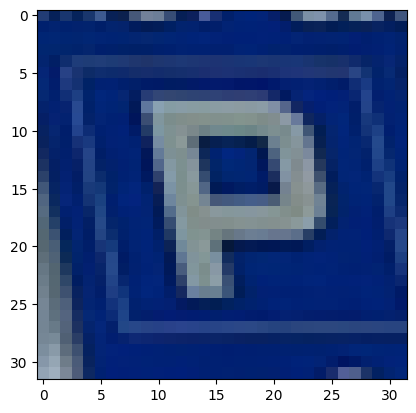

The traffic is: D-18 | Model predicted: D-18 | Class name: Parking


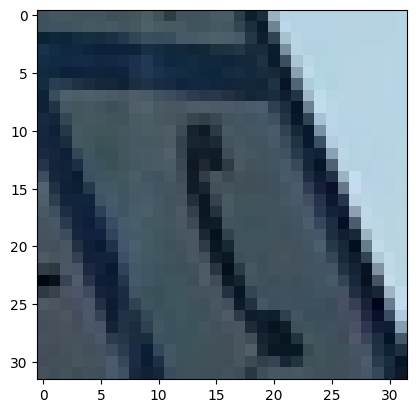

The traffic is: D-24 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


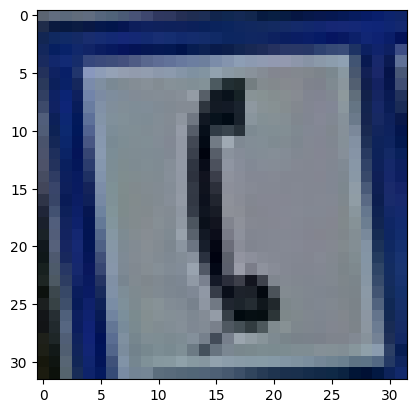

The traffic is: D-24 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


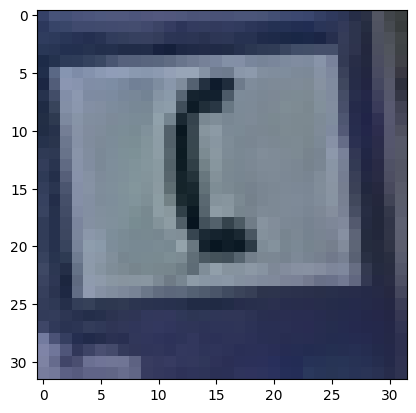

The traffic is: D-24 | Model predicted: D-23 | Class name: Stacja paliwowa


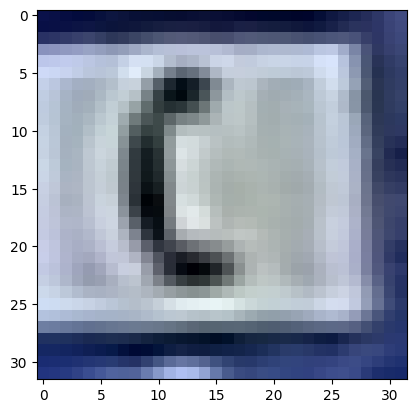

The traffic is: D-24 | Model predicted: B-43 | Class name: Strefa ograniczonej prędkości


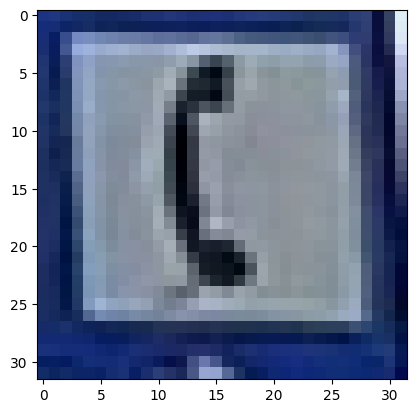

The traffic is: D-24 | Model predicted: D-24 | Class name: Telefon


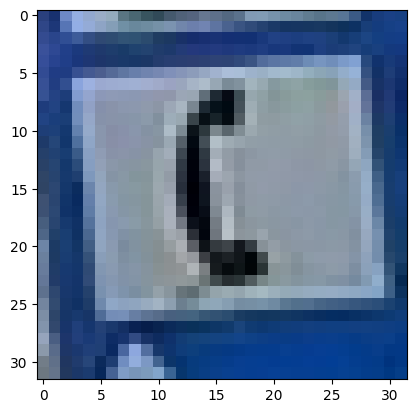

The traffic is: D-24 | Model predicted: D-24 | Class name: Telefon


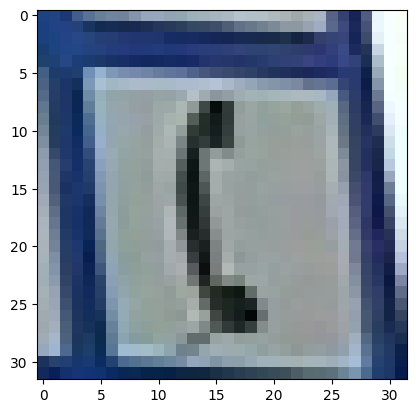

The traffic is: D-24 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


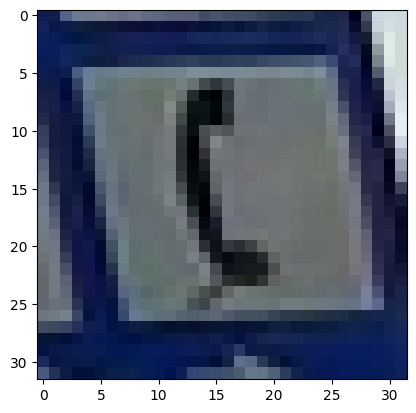

The traffic is: D-24 | Model predicted: D-24 | Class name: Telefon


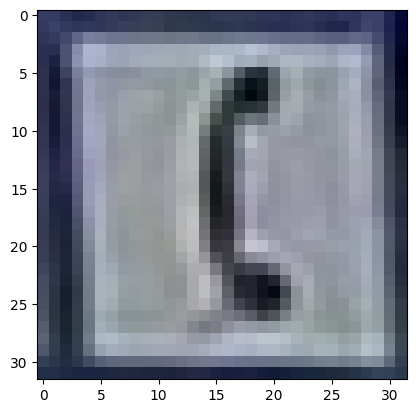

The traffic is: D-24 | Model predicted: B-33 | Class name: Ograniczenie prędkości


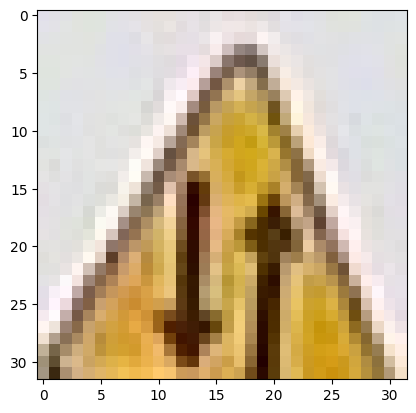

The traffic is: A-20 | Model predicted: B-43 | Class name: Strefa ograniczonej prędkości


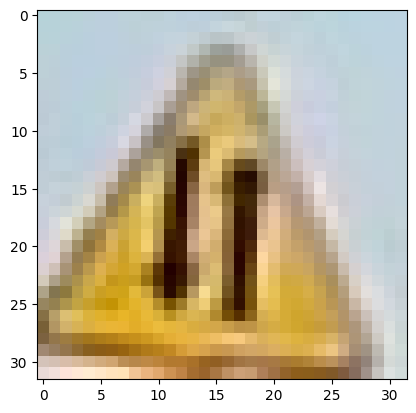

The traffic is: A-20 | Model predicted: A-20 | Class name: Odcinek jezdni o ruchu dwukierunkowym


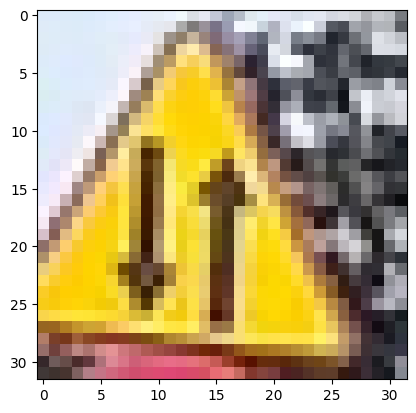

The traffic is: A-20 | Model predicted: A-17 | Class name: Dzieci


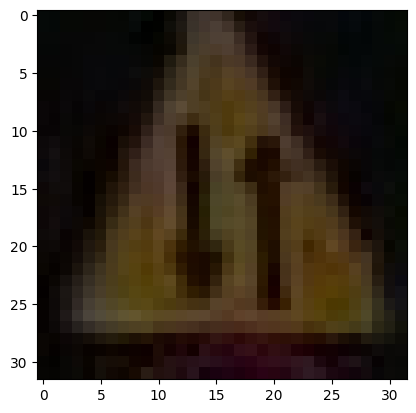

The traffic is: A-20 | Model predicted: A-20 | Class name: Odcinek jezdni o ruchu dwukierunkowym


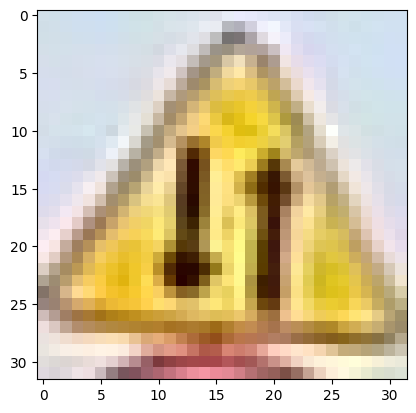

The traffic is: A-20 | Model predicted: A-20 | Class name: Odcinek jezdni o ruchu dwukierunkowym


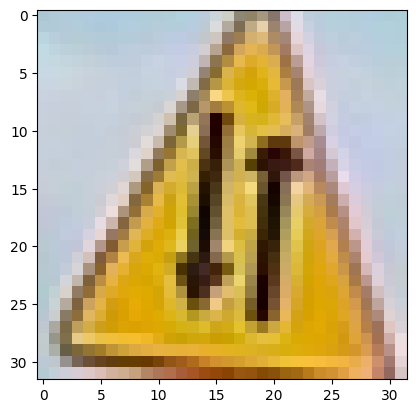

The traffic is: A-20 | Model predicted: A-20 | Class name: Odcinek jezdni o ruchu dwukierunkowym


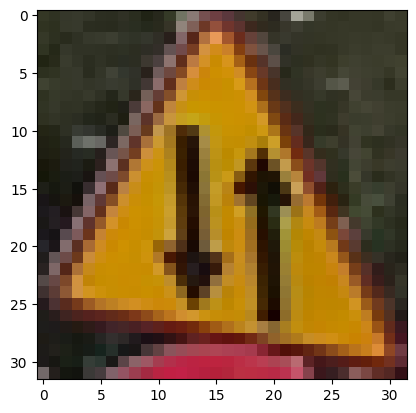

The traffic is: A-20 | Model predicted: A-20 | Class name: Odcinek jezdni o ruchu dwukierunkowym


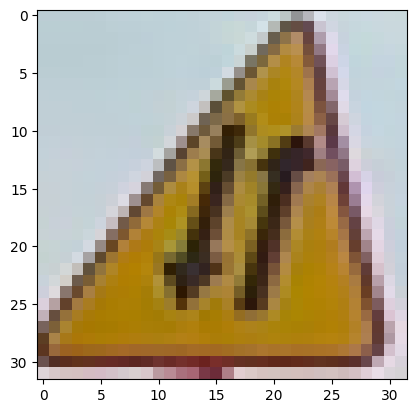

The traffic is: A-20 | Model predicted: A-20 | Class name: Odcinek jezdni o ruchu dwukierunkowym


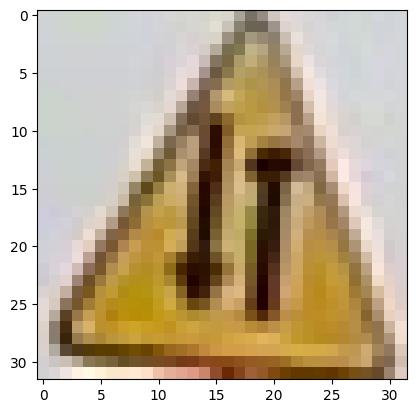

The traffic is: A-20 | Model predicted: A-20 | Class name: Odcinek jezdni o ruchu dwukierunkowym


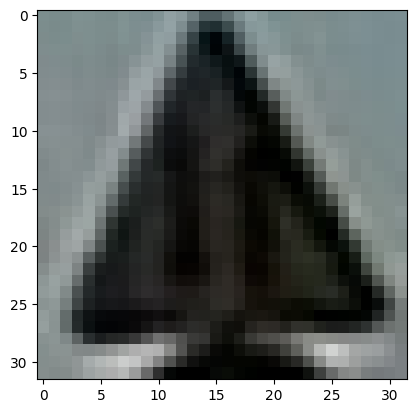

The traffic is: A-20 | Model predicted: A-17 | Class name: Dzieci


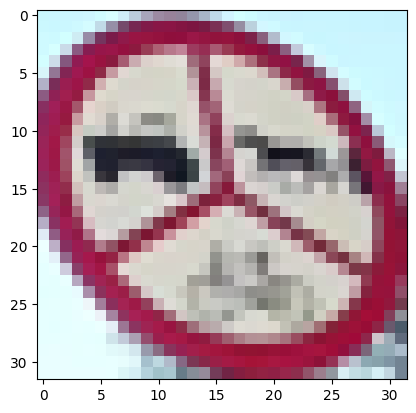

The traffic is: B-6-B-8-B-9 | Model predicted: B-6-B-8-B-9 | Class name: Zakaz wjazdu pojazdów innych niż samochodowe


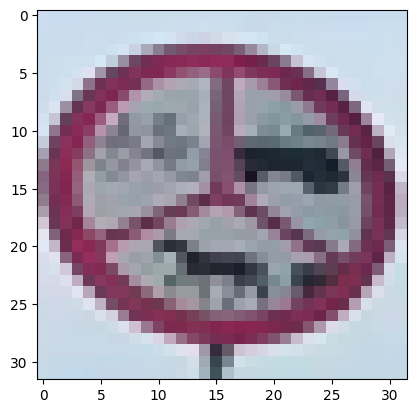

The traffic is: B-6-B-8-B-9 | Model predicted: D-23a | Class name: Stacja paliwowa tylko z gazem do napędu pojazdów


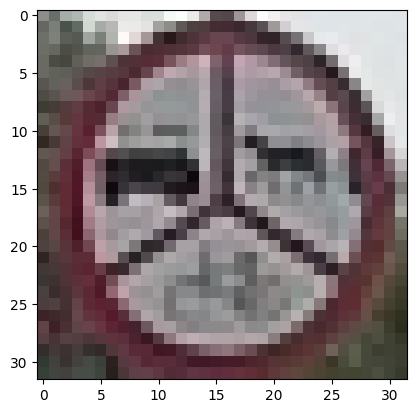

The traffic is: B-6-B-8-B-9 | Model predicted: B-33 | Class name: Ograniczenie prędkości


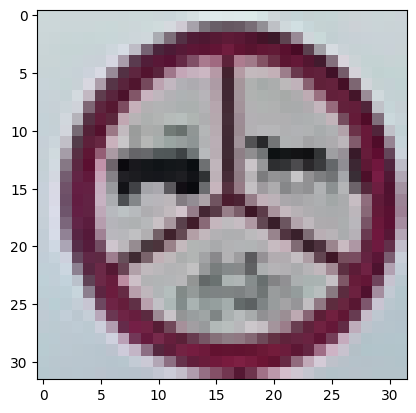

The traffic is: B-6-B-8-B-9 | Model predicted: B-33 | Class name: Ograniczenie prędkości


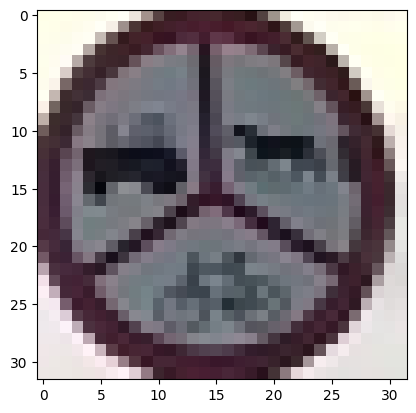

The traffic is: B-6-B-8-B-9 | Model predicted: B-6-B-8-B-9 | Class name: Zakaz wjazdu pojazdów innych niż samochodowe


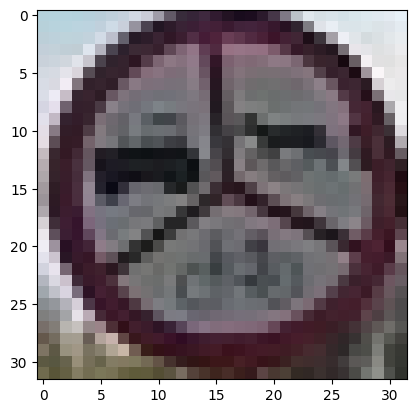

The traffic is: B-6-B-8-B-9 | Model predicted: B-33 | Class name: Ograniczenie prędkości


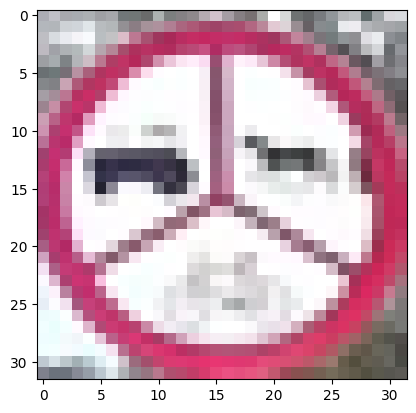

The traffic is: B-6-B-8-B-9 | Model predicted: B-33 | Class name: Ograniczenie prędkości


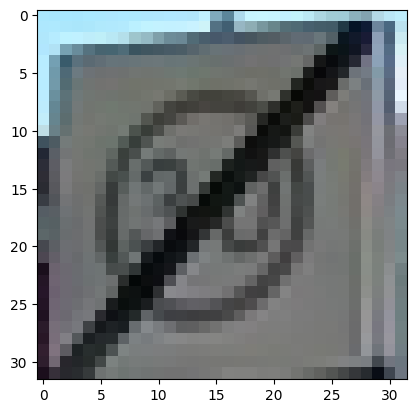

The traffic is: B-44 | Model predicted: B-44 | Class name: Koniec strefy ograniczonej prędkości


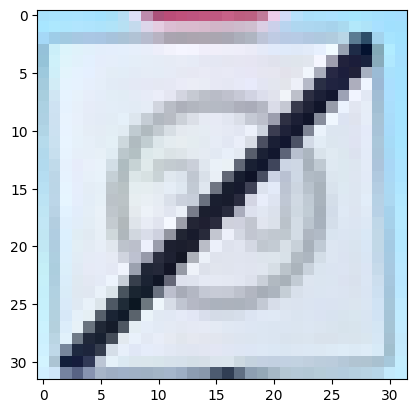

The traffic is: B-44 | Model predicted: B-44 | Class name: Koniec strefy ograniczonej prędkości


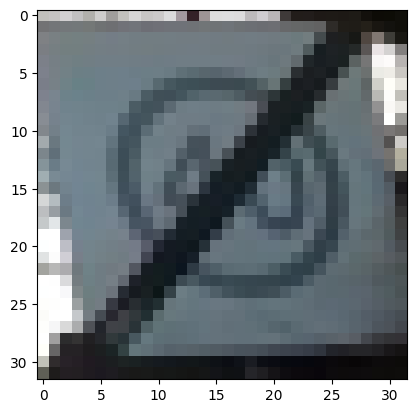

The traffic is: B-44 | Model predicted: B-33 | Class name: Ograniczenie prędkości


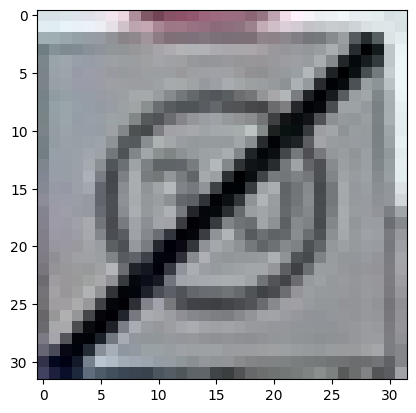

The traffic is: B-44 | Model predicted: B-33 | Class name: Ograniczenie prędkości


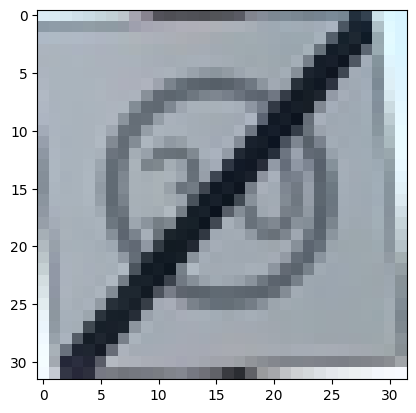

The traffic is: B-44 | Model predicted: B-44 | Class name: Koniec strefy ograniczonej prędkości


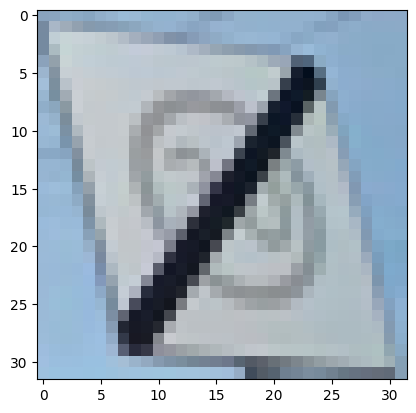

The traffic is: B-44 | Model predicted: B-42 | Class name: Koniec zakazów


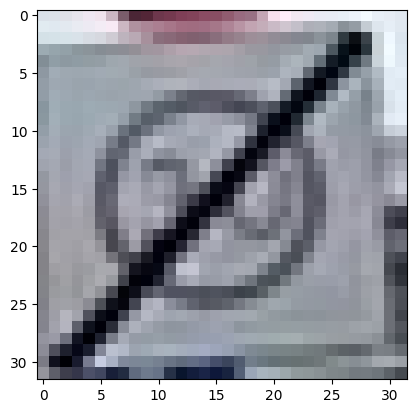

The traffic is: B-44 | Model predicted: B-33 | Class name: Ograniczenie prędkości


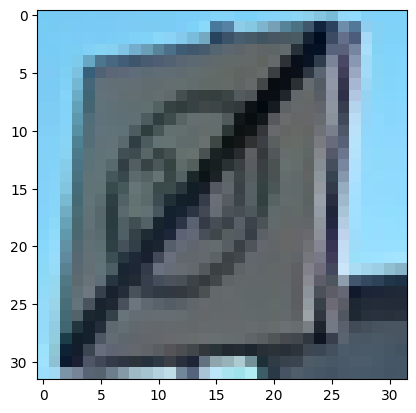

The traffic is: B-44 | Model predicted: B-42 | Class name: Koniec zakazów


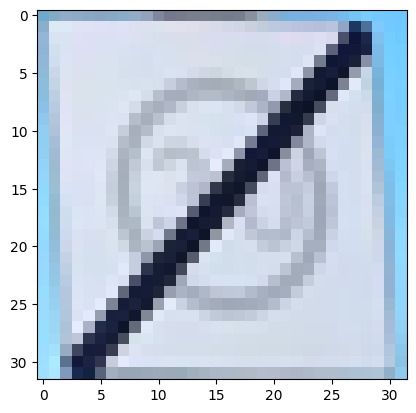

The traffic is: B-44 | Model predicted: B-33 | Class name: Ograniczenie prędkości


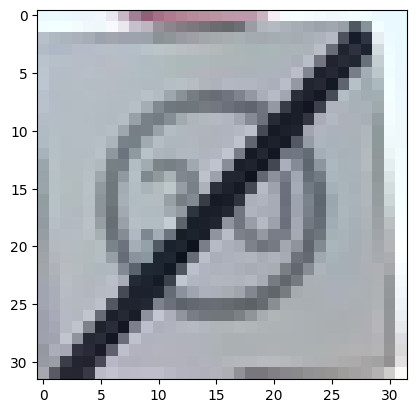

The traffic is: B-44 | Model predicted: B-33 | Class name: Ograniczenie prędkości


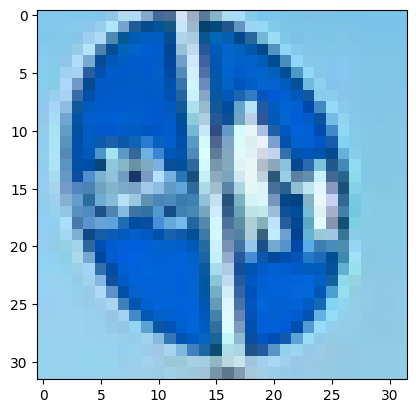

The traffic is: C-13-C-16 | Model predicted: D-3 | Class name: Droga jednokierunkowa


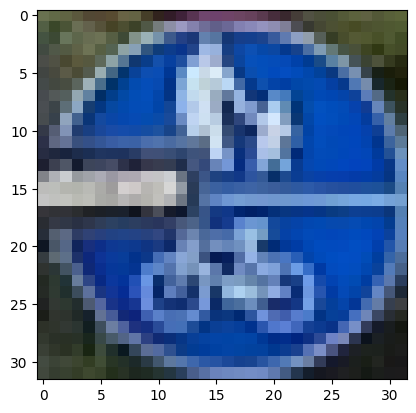

The traffic is: C-13-C-16 | Model predicted: C-13-C-16 | Class name: Droga dla pieszych i rowerzystów


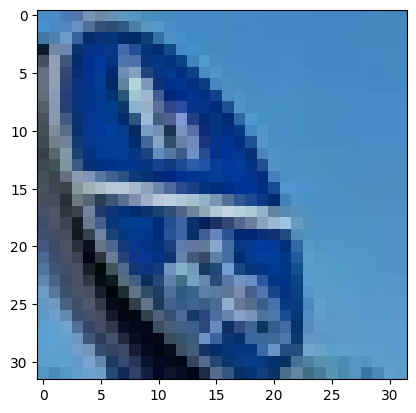

The traffic is: C-13-C-16 | Model predicted: D-51 | Class name: Automatyczna kontrola prędkości


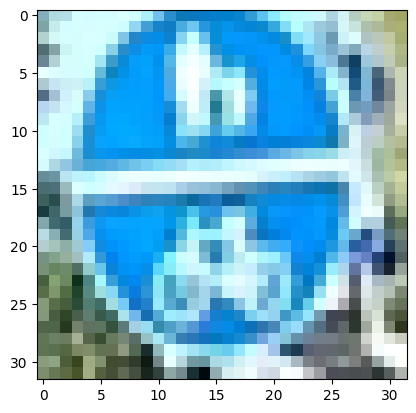

The traffic is: C-13-C-16 | Model predicted: D-3 | Class name: Droga jednokierunkowa


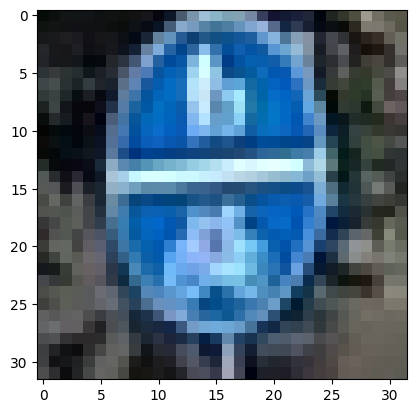

The traffic is: C-13-C-16 | Model predicted: B-33 | Class name: Ograniczenie prędkości


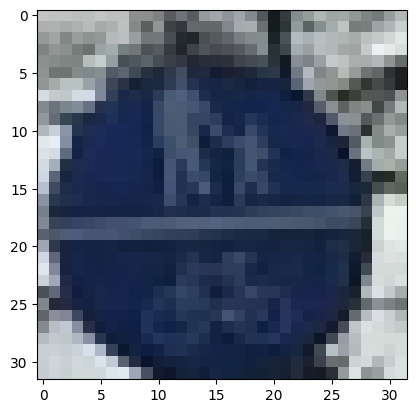

The traffic is: C-13-C-16 | Model predicted: B-33 | Class name: Ograniczenie prędkości


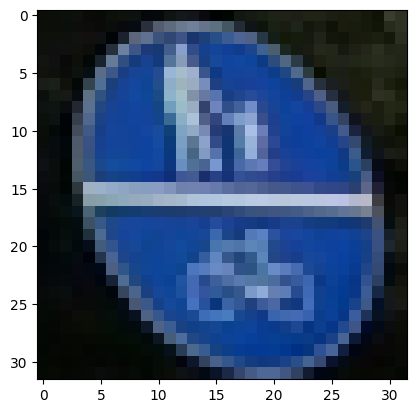

The traffic is: C-13-C-16 | Model predicted: C-13-C-16 | Class name: Droga dla pieszych i rowerzystów


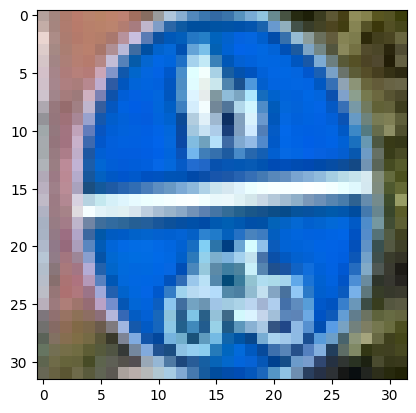

The traffic is: C-13-C-16 | Model predicted: C-13-C-16 | Class name: Droga dla pieszych i rowerzystów


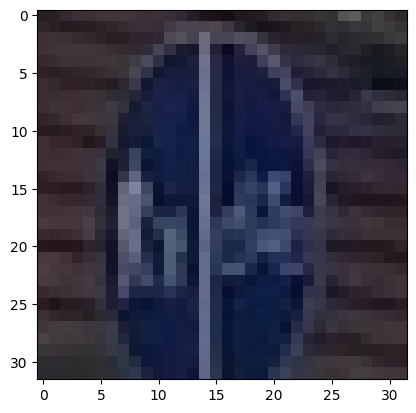

The traffic is: C-13-C-16 | Model predicted: B-33 | Class name: Ograniczenie prędkości


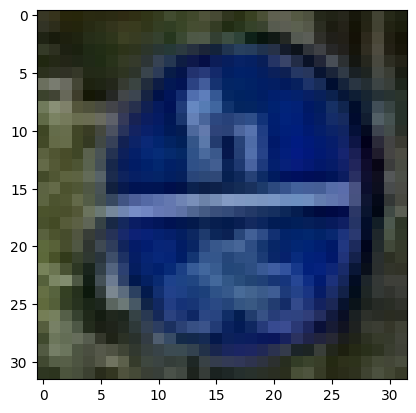

The traffic is: C-13-C-16 | Model predicted: C-13-C-16 | Class name: Droga dla pieszych i rowerzystów


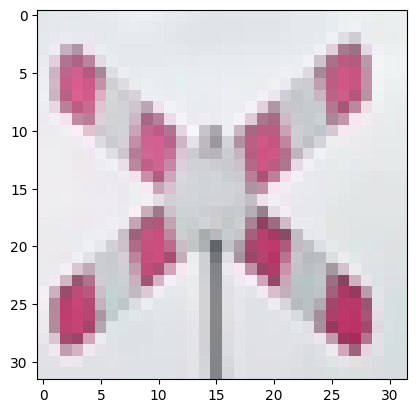

The traffic is: G-3 | Model predicted: B-33 | Class name: Ograniczenie prędkości


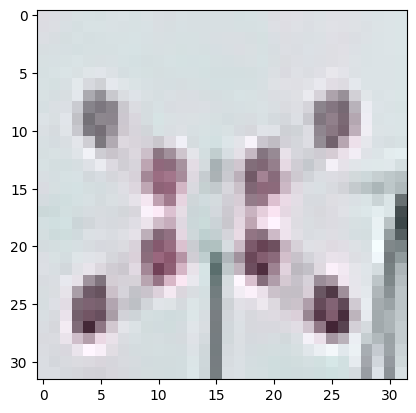

The traffic is: G-3 | Model predicted: B-33 | Class name: Ograniczenie prędkości


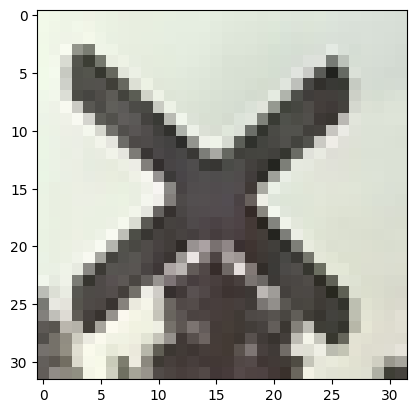

The traffic is: G-3 | Model predicted: B-34 | Class name: Koniec ograniczenia prędkości


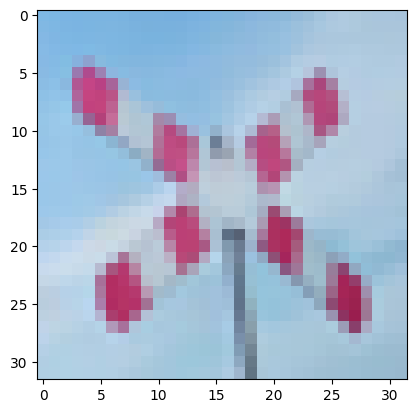

The traffic is: G-3 | Model predicted: B-33 | Class name: Ograniczenie prędkości


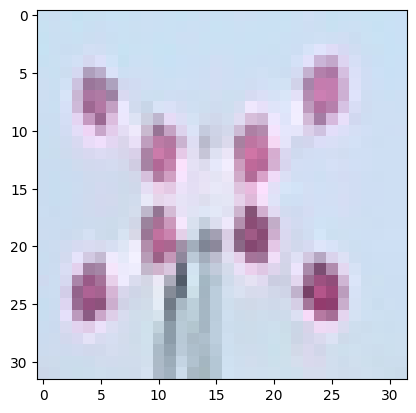

The traffic is: G-3 | Model predicted: B-33 | Class name: Ograniczenie prędkości


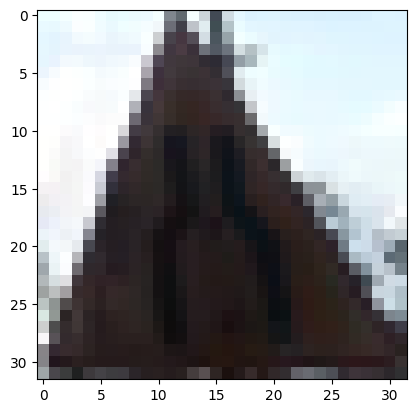

The traffic is: A-12a | Model predicted: A-17 | Class name: Dzieci


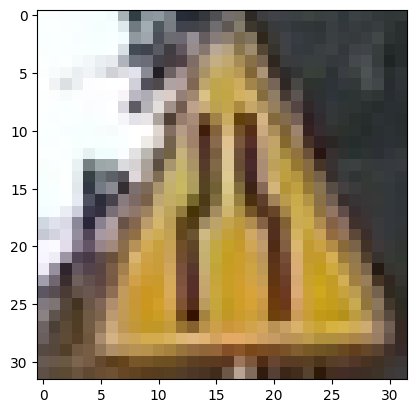

The traffic is: A-12a | Model predicted: A-12a | Class name: Zwężenie jezdni - dwustronne


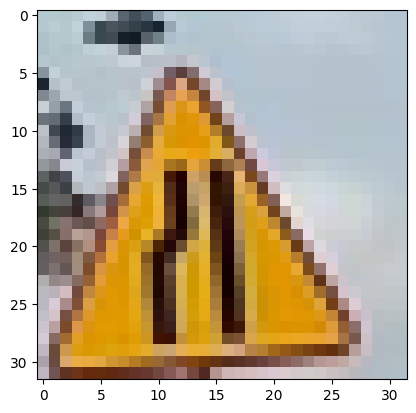

The traffic is: A-12a | Model predicted: A-17 | Class name: Dzieci


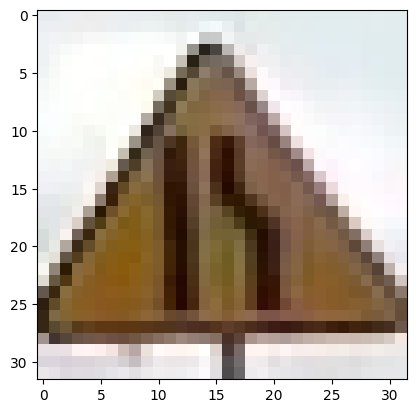

The traffic is: A-12a | Model predicted: A-12a | Class name: Zwężenie jezdni - dwustronne


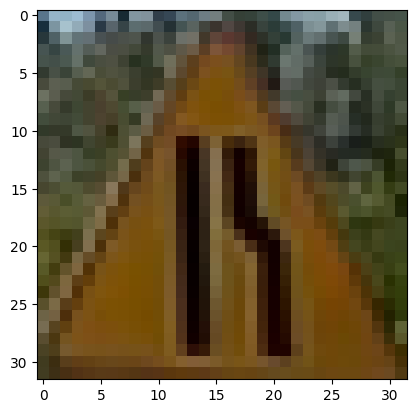

The traffic is: A-12a | Model predicted: A-12a | Class name: Zwężenie jezdni - dwustronne


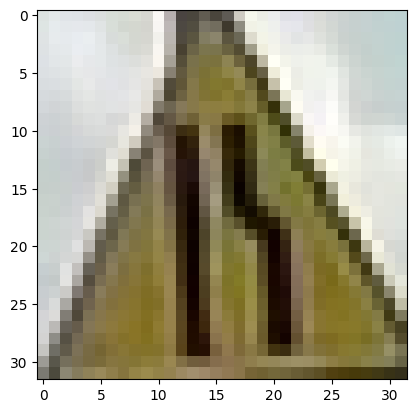

The traffic is: A-12a | Model predicted: A-12a | Class name: Zwężenie jezdni - dwustronne


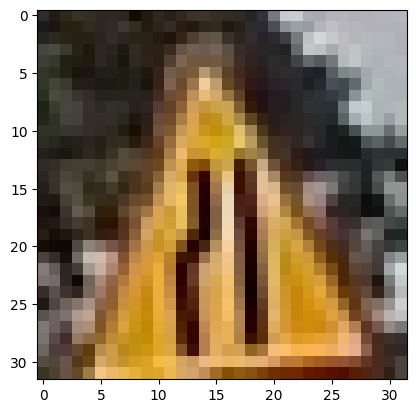

The traffic is: A-12a | Model predicted: A-17 | Class name: Dzieci


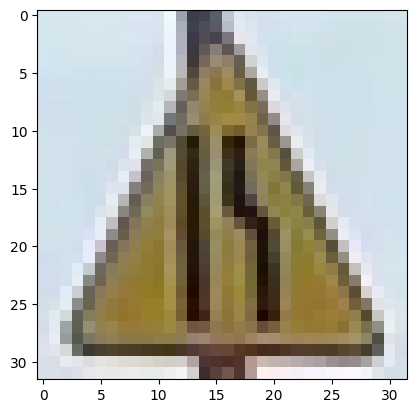

The traffic is: A-12a | Model predicted: A-12a | Class name: Zwężenie jezdni - dwustronne


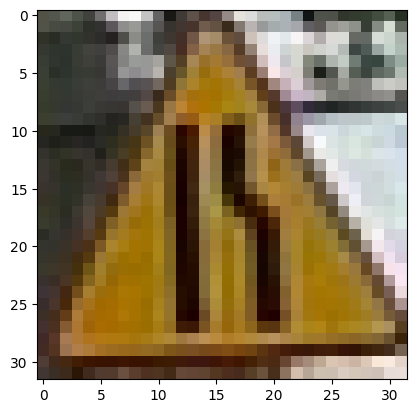

The traffic is: A-12a | Model predicted: A-12a | Class name: Zwężenie jezdni - dwustronne


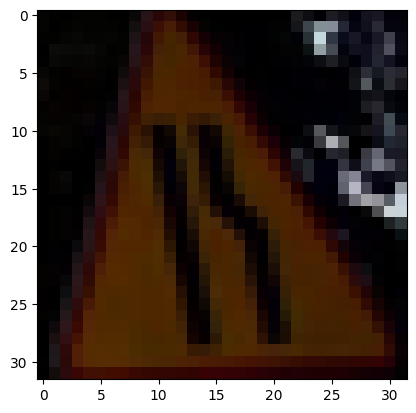

The traffic is: A-12a | Model predicted: A-12a | Class name: Zwężenie jezdni - dwustronne


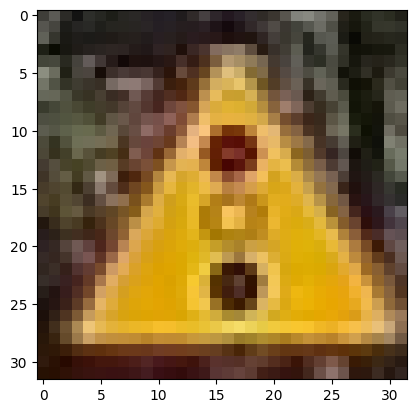

The traffic is: A-29 | Model predicted: A-29 | Class name: Sygnały świetlne


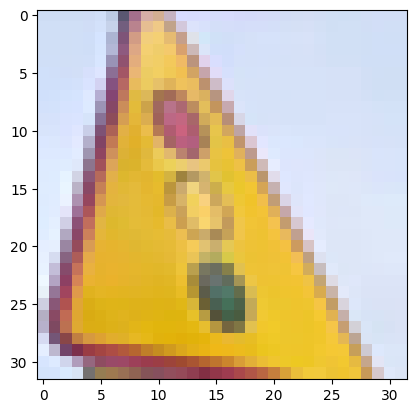

The traffic is: A-29 | Model predicted: A-29 | Class name: Sygnały świetlne


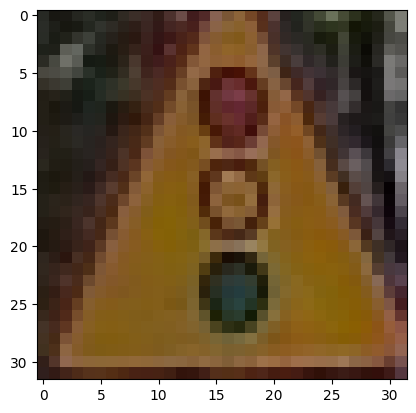

The traffic is: A-29 | Model predicted: A-32 | Class name: Oszronienie jezdni


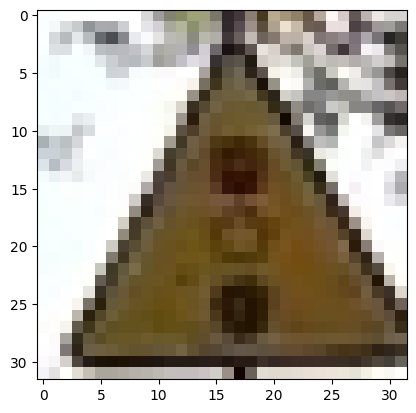

The traffic is: A-29 | Model predicted: A-16 | Class name: Przejście dla pieszych


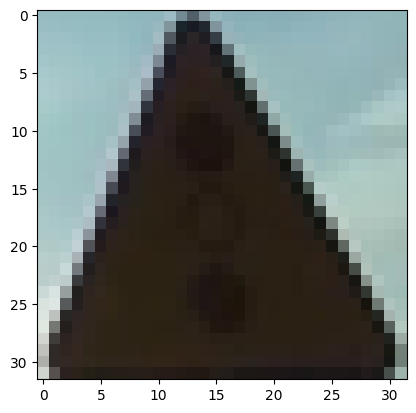

The traffic is: A-29 | Model predicted: A-16 | Class name: Przejście dla pieszych


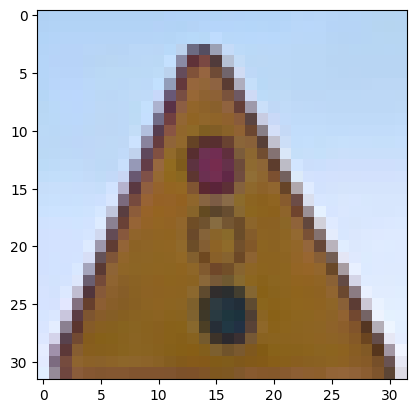

The traffic is: A-29 | Model predicted: A-29 | Class name: Sygnały świetlne


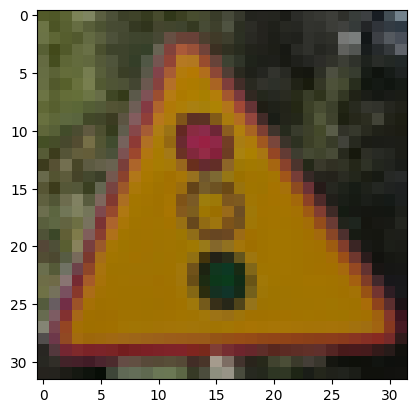

The traffic is: A-29 | Model predicted: A-29 | Class name: Sygnały świetlne


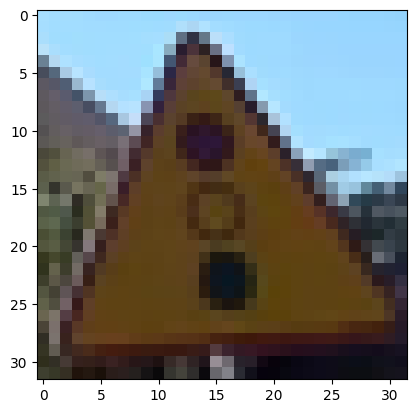

The traffic is: A-29 | Model predicted: A-29 | Class name: Sygnały świetlne


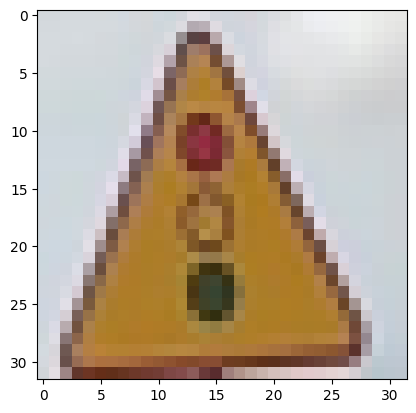

The traffic is: A-29 | Model predicted: A-29 | Class name: Sygnały świetlne


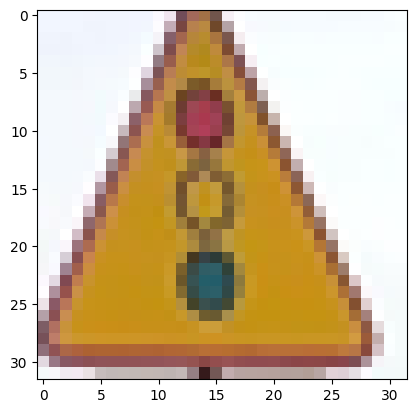

The traffic is: A-29 | Model predicted: A-29 | Class name: Sygnały świetlne


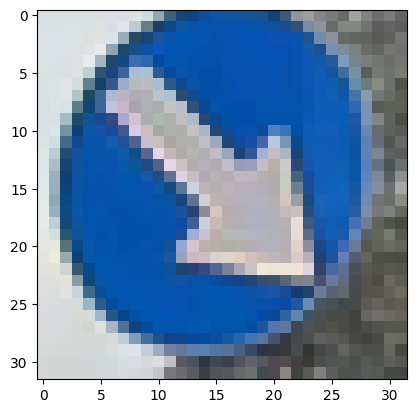

The traffic is: C-9 | Model predicted: C-9 | Class name: Nakaz jazdy z prawej strony znaku


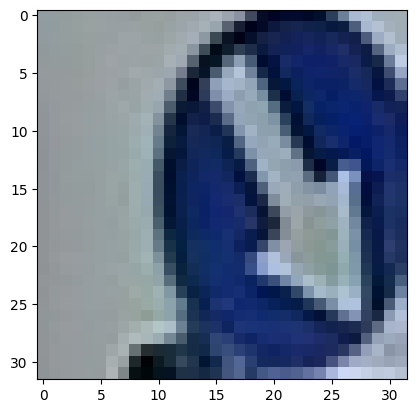

The traffic is: C-9 | Model predicted: A-6a | Class name: Skrzyżowanie z drogą podporządkowaną występującą po obu stronach


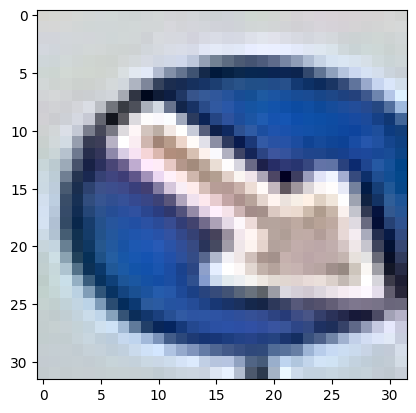

The traffic is: C-9 | Model predicted: C-9 | Class name: Nakaz jazdy z prawej strony znaku


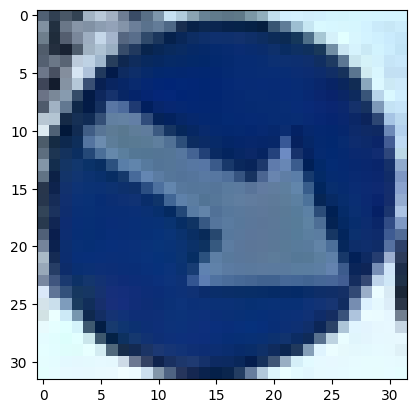

The traffic is: C-9 | Model predicted: C-9 | Class name: Nakaz jazdy z prawej strony znaku


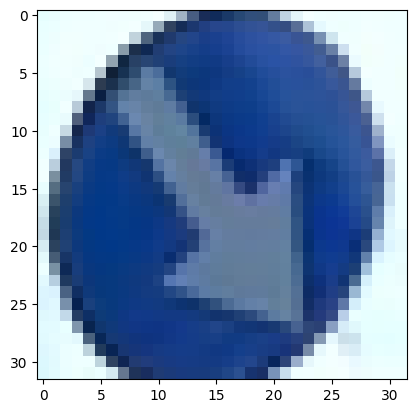

The traffic is: C-9 | Model predicted: C-9 | Class name: Nakaz jazdy z prawej strony znaku


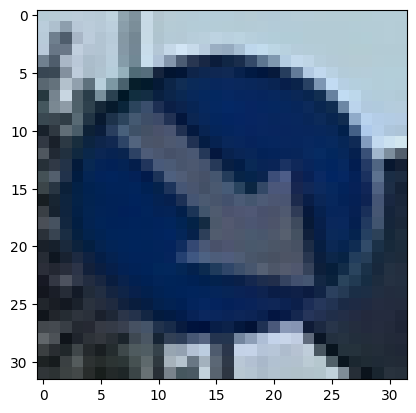

The traffic is: C-9 | Model predicted: C-9 | Class name: Nakaz jazdy z prawej strony znaku


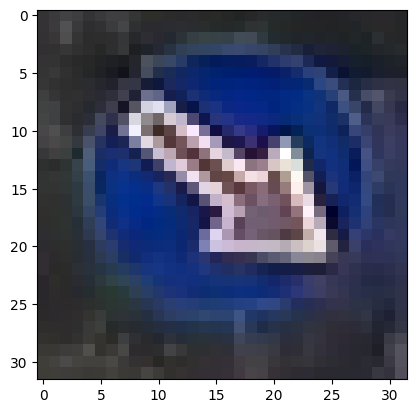

The traffic is: C-9 | Model predicted: C-9 | Class name: Nakaz jazdy z prawej strony znaku


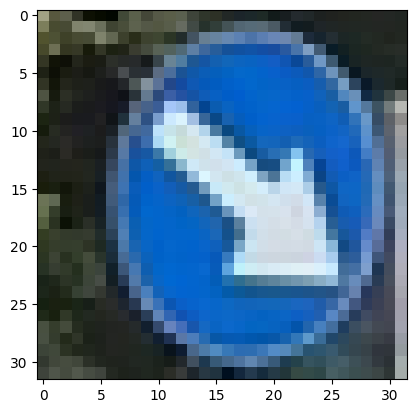

The traffic is: C-9 | Model predicted: C-9 | Class name: Nakaz jazdy z prawej strony znaku


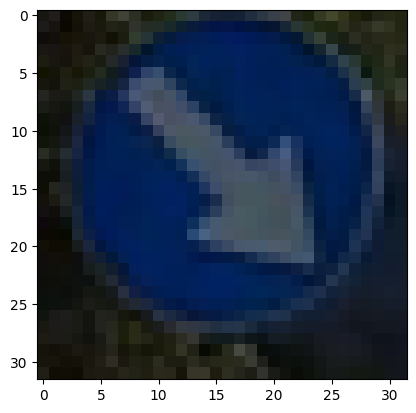

The traffic is: C-9 | Model predicted: C-9 | Class name: Nakaz jazdy z prawej strony znaku


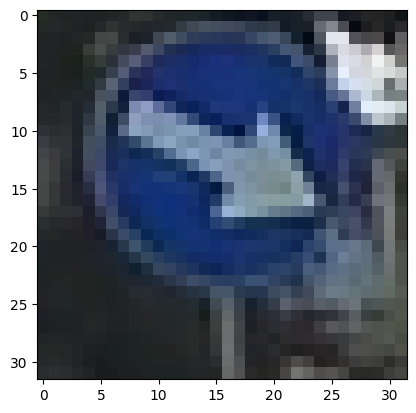

The traffic is: C-9 | Model predicted: C-9 | Class name: Nakaz jazdy z prawej strony znaku


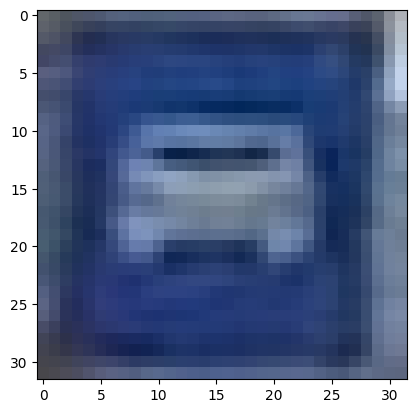

The traffic is: D-7 | Model predicted: D-7 | Class name: Droga ekspresowa


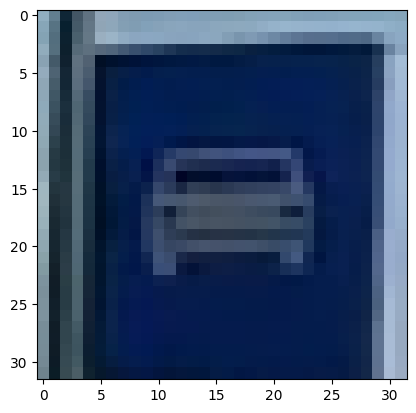

The traffic is: D-7 | Model predicted: D-7 | Class name: Droga ekspresowa


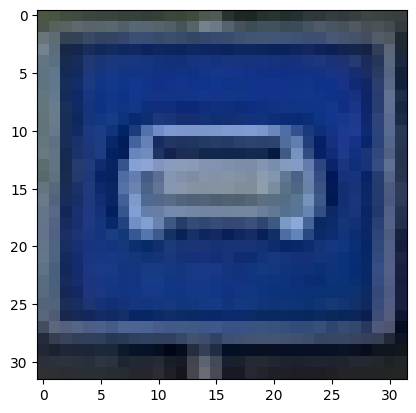

The traffic is: D-7 | Model predicted: D-7 | Class name: Droga ekspresowa


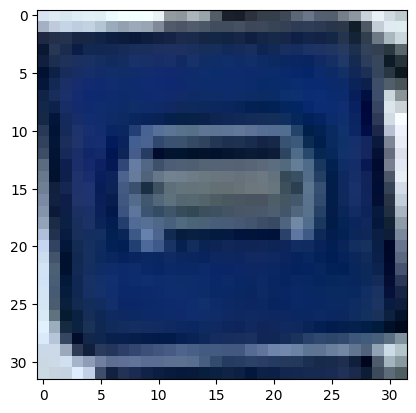

The traffic is: D-7 | Model predicted: D-7 | Class name: Droga ekspresowa


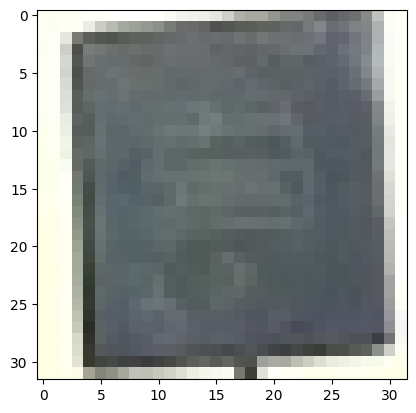

The traffic is: D-7 | Model predicted: B-33 | Class name: Ograniczenie prędkości


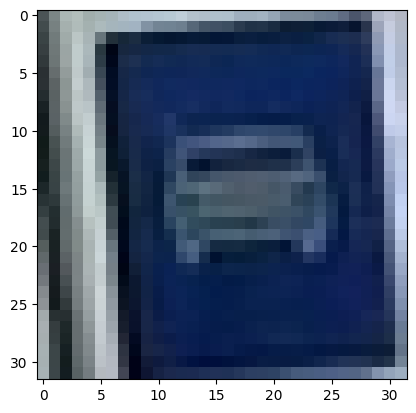

The traffic is: D-7 | Model predicted: D-7 | Class name: Droga ekspresowa


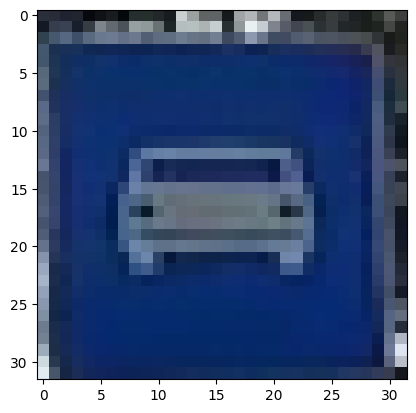

The traffic is: D-7 | Model predicted: D-7 | Class name: Droga ekspresowa


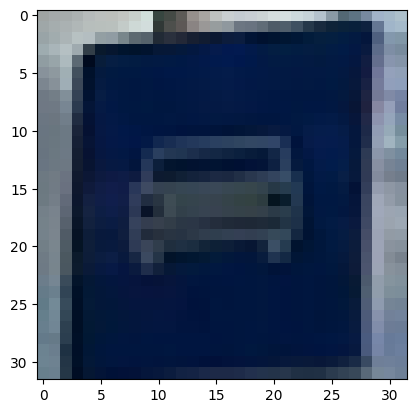

The traffic is: D-7 | Model predicted: D-7 | Class name: Droga ekspresowa


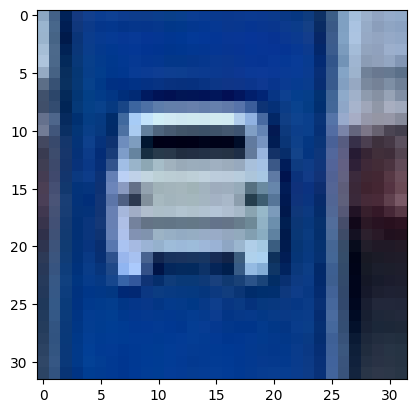

The traffic is: D-7 | Model predicted: D-23a | Class name: Stacja paliwowa tylko z gazem do napędu pojazdów


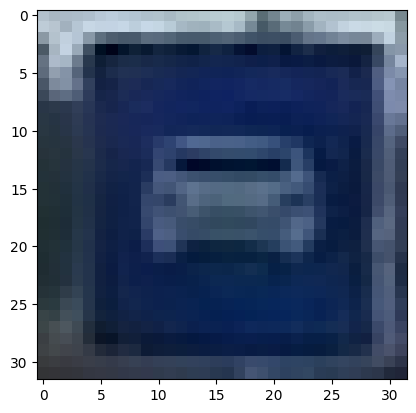

The traffic is: D-7 | Model predicted: D-7 | Class name: Droga ekspresowa


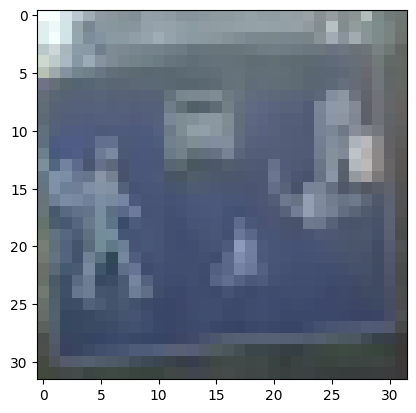

The traffic is: D-40 | Model predicted: D-40 | Class name: Strefa zamieszkania


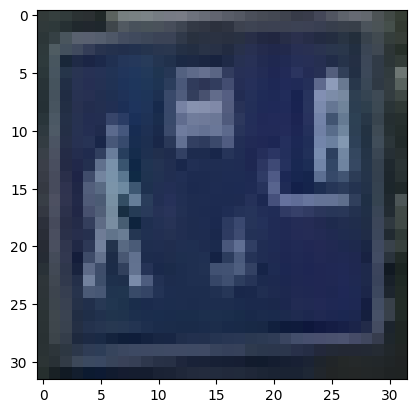

The traffic is: D-40 | Model predicted: D-40 | Class name: Strefa zamieszkania


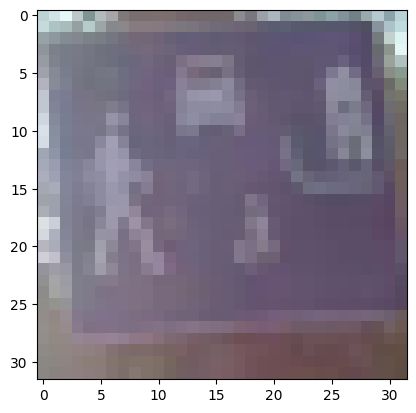

The traffic is: D-40 | Model predicted: D-41 | Class name: Koniec strefy zamieszkania


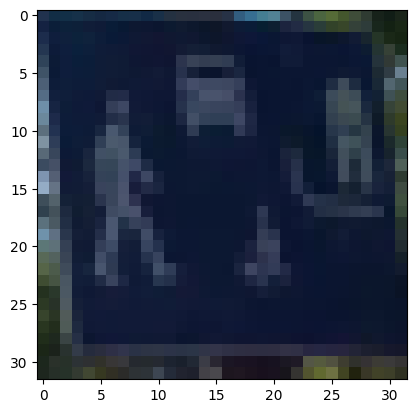

The traffic is: D-40 | Model predicted: D-23 | Class name: Stacja paliwowa


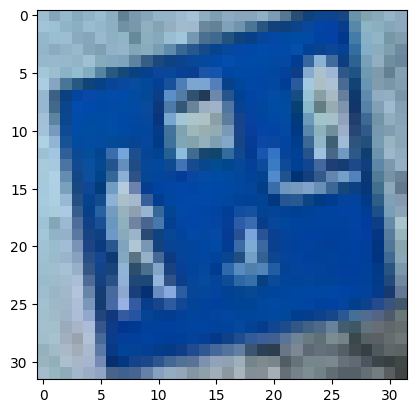

The traffic is: D-40 | Model predicted: D-40 | Class name: Strefa zamieszkania


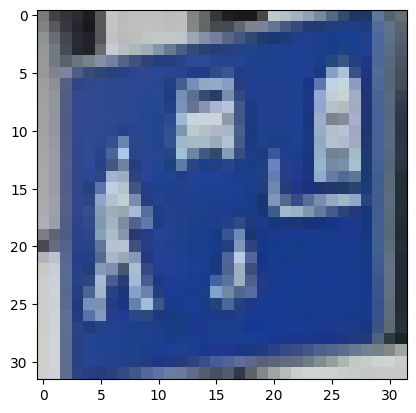

The traffic is: D-40 | Model predicted: D-40 | Class name: Strefa zamieszkania


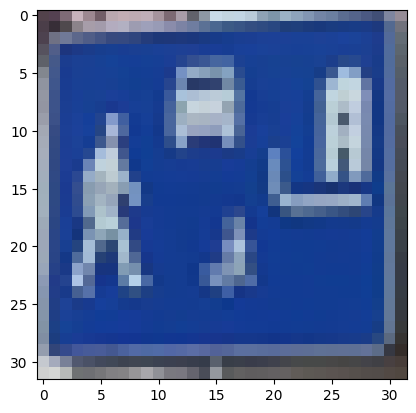

The traffic is: D-40 | Model predicted: D-40 | Class name: Strefa zamieszkania


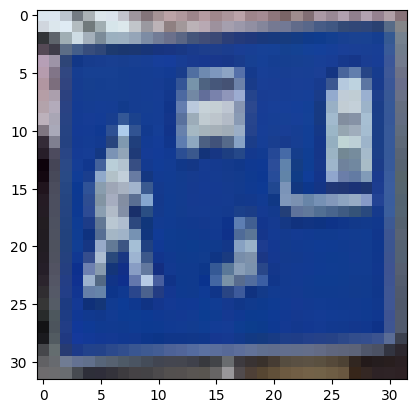

The traffic is: D-40 | Model predicted: D-40 | Class name: Strefa zamieszkania


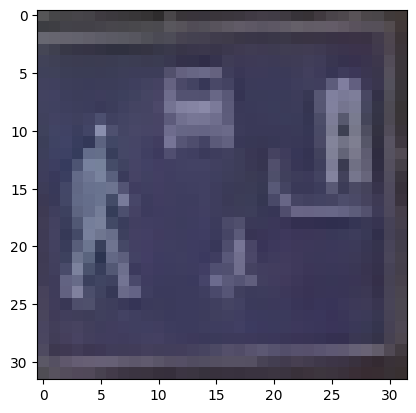

The traffic is: D-40 | Model predicted: D-40 | Class name: Strefa zamieszkania


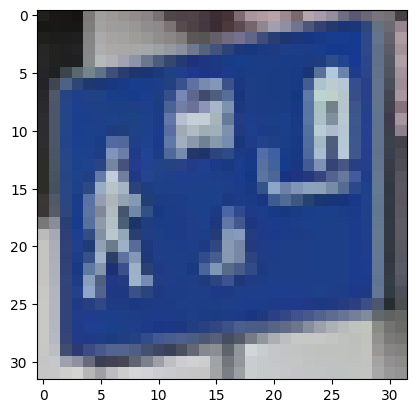

The traffic is: D-40 | Model predicted: D-40 | Class name: Strefa zamieszkania


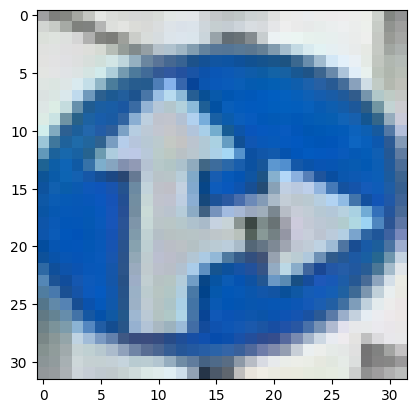

The traffic is: C-6 | Model predicted: D-26 | Class name: Stacja obsługi technicznej


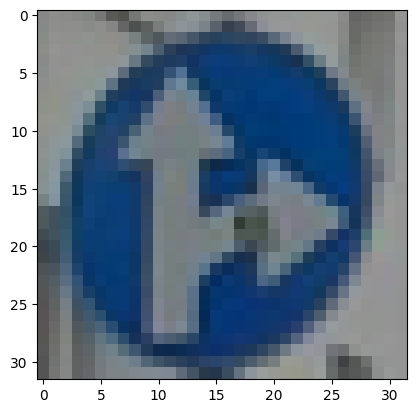

The traffic is: C-6 | Model predicted: C-9 | Class name: Nakaz jazdy z prawej strony znaku


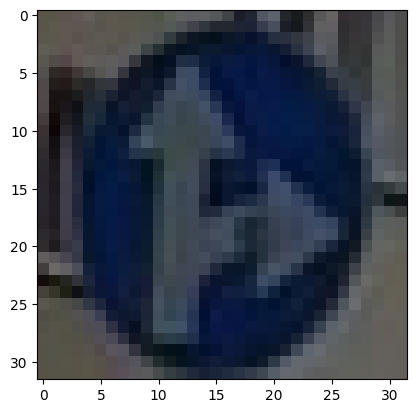

The traffic is: C-6 | Model predicted: C-9 | Class name: Nakaz jazdy z prawej strony znaku


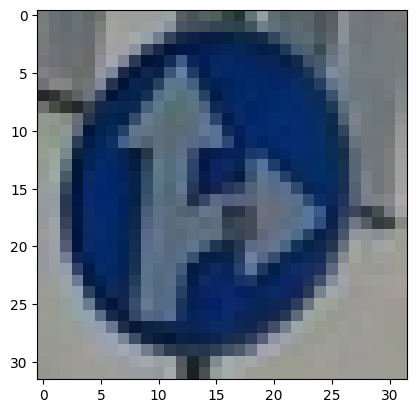

The traffic is: C-6 | Model predicted: D-18 | Class name: Parking


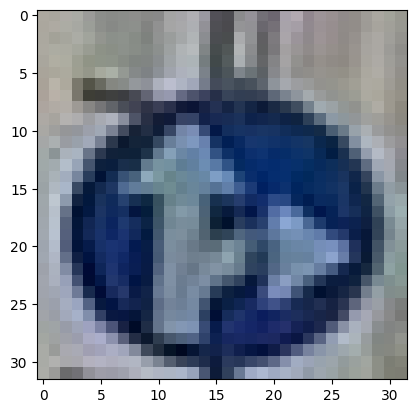

The traffic is: C-6 | Model predicted: B-33 | Class name: Ograniczenie prędkości


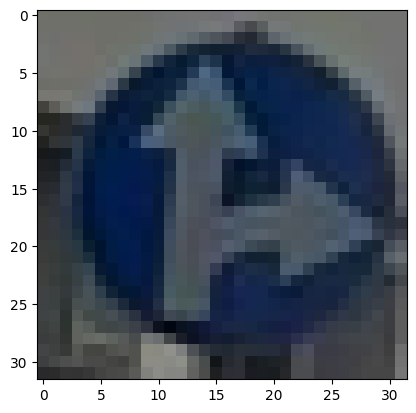

The traffic is: C-6 | Model predicted: C-9 | Class name: Nakaz jazdy z prawej strony znaku


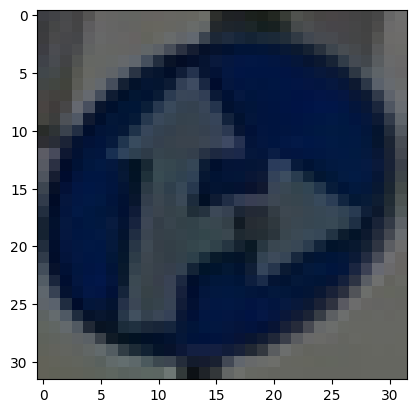

The traffic is: C-6 | Model predicted: C-6 | Class name: Nakaz jazdy prosto lub w prawo


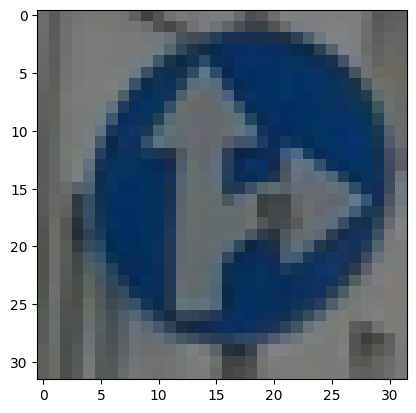

The traffic is: C-6 | Model predicted: D-3 | Class name: Droga jednokierunkowa


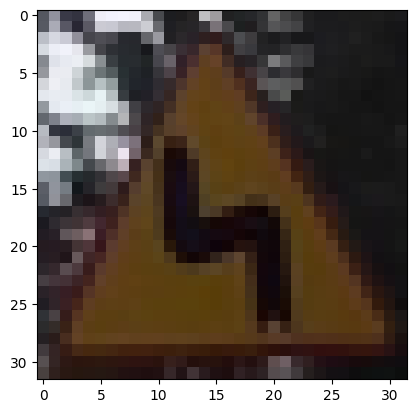

The traffic is: A-4 | Model predicted: A-4 | Class name: Niebezpieczne zakręty, pierwszy w lewo


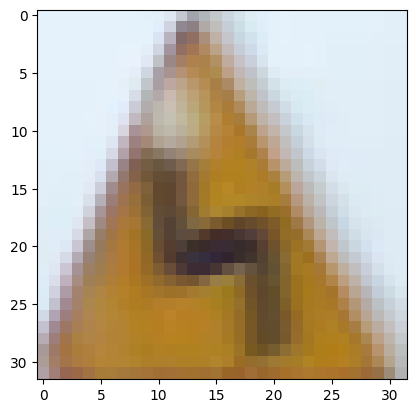

The traffic is: A-4 | Model predicted: A-32 | Class name: Oszronienie jezdni


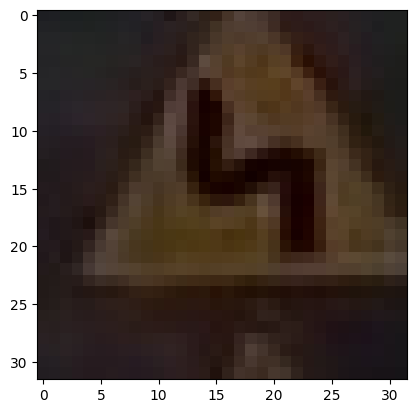

The traffic is: A-4 | Model predicted: B-33 | Class name: Ograniczenie prędkości


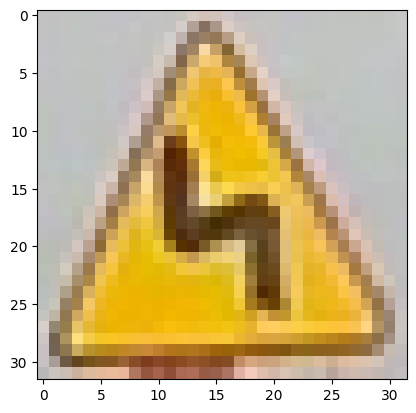

The traffic is: A-4 | Model predicted: A-4 | Class name: Niebezpieczne zakręty, pierwszy w lewo


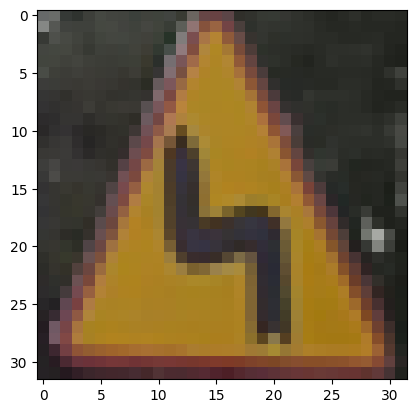

The traffic is: A-4 | Model predicted: A-4 | Class name: Niebezpieczne zakręty, pierwszy w lewo


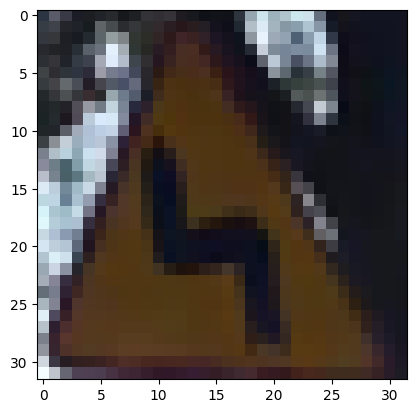

The traffic is: A-4 | Model predicted: A-32 | Class name: Oszronienie jezdni


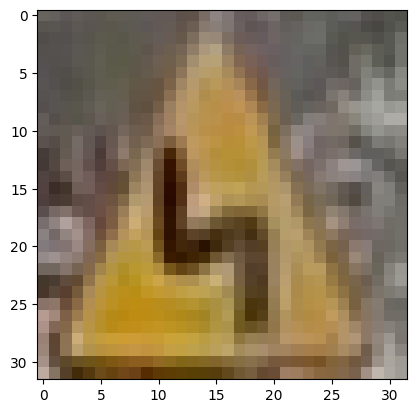

The traffic is: A-4 | Model predicted: A-4 | Class name: Niebezpieczne zakręty, pierwszy w lewo


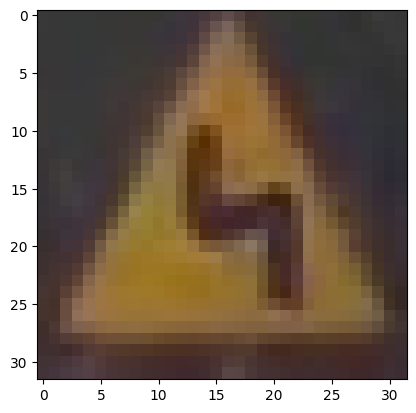

The traffic is: A-4 | Model predicted: A-4 | Class name: Niebezpieczne zakręty, pierwszy w lewo


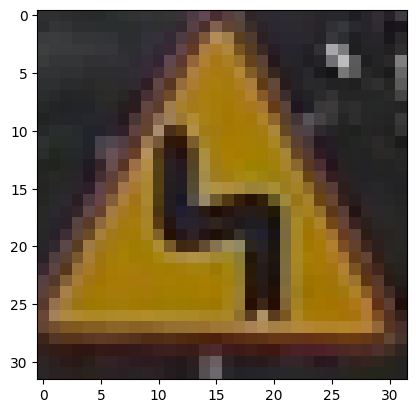

The traffic is: A-4 | Model predicted: A-4 | Class name: Niebezpieczne zakręty, pierwszy w lewo


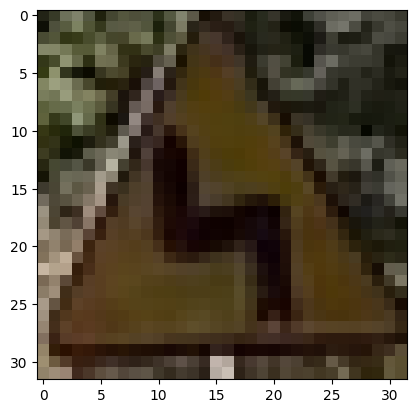

The traffic is: A-4 | Model predicted: A-4 | Class name: Niebezpieczne zakręty, pierwszy w lewo


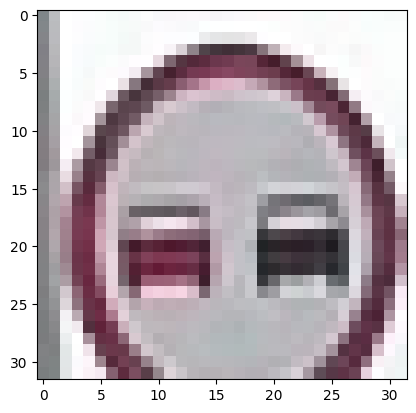

The traffic is: B-25 | Model predicted: C-5 | Class name: Nakaz jazdy prosto


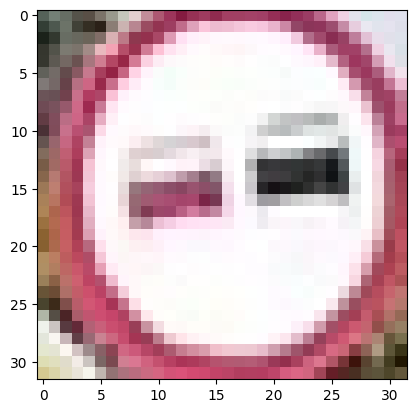

The traffic is: B-25 | Model predicted: B-25 | Class name: Zakaz wyprzedzania


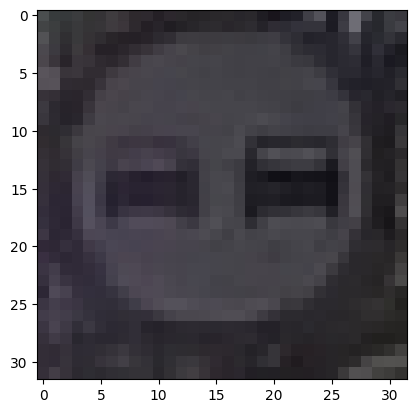

The traffic is: B-25 | Model predicted: B-25 | Class name: Zakaz wyprzedzania


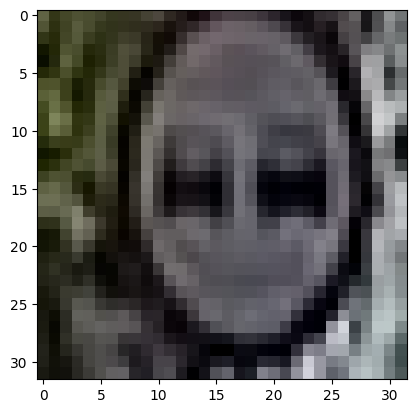

The traffic is: B-25 | Model predicted: B-25 | Class name: Zakaz wyprzedzania


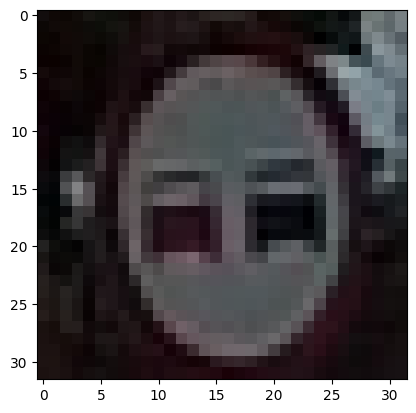

The traffic is: B-25 | Model predicted: B-25 | Class name: Zakaz wyprzedzania


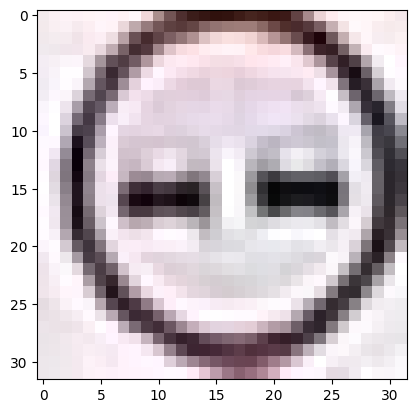

The traffic is: B-25 | Model predicted: B-25 | Class name: Zakaz wyprzedzania


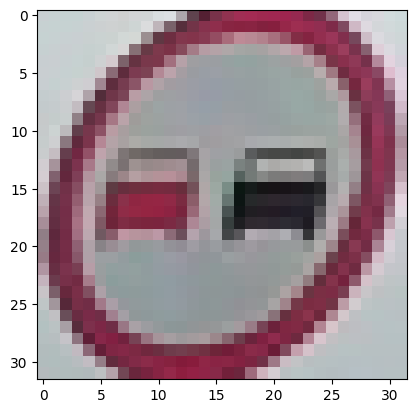

The traffic is: B-25 | Model predicted: B-25 | Class name: Zakaz wyprzedzania


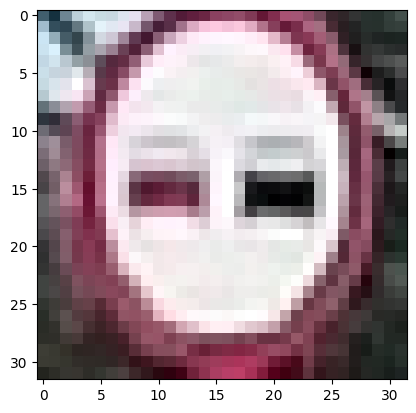

The traffic is: B-25 | Model predicted: B-25 | Class name: Zakaz wyprzedzania


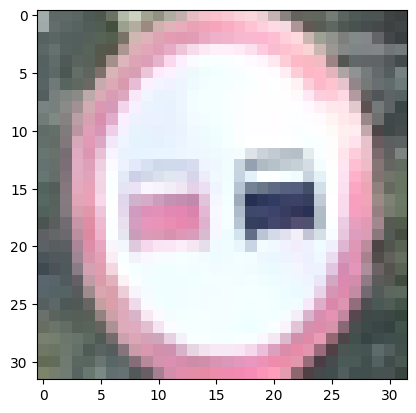

The traffic is: B-25 | Model predicted: B-25 | Class name: Zakaz wyprzedzania


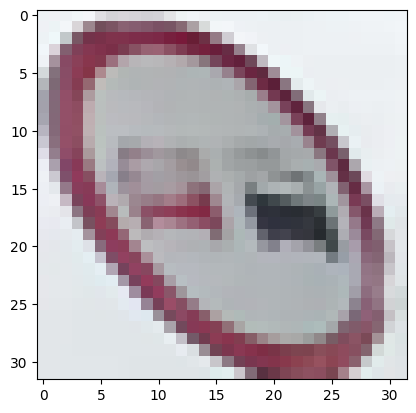

The traffic is: B-25 | Model predicted: B-25 | Class name: Zakaz wyprzedzania


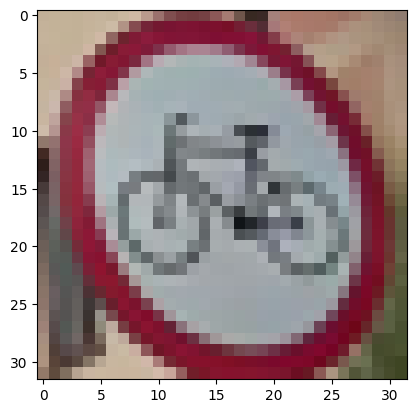

The traffic is: B-9 | Model predicted: B-9 | Class name: Zakaz wjazdu rowerów


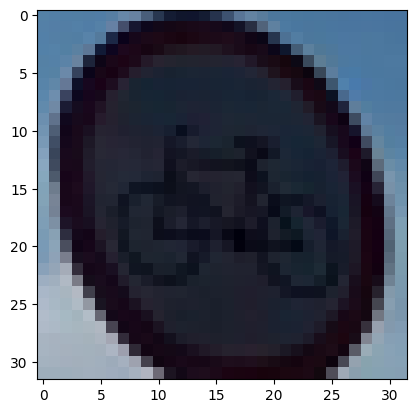

The traffic is: B-9 | Model predicted: B-9 | Class name: Zakaz wjazdu rowerów


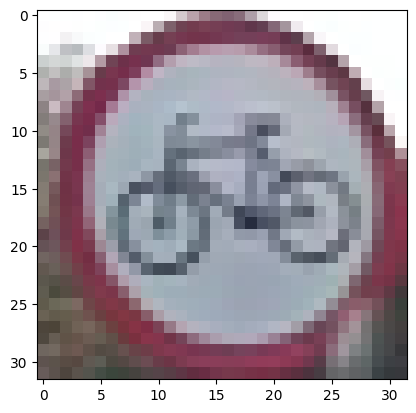

The traffic is: B-9 | Model predicted: B-9 | Class name: Zakaz wjazdu rowerów


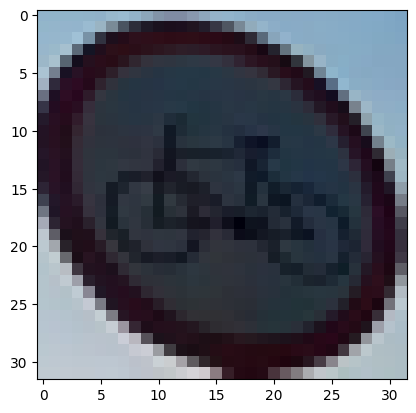

The traffic is: B-9 | Model predicted: B-9 | Class name: Zakaz wjazdu rowerów


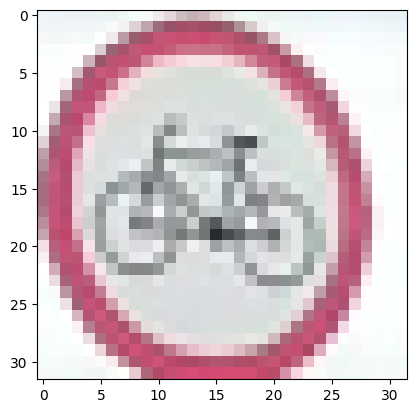

The traffic is: B-9 | Model predicted: B-9 | Class name: Zakaz wjazdu rowerów


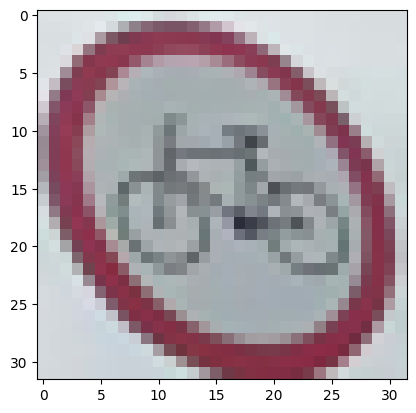

The traffic is: B-9 | Model predicted: B-9 | Class name: Zakaz wjazdu rowerów


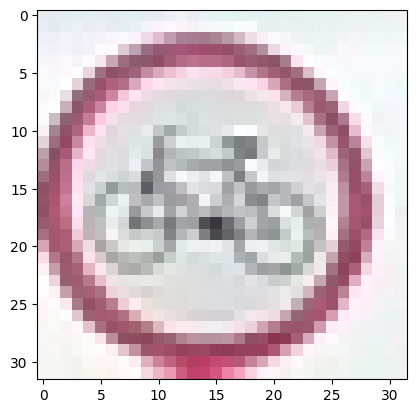

The traffic is: B-9 | Model predicted: B-9 | Class name: Zakaz wjazdu rowerów


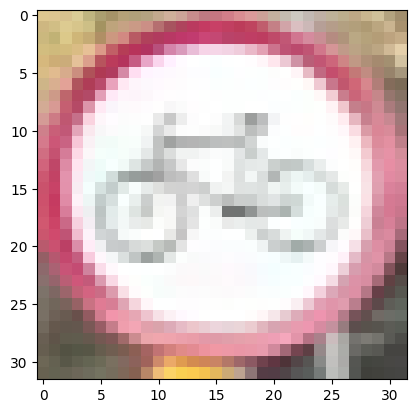

The traffic is: B-9 | Model predicted: B-9 | Class name: Zakaz wjazdu rowerów


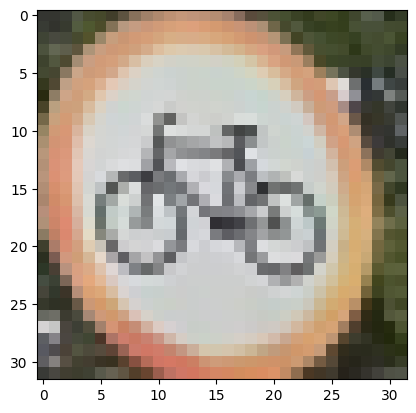

The traffic is: B-9 | Model predicted: B-33 | Class name: Ograniczenie prędkości


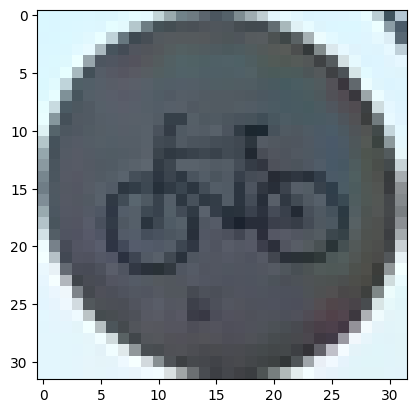

The traffic is: B-9 | Model predicted: B-9 | Class name: Zakaz wjazdu rowerów


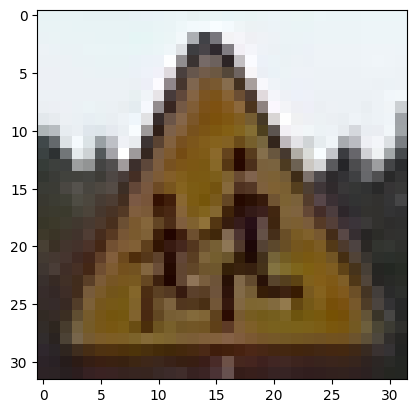

The traffic is: A-17 | Model predicted: A-17 | Class name: Dzieci


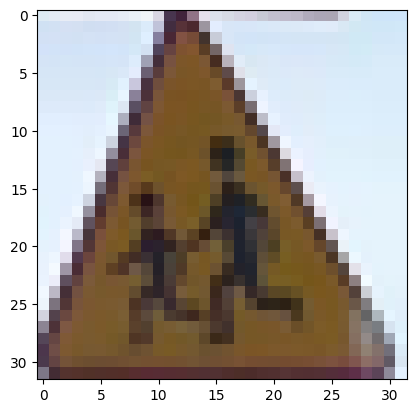

The traffic is: A-17 | Model predicted: A-17 | Class name: Dzieci


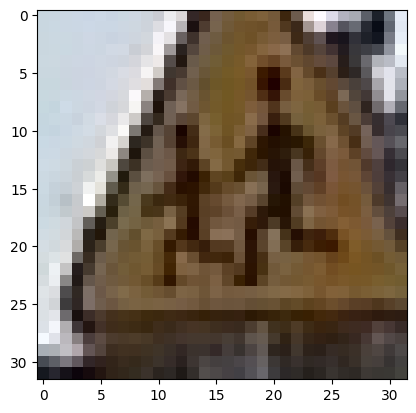

The traffic is: A-17 | Model predicted: B-33 | Class name: Ograniczenie prędkości


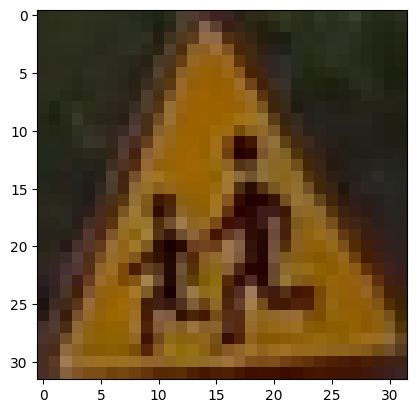

The traffic is: A-17 | Model predicted: A-17 | Class name: Dzieci


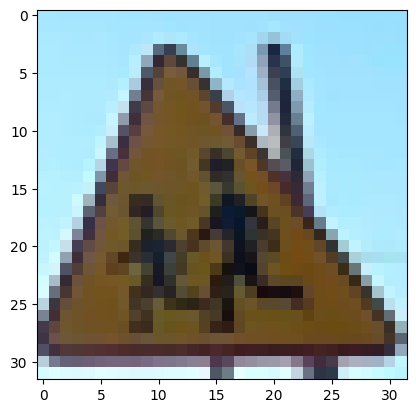

The traffic is: A-17 | Model predicted: A-17 | Class name: Dzieci


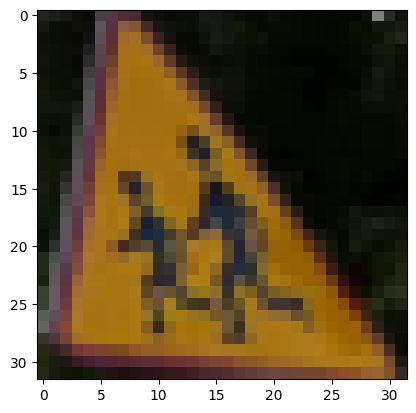

The traffic is: A-17 | Model predicted: A-17 | Class name: Dzieci


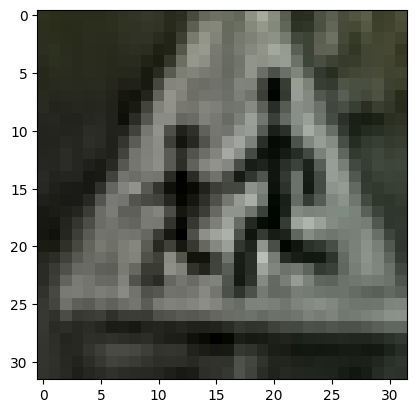

The traffic is: A-17 | Model predicted: B-33 | Class name: Ograniczenie prędkości


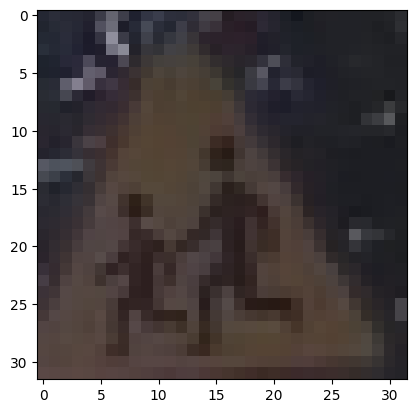

The traffic is: A-17 | Model predicted: A-17 | Class name: Dzieci


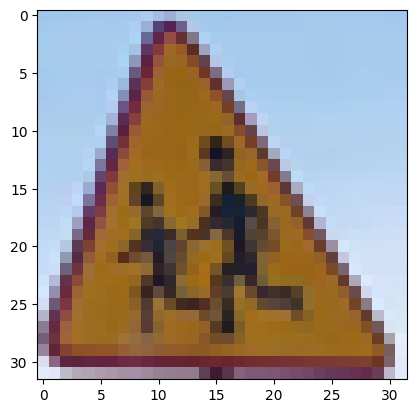

The traffic is: A-17 | Model predicted: A-17 | Class name: Dzieci


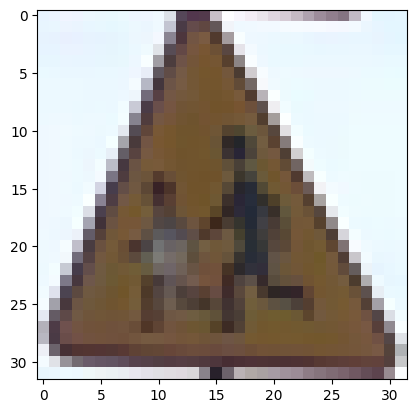

The traffic is: A-17 | Model predicted: A-17 | Class name: Dzieci


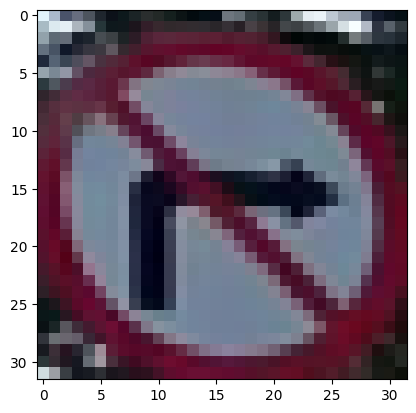

The traffic is: B-22 | Model predicted: B-22 | Class name: Zakaz skręcania w prawo


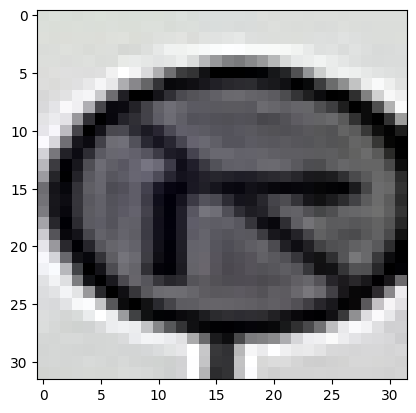

The traffic is: B-22 | Model predicted: B-33 | Class name: Ograniczenie prędkości


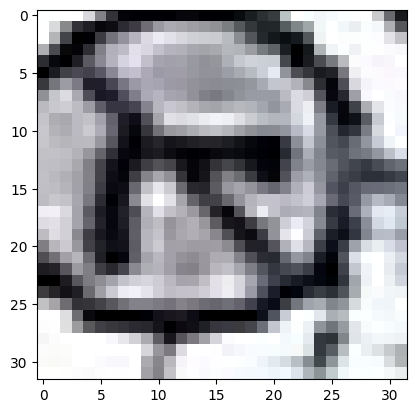

The traffic is: B-22 | Model predicted: B-33 | Class name: Ograniczenie prędkości


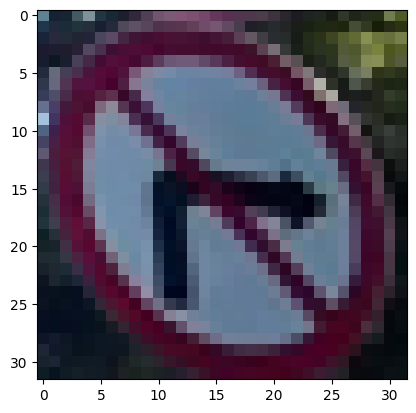

The traffic is: B-22 | Model predicted: B-22 | Class name: Zakaz skręcania w prawo


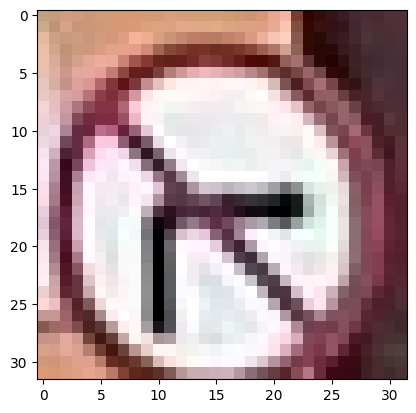

The traffic is: B-22 | Model predicted: B-22 | Class name: Zakaz skręcania w prawo


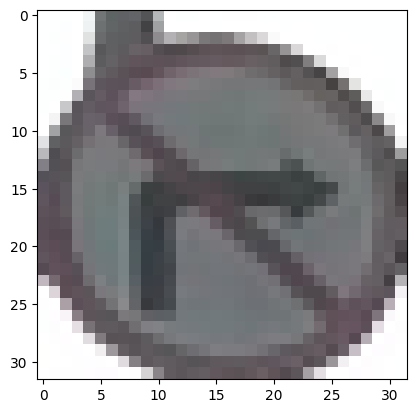

The traffic is: B-22 | Model predicted: B-22 | Class name: Zakaz skręcania w prawo


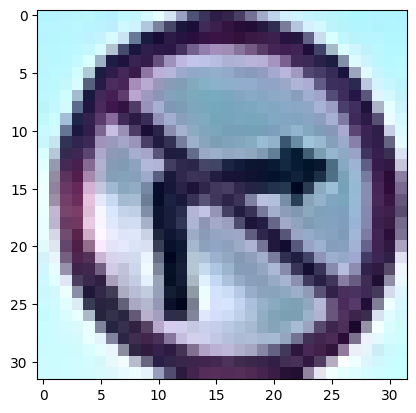

The traffic is: B-22 | Model predicted: B-22 | Class name: Zakaz skręcania w prawo


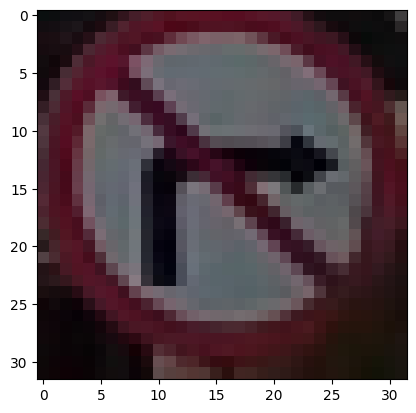

The traffic is: B-22 | Model predicted: B-22 | Class name: Zakaz skręcania w prawo


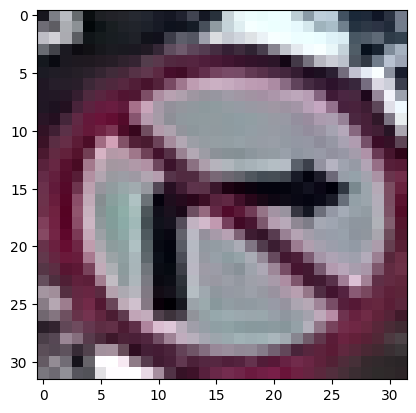

The traffic is: B-22 | Model predicted: B-43 | Class name: Strefa ograniczonej prędkości


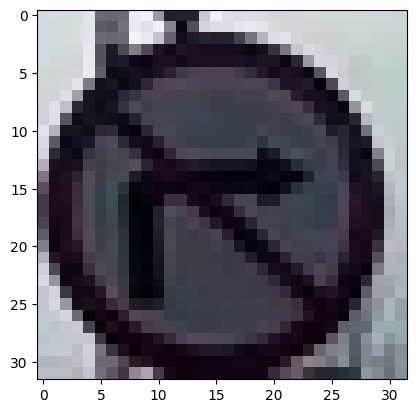

The traffic is: B-22 | Model predicted: B-22 | Class name: Zakaz skręcania w prawo


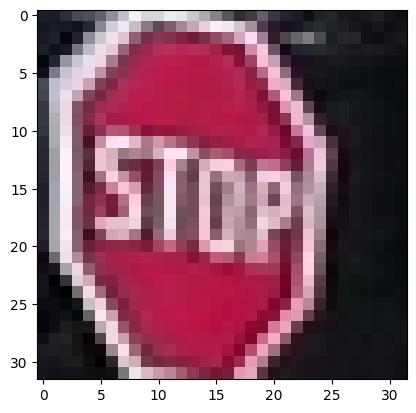

The traffic is: B-20 | Model predicted: B-20 | Class name: STOP


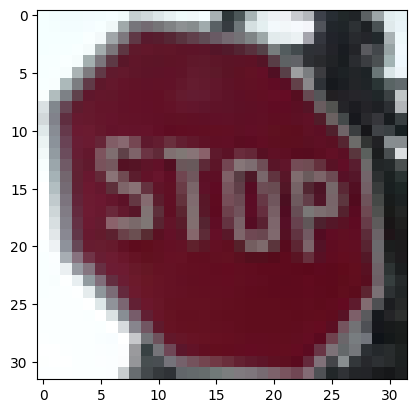

The traffic is: B-20 | Model predicted: B-20 | Class name: STOP


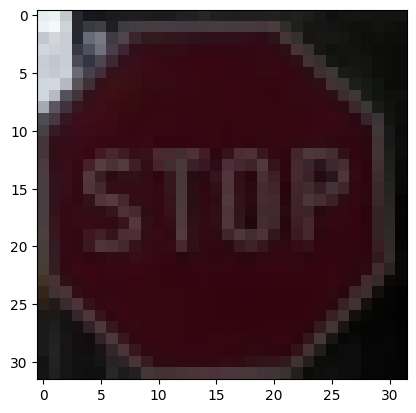

The traffic is: B-20 | Model predicted: B-20 | Class name: STOP


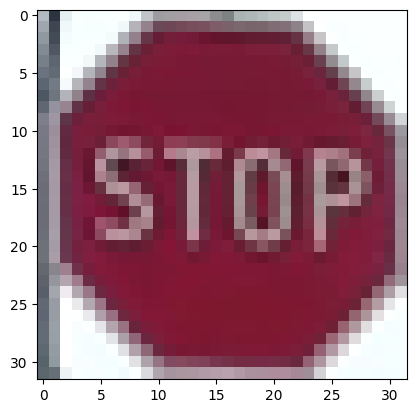

The traffic is: B-20 | Model predicted: B-20 | Class name: STOP


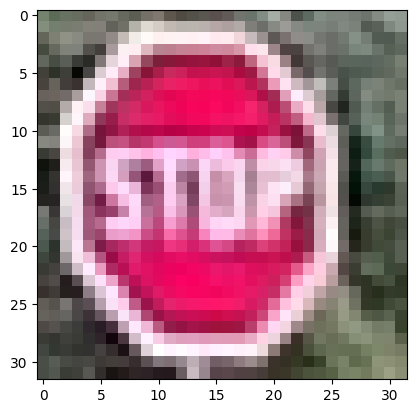

The traffic is: B-20 | Model predicted: B-20 | Class name: STOP


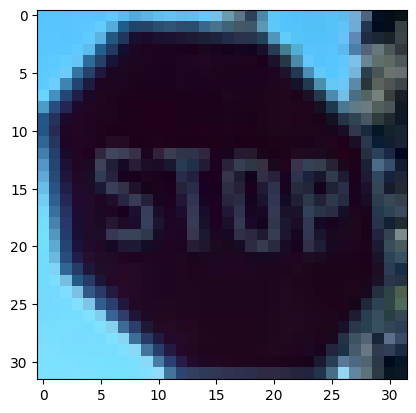

The traffic is: B-20 | Model predicted: B-20 | Class name: STOP


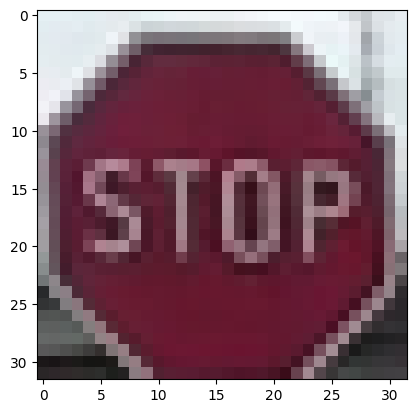

The traffic is: B-20 | Model predicted: B-20 | Class name: STOP


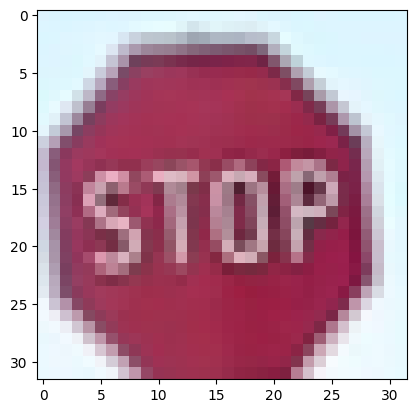

The traffic is: B-20 | Model predicted: B-20 | Class name: STOP


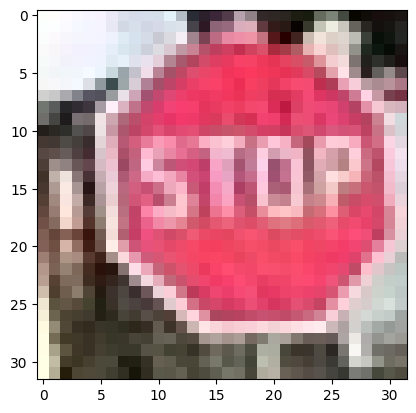

The traffic is: B-20 | Model predicted: B-20 | Class name: STOP


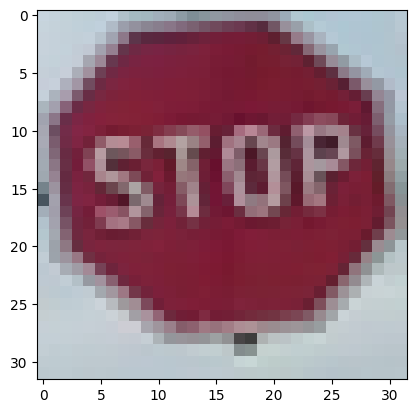

The traffic is: B-20 | Model predicted: B-20 | Class name: STOP


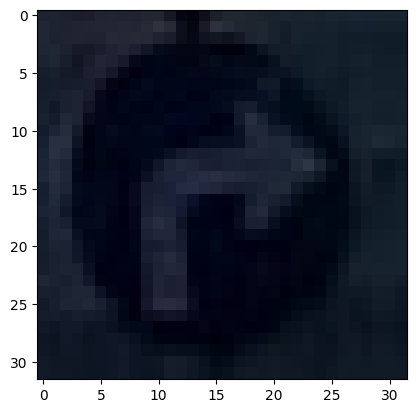

The traffic is: C-2 | Model predicted: C-2 | Class name: Nakaz jazdy w prawo za znakiem


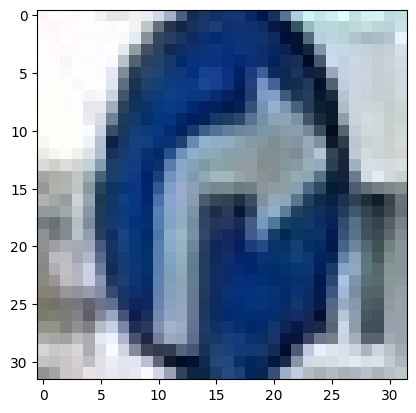

The traffic is: C-2 | Model predicted: C-2 | Class name: Nakaz jazdy w prawo za znakiem


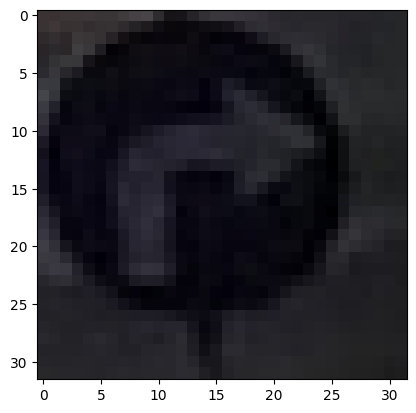

The traffic is: C-2 | Model predicted: C-5 | Class name: Nakaz jazdy prosto


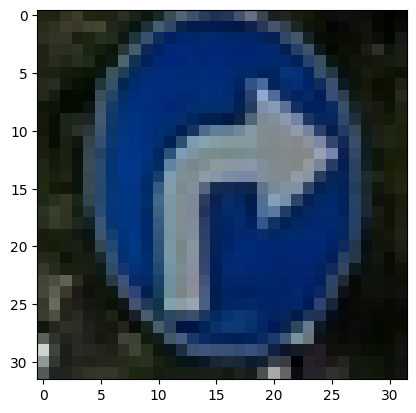

The traffic is: C-2 | Model predicted: C-2 | Class name: Nakaz jazdy w prawo za znakiem


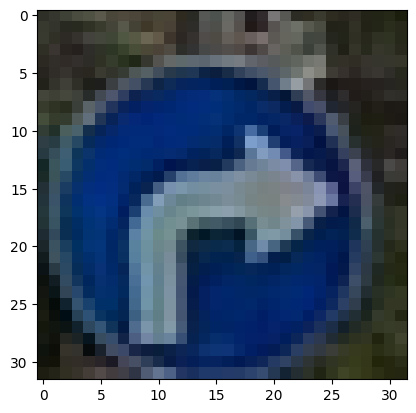

The traffic is: C-2 | Model predicted: D-7 | Class name: Droga ekspresowa


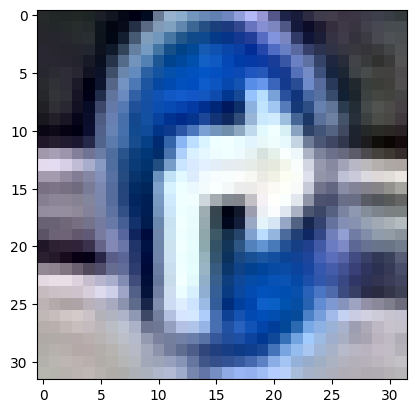

The traffic is: C-2 | Model predicted: D-42 | Class name: Obszar zabudowany


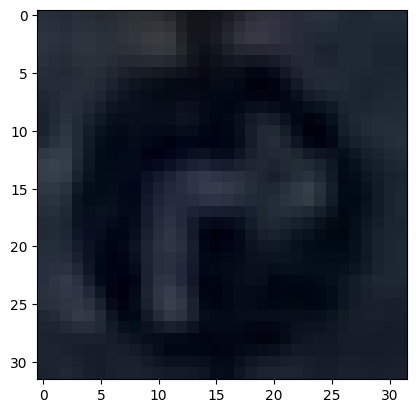

The traffic is: C-2 | Model predicted: C-2 | Class name: Nakaz jazdy w prawo za znakiem


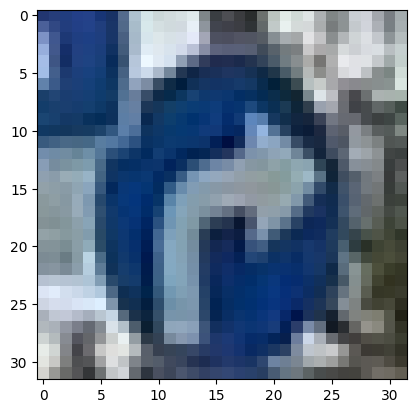

The traffic is: C-2 | Model predicted: C-2 | Class name: Nakaz jazdy w prawo za znakiem


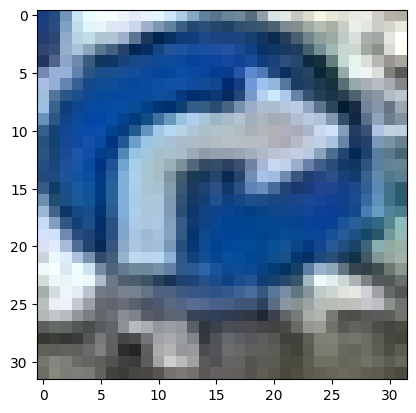

The traffic is: C-2 | Model predicted: C-5 | Class name: Nakaz jazdy prosto


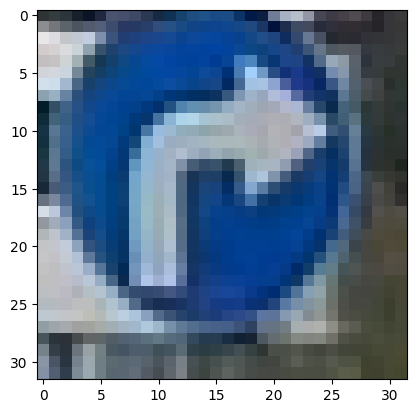

The traffic is: C-2 | Model predicted: C-5 | Class name: Nakaz jazdy prosto


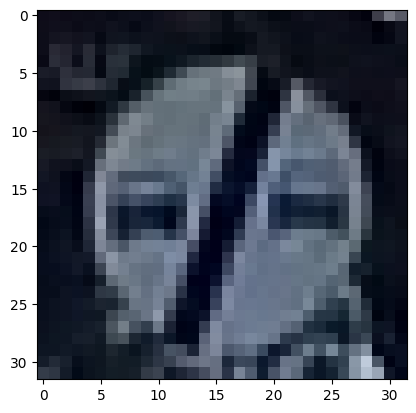

The traffic is: B-27 | Model predicted: B-27 | Class name: Koniec zakazu wyprzedzania


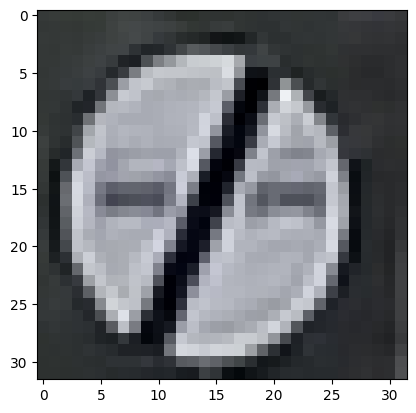

The traffic is: B-27 | Model predicted: B-27 | Class name: Koniec zakazu wyprzedzania


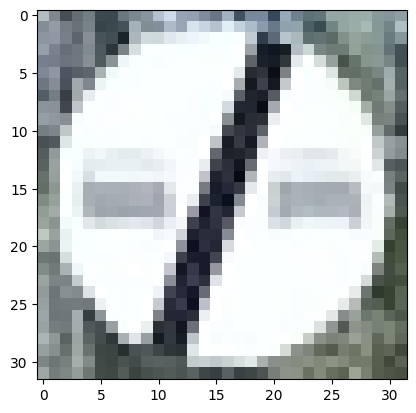

The traffic is: B-27 | Model predicted: B-27 | Class name: Koniec zakazu wyprzedzania


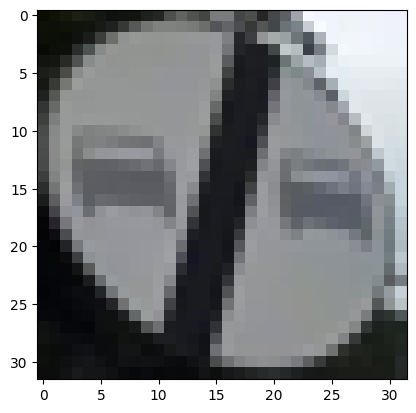

The traffic is: B-27 | Model predicted: B-27 | Class name: Koniec zakazu wyprzedzania


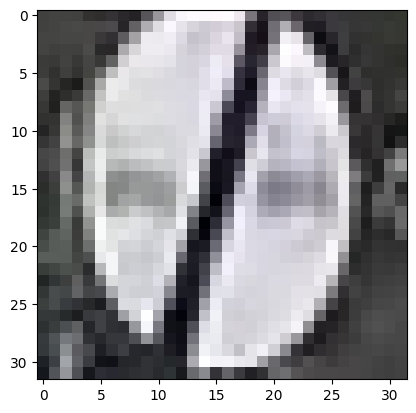

The traffic is: B-27 | Model predicted: B-27 | Class name: Koniec zakazu wyprzedzania


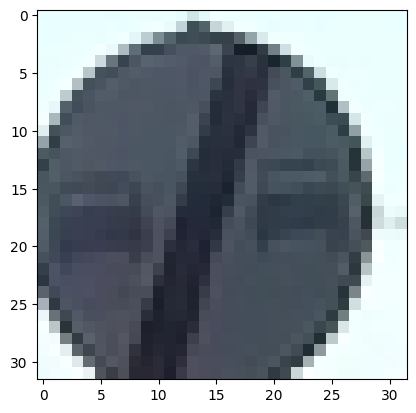

The traffic is: B-27 | Model predicted: C-5 | Class name: Nakaz jazdy prosto


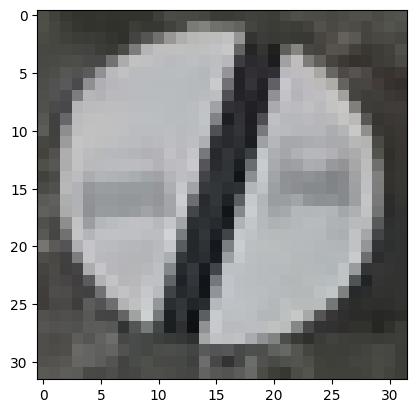

The traffic is: B-27 | Model predicted: B-27 | Class name: Koniec zakazu wyprzedzania


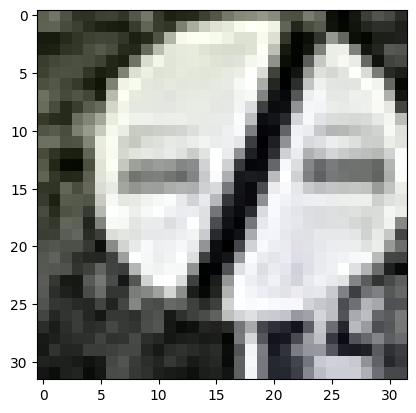

The traffic is: B-27 | Model predicted: D-23 | Class name: Stacja paliwowa


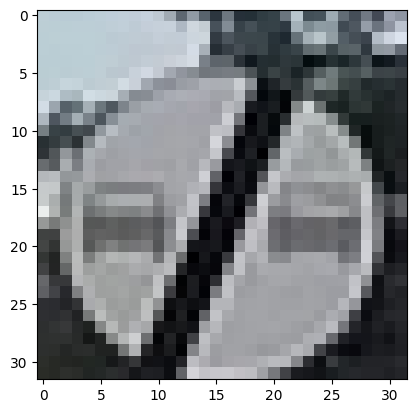

The traffic is: B-27 | Model predicted: B-42 | Class name: Koniec zakazów


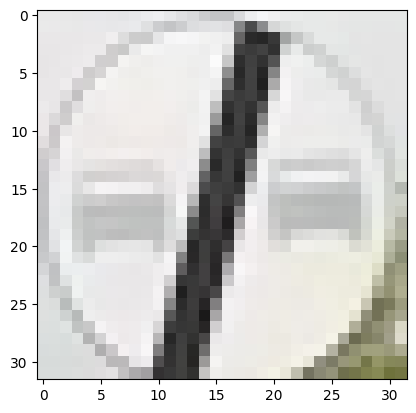

The traffic is: B-27 | Model predicted: B-27 | Class name: Koniec zakazu wyprzedzania


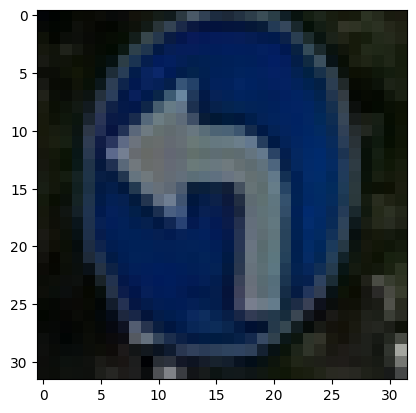

The traffic is: C-4 | Model predicted: C-4 | Class name: Nakaz jazdy w lewo za znakiem


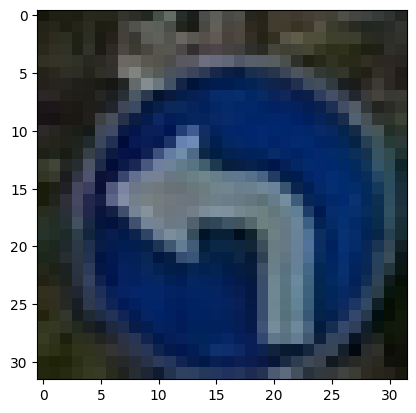

The traffic is: C-4 | Model predicted: D-7 | Class name: Droga ekspresowa


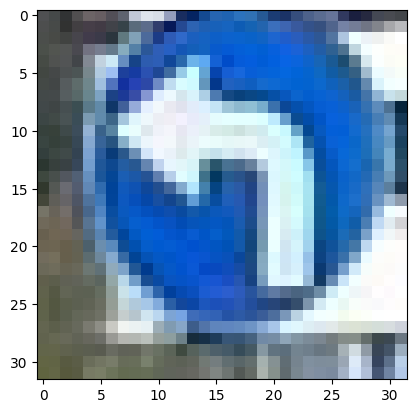

The traffic is: C-4 | Model predicted: C-5 | Class name: Nakaz jazdy prosto


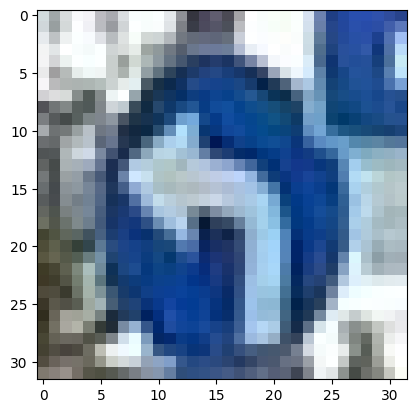

The traffic is: C-4 | Model predicted: C-9 | Class name: Nakaz jazdy z prawej strony znaku


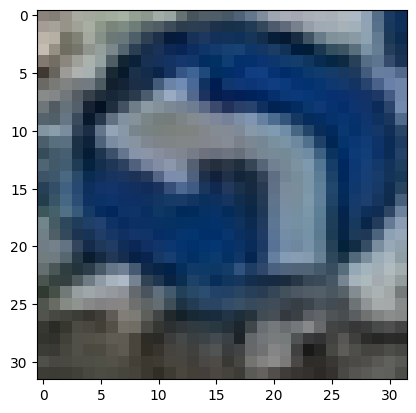

The traffic is: C-4 | Model predicted: C-9 | Class name: Nakaz jazdy z prawej strony znaku


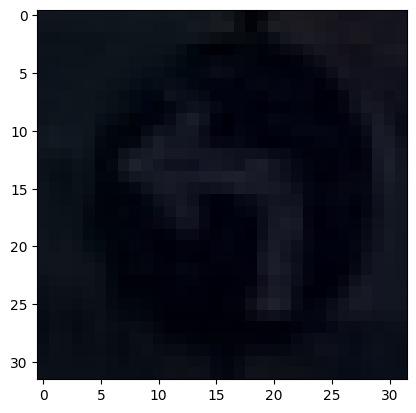

The traffic is: C-4 | Model predicted: C-4 | Class name: Nakaz jazdy w lewo za znakiem


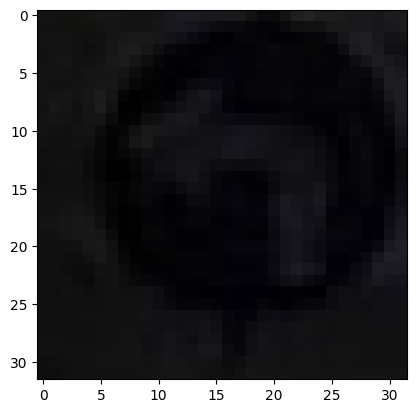

The traffic is: C-4 | Model predicted: D-42 | Class name: Obszar zabudowany


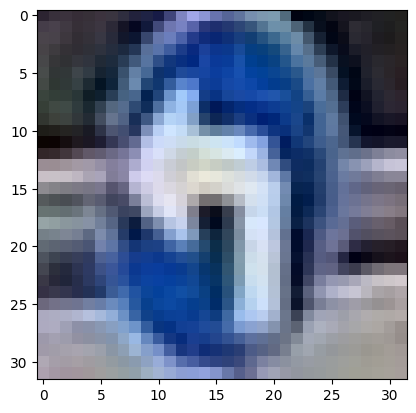

The traffic is: C-4 | Model predicted: C-4 | Class name: Nakaz jazdy w lewo za znakiem


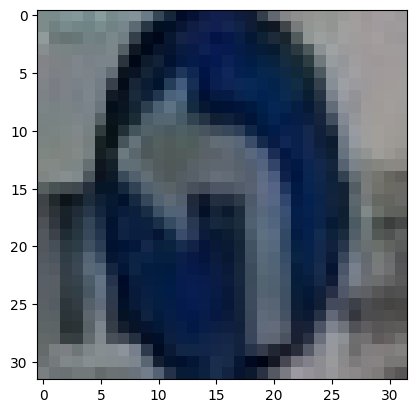

The traffic is: C-4 | Model predicted: C-4 | Class name: Nakaz jazdy w lewo za znakiem


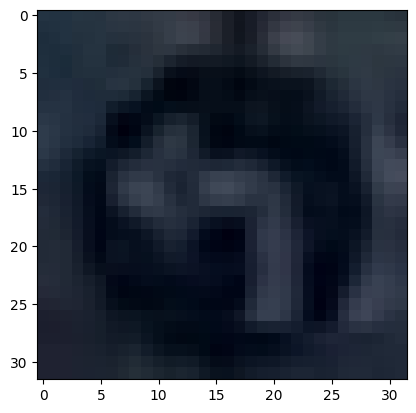

The traffic is: C-4 | Model predicted: D-7 | Class name: Droga ekspresowa


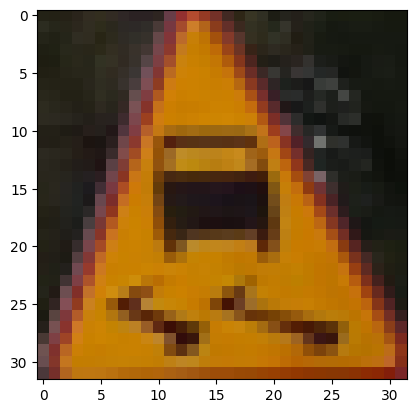

The traffic is: A-15 | Model predicted: A-15 | Class name: Śliska jezdnia


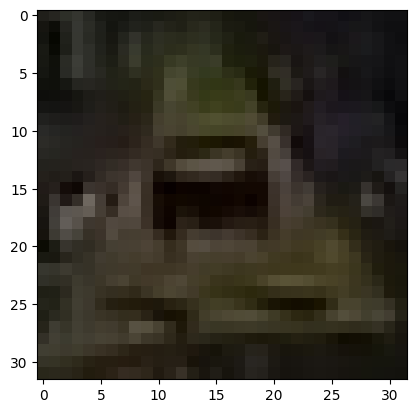

The traffic is: A-15 | Model predicted: B-33 | Class name: Ograniczenie prędkości


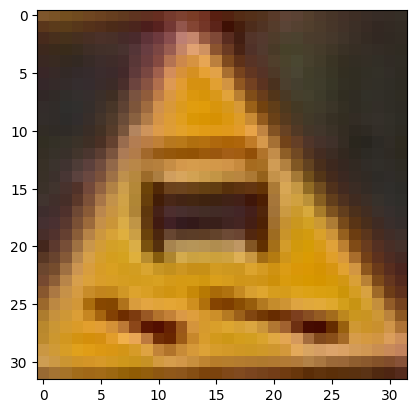

The traffic is: A-15 | Model predicted: A-32 | Class name: Oszronienie jezdni


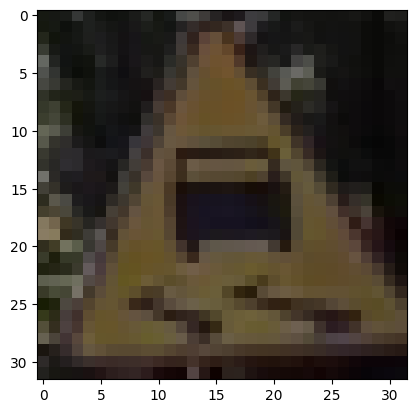

The traffic is: A-15 | Model predicted: B-33 | Class name: Ograniczenie prędkości


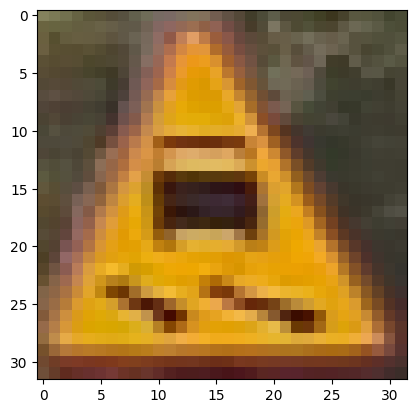

The traffic is: A-15 | Model predicted: A-15 | Class name: Śliska jezdnia


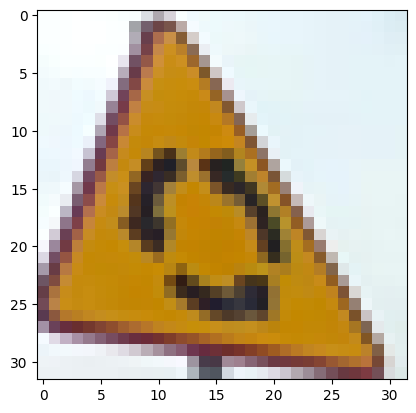

The traffic is: A-8 | Model predicted: A-8 | Class name: Skrzyżowanie o ruchu okrężnym


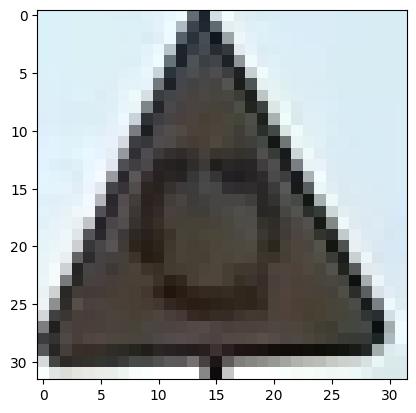

The traffic is: A-8 | Model predicted: B-43 | Class name: Strefa ograniczonej prędkości


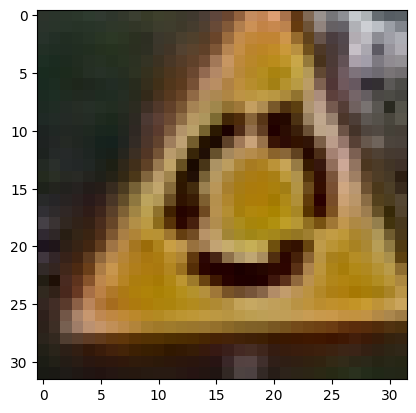

The traffic is: A-8 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


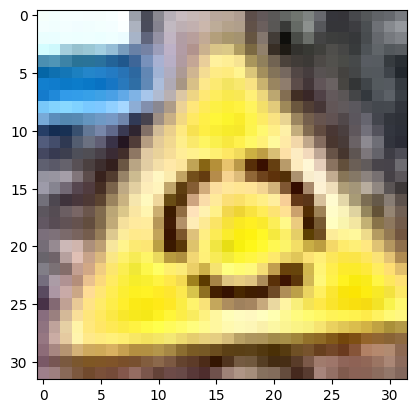

The traffic is: A-8 | Model predicted: A-8 | Class name: Skrzyżowanie o ruchu okrężnym


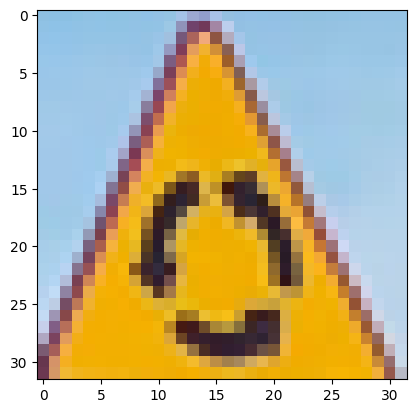

The traffic is: A-8 | Model predicted: A-17 | Class name: Dzieci


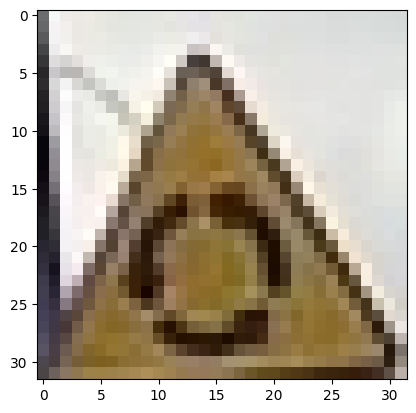

The traffic is: A-8 | Model predicted: A-17 | Class name: Dzieci


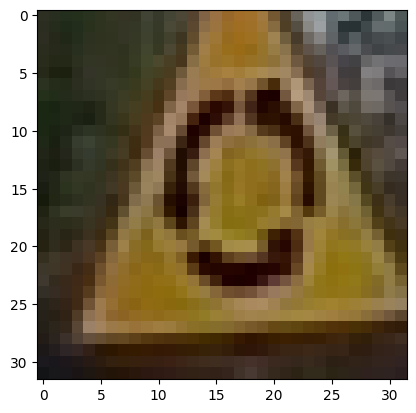

The traffic is: A-8 | Model predicted: A-32 | Class name: Oszronienie jezdni


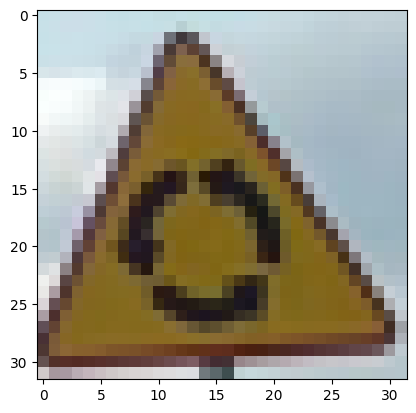

The traffic is: A-8 | Model predicted: A-8 | Class name: Skrzyżowanie o ruchu okrężnym


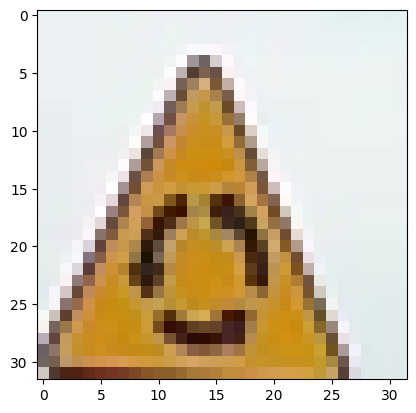

The traffic is: A-8 | Model predicted: A-17 | Class name: Dzieci


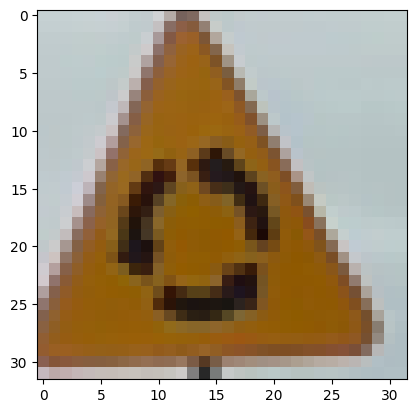

The traffic is: A-8 | Model predicted: A-20 | Class name: Odcinek jezdni o ruchu dwukierunkowym


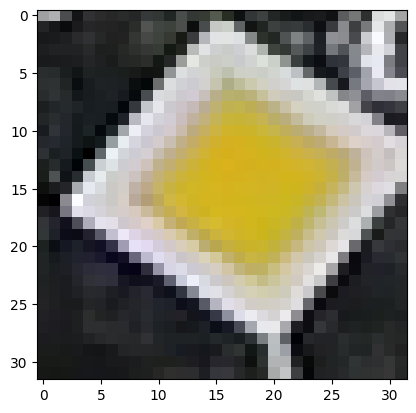

The traffic is: D-1 | Model predicted: D-1 | Class name: Droga z pierwszeństwem


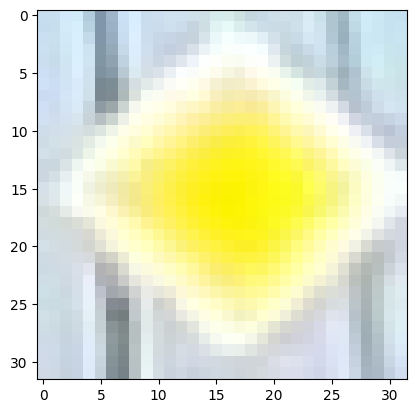

The traffic is: D-1 | Model predicted: D-1 | Class name: Droga z pierwszeństwem


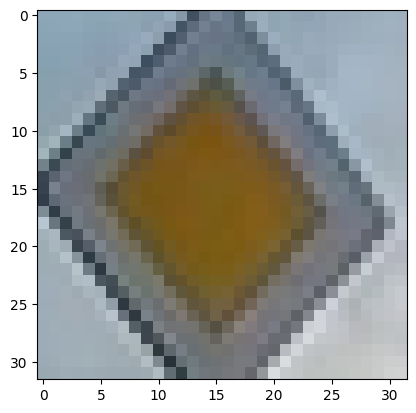

The traffic is: D-1 | Model predicted: D-1 | Class name: Droga z pierwszeństwem


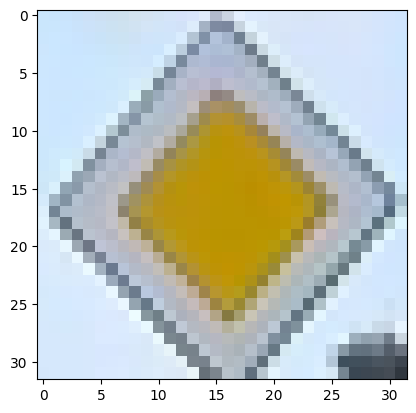

The traffic is: D-1 | Model predicted: D-1 | Class name: Droga z pierwszeństwem


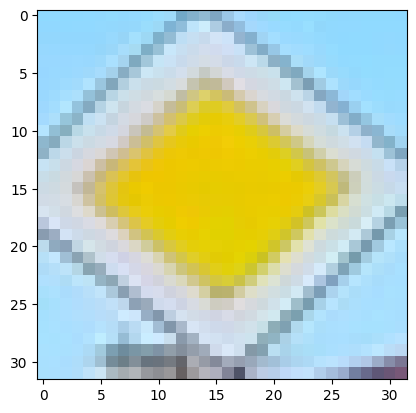

The traffic is: D-1 | Model predicted: D-1 | Class name: Droga z pierwszeństwem


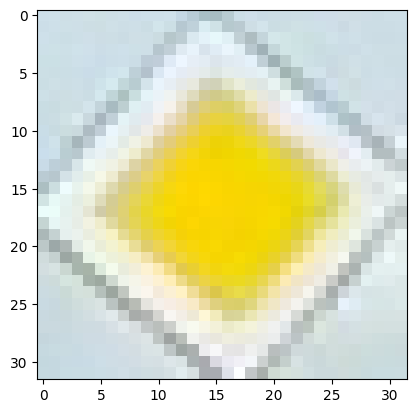

The traffic is: D-1 | Model predicted: D-1 | Class name: Droga z pierwszeństwem


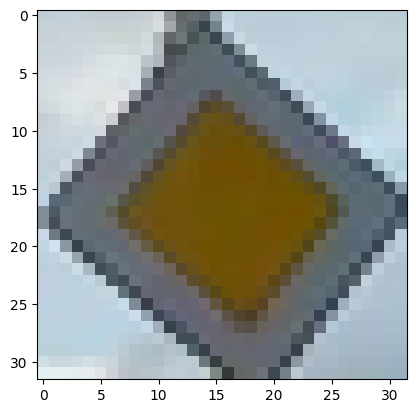

The traffic is: D-1 | Model predicted: D-1 | Class name: Droga z pierwszeństwem


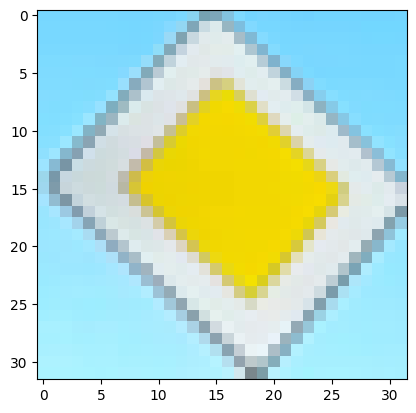

The traffic is: D-1 | Model predicted: D-1 | Class name: Droga z pierwszeństwem


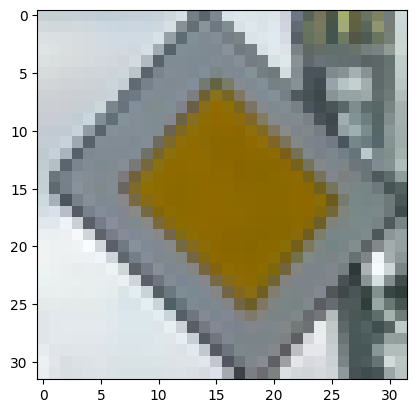

The traffic is: D-1 | Model predicted: D-1 | Class name: Droga z pierwszeństwem


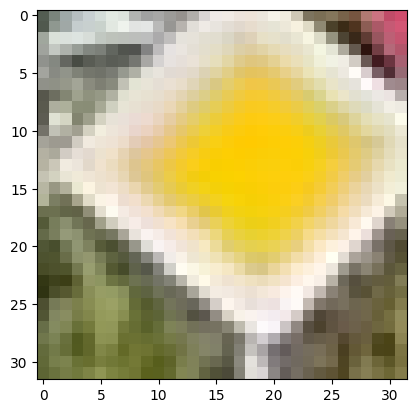

The traffic is: D-1 | Model predicted: D-1 | Class name: Droga z pierwszeństwem


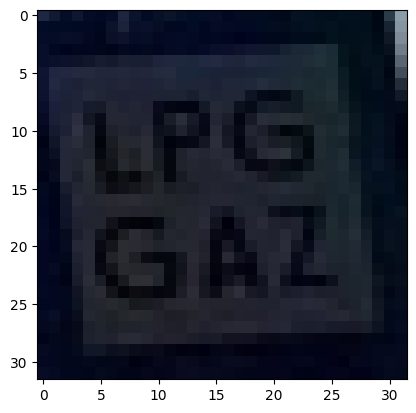

The traffic is: D-23a | Model predicted: D-23a | Class name: Stacja paliwowa tylko z gazem do napędu pojazdów


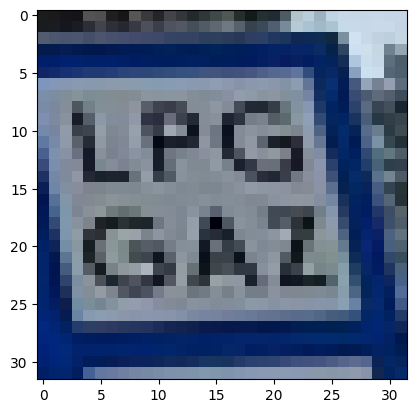

The traffic is: D-23a | Model predicted: D-23a | Class name: Stacja paliwowa tylko z gazem do napędu pojazdów


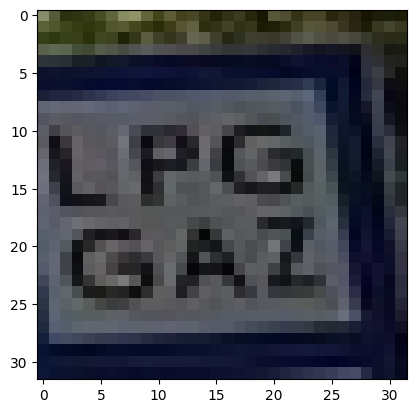

The traffic is: D-23a | Model predicted: D-23a | Class name: Stacja paliwowa tylko z gazem do napędu pojazdów


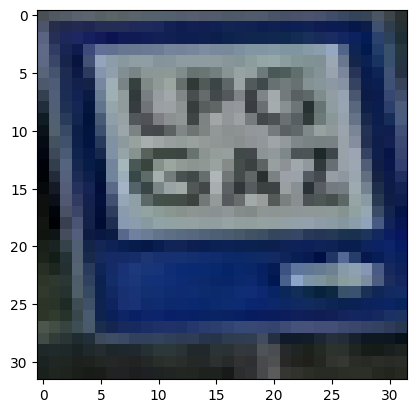

The traffic is: D-23a | Model predicted: D-23a | Class name: Stacja paliwowa tylko z gazem do napędu pojazdów


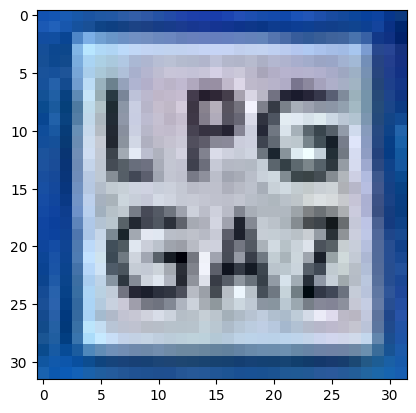

The traffic is: D-23a | Model predicted: D-23a | Class name: Stacja paliwowa tylko z gazem do napędu pojazdów


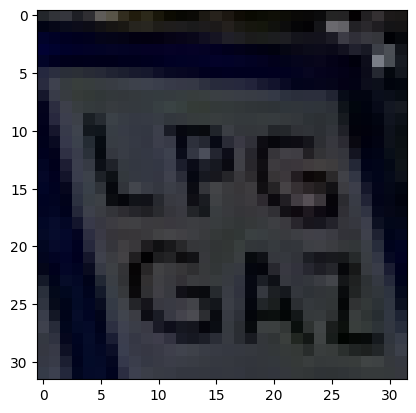

The traffic is: D-23a | Model predicted: B-33 | Class name: Ograniczenie prędkości


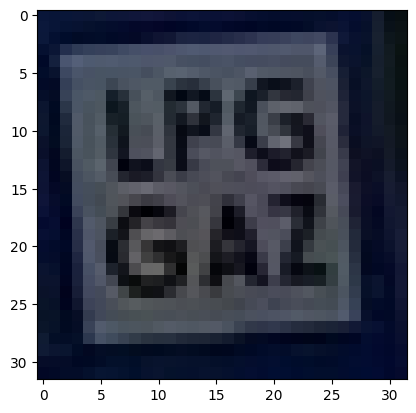

The traffic is: D-23a | Model predicted: D-23a | Class name: Stacja paliwowa tylko z gazem do napędu pojazdów


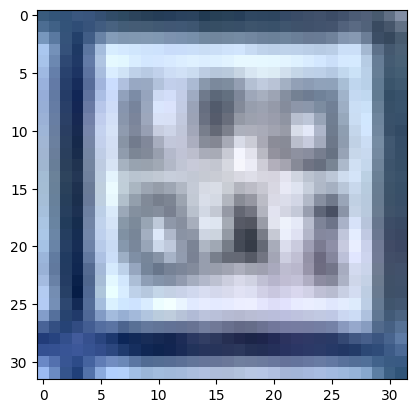

The traffic is: D-23a | Model predicted: D-23a | Class name: Stacja paliwowa tylko z gazem do napędu pojazdów


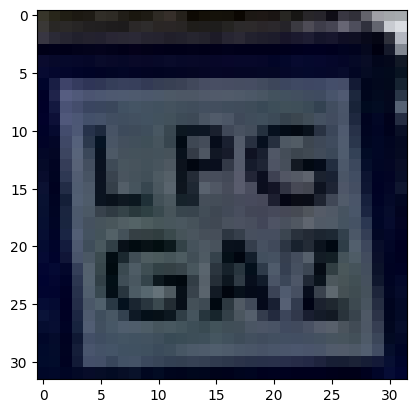

The traffic is: D-23a | Model predicted: D-23a | Class name: Stacja paliwowa tylko z gazem do napędu pojazdów


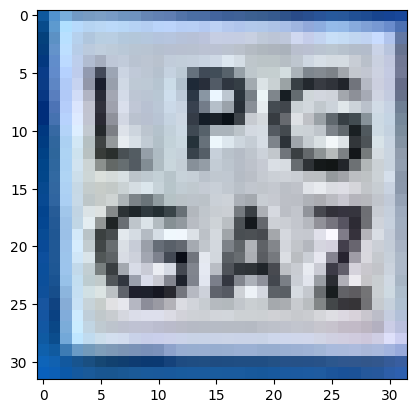

The traffic is: D-23a | Model predicted: D-23a | Class name: Stacja paliwowa tylko z gazem do napędu pojazdów


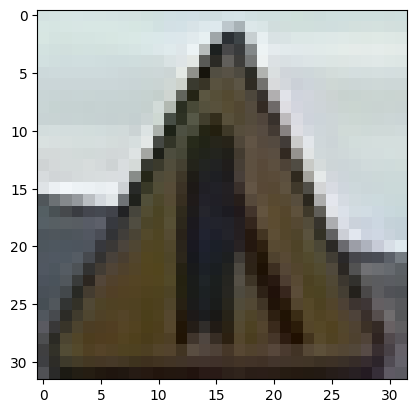

The traffic is: A-6d | Model predicted: A-6d | Class name: Wlot drogi jednokierunkowej z prawej strony


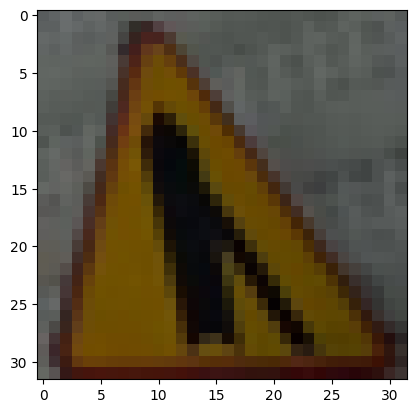

The traffic is: A-6d | Model predicted: A-6d | Class name: Wlot drogi jednokierunkowej z prawej strony


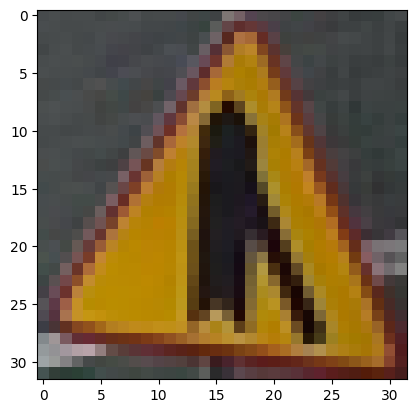

The traffic is: A-6d | Model predicted: A-6d | Class name: Wlot drogi jednokierunkowej z prawej strony


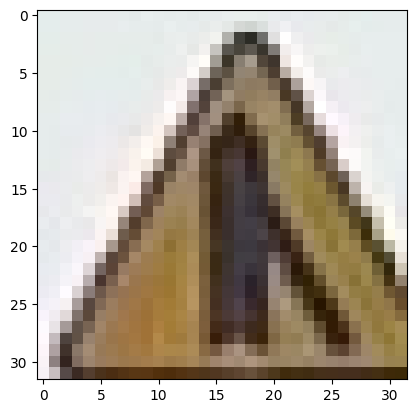

The traffic is: A-6d | Model predicted: A-6a | Class name: Skrzyżowanie z drogą podporządkowaną występującą po obu stronach


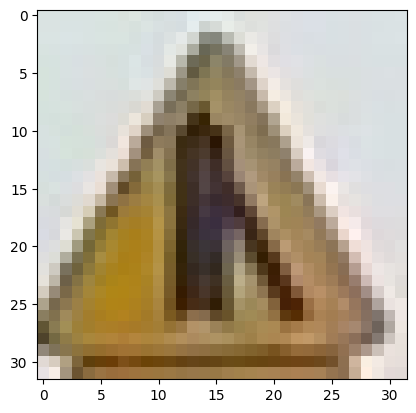

The traffic is: A-6d | Model predicted: A-6d | Class name: Wlot drogi jednokierunkowej z prawej strony


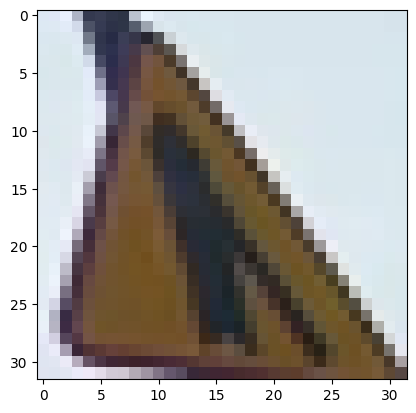

The traffic is: A-6d | Model predicted: A-6d | Class name: Wlot drogi jednokierunkowej z prawej strony


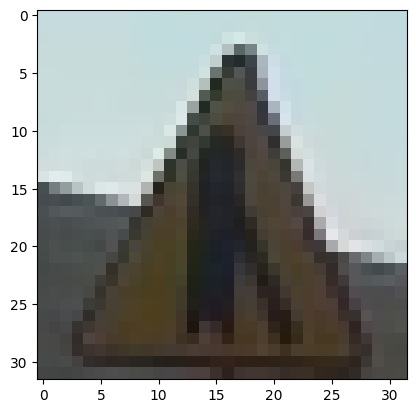

The traffic is: A-6d | Model predicted: A-6a | Class name: Skrzyżowanie z drogą podporządkowaną występującą po obu stronach


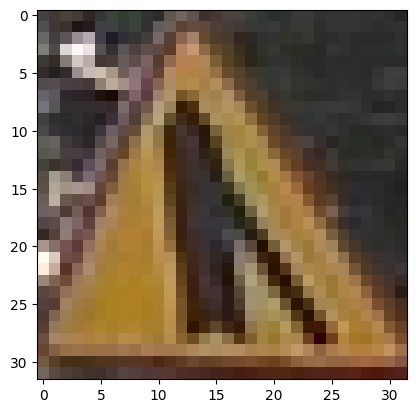

The traffic is: A-6d | Model predicted: A-6d | Class name: Wlot drogi jednokierunkowej z prawej strony


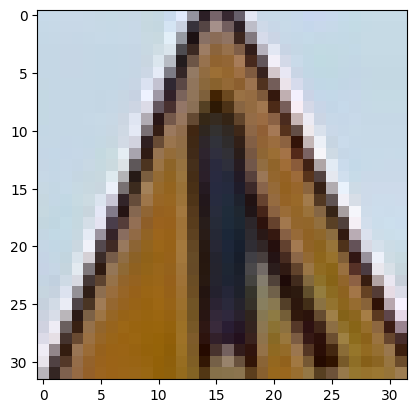

The traffic is: A-6d | Model predicted: A-6d | Class name: Wlot drogi jednokierunkowej z prawej strony


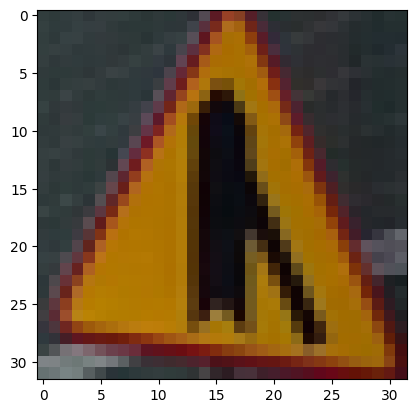

The traffic is: A-6d | Model predicted: A-6d | Class name: Wlot drogi jednokierunkowej z prawej strony


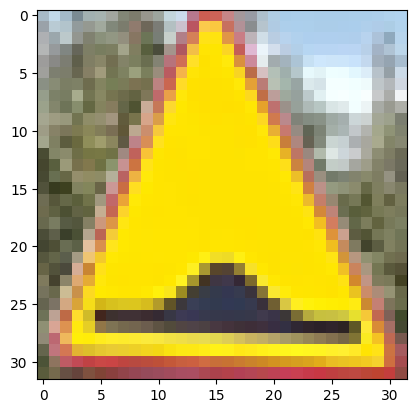

The traffic is: A-11a | Model predicted: A-32 | Class name: Oszronienie jezdni


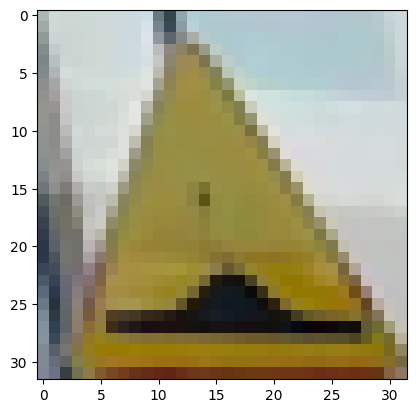

The traffic is: A-11a | Model predicted: A-32 | Class name: Oszronienie jezdni


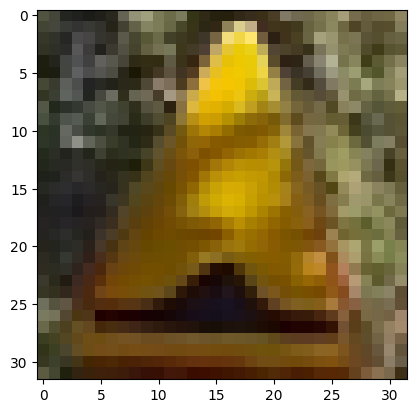

The traffic is: A-11a | Model predicted: A-29 | Class name: Sygnały świetlne


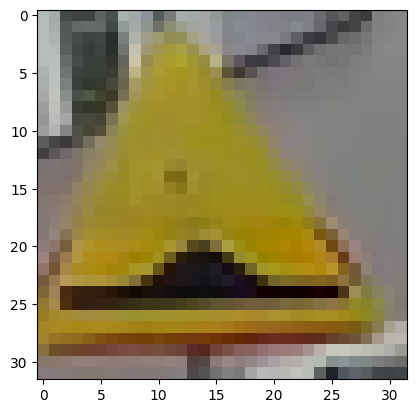

The traffic is: A-11a | Model predicted: D-1 | Class name: Droga z pierwszeństwem


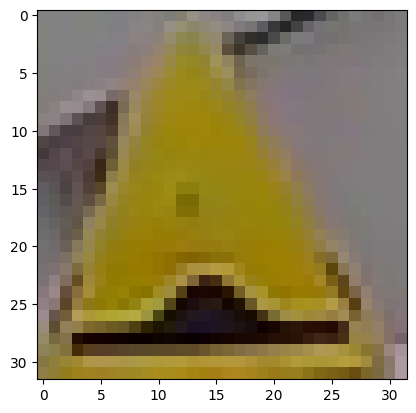

The traffic is: A-11a | Model predicted: A-29 | Class name: Sygnały świetlne


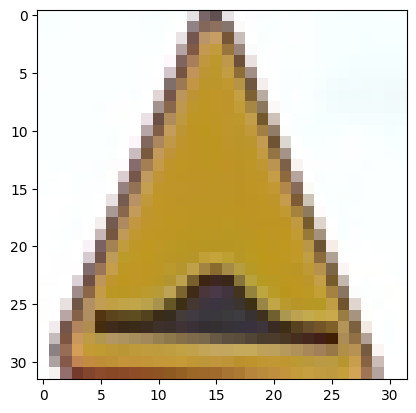

The traffic is: A-11a | Model predicted: A-29 | Class name: Sygnały świetlne


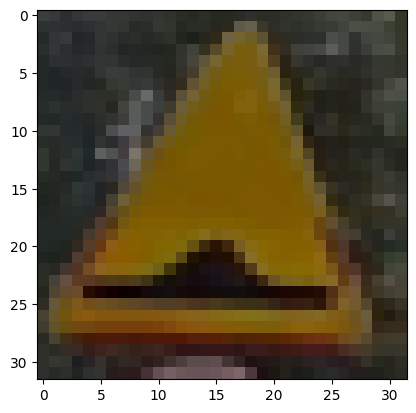

The traffic is: A-11a | Model predicted: D-1 | Class name: Droga z pierwszeństwem


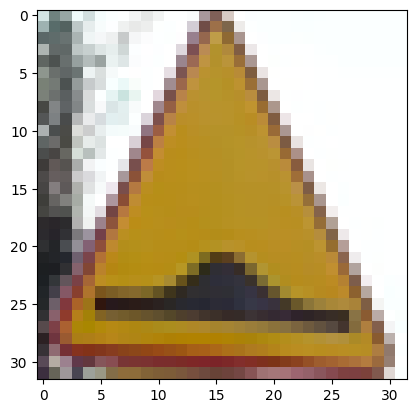

The traffic is: A-11a | Model predicted: A-11a | Class name: Próg zwalniający


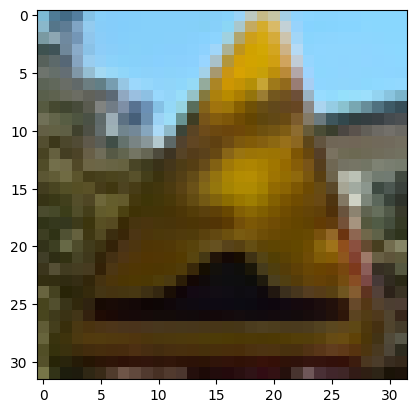

The traffic is: A-11a | Model predicted: D-1 | Class name: Droga z pierwszeństwem


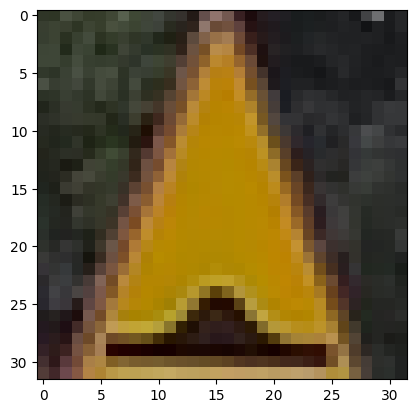

The traffic is: A-11a | Model predicted: D-1 | Class name: Droga z pierwszeństwem


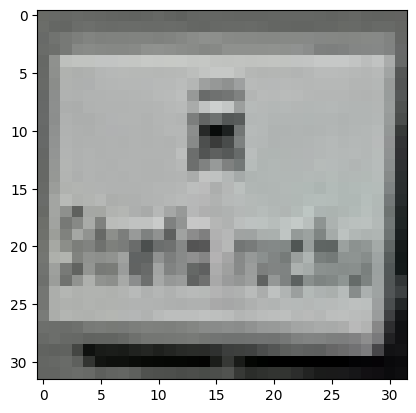

The traffic is: D-52 | Model predicted: D-52 | Class name: Strefa ruchu


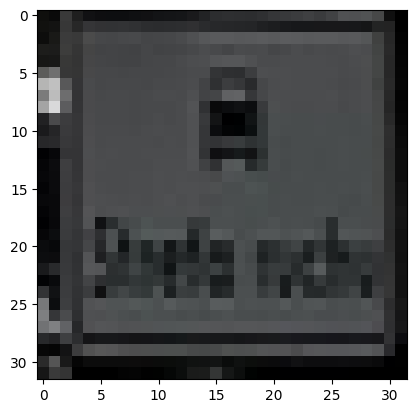

The traffic is: D-52 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


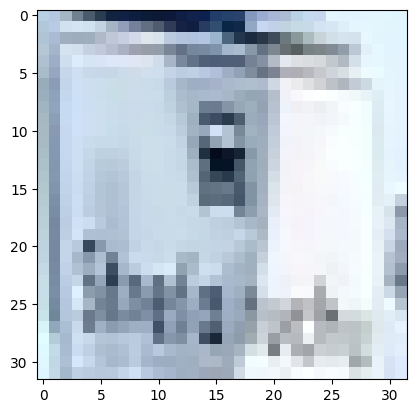

The traffic is: D-52 | Model predicted: A-16 | Class name: Przejście dla pieszych


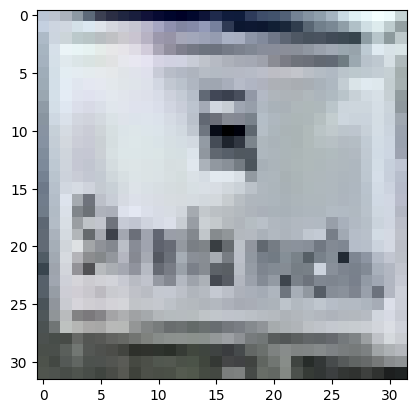

The traffic is: D-52 | Model predicted: D-52 | Class name: Strefa ruchu


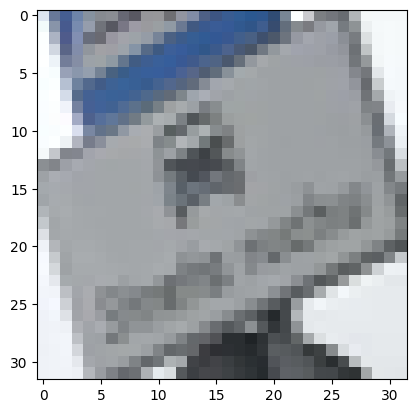

The traffic is: D-52 | Model predicted: B-33 | Class name: Ograniczenie prędkości


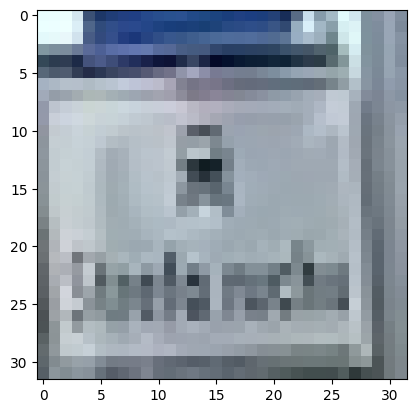

The traffic is: D-52 | Model predicted: B-33 | Class name: Ograniczenie prędkości


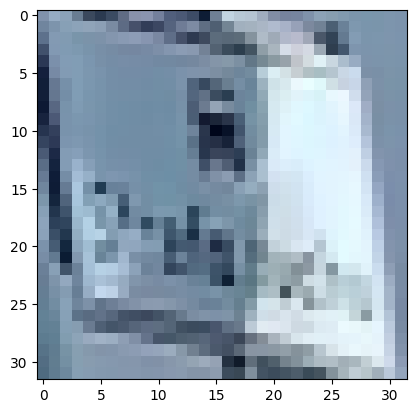

The traffic is: D-52 | Model predicted: D-23 | Class name: Stacja paliwowa


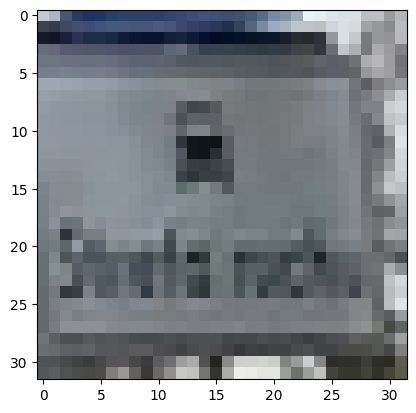

The traffic is: D-52 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


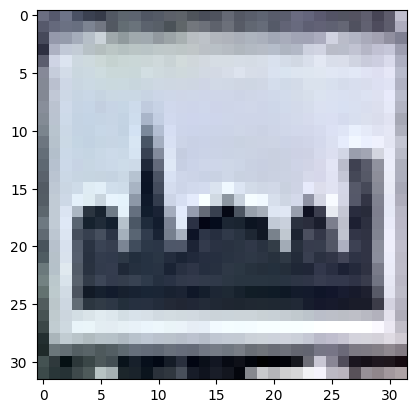

The traffic is: D-42 | Model predicted: D-42 | Class name: Obszar zabudowany


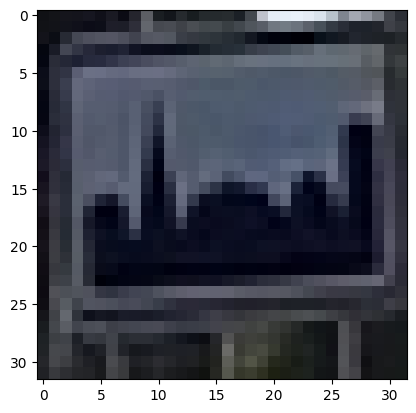

The traffic is: D-42 | Model predicted: D-42 | Class name: Obszar zabudowany


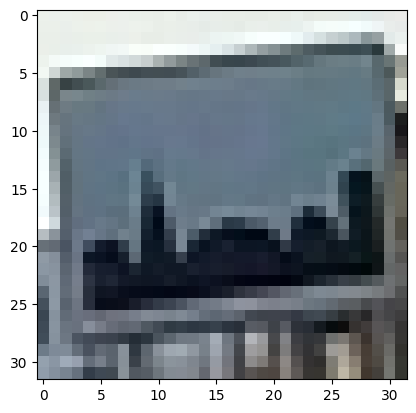

The traffic is: D-42 | Model predicted: D-42 | Class name: Obszar zabudowany


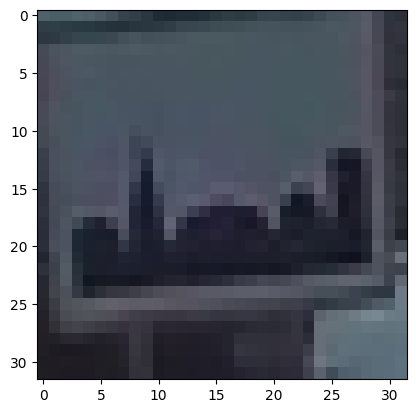

The traffic is: D-42 | Model predicted: D-42 | Class name: Obszar zabudowany


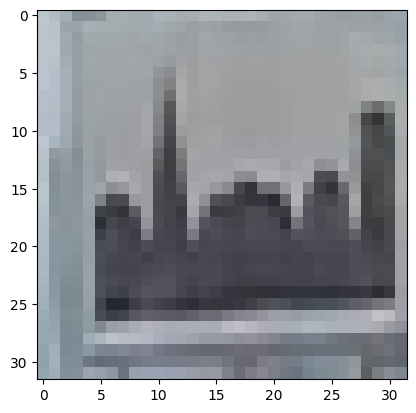

The traffic is: D-42 | Model predicted: D-42 | Class name: Obszar zabudowany


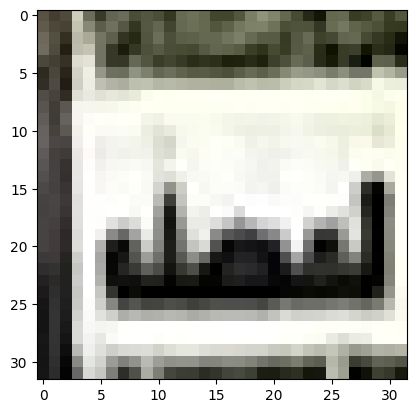

The traffic is: D-42 | Model predicted: D-42 | Class name: Obszar zabudowany


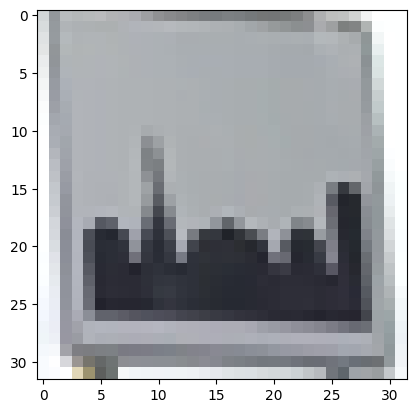

The traffic is: D-42 | Model predicted: D-42 | Class name: Obszar zabudowany


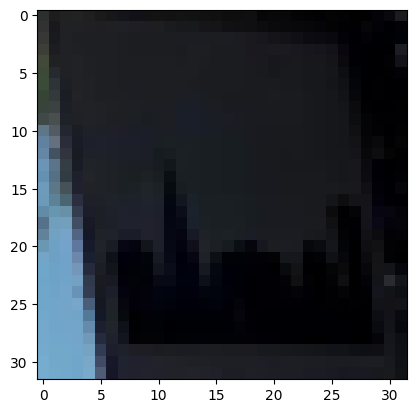

The traffic is: D-42 | Model predicted: D-23a | Class name: Stacja paliwowa tylko z gazem do napędu pojazdów


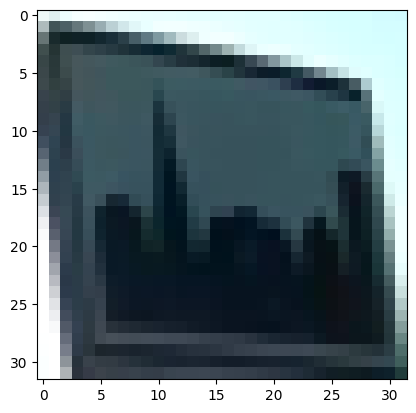

The traffic is: D-42 | Model predicted: D-42 | Class name: Obszar zabudowany


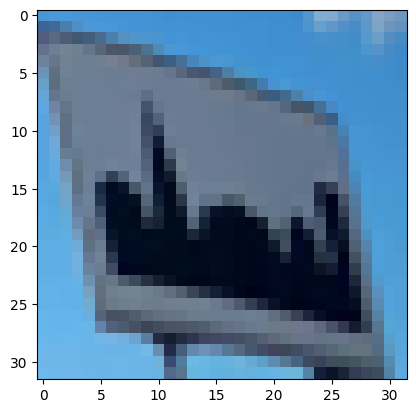

The traffic is: D-42 | Model predicted: D-42 | Class name: Obszar zabudowany


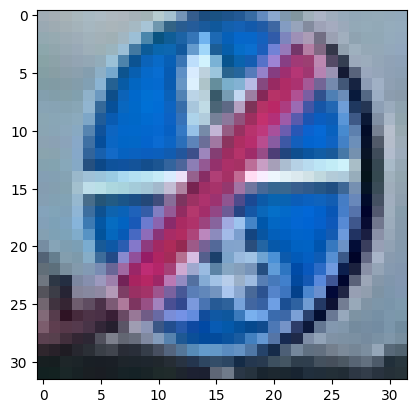

The traffic is: C-13a-C-16a | Model predicted: C-13a-C-16a | Class name: Koniec drogi dla pieszych i rowerzystów


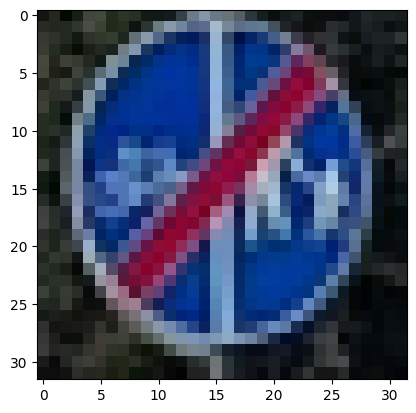

The traffic is: C-13a-C-16a | Model predicted: C-13a | Class name: Koniec drogi dla rowerów


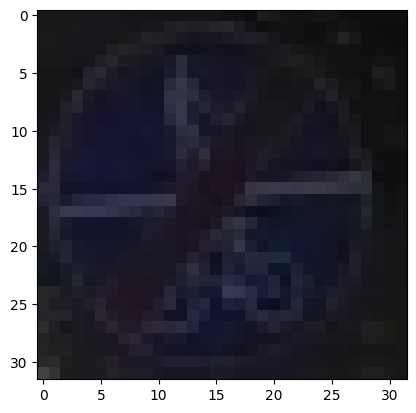

The traffic is: C-13a-C-16a | Model predicted: D-6 | Class name: Przejście dla pieszych


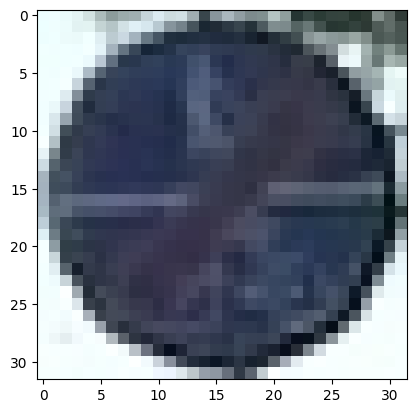

The traffic is: C-13a-C-16a | Model predicted: B-33 | Class name: Ograniczenie prędkości


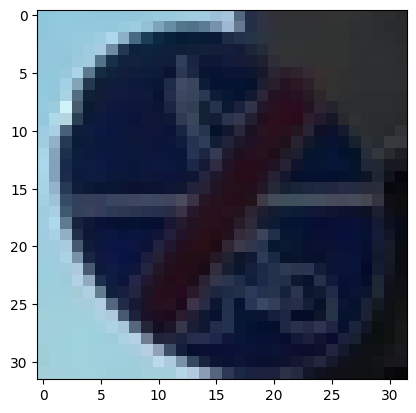

The traffic is: C-13a-C-16a | Model predicted: C-13a-C-16a | Class name: Koniec drogi dla pieszych i rowerzystów


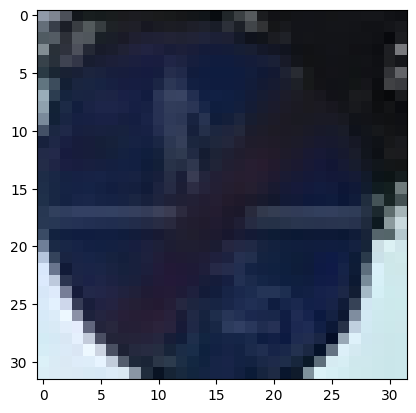

The traffic is: C-13a-C-16a | Model predicted: C-10 | Class name: Nakaz jazdy z lewej strony znaku


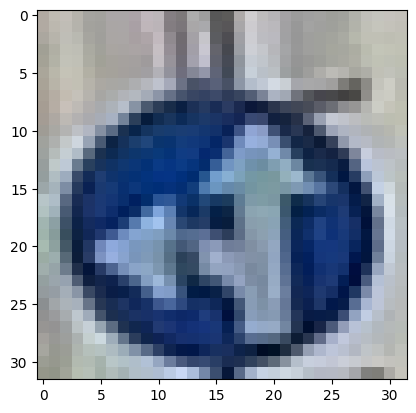

The traffic is: C-7 | Model predicted: B-33 | Class name: Ograniczenie prędkości


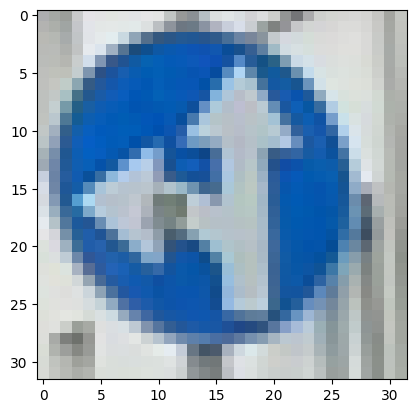

The traffic is: C-7 | Model predicted: C-5 | Class name: Nakaz jazdy prosto


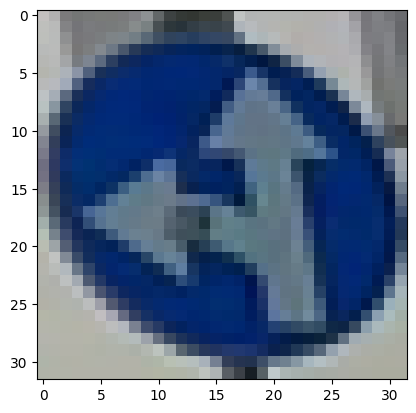

The traffic is: C-7 | Model predicted: C-7 | Class name: Nakaz jazdy prosto lub w lewo


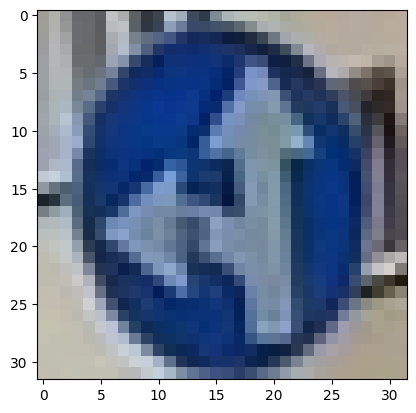

The traffic is: C-7 | Model predicted: C-7 | Class name: Nakaz jazdy prosto lub w lewo


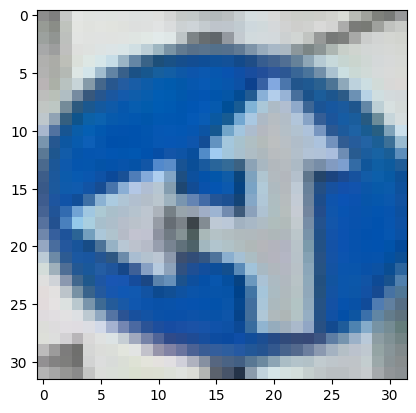

The traffic is: C-7 | Model predicted: C-7 | Class name: Nakaz jazdy prosto lub w lewo


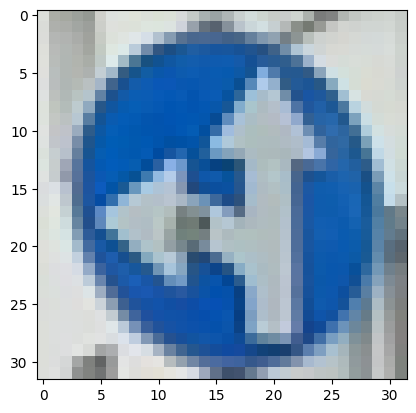

The traffic is: C-7 | Model predicted: C-7 | Class name: Nakaz jazdy prosto lub w lewo


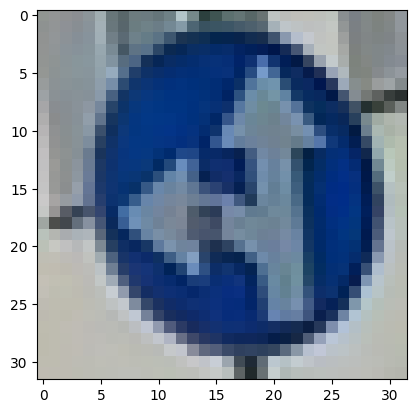

The traffic is: C-7 | Model predicted: C-7 | Class name: Nakaz jazdy prosto lub w lewo


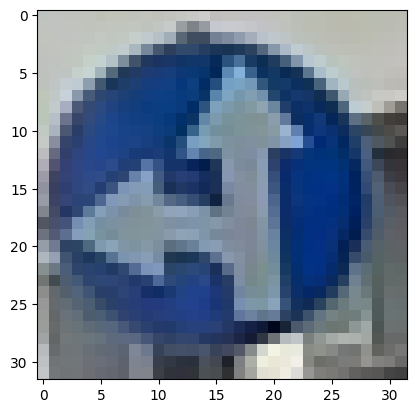

The traffic is: C-7 | Model predicted: B-33 | Class name: Ograniczenie prędkości


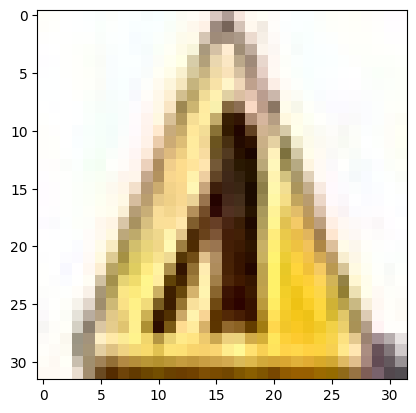

The traffic is: A-6e | Model predicted: A-6e | Class name: Wlot drogi jednokierunkowej z lewej strony


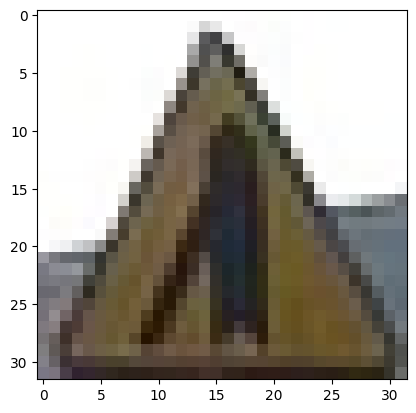

The traffic is: A-6e | Model predicted: A-6e | Class name: Wlot drogi jednokierunkowej z lewej strony


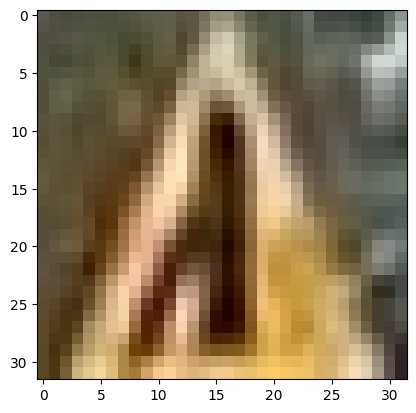

The traffic is: A-6e | Model predicted: A-6e | Class name: Wlot drogi jednokierunkowej z lewej strony


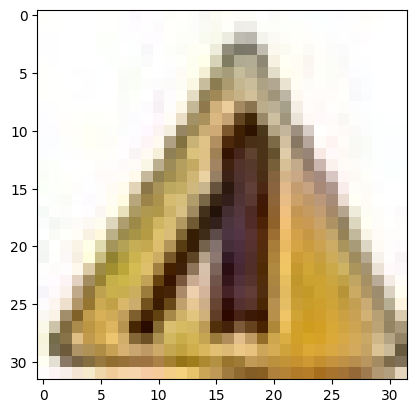

The traffic is: A-6e | Model predicted: A-6e | Class name: Wlot drogi jednokierunkowej z lewej strony


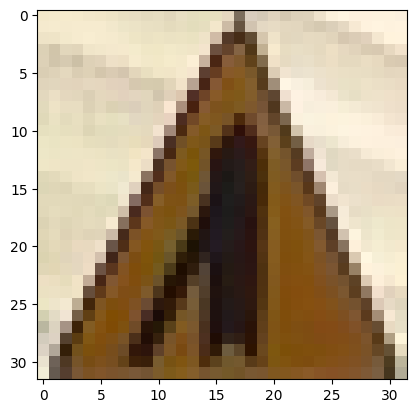

The traffic is: A-6e | Model predicted: A-6e | Class name: Wlot drogi jednokierunkowej z lewej strony


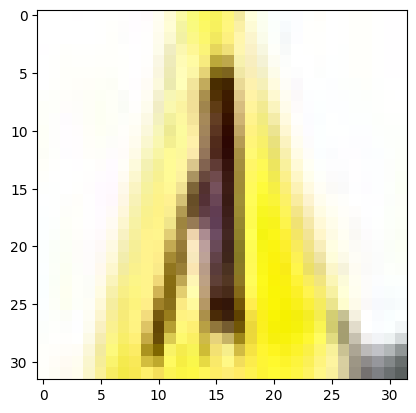

The traffic is: A-6e | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


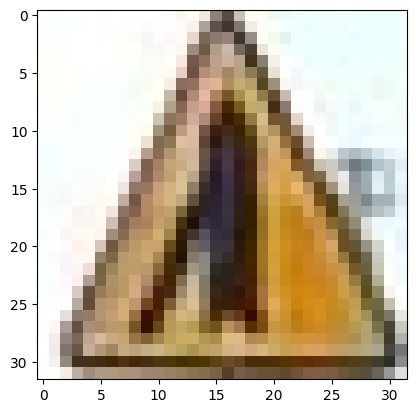

The traffic is: A-6e | Model predicted: A-6e | Class name: Wlot drogi jednokierunkowej z lewej strony


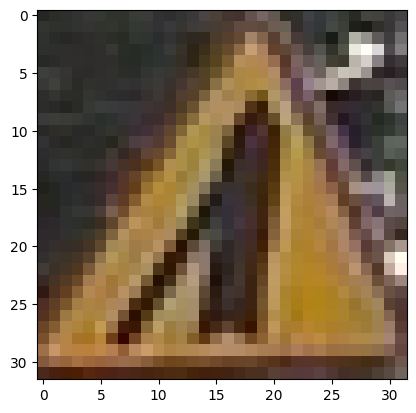

The traffic is: A-6e | Model predicted: A-6e | Class name: Wlot drogi jednokierunkowej z lewej strony


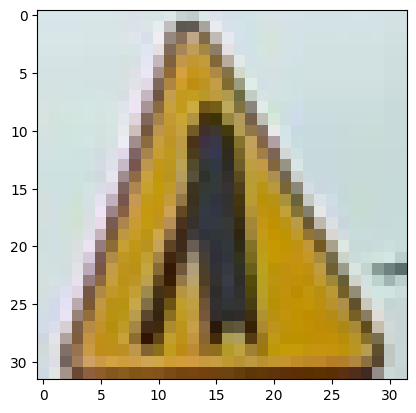

The traffic is: A-6e | Model predicted: A-6e | Class name: Wlot drogi jednokierunkowej z lewej strony


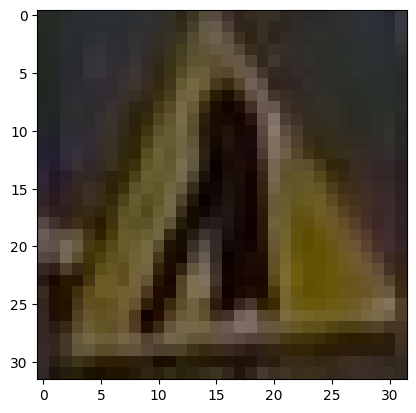

The traffic is: A-6e | Model predicted: A-6e | Class name: Wlot drogi jednokierunkowej z lewej strony


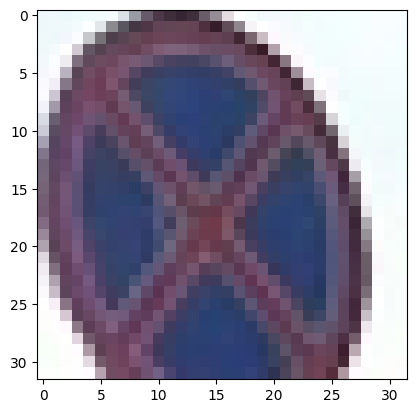

The traffic is: B-36 | Model predicted: B-36 | Class name: Zakaz zatrzymywania się


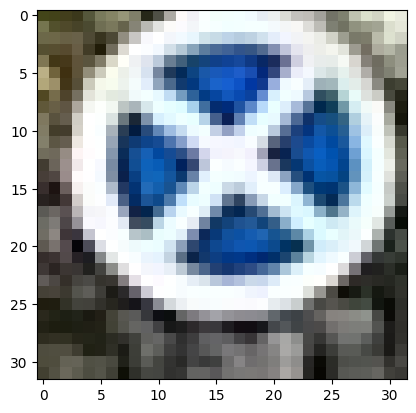

The traffic is: B-36 | Model predicted: B-36 | Class name: Zakaz zatrzymywania się


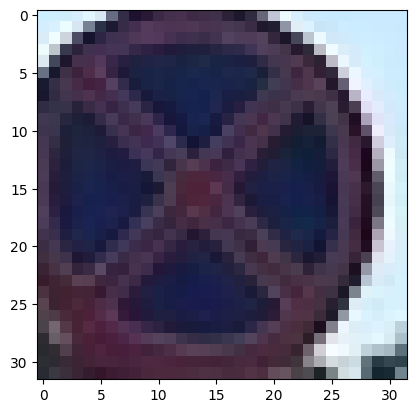

The traffic is: B-36 | Model predicted: B-36 | Class name: Zakaz zatrzymywania się


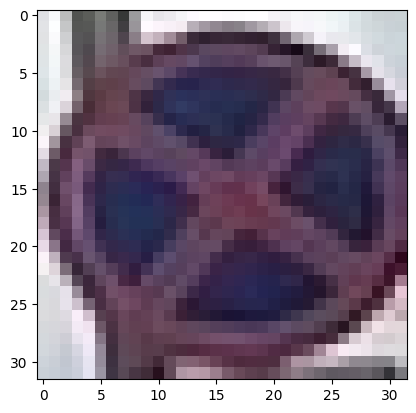

The traffic is: B-36 | Model predicted: B-36 | Class name: Zakaz zatrzymywania się


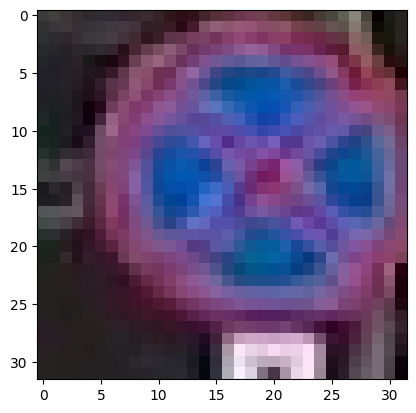

The traffic is: B-36 | Model predicted: C-9 | Class name: Nakaz jazdy z prawej strony znaku


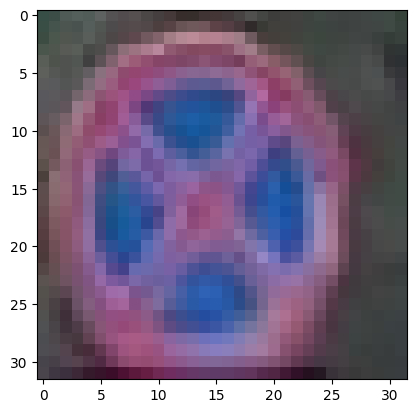

The traffic is: B-36 | Model predicted: B-36 | Class name: Zakaz zatrzymywania się


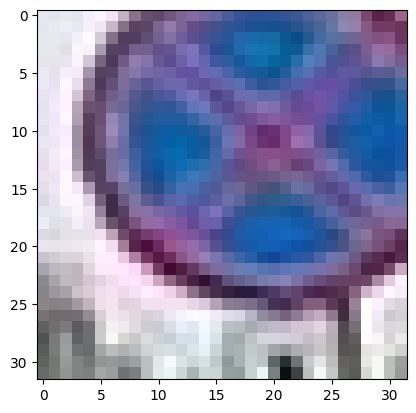

The traffic is: B-36 | Model predicted: B-36 | Class name: Zakaz zatrzymywania się


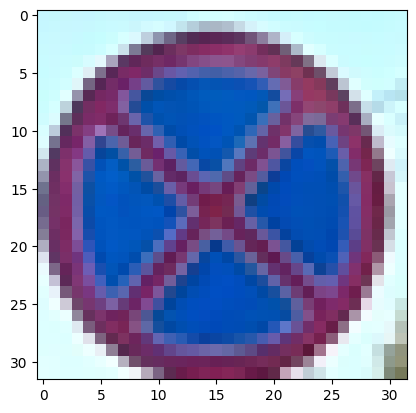

The traffic is: B-36 | Model predicted: B-36 | Class name: Zakaz zatrzymywania się


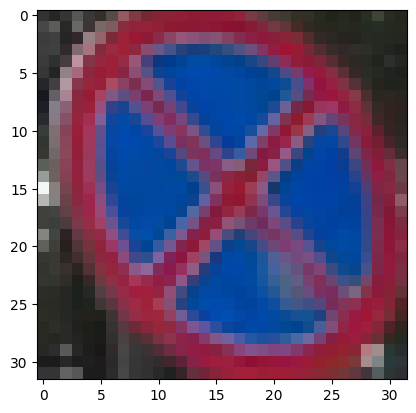

The traffic is: B-36 | Model predicted: B-36 | Class name: Zakaz zatrzymywania się


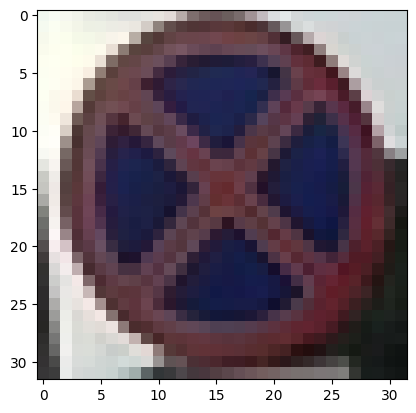

The traffic is: B-36 | Model predicted: B-36 | Class name: Zakaz zatrzymywania się


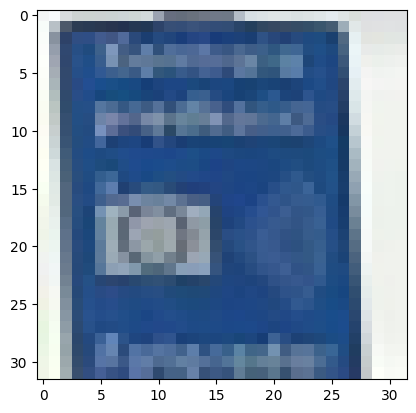

The traffic is: D-51 | Model predicted: D-51 | Class name: Automatyczna kontrola prędkości


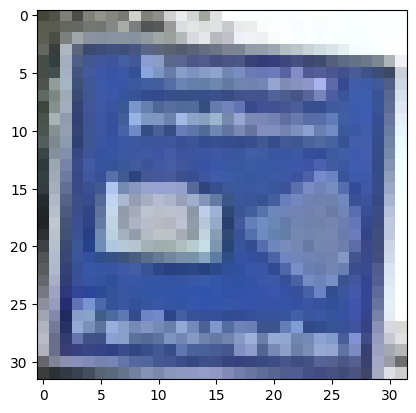

The traffic is: D-51 | Model predicted: D-51 | Class name: Automatyczna kontrola prędkości


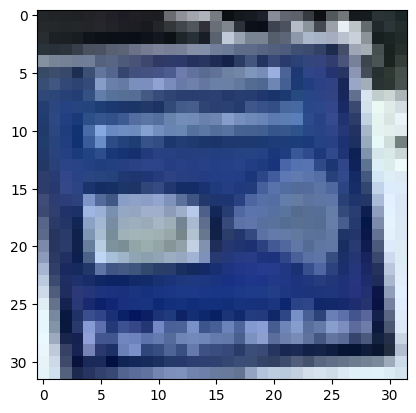

The traffic is: D-51 | Model predicted: D-51 | Class name: Automatyczna kontrola prędkości


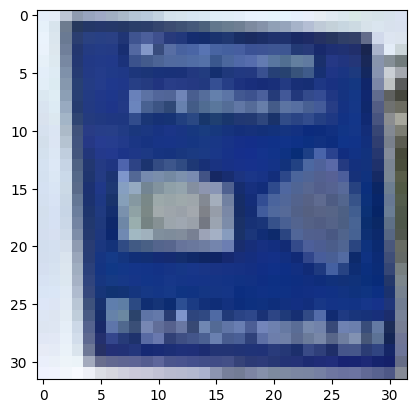

The traffic is: D-51 | Model predicted: D-51 | Class name: Automatyczna kontrola prędkości


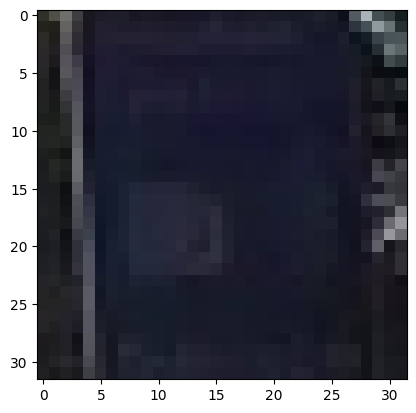

The traffic is: D-51 | Model predicted: D-51 | Class name: Automatyczna kontrola prędkości


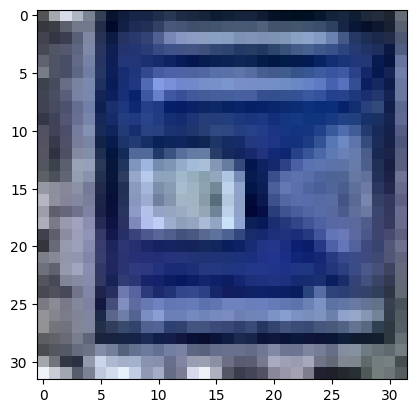

The traffic is: D-51 | Model predicted: D-51 | Class name: Automatyczna kontrola prędkości


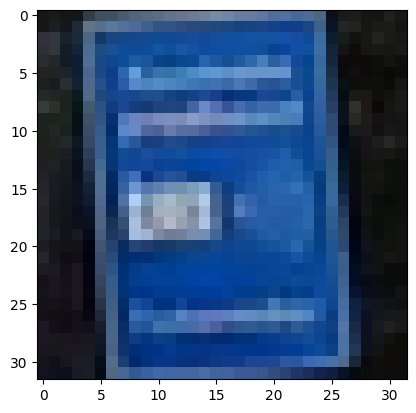

The traffic is: D-51 | Model predicted: D-51 | Class name: Automatyczna kontrola prędkości


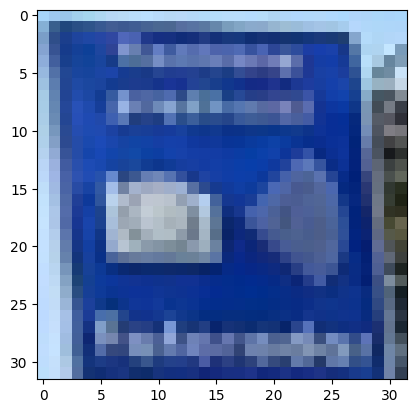

The traffic is: D-51 | Model predicted: D-51 | Class name: Automatyczna kontrola prędkości


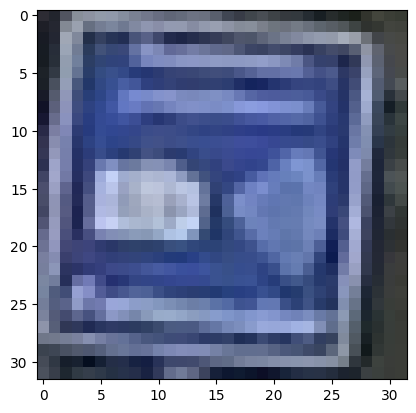

The traffic is: D-51 | Model predicted: D-51 | Class name: Automatyczna kontrola prędkości


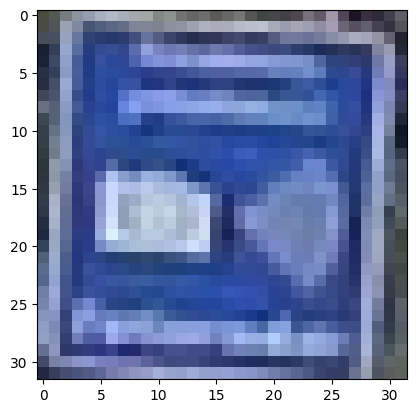

The traffic is: D-51 | Model predicted: D-51 | Class name: Automatyczna kontrola prędkości


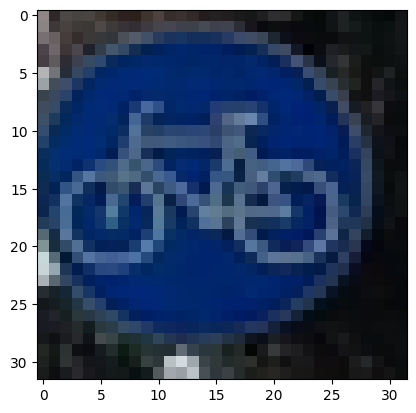

The traffic is: C-13 | Model predicted: D-7 | Class name: Droga ekspresowa


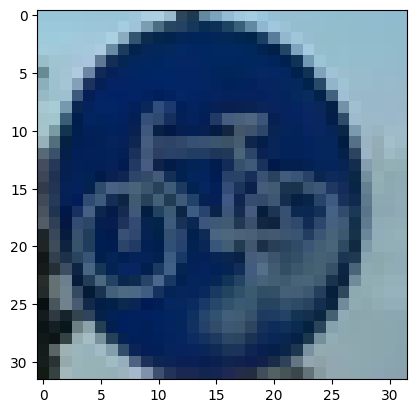

The traffic is: C-13 | Model predicted: D-18 | Class name: Parking


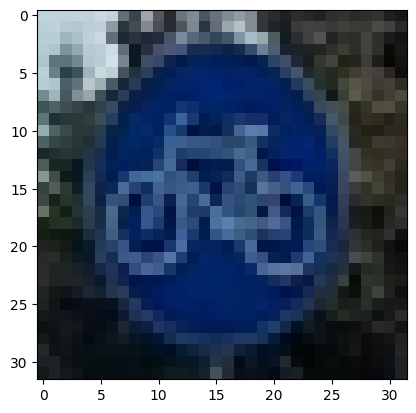

The traffic is: C-13 | Model predicted: D-3 | Class name: Droga jednokierunkowa


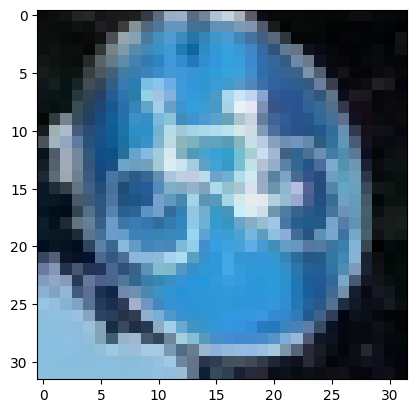

The traffic is: C-13 | Model predicted: C-13 | Class name: Droga dla rowerów


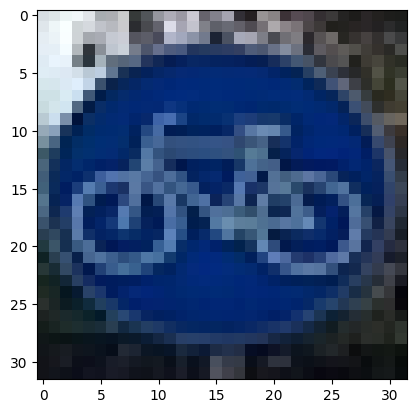

The traffic is: C-13 | Model predicted: C-13 | Class name: Droga dla rowerów


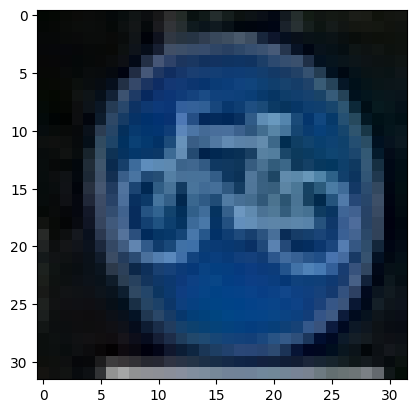

The traffic is: C-13 | Model predicted: C-13 | Class name: Droga dla rowerów


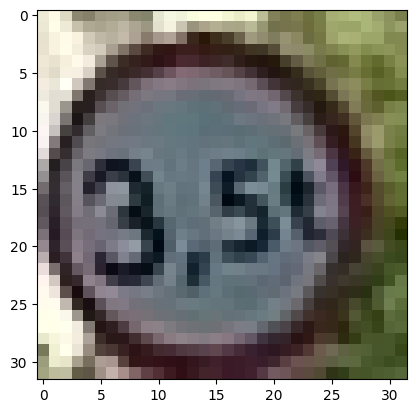

The traffic is: B-18 | Model predicted: B-33 | Class name: Ograniczenie prędkości


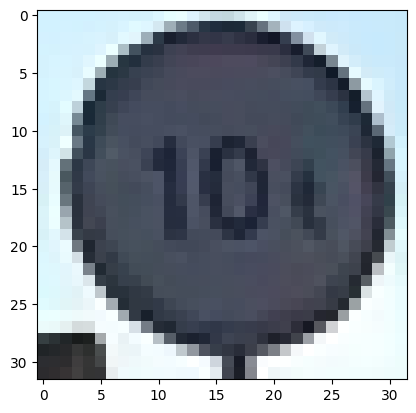

The traffic is: B-18 | Model predicted: B-33 | Class name: Ograniczenie prędkości


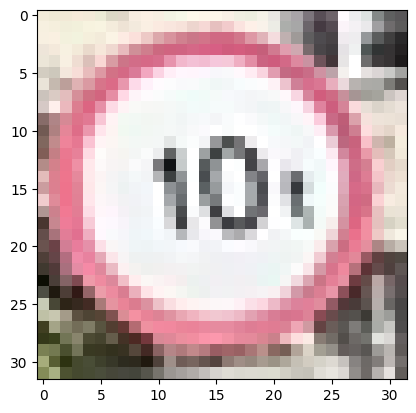

The traffic is: B-18 | Model predicted: B-18 | Class name: Zakaz wjazdu pojazdów o rzeczywistej masie całkowitej ponad ... t.


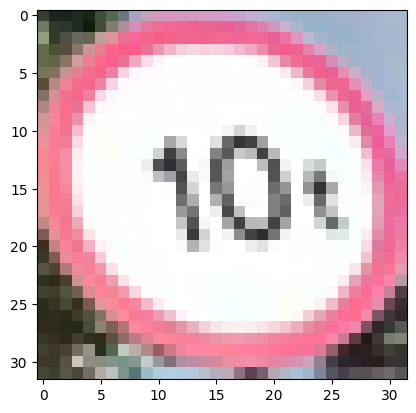

The traffic is: B-18 | Model predicted: B-18 | Class name: Zakaz wjazdu pojazdów o rzeczywistej masie całkowitej ponad ... t.


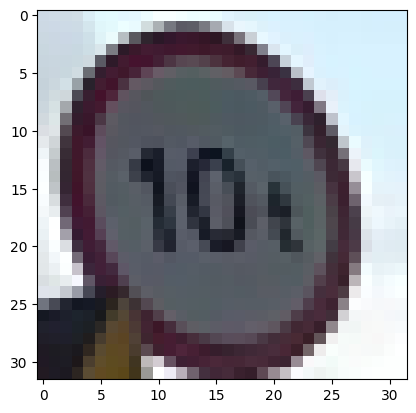

The traffic is: B-18 | Model predicted: B-33 | Class name: Ograniczenie prędkości


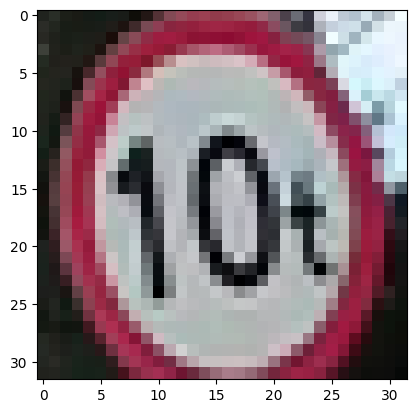

The traffic is: B-18 | Model predicted: B-43 | Class name: Strefa ograniczonej prędkości


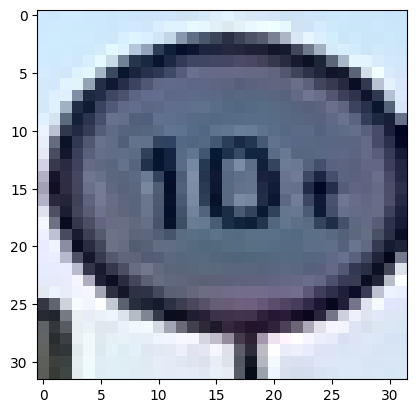

The traffic is: B-18 | Model predicted: B-33 | Class name: Ograniczenie prędkości


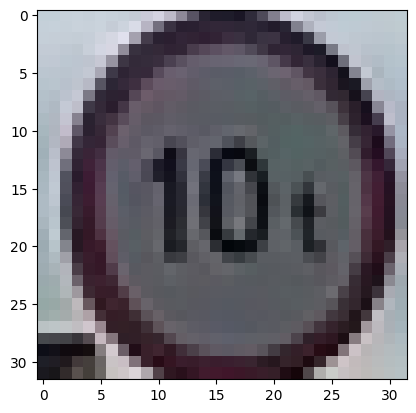

The traffic is: B-18 | Model predicted: B-18 | Class name: Zakaz wjazdu pojazdów o rzeczywistej masie całkowitej ponad ... t.


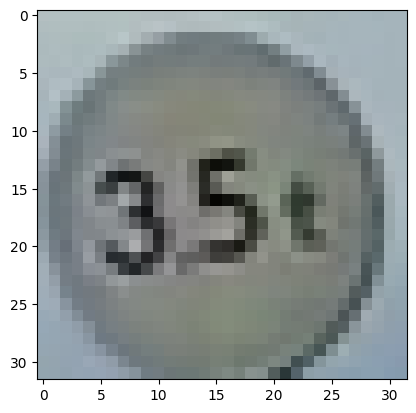

The traffic is: B-18 | Model predicted: B-33 | Class name: Ograniczenie prędkości


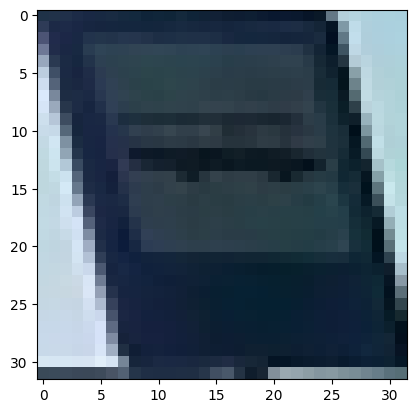

The traffic is: D-15 | Model predicted: D-15 | Class name: Przystanek autobusowy


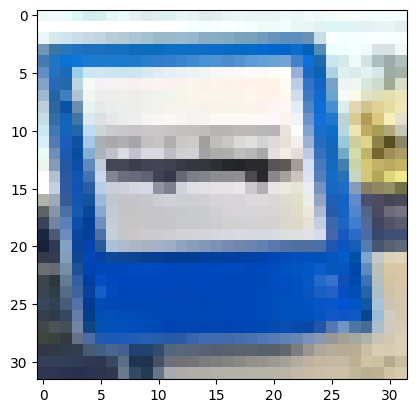

The traffic is: D-15 | Model predicted: D-15 | Class name: Przystanek autobusowy


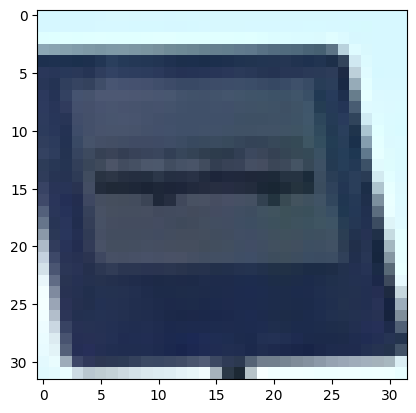

The traffic is: D-15 | Model predicted: D-15 | Class name: Przystanek autobusowy


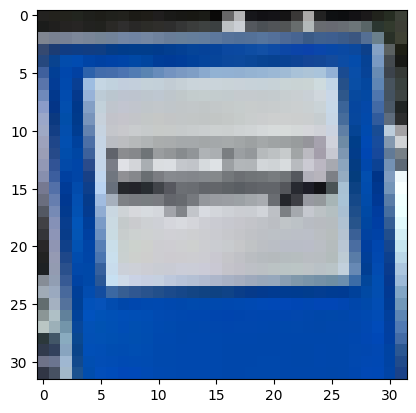

The traffic is: D-15 | Model predicted: D-15 | Class name: Przystanek autobusowy


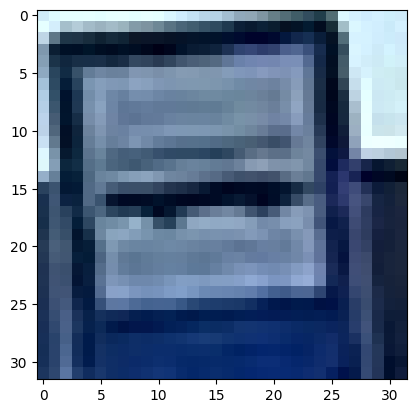

The traffic is: D-15 | Model predicted: D-26c | Class name: Toaleta publiczna


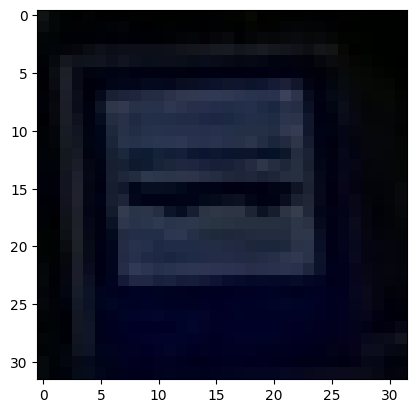

The traffic is: D-15 | Model predicted: D-15 | Class name: Przystanek autobusowy


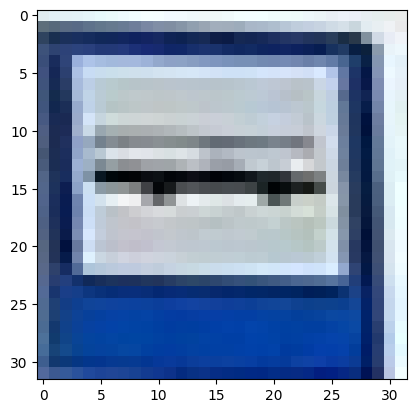

The traffic is: D-15 | Model predicted: D-15 | Class name: Przystanek autobusowy


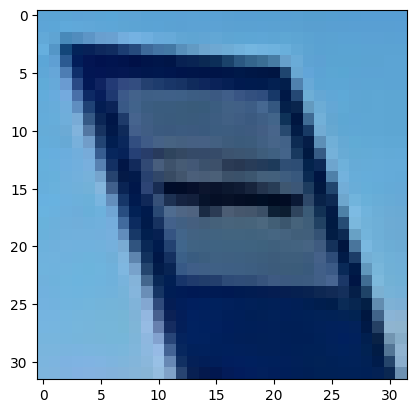

The traffic is: D-15 | Model predicted: D-15 | Class name: Przystanek autobusowy


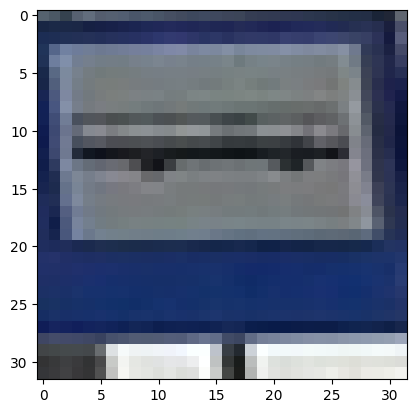

The traffic is: D-15 | Model predicted: D-15 | Class name: Przystanek autobusowy


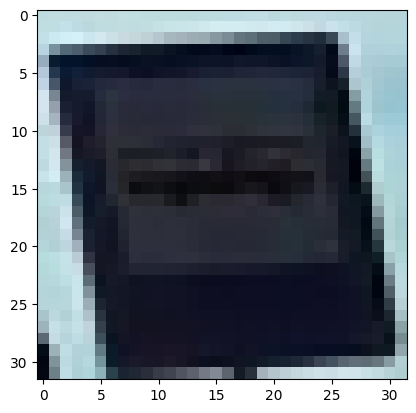

The traffic is: D-15 | Model predicted: D-15 | Class name: Przystanek autobusowy


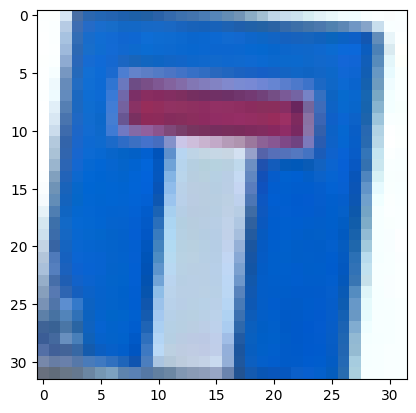

The traffic is: D-4a | Model predicted: D-3 | Class name: Droga jednokierunkowa


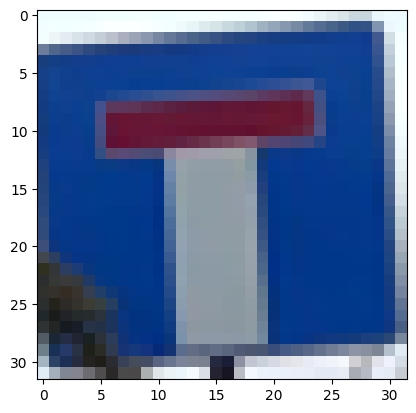

The traffic is: D-4a | Model predicted: D-4a | Class name: Droga bez przejazdu


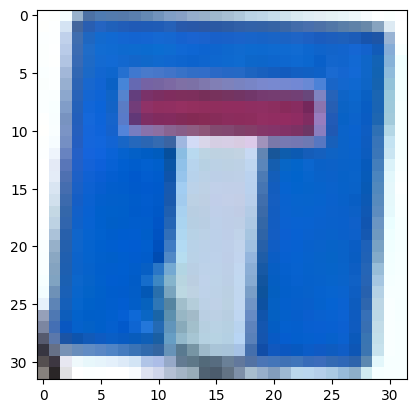

The traffic is: D-4a | Model predicted: D-3 | Class name: Droga jednokierunkowa


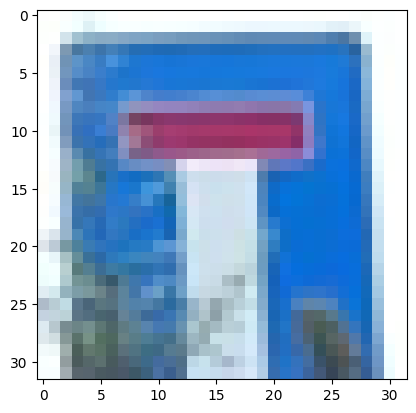

The traffic is: D-4a | Model predicted: D-4a | Class name: Droga bez przejazdu


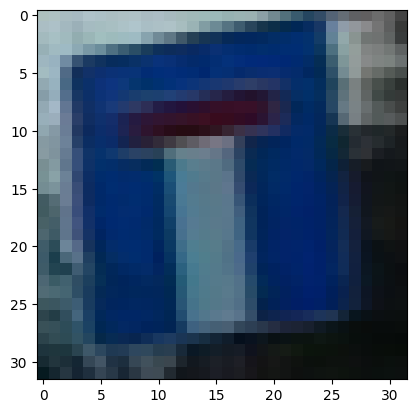

The traffic is: D-4a | Model predicted: D-3 | Class name: Droga jednokierunkowa


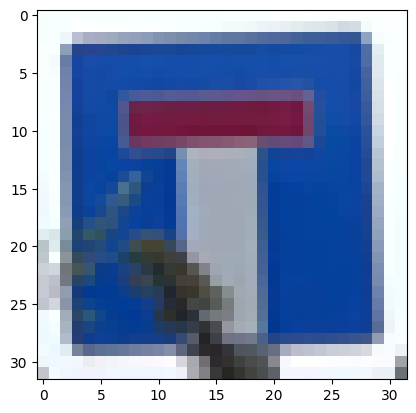

The traffic is: D-4a | Model predicted: D-4a | Class name: Droga bez przejazdu


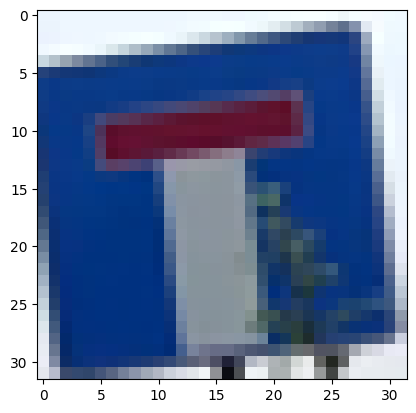

The traffic is: D-4a | Model predicted: D-3 | Class name: Droga jednokierunkowa


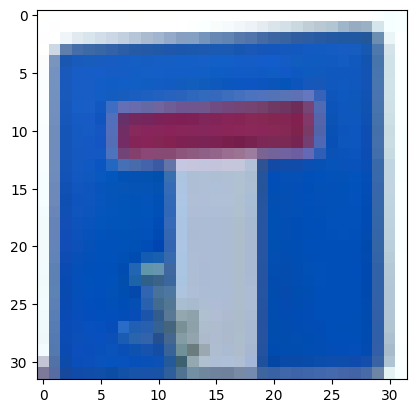

The traffic is: D-4a | Model predicted: D-4a | Class name: Droga bez przejazdu


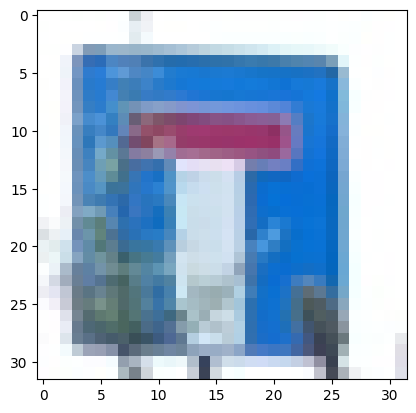

The traffic is: D-4a | Model predicted: D-3 | Class name: Droga jednokierunkowa


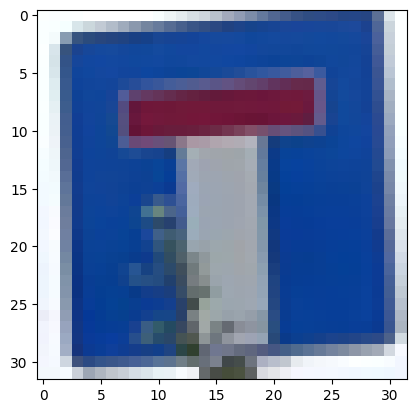

The traffic is: D-4a | Model predicted: D-3 | Class name: Droga jednokierunkowa


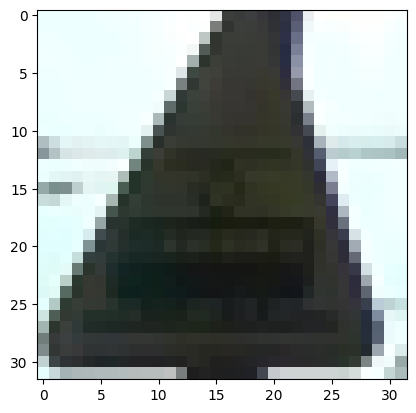

The traffic is: A-21 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


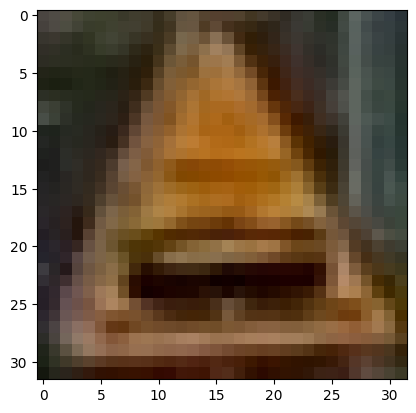

The traffic is: A-21 | Model predicted: D-1 | Class name: Droga z pierwszeństwem


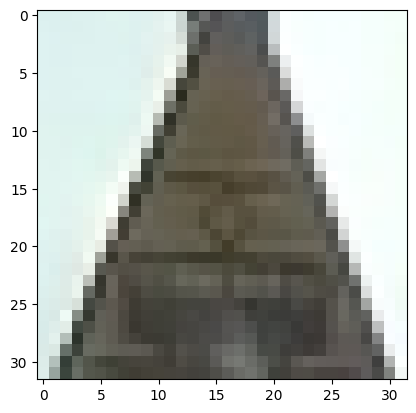

The traffic is: A-21 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


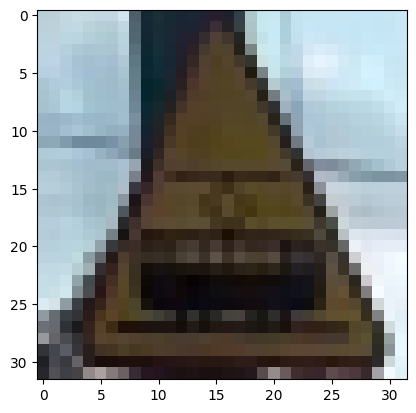

The traffic is: A-21 | Model predicted: D-1 | Class name: Droga z pierwszeństwem


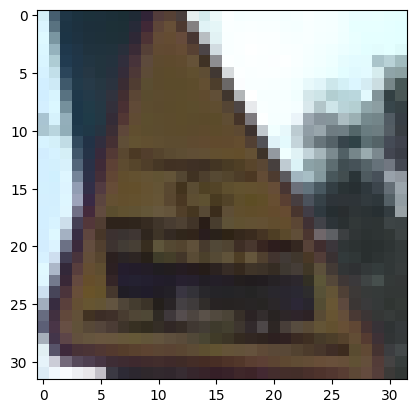

The traffic is: A-21 | Model predicted: A-17 | Class name: Dzieci


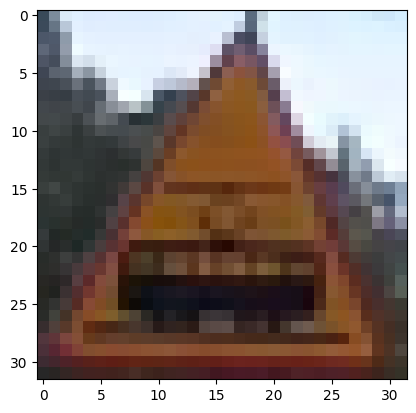

The traffic is: A-21 | Model predicted: D-1 | Class name: Droga z pierwszeństwem


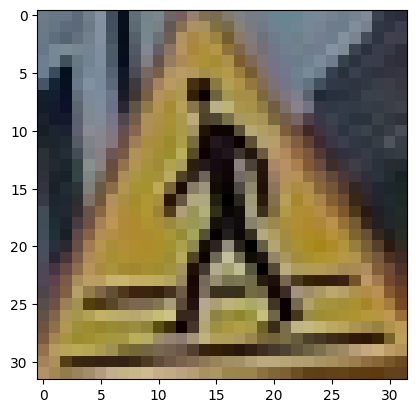

The traffic is: A-16 | Model predicted: A-16 | Class name: Przejście dla pieszych


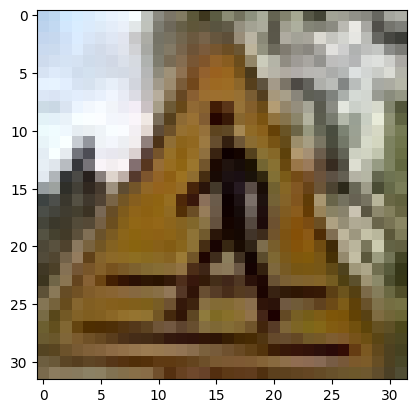

The traffic is: A-16 | Model predicted: A-16 | Class name: Przejście dla pieszych


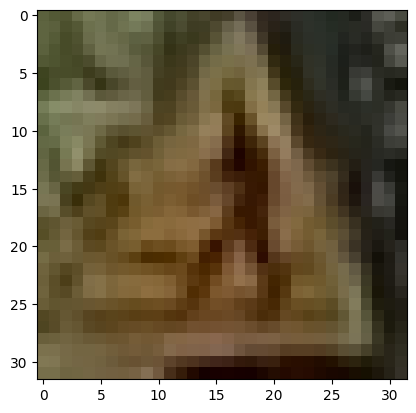

The traffic is: A-16 | Model predicted: A-17 | Class name: Dzieci


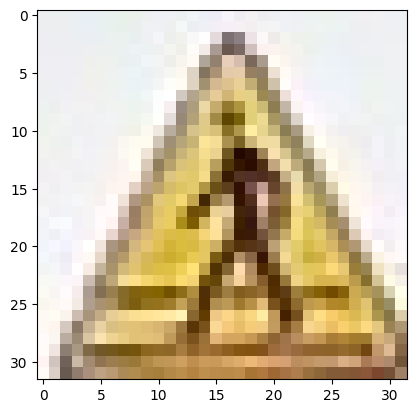

The traffic is: A-16 | Model predicted: A-16 | Class name: Przejście dla pieszych


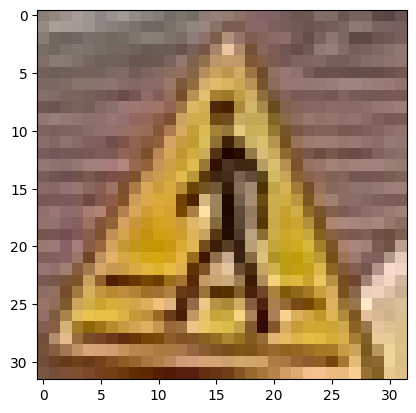

The traffic is: A-16 | Model predicted: A-16 | Class name: Przejście dla pieszych


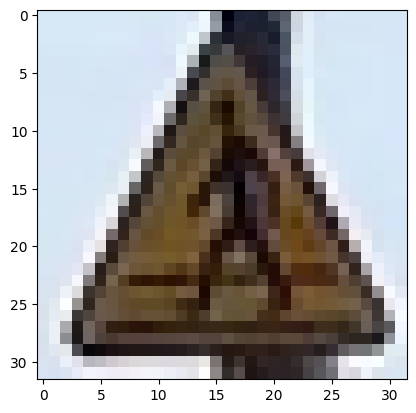

The traffic is: A-16 | Model predicted: A-16 | Class name: Przejście dla pieszych


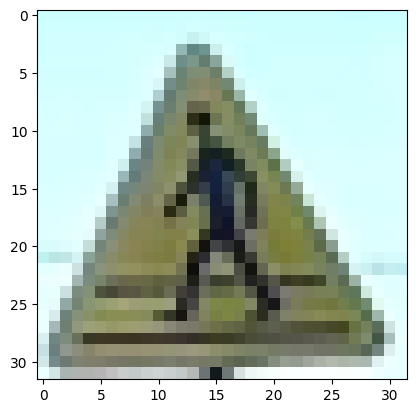

The traffic is: A-16 | Model predicted: A-16 | Class name: Przejście dla pieszych


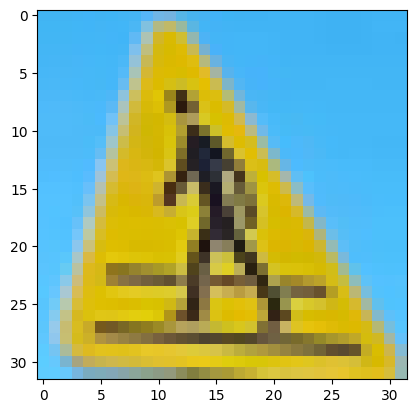

The traffic is: A-16 | Model predicted: A-16 | Class name: Przejście dla pieszych


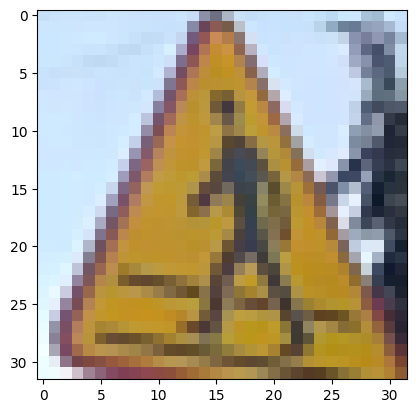

The traffic is: A-16 | Model predicted: A-16 | Class name: Przejście dla pieszych


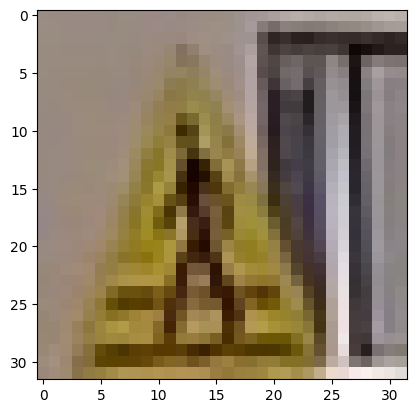

The traffic is: A-16 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


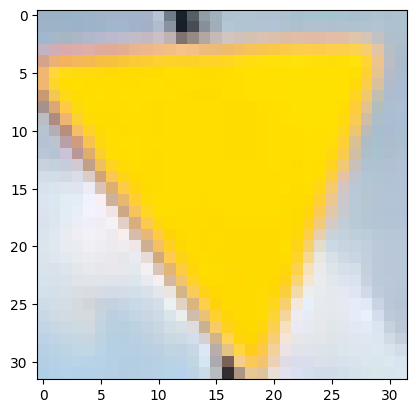

The traffic is: A-7 | Model predicted: A-7 | Class name: Ustąp pierwszeństwa


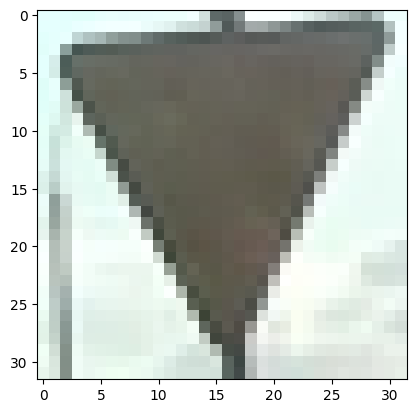

The traffic is: A-7 | Model predicted: A-6a | Class name: Skrzyżowanie z drogą podporządkowaną występującą po obu stronach


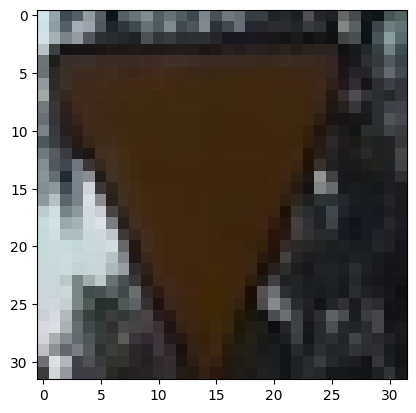

The traffic is: A-7 | Model predicted: A-7 | Class name: Ustąp pierwszeństwa


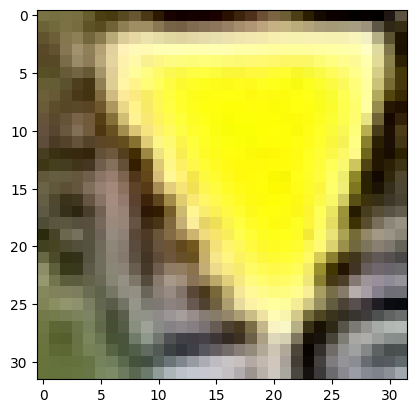

The traffic is: A-7 | Model predicted: A-7 | Class name: Ustąp pierwszeństwa


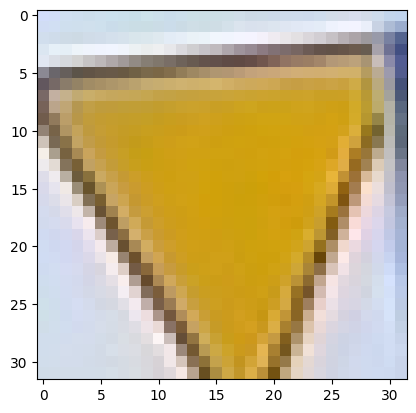

The traffic is: A-7 | Model predicted: A-7 | Class name: Ustąp pierwszeństwa


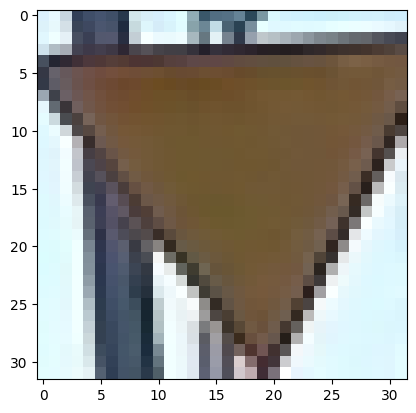

The traffic is: A-7 | Model predicted: A-7 | Class name: Ustąp pierwszeństwa


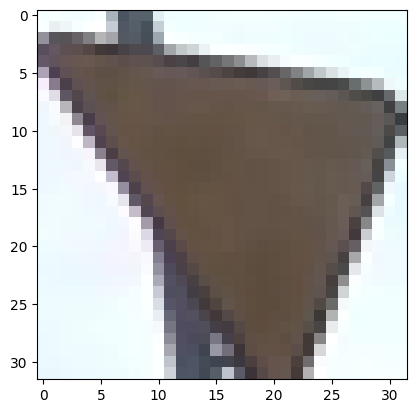

The traffic is: A-7 | Model predicted: A-14 | Class name: Roboty drogowe


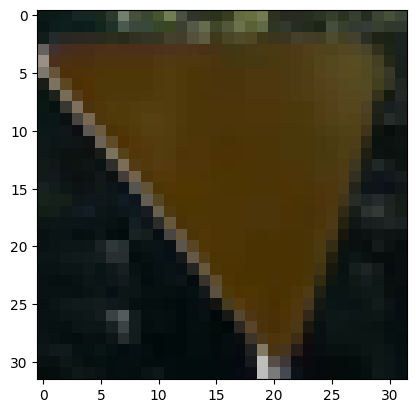

The traffic is: A-7 | Model predicted: A-7 | Class name: Ustąp pierwszeństwa


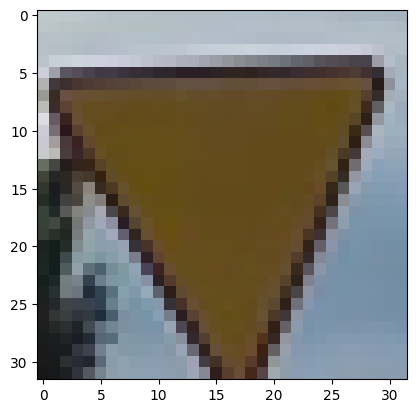

The traffic is: A-7 | Model predicted: A-7 | Class name: Ustąp pierwszeństwa


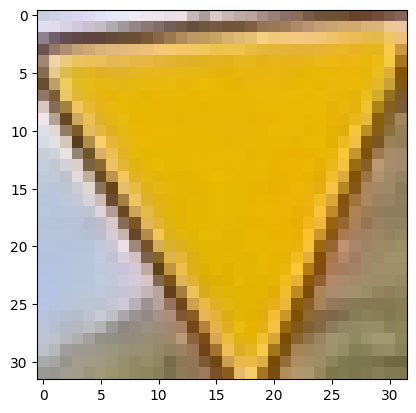

The traffic is: A-7 | Model predicted: A-7 | Class name: Ustąp pierwszeństwa


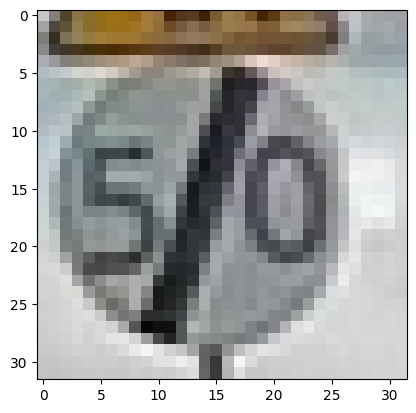

The traffic is: B-34 | Model predicted: B-33 | Class name: Ograniczenie prędkości


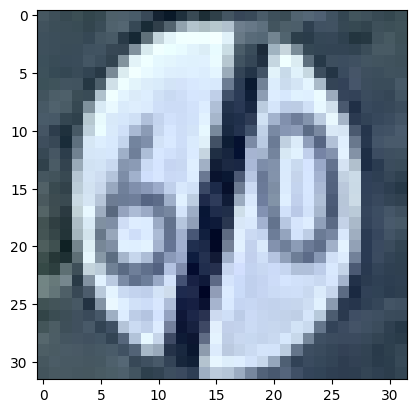

The traffic is: B-34 | Model predicted: B-34 | Class name: Koniec ograniczenia prędkości


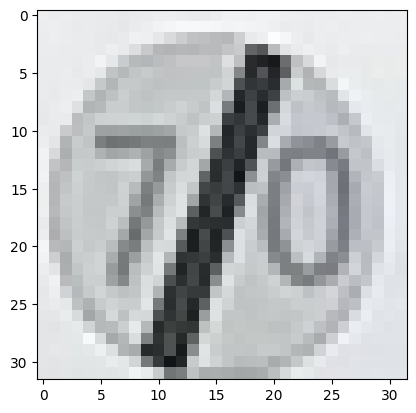

The traffic is: B-34 | Model predicted: B-34 | Class name: Koniec ograniczenia prędkości


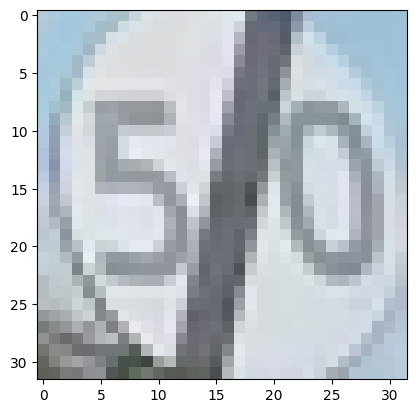

The traffic is: B-34 | Model predicted: B-34 | Class name: Koniec ograniczenia prędkości


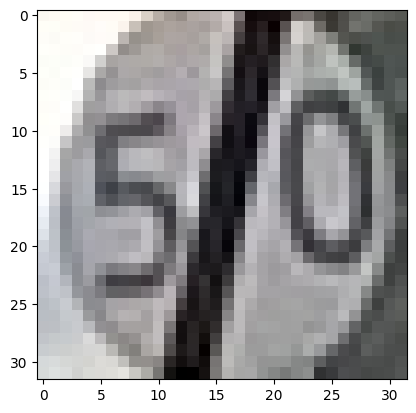

The traffic is: B-34 | Model predicted: B-34 | Class name: Koniec ograniczenia prędkości


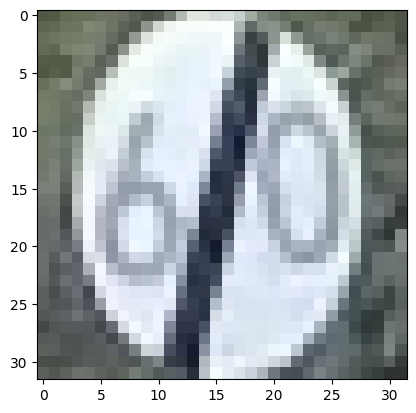

The traffic is: B-34 | Model predicted: B-34 | Class name: Koniec ograniczenia prędkości


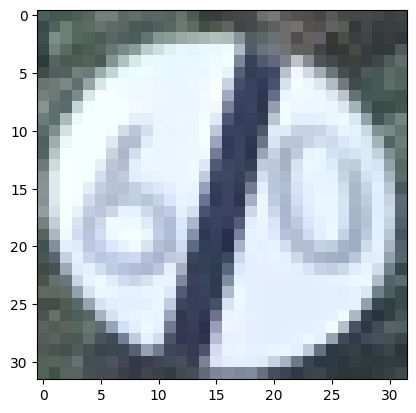

The traffic is: B-34 | Model predicted: B-34 | Class name: Koniec ograniczenia prędkości


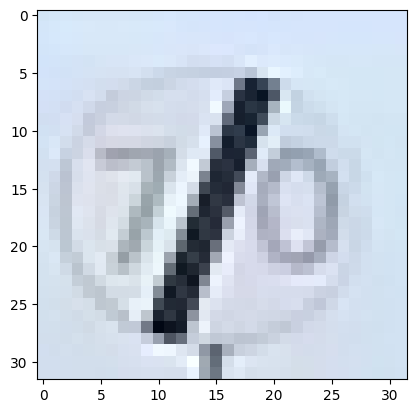

The traffic is: B-34 | Model predicted: B-34 | Class name: Koniec ograniczenia prędkości


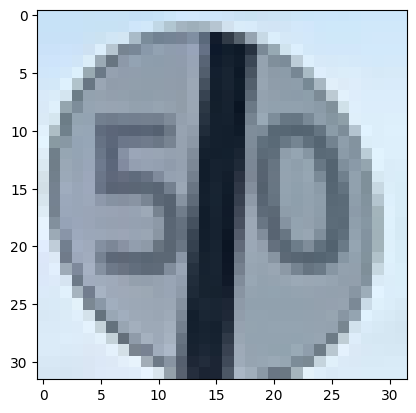

The traffic is: B-34 | Model predicted: B-34 | Class name: Koniec ograniczenia prędkości


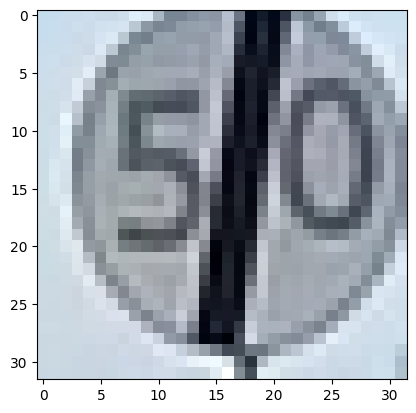

The traffic is: B-34 | Model predicted: B-34 | Class name: Koniec ograniczenia prędkości


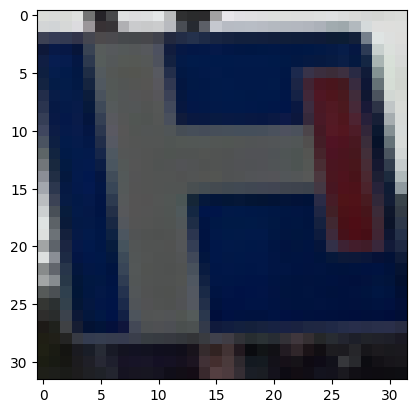

The traffic is: D-4b | Model predicted: C-2 | Class name: Nakaz jazdy w prawo za znakiem


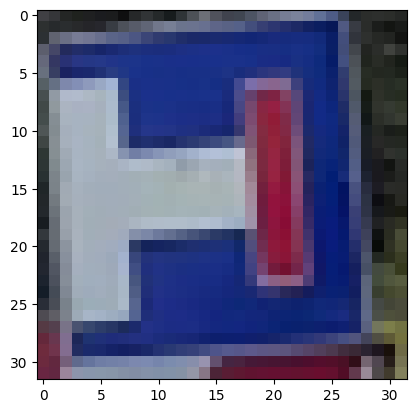

The traffic is: D-4b | Model predicted: D-7 | Class name: Droga ekspresowa


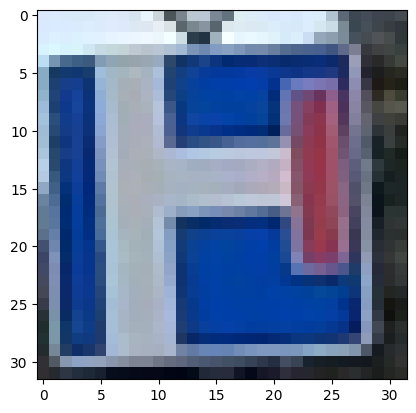

The traffic is: D-4b | Model predicted: D-4b | Class name: Wjazd na drogę bez przejazdu


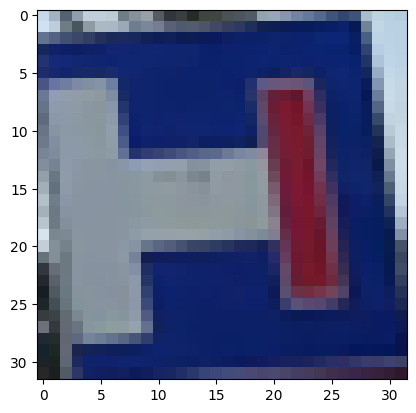

The traffic is: D-4b | Model predicted: D-7 | Class name: Droga ekspresowa


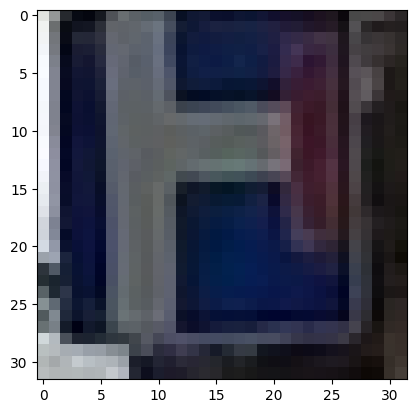

The traffic is: D-4b | Model predicted: D-23 | Class name: Stacja paliwowa


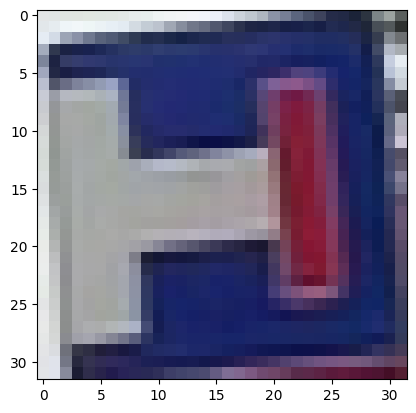

The traffic is: D-4b | Model predicted: D-7 | Class name: Droga ekspresowa


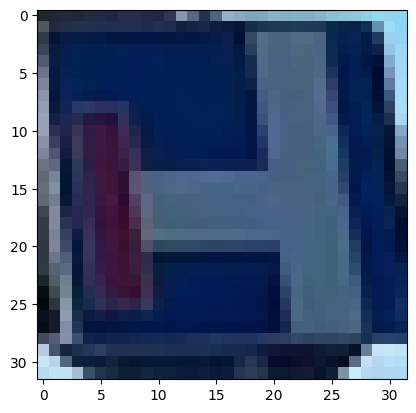

The traffic is: D-4b | Model predicted: D-23a | Class name: Stacja paliwowa tylko z gazem do napędu pojazdów


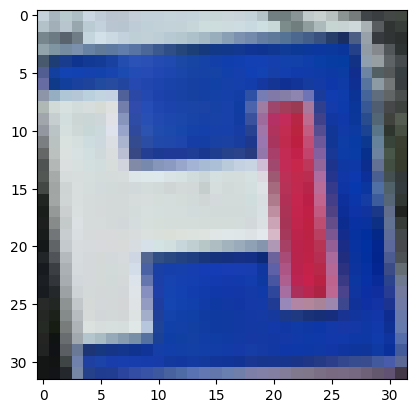

The traffic is: D-4b | Model predicted: A-29 | Class name: Sygnały świetlne


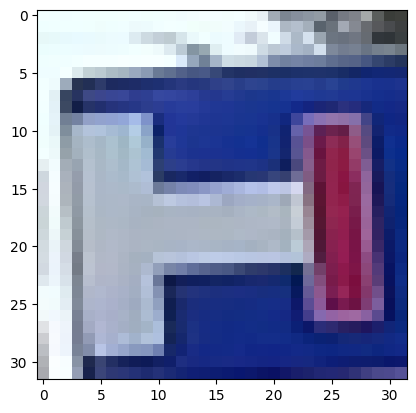

The traffic is: D-4b | Model predicted: C-10 | Class name: Nakaz jazdy z lewej strony znaku


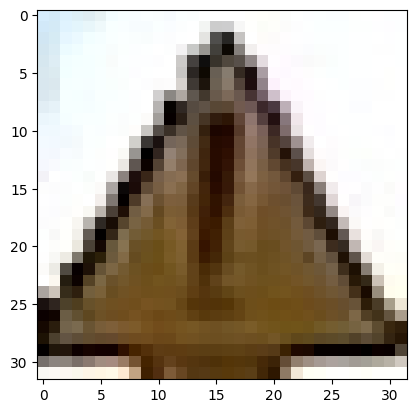

The traffic is: A-30 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


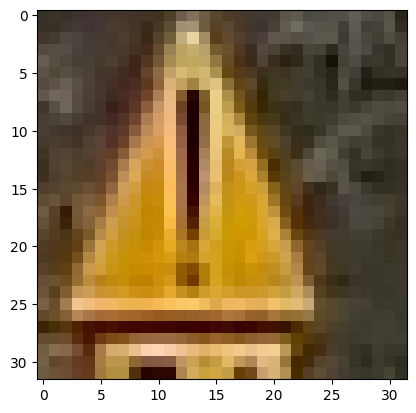

The traffic is: A-30 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


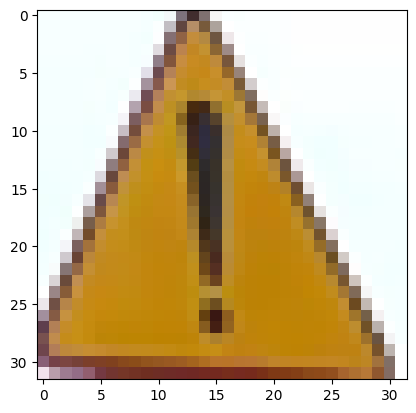

The traffic is: A-30 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


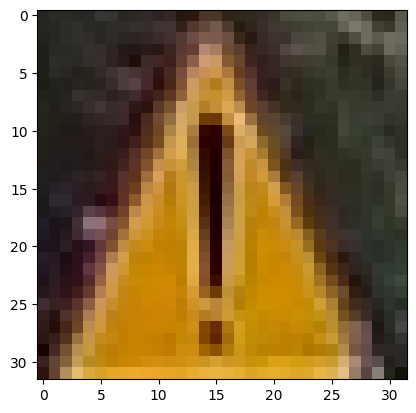

The traffic is: A-30 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


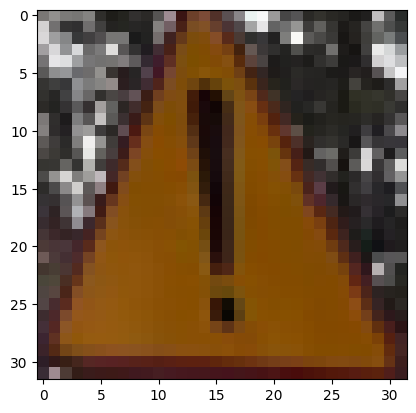

The traffic is: A-30 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


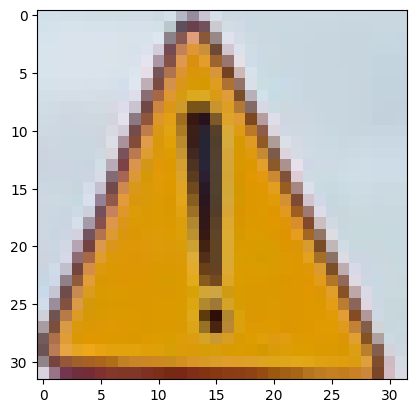

The traffic is: A-30 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


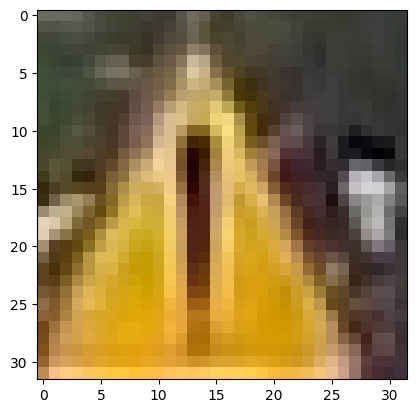

The traffic is: A-30 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


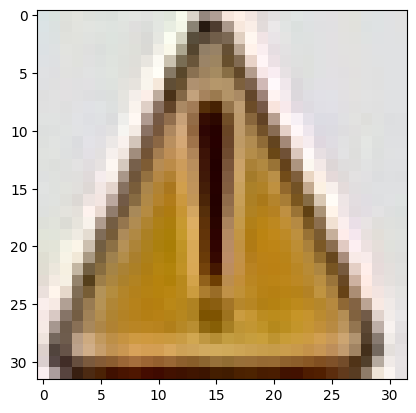

The traffic is: A-30 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


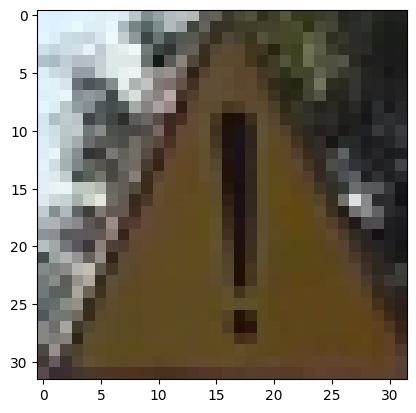

The traffic is: A-30 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


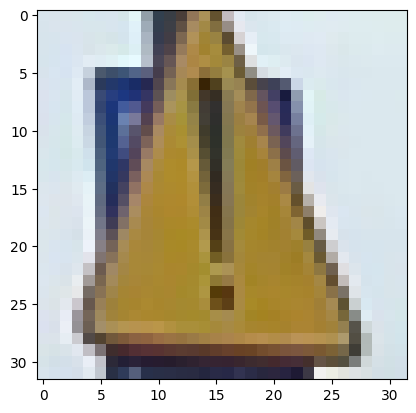

The traffic is: A-30 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


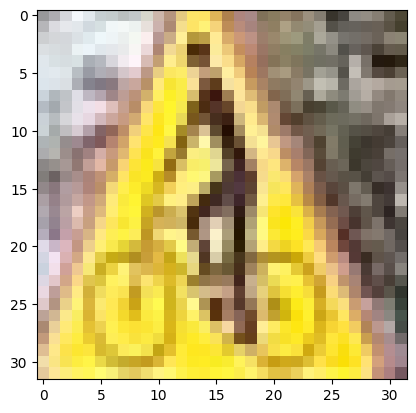

The traffic is: A-24 | Model predicted: A-6c | Class name: Skrzyżowanie z drogą podporządkowaną występującą po lewej stronie


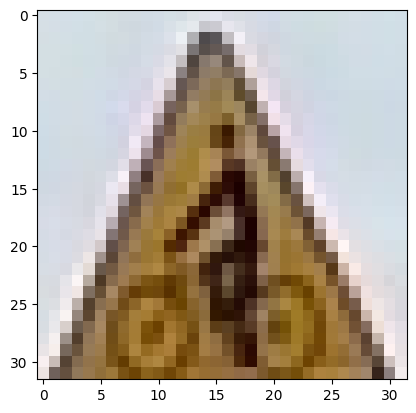

The traffic is: A-24 | Model predicted: A-17 | Class name: Dzieci


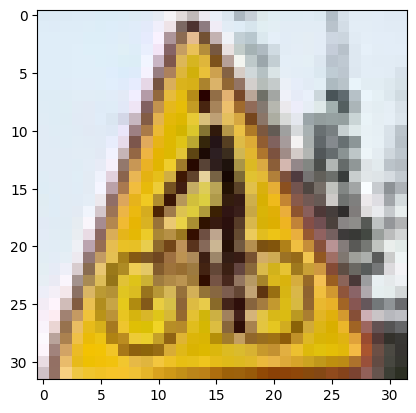

The traffic is: A-24 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


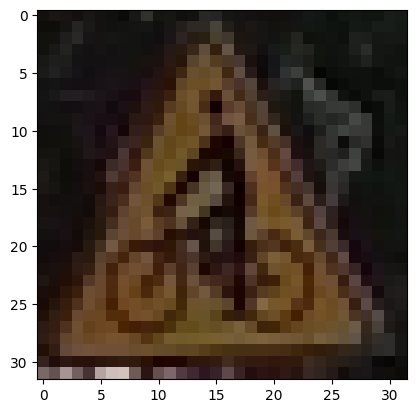

The traffic is: A-24 | Model predicted: A-6c | Class name: Skrzyżowanie z drogą podporządkowaną występującą po lewej stronie


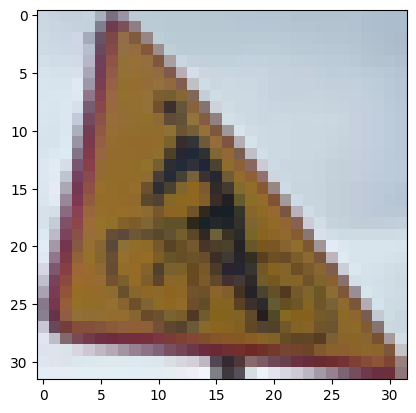

The traffic is: A-24 | Model predicted: A-6a | Class name: Skrzyżowanie z drogą podporządkowaną występującą po obu stronach


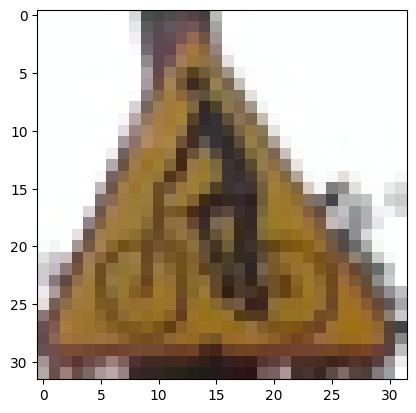

The traffic is: A-24 | Model predicted: A-17 | Class name: Dzieci


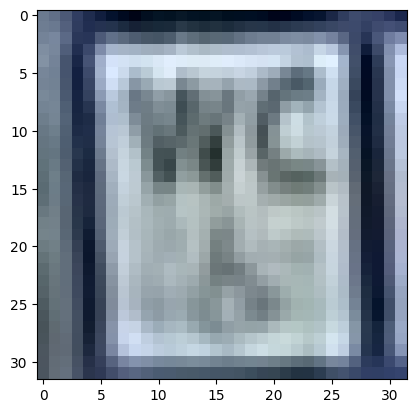

The traffic is: D-26c | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


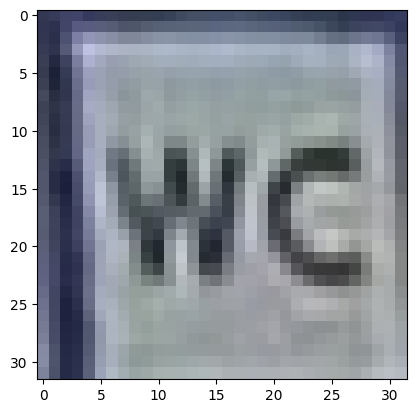

The traffic is: D-26c | Model predicted: B-33 | Class name: Ograniczenie prędkości


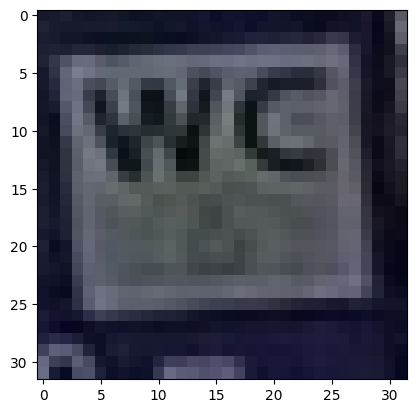

The traffic is: D-26c | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


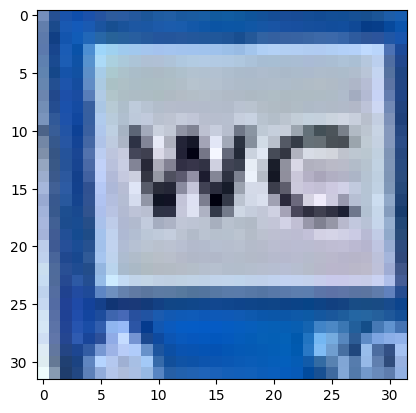

The traffic is: D-26c | Model predicted: D-26c | Class name: Toaleta publiczna


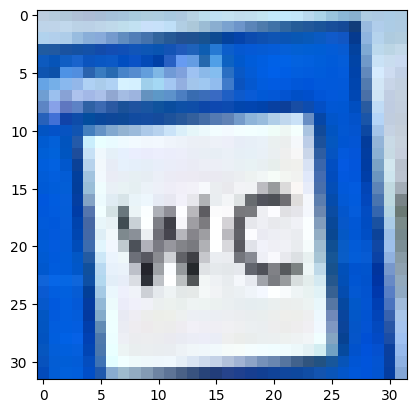

The traffic is: D-26c | Model predicted: A-17 | Class name: Dzieci


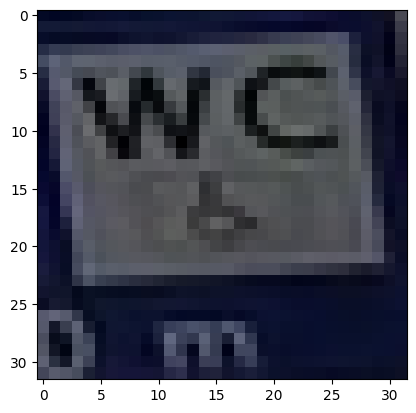

The traffic is: D-26c | Model predicted: D-23a | Class name: Stacja paliwowa tylko z gazem do napędu pojazdów


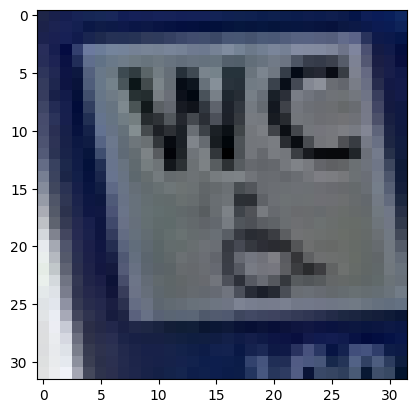

The traffic is: D-26c | Model predicted: D-23a | Class name: Stacja paliwowa tylko z gazem do napędu pojazdów


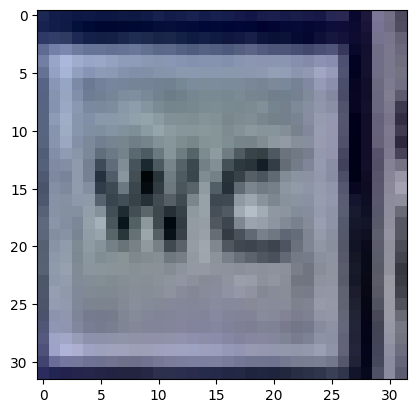

The traffic is: D-26c | Model predicted: B-43 | Class name: Strefa ograniczonej prędkości


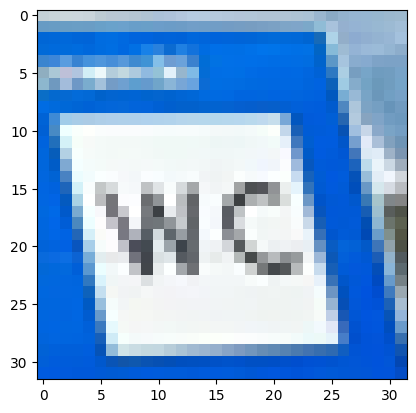

The traffic is: D-26c | Model predicted: D-26c | Class name: Toaleta publiczna


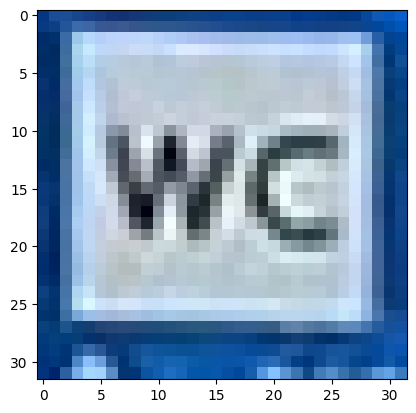

The traffic is: D-26c | Model predicted: D-26c | Class name: Toaleta publiczna


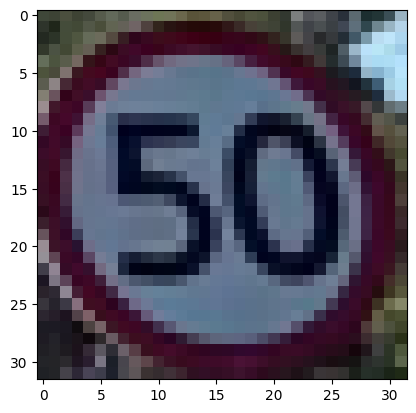

The traffic is: B-33 | Model predicted: B-33 | Class name: Ograniczenie prędkości


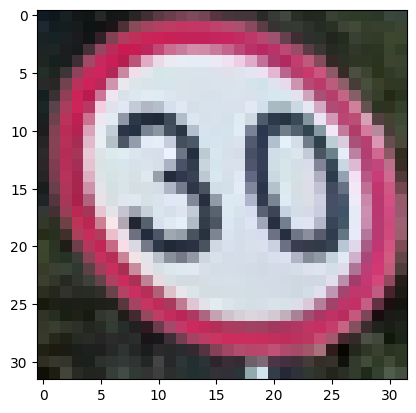

The traffic is: B-33 | Model predicted: B-33 | Class name: Ograniczenie prędkości


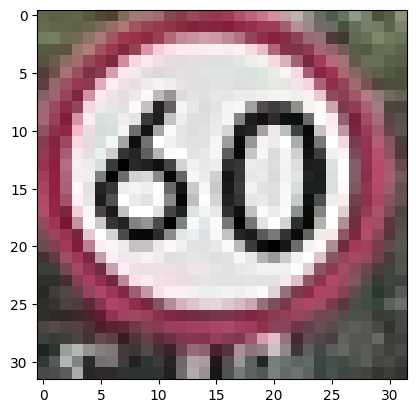

The traffic is: B-33 | Model predicted: B-33 | Class name: Ograniczenie prędkości


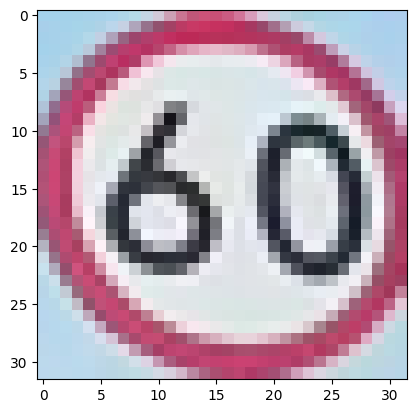

The traffic is: B-33 | Model predicted: B-33 | Class name: Ograniczenie prędkości


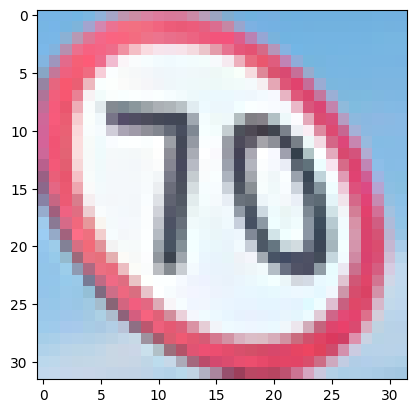

The traffic is: B-33 | Model predicted: B-33 | Class name: Ograniczenie prędkości


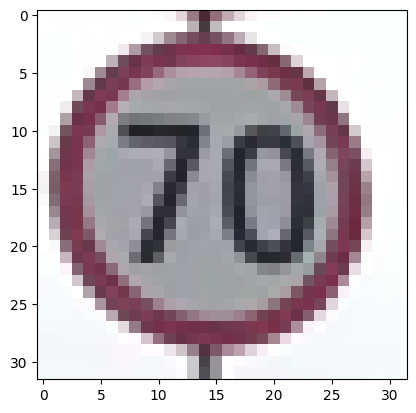

The traffic is: B-33 | Model predicted: B-33 | Class name: Ograniczenie prędkości


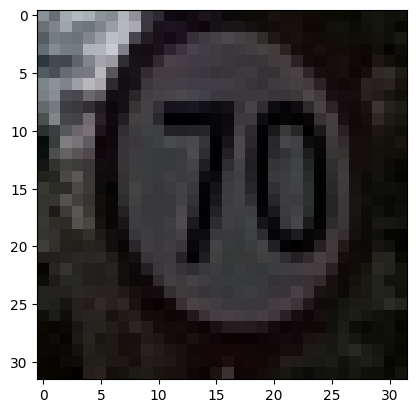

The traffic is: B-33 | Model predicted: B-33 | Class name: Ograniczenie prędkości


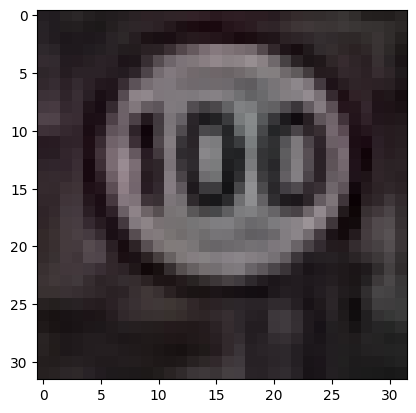

The traffic is: B-33 | Model predicted: B-33 | Class name: Ograniczenie prędkości


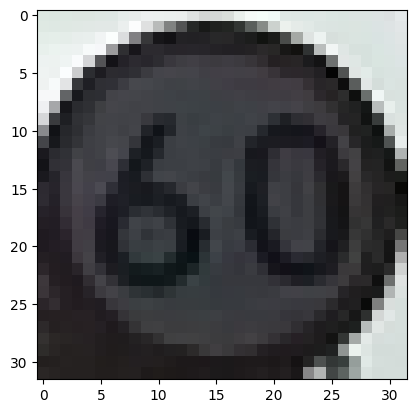

The traffic is: B-33 | Model predicted: B-33 | Class name: Ograniczenie prędkości


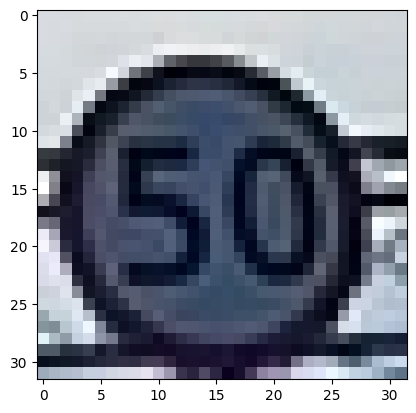

The traffic is: B-33 | Model predicted: B-33 | Class name: Ograniczenie prędkości


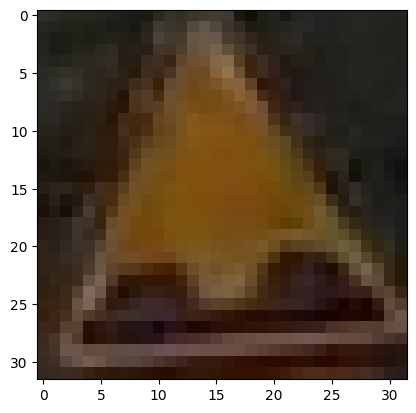

The traffic is: A-11 | Model predicted: D-1 | Class name: Droga z pierwszeństwem


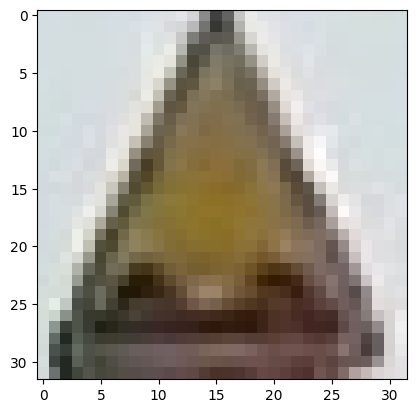

The traffic is: A-11 | Model predicted: D-1 | Class name: Droga z pierwszeństwem


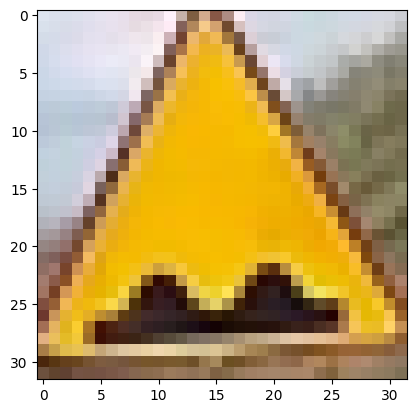

The traffic is: A-11 | Model predicted: A-11 | Class name: Nierówna droga


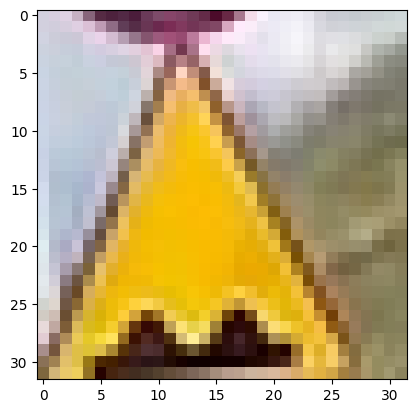

The traffic is: A-11 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


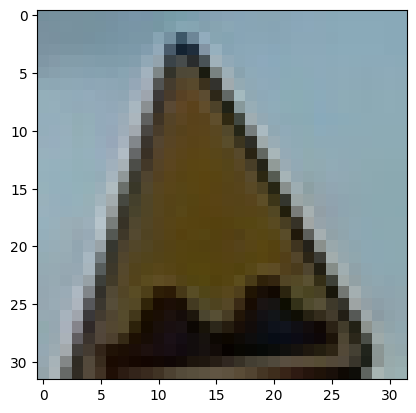

The traffic is: A-11 | Model predicted: D-1 | Class name: Droga z pierwszeństwem


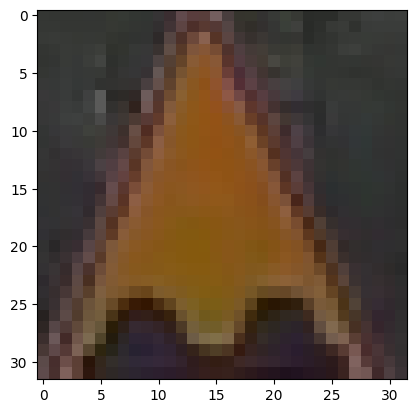

The traffic is: A-11 | Model predicted: A-32 | Class name: Oszronienie jezdni


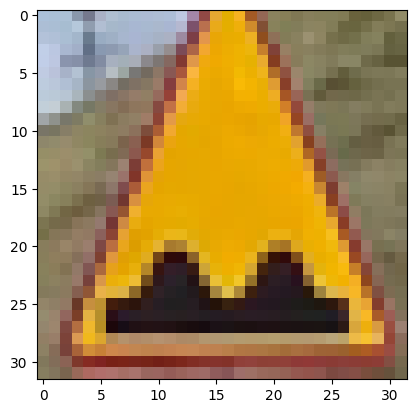

The traffic is: A-11 | Model predicted: A-11 | Class name: Nierówna droga


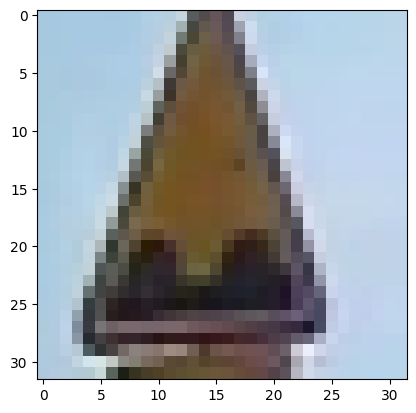

The traffic is: A-11 | Model predicted: A-17 | Class name: Dzieci


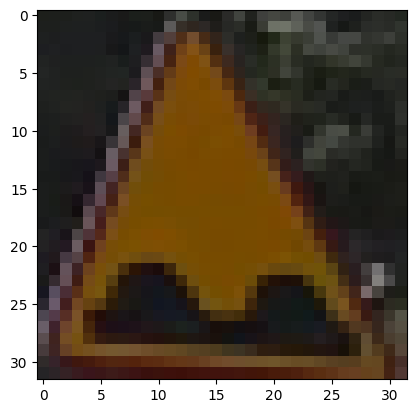

The traffic is: A-11 | Model predicted: D-1 | Class name: Droga z pierwszeństwem


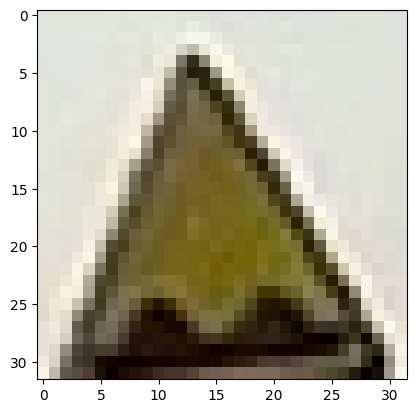

The traffic is: A-11 | Model predicted: D-1 | Class name: Droga z pierwszeństwem


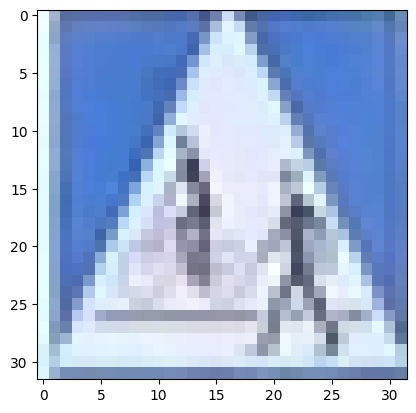

The traffic is: D-6b | Model predicted: D-6b | Class name: Przejście dla pieszych i przejazd dla rowerzystów


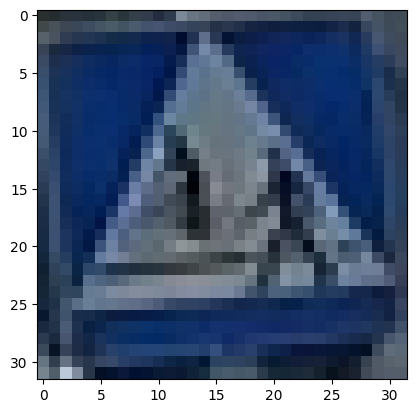

The traffic is: D-6b | Model predicted: D-6b | Class name: Przejście dla pieszych i przejazd dla rowerzystów


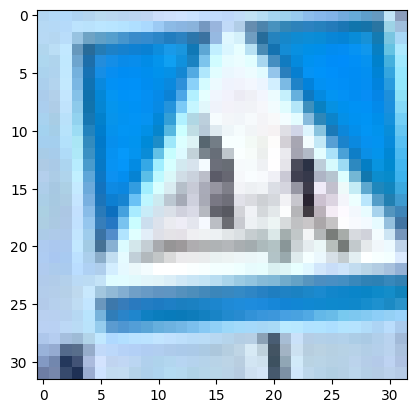

The traffic is: D-6b | Model predicted: D-6b | Class name: Przejście dla pieszych i przejazd dla rowerzystów


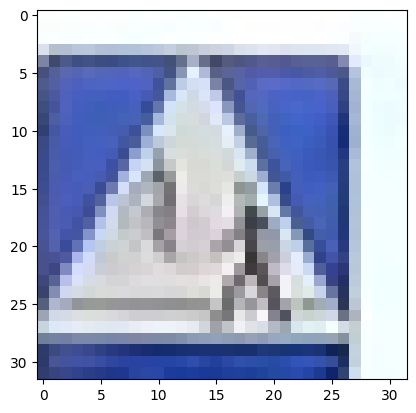

The traffic is: D-6b | Model predicted: D-6b | Class name: Przejście dla pieszych i przejazd dla rowerzystów


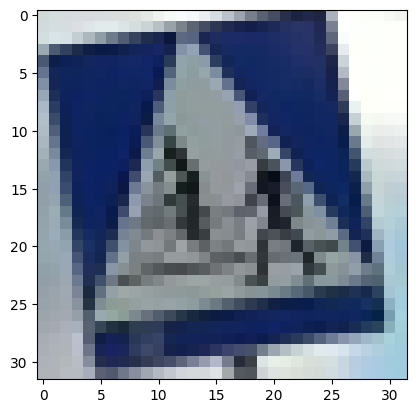

The traffic is: D-6b | Model predicted: D-6b | Class name: Przejście dla pieszych i przejazd dla rowerzystów


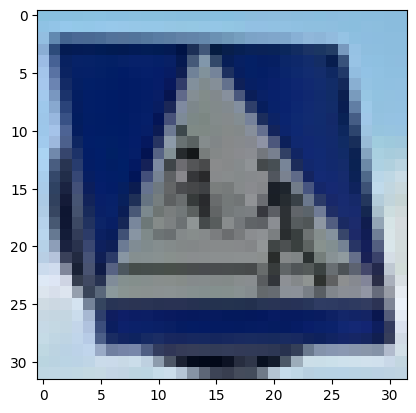

The traffic is: D-6b | Model predicted: D-6b | Class name: Przejście dla pieszych i przejazd dla rowerzystów


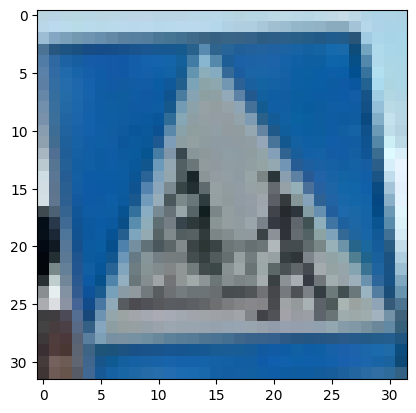

The traffic is: D-6b | Model predicted: D-6b | Class name: Przejście dla pieszych i przejazd dla rowerzystów


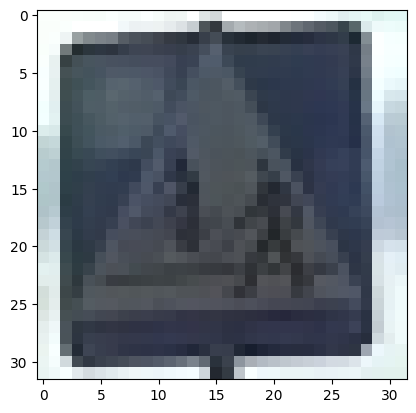

The traffic is: D-6b | Model predicted: D-6b | Class name: Przejście dla pieszych i przejazd dla rowerzystów


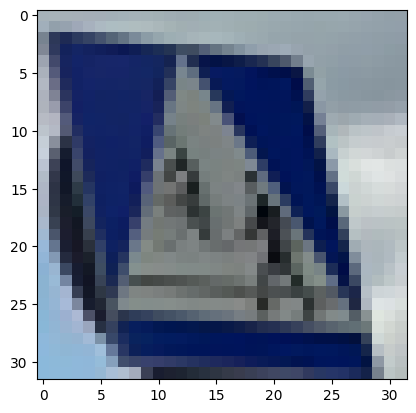

The traffic is: D-6b | Model predicted: D-6b | Class name: Przejście dla pieszych i przejazd dla rowerzystów


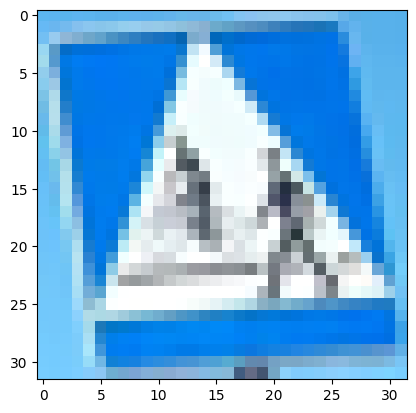

The traffic is: D-6b | Model predicted: D-6b | Class name: Przejście dla pieszych i przejazd dla rowerzystów


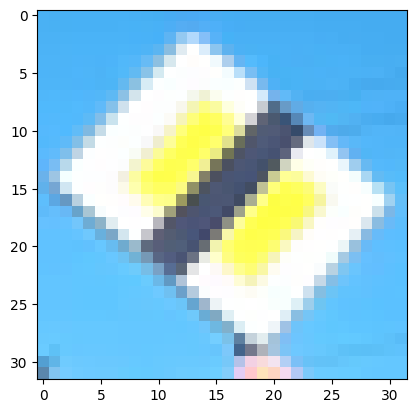

The traffic is: D-2 | Model predicted: D-2 | Class name: Koniec drogi z pierwszeństwem


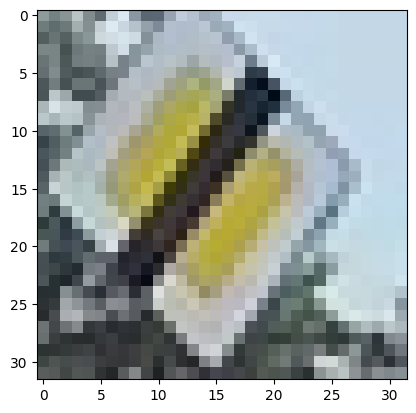

The traffic is: D-2 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


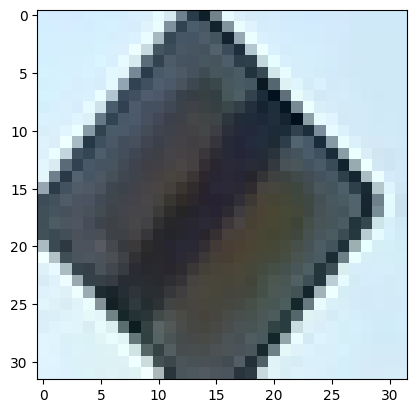

The traffic is: D-2 | Model predicted: D-1 | Class name: Droga z pierwszeństwem


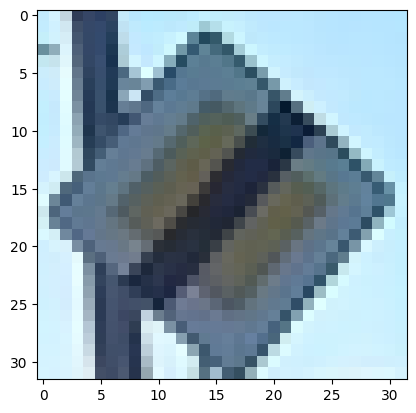

The traffic is: D-2 | Model predicted: D-2 | Class name: Koniec drogi z pierwszeństwem


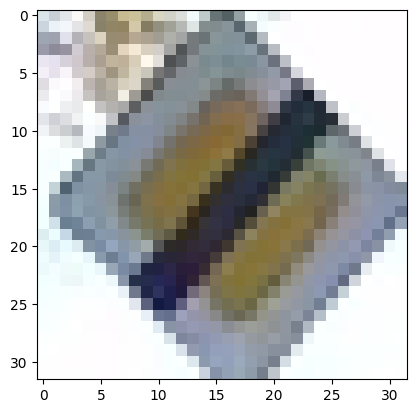

The traffic is: D-2 | Model predicted: D-2 | Class name: Koniec drogi z pierwszeństwem


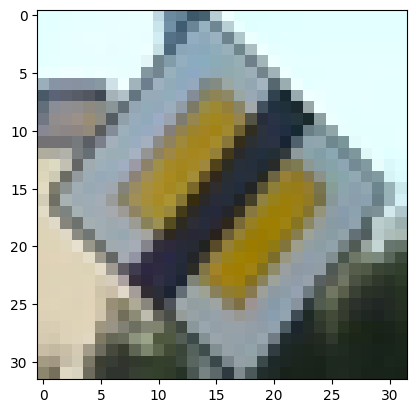

The traffic is: D-2 | Model predicted: D-2 | Class name: Koniec drogi z pierwszeństwem


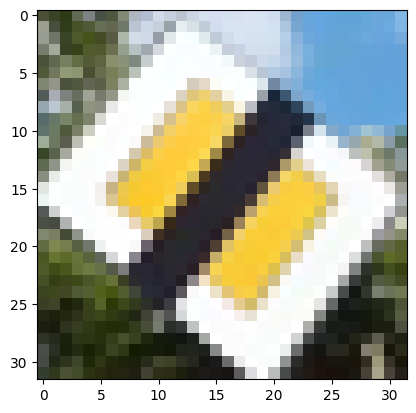

The traffic is: D-2 | Model predicted: D-2 | Class name: Koniec drogi z pierwszeństwem


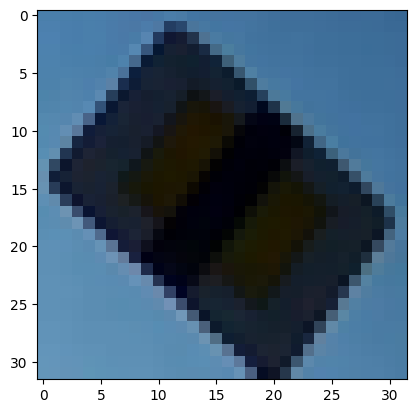

The traffic is: D-2 | Model predicted: D-2 | Class name: Koniec drogi z pierwszeństwem


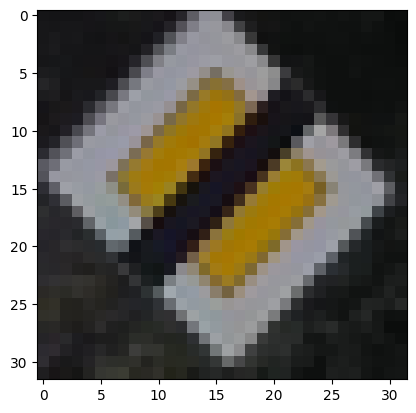

The traffic is: D-2 | Model predicted: D-2 | Class name: Koniec drogi z pierwszeństwem


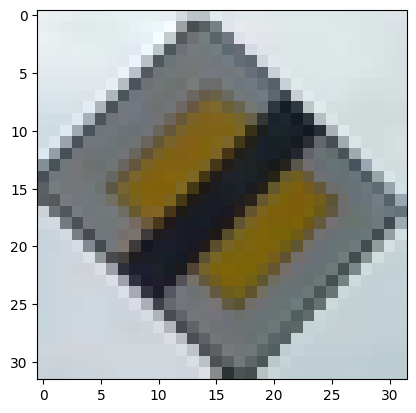

The traffic is: D-2 | Model predicted: D-2 | Class name: Koniec drogi z pierwszeństwem


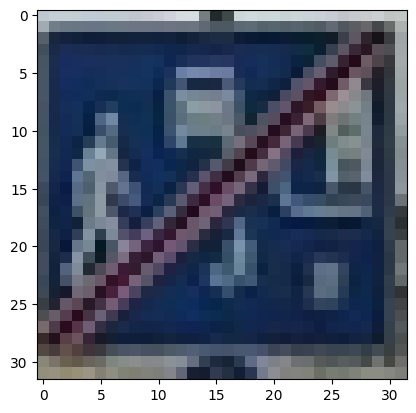

The traffic is: D-41 | Model predicted: D-41 | Class name: Koniec strefy zamieszkania


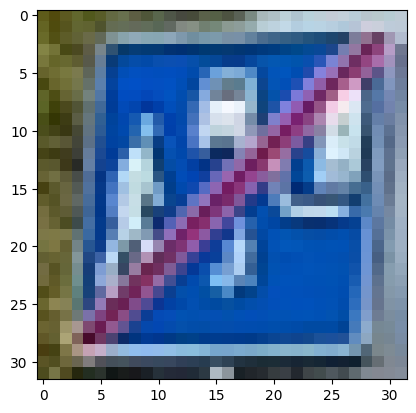

The traffic is: D-41 | Model predicted: D-41 | Class name: Koniec strefy zamieszkania


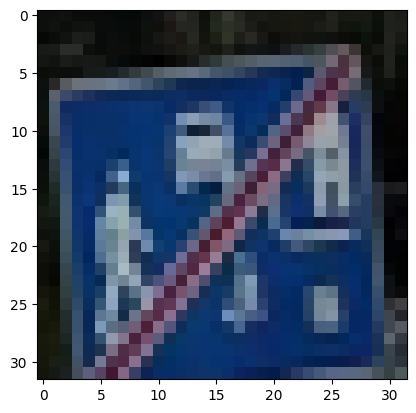

The traffic is: D-41 | Model predicted: D-6b | Class name: Przejście dla pieszych i przejazd dla rowerzystów


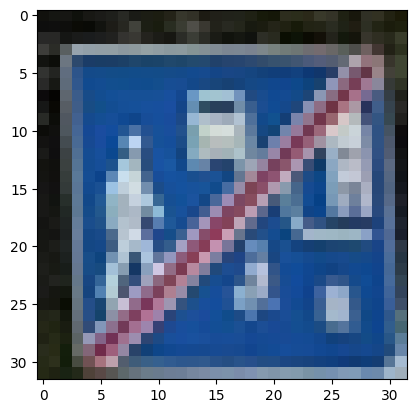

The traffic is: D-41 | Model predicted: D-41 | Class name: Koniec strefy zamieszkania


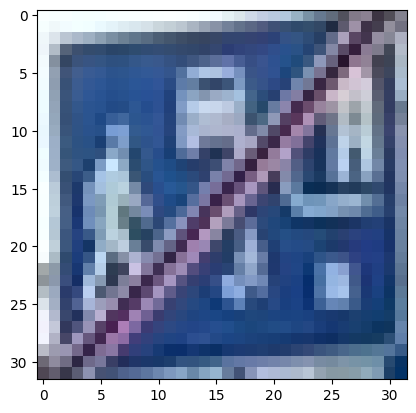

The traffic is: D-41 | Model predicted: D-41 | Class name: Koniec strefy zamieszkania


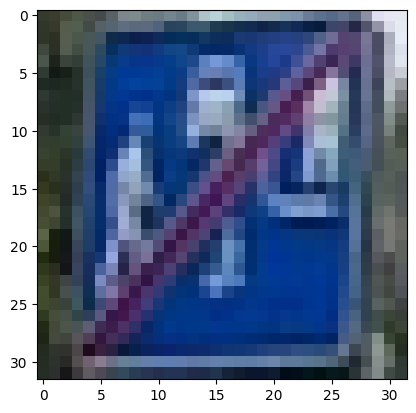

The traffic is: D-41 | Model predicted: D-41 | Class name: Koniec strefy zamieszkania


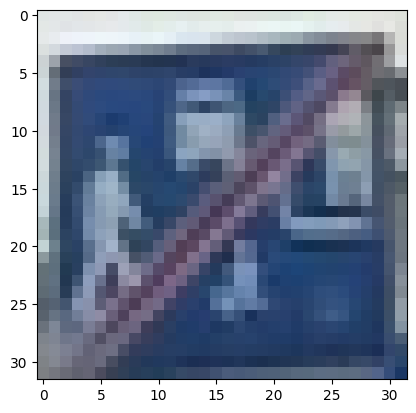

The traffic is: D-41 | Model predicted: D-41 | Class name: Koniec strefy zamieszkania


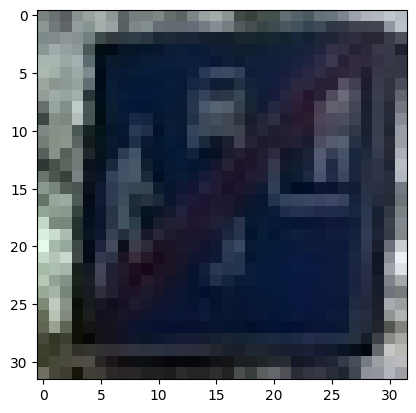

The traffic is: D-41 | Model predicted: D-41 | Class name: Koniec strefy zamieszkania


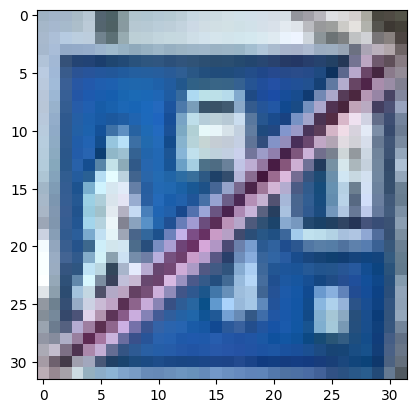

The traffic is: D-41 | Model predicted: D-41 | Class name: Koniec strefy zamieszkania


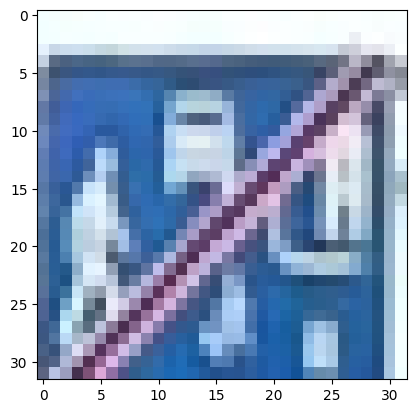

The traffic is: D-41 | Model predicted: D-6 | Class name: Przejście dla pieszych


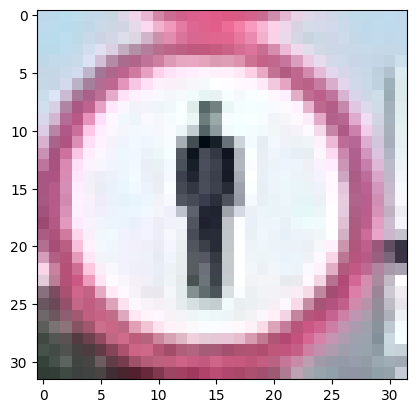

The traffic is: B-41 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


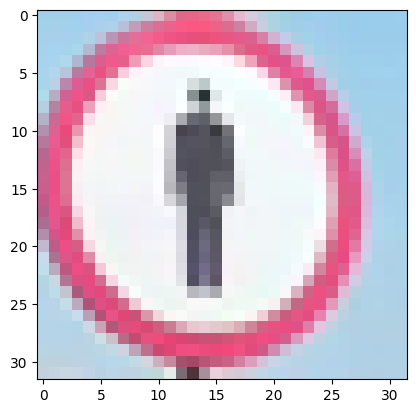

The traffic is: B-41 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


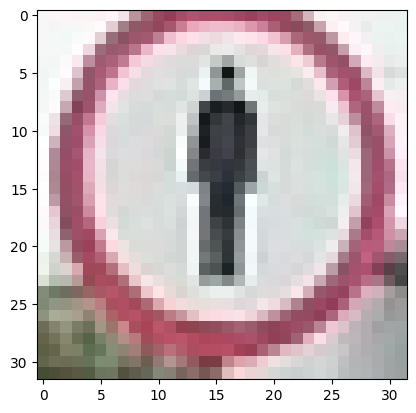

The traffic is: B-41 | Model predicted: B-42 | Class name: Koniec zakazów


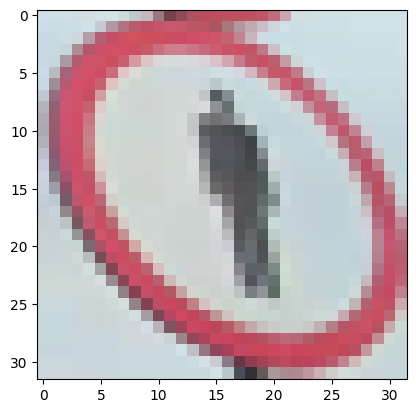

The traffic is: B-41 | Model predicted: B-33 | Class name: Ograniczenie prędkości


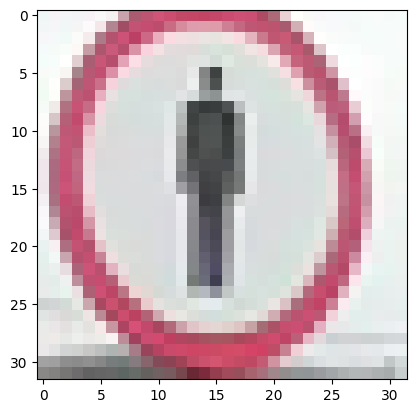

The traffic is: B-41 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


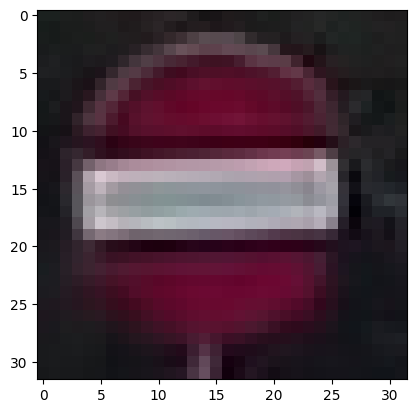

The traffic is: B-2 | Model predicted: B-2 | Class name: Zakaz wjazdu


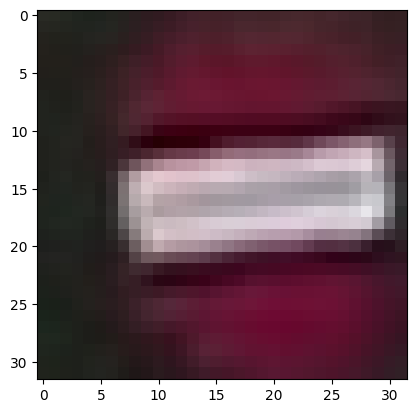

The traffic is: B-2 | Model predicted: B-2 | Class name: Zakaz wjazdu


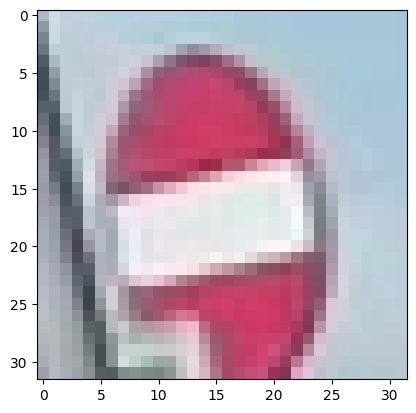

The traffic is: B-2 | Model predicted: B-2 | Class name: Zakaz wjazdu


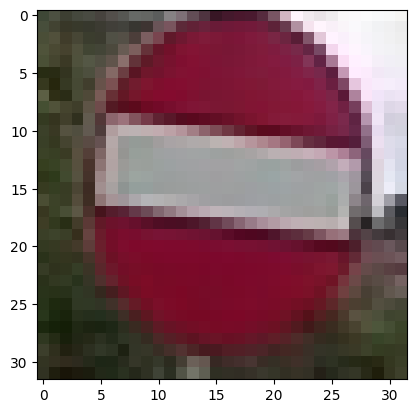

The traffic is: B-2 | Model predicted: B-20 | Class name: STOP


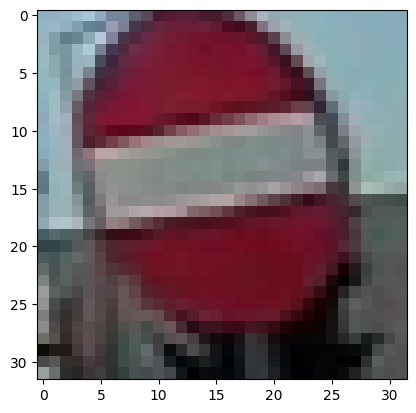

The traffic is: B-2 | Model predicted: B-20 | Class name: STOP


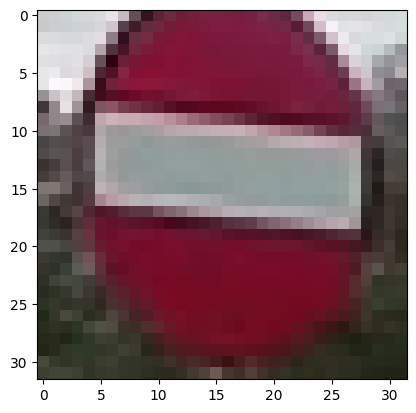

The traffic is: B-2 | Model predicted: B-20 | Class name: STOP


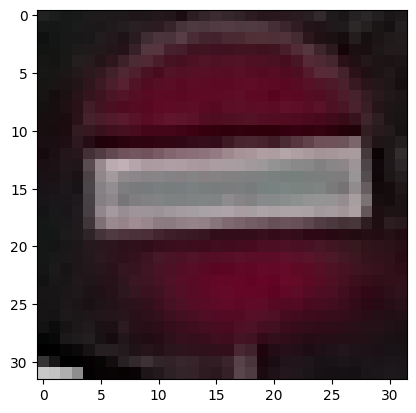

The traffic is: B-2 | Model predicted: B-2 | Class name: Zakaz wjazdu


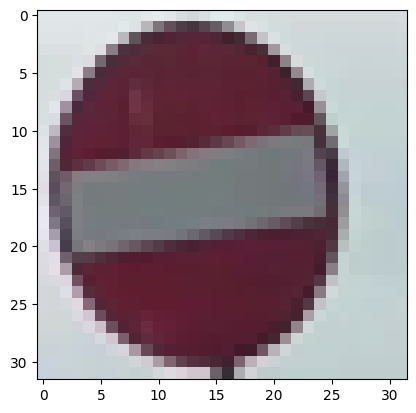

The traffic is: B-2 | Model predicted: B-2 | Class name: Zakaz wjazdu


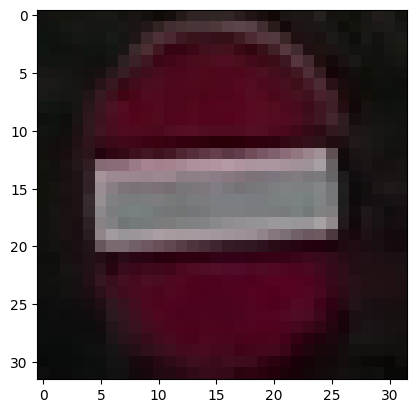

The traffic is: B-2 | Model predicted: B-2 | Class name: Zakaz wjazdu


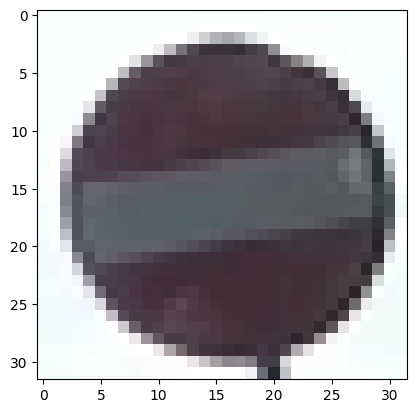

The traffic is: B-2 | Model predicted: B-2 | Class name: Zakaz wjazdu


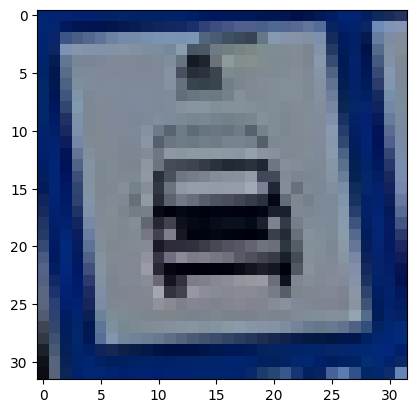

The traffic is: D-26b | Model predicted: D-23 | Class name: Stacja paliwowa


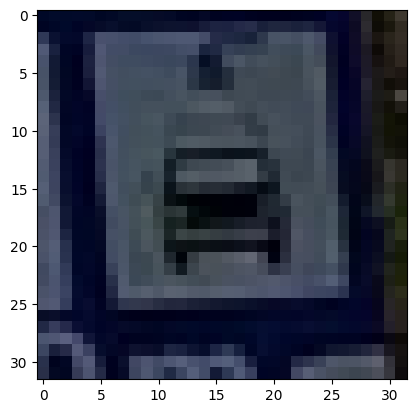

The traffic is: D-26b | Model predicted: D-23 | Class name: Stacja paliwowa


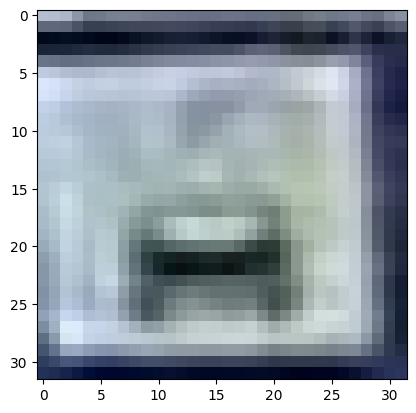

The traffic is: D-26b | Model predicted: A-17 | Class name: Dzieci


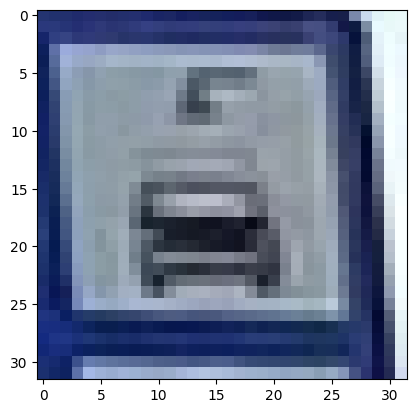

The traffic is: D-26b | Model predicted: D-23 | Class name: Stacja paliwowa


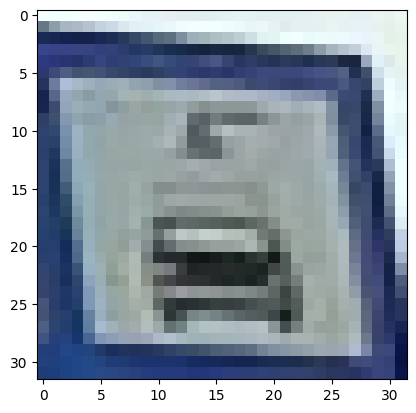

The traffic is: D-26b | Model predicted: D-26b | Class name: Myjnia


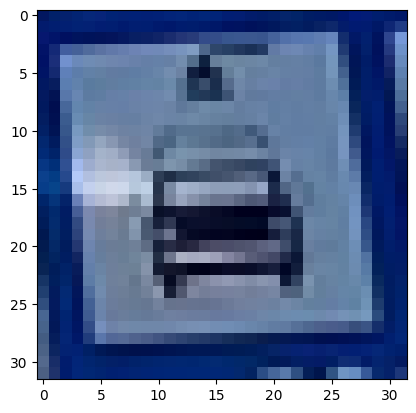

The traffic is: D-26b | Model predicted: D-23 | Class name: Stacja paliwowa


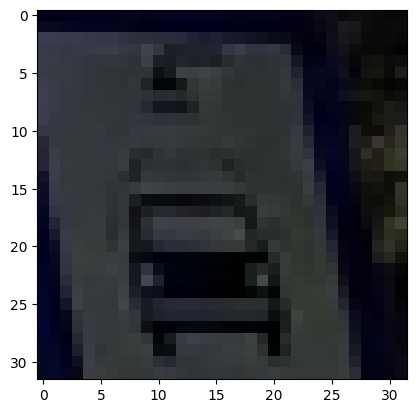

The traffic is: D-26b | Model predicted: D-23a | Class name: Stacja paliwowa tylko z gazem do napędu pojazdów


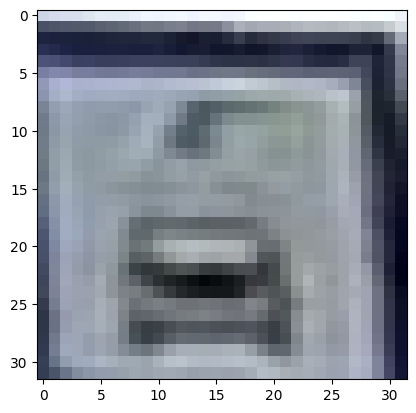

The traffic is: D-26b | Model predicted: D-23a | Class name: Stacja paliwowa tylko z gazem do napędu pojazdów


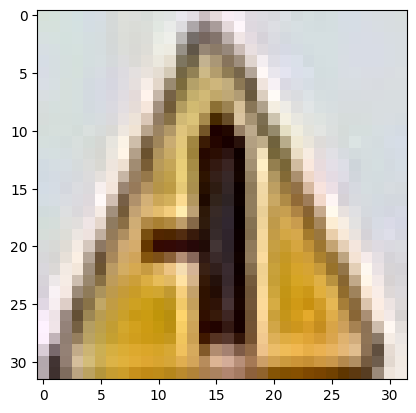

The traffic is: A-6c | Model predicted: A-6c | Class name: Skrzyżowanie z drogą podporządkowaną występującą po lewej stronie


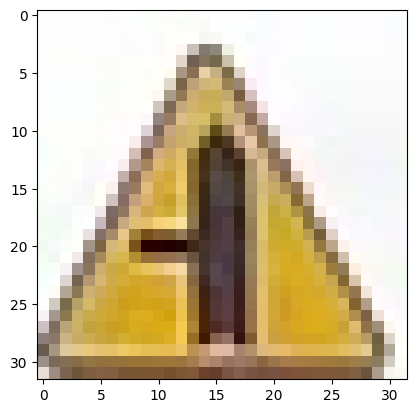

The traffic is: A-6c | Model predicted: A-6c | Class name: Skrzyżowanie z drogą podporządkowaną występującą po lewej stronie


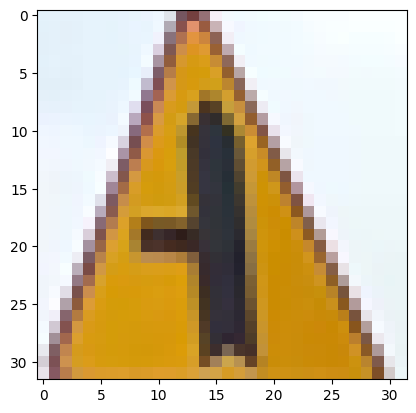

The traffic is: A-6c | Model predicted: A-6c | Class name: Skrzyżowanie z drogą podporządkowaną występującą po lewej stronie


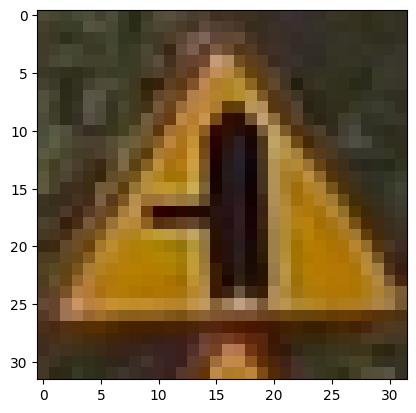

The traffic is: A-6c | Model predicted: A-6c | Class name: Skrzyżowanie z drogą podporządkowaną występującą po lewej stronie


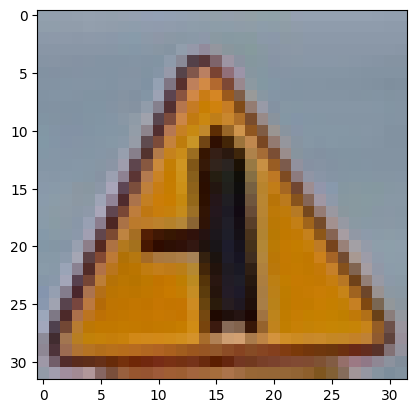

The traffic is: A-6c | Model predicted: A-6c | Class name: Skrzyżowanie z drogą podporządkowaną występującą po lewej stronie


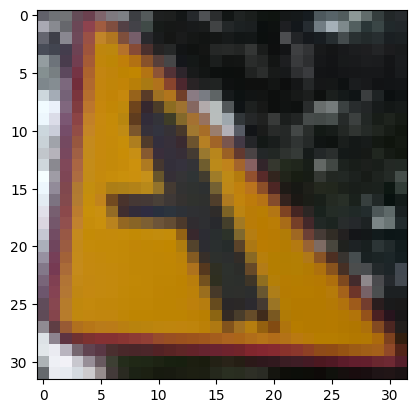

The traffic is: A-6c | Model predicted: A-32 | Class name: Oszronienie jezdni


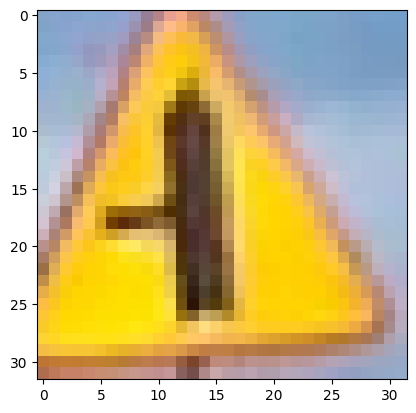

The traffic is: A-6c | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


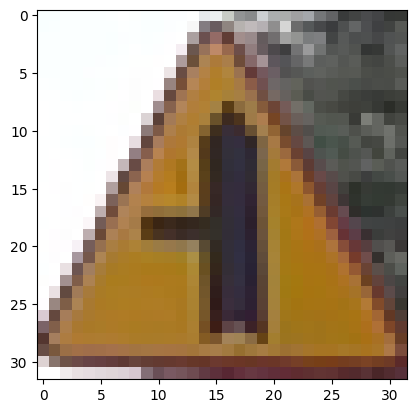

The traffic is: A-6c | Model predicted: A-6c | Class name: Skrzyżowanie z drogą podporządkowaną występującą po lewej stronie


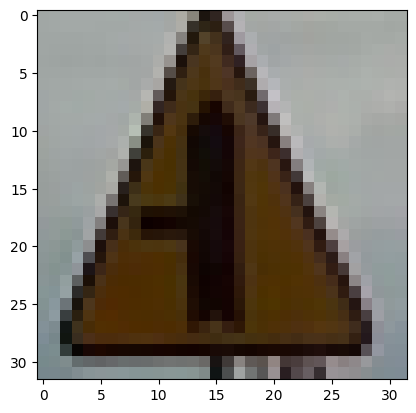

The traffic is: A-6c | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


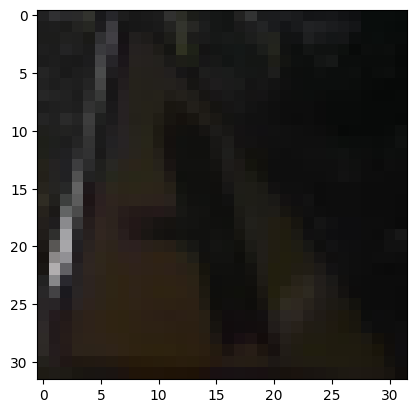

The traffic is: A-6c | Model predicted: A-6c | Class name: Skrzyżowanie z drogą podporządkowaną występującą po lewej stronie


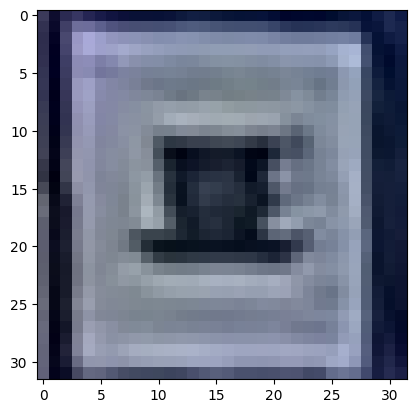

The traffic is: D-27 | Model predicted: C-12 | Class name: Ruch okrężny


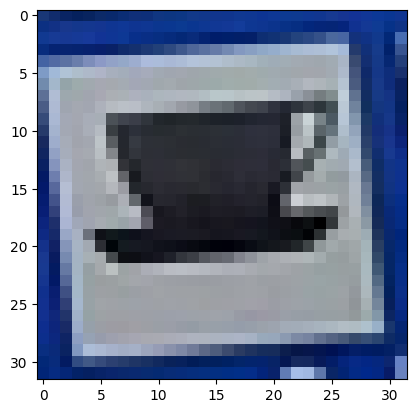

The traffic is: D-27 | Model predicted: A-6a | Class name: Skrzyżowanie z drogą podporządkowaną występującą po obu stronach


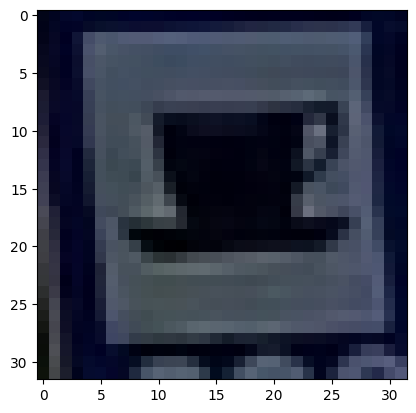

The traffic is: D-27 | Model predicted: C-12 | Class name: Ruch okrężny


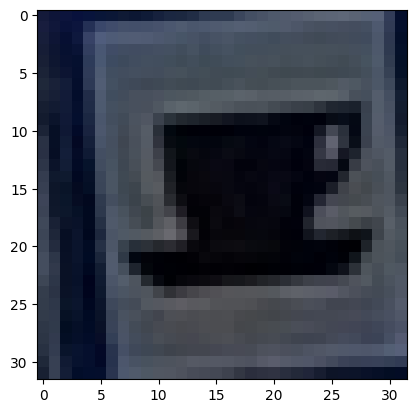

The traffic is: D-27 | Model predicted: D-23 | Class name: Stacja paliwowa


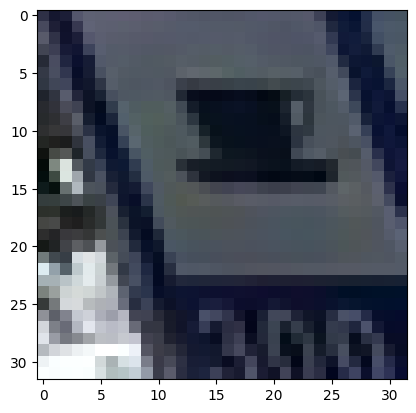

The traffic is: D-27 | Model predicted: C-9 | Class name: Nakaz jazdy z prawej strony znaku


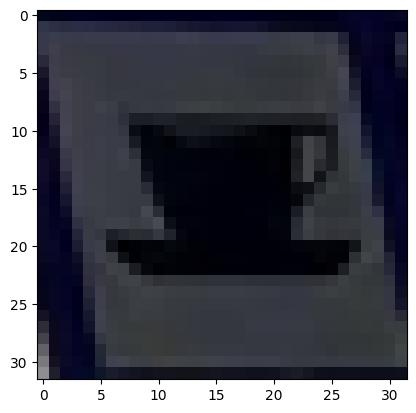

The traffic is: D-27 | Model predicted: A-6a | Class name: Skrzyżowanie z drogą podporządkowaną występującą po obu stronach


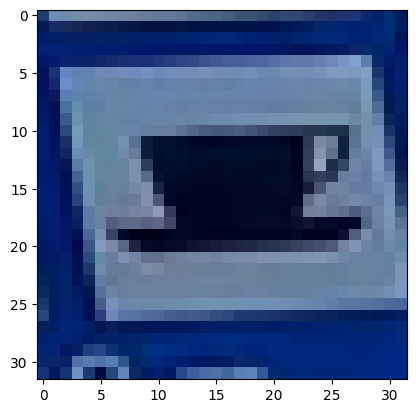

The traffic is: D-27 | Model predicted: D-26c | Class name: Toaleta publiczna


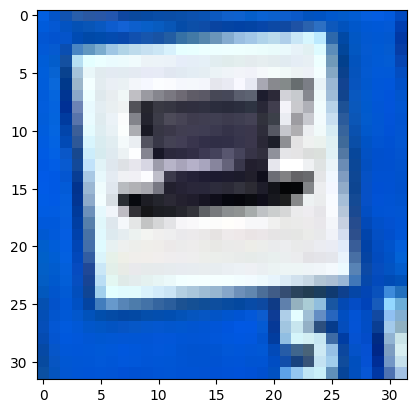

The traffic is: D-27 | Model predicted: A-16 | Class name: Przejście dla pieszych


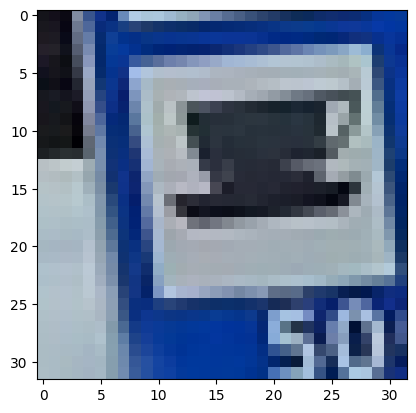

The traffic is: D-27 | Model predicted: B-33 | Class name: Ograniczenie prędkości


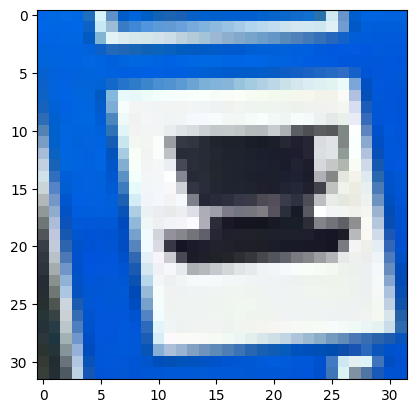

The traffic is: D-27 | Model predicted: D-23 | Class name: Stacja paliwowa


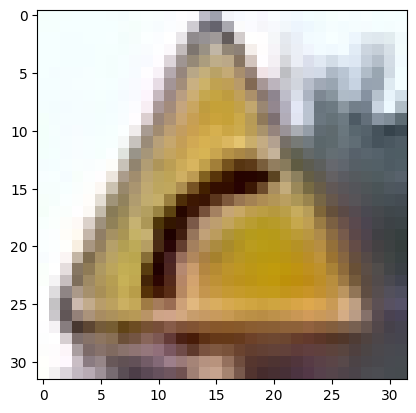

The traffic is: A-1 | Model predicted: A-1 | Class name: Niebezpieczny zakręt w prawo


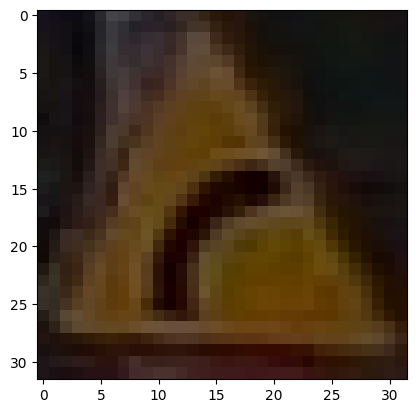

The traffic is: A-1 | Model predicted: A-1 | Class name: Niebezpieczny zakręt w prawo


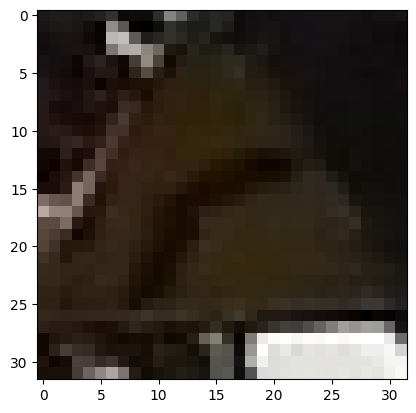

The traffic is: A-1 | Model predicted: A-1 | Class name: Niebezpieczny zakręt w prawo


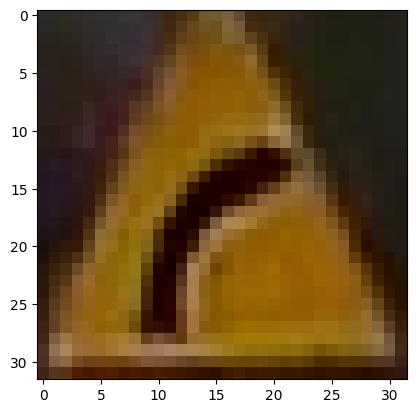

The traffic is: A-1 | Model predicted: A-1 | Class name: Niebezpieczny zakręt w prawo


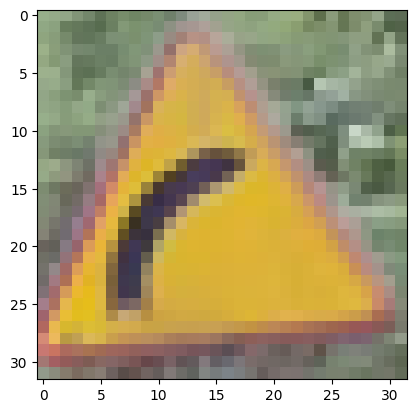

The traffic is: A-1 | Model predicted: A-1 | Class name: Niebezpieczny zakręt w prawo


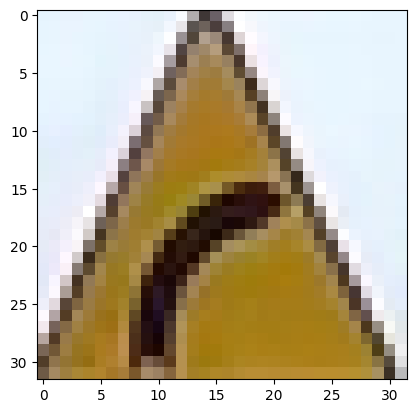

The traffic is: A-1 | Model predicted: A-1 | Class name: Niebezpieczny zakręt w prawo


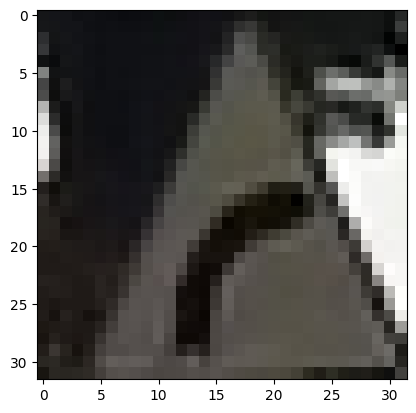

The traffic is: A-1 | Model predicted: A-6b | Class name: Skrzyżowanie z drogą podporządkowaną występującą po prawej stronie


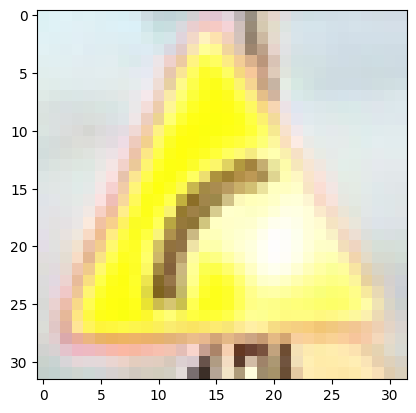

The traffic is: A-1 | Model predicted: A-1 | Class name: Niebezpieczny zakręt w prawo


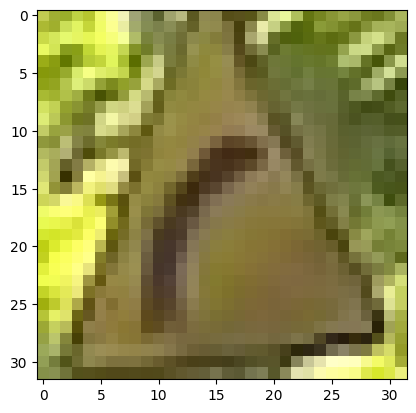

The traffic is: A-1 | Model predicted: A-1 | Class name: Niebezpieczny zakręt w prawo


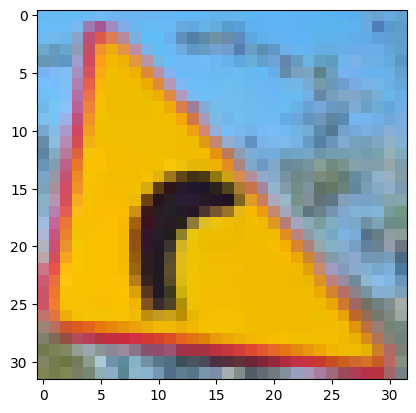

The traffic is: A-1 | Model predicted: A-1 | Class name: Niebezpieczny zakręt w prawo


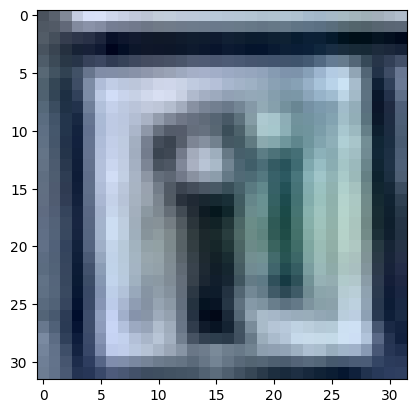

The traffic is: D-23 | Model predicted: D-23 | Class name: Stacja paliwowa


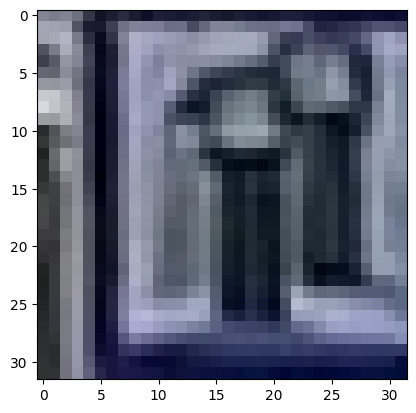

The traffic is: D-23 | Model predicted: B-33 | Class name: Ograniczenie prędkości


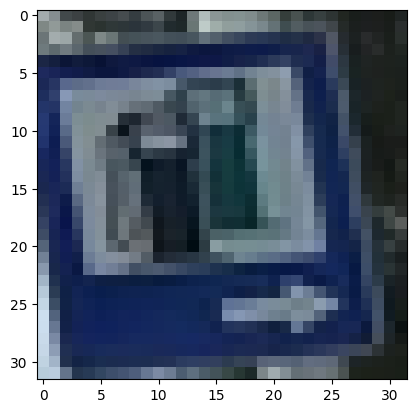

The traffic is: D-23 | Model predicted: D-23 | Class name: Stacja paliwowa


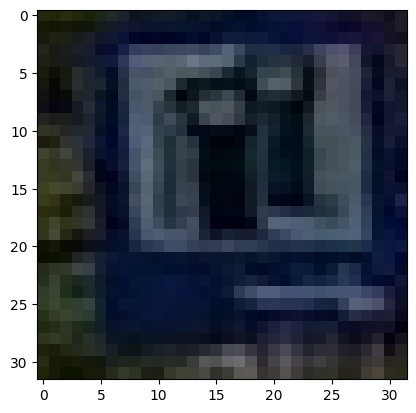

The traffic is: D-23 | Model predicted: D-23 | Class name: Stacja paliwowa


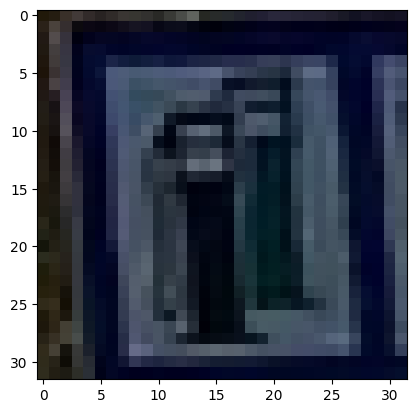

The traffic is: D-23 | Model predicted: D-23 | Class name: Stacja paliwowa


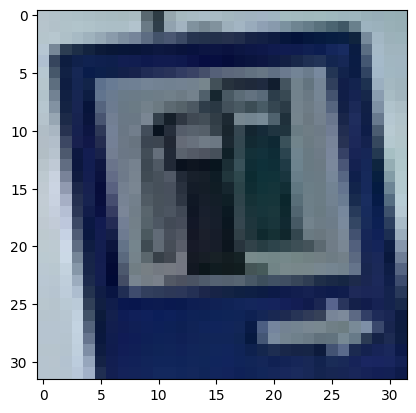

The traffic is: D-23 | Model predicted: D-23 | Class name: Stacja paliwowa


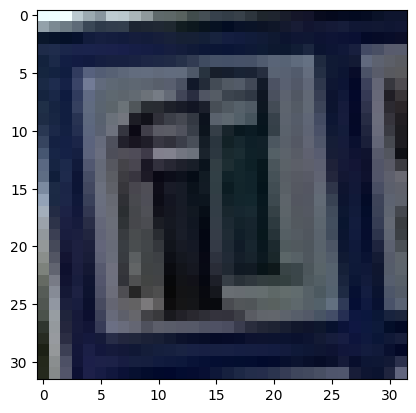

The traffic is: D-23 | Model predicted: D-23 | Class name: Stacja paliwowa


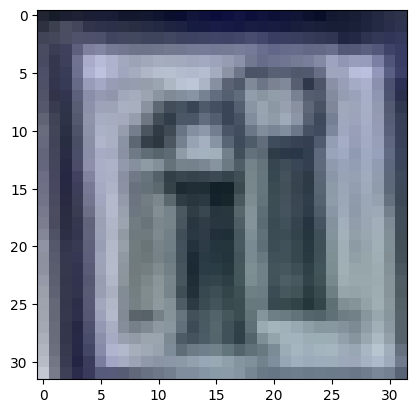

The traffic is: D-23 | Model predicted: D-23 | Class name: Stacja paliwowa


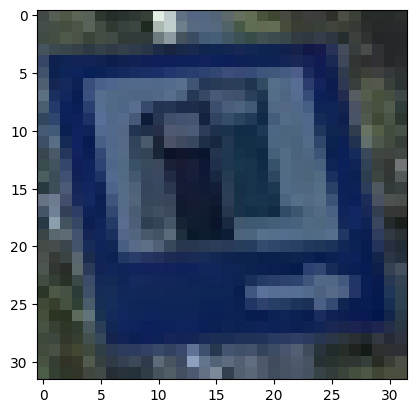

The traffic is: D-23 | Model predicted: D-23 | Class name: Stacja paliwowa


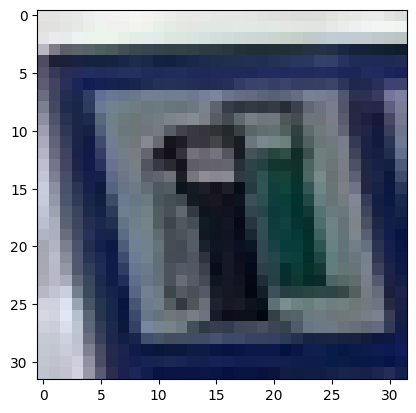

The traffic is: D-23 | Model predicted: D-23 | Class name: Stacja paliwowa


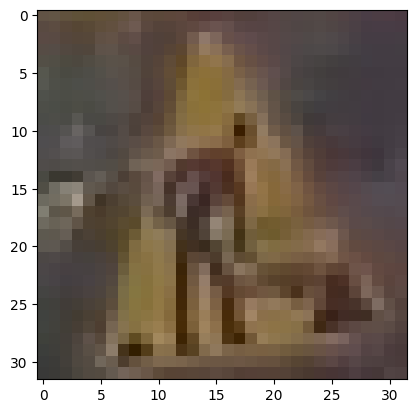

The traffic is: A-14 | Model predicted: A-32 | Class name: Oszronienie jezdni


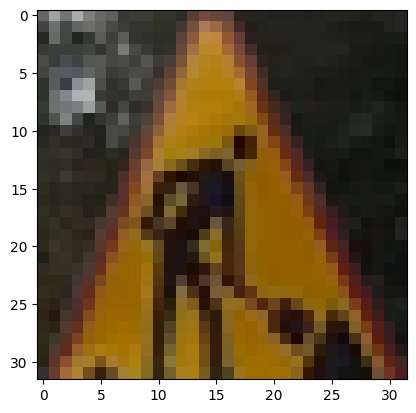

The traffic is: A-14 | Model predicted: A-32 | Class name: Oszronienie jezdni


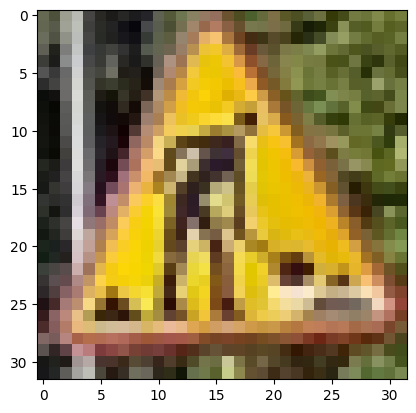

The traffic is: A-14 | Model predicted: A-14 | Class name: Roboty drogowe


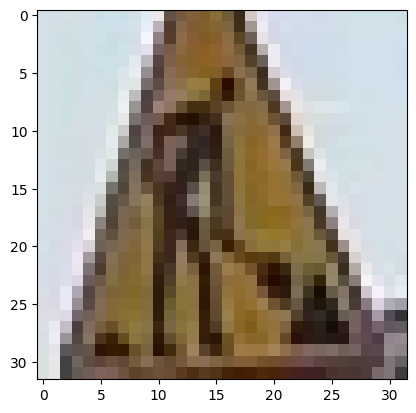

The traffic is: A-14 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


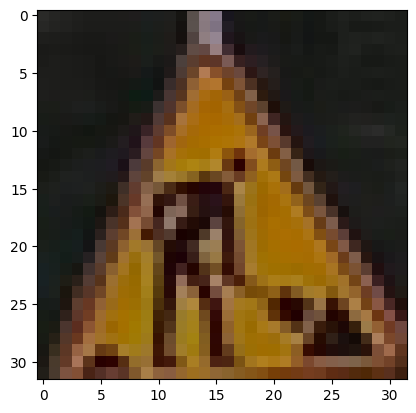

The traffic is: A-14 | Model predicted: A-32 | Class name: Oszronienie jezdni


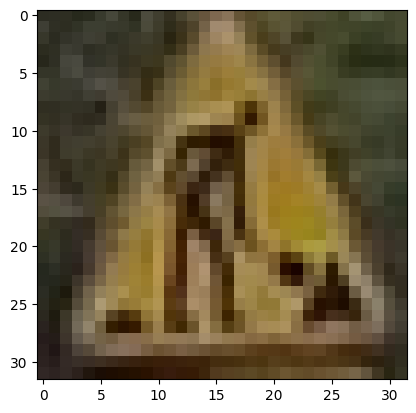

The traffic is: A-14 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


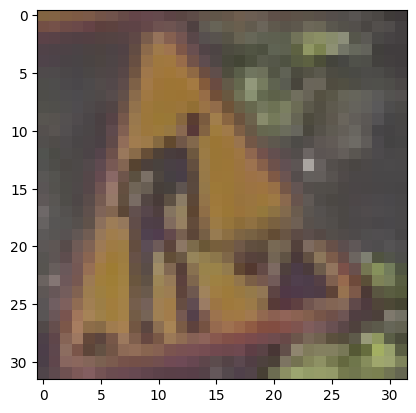

The traffic is: A-14 | Model predicted: B-33 | Class name: Ograniczenie prędkości


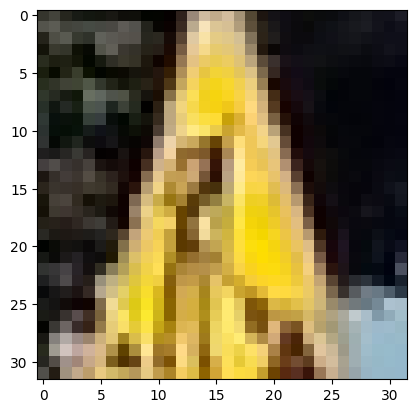

The traffic is: A-14 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


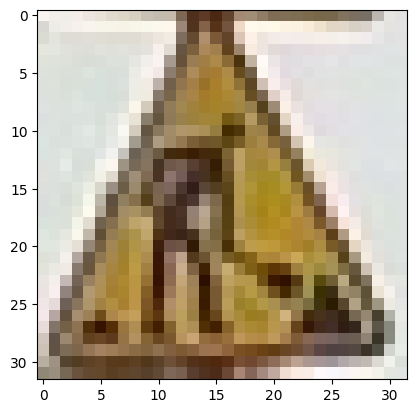

The traffic is: A-14 | Model predicted: A-14 | Class name: Roboty drogowe


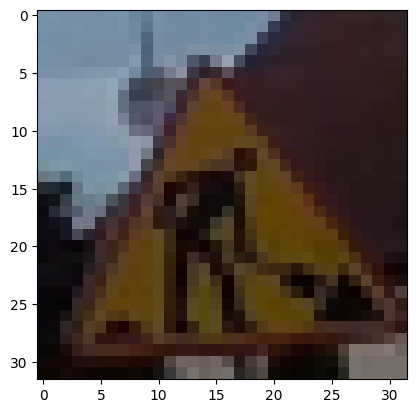

The traffic is: A-14 | Model predicted: A-14 | Class name: Roboty drogowe


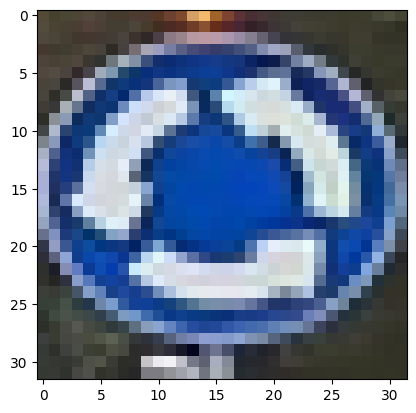

The traffic is: C-12 | Model predicted: C-12 | Class name: Ruch okrężny


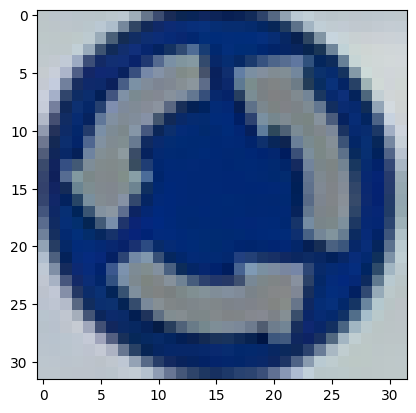

The traffic is: C-12 | Model predicted: C-12 | Class name: Ruch okrężny


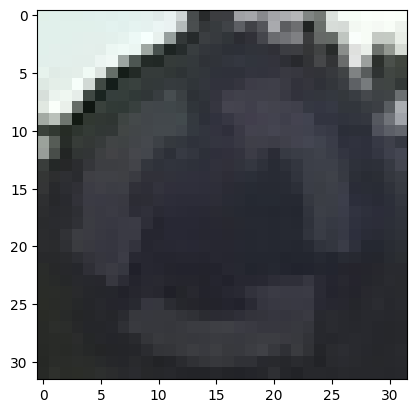

The traffic is: C-12 | Model predicted: A-32 | Class name: Oszronienie jezdni


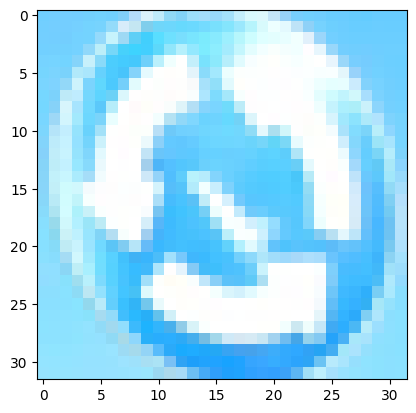

The traffic is: C-12 | Model predicted: C-12 | Class name: Ruch okrężny


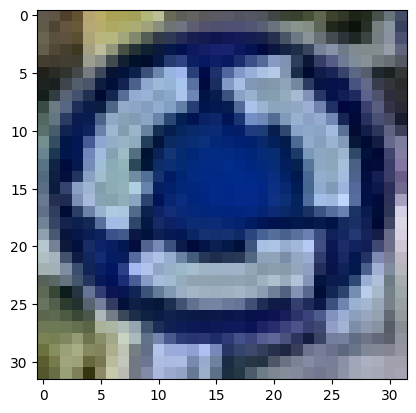

The traffic is: C-12 | Model predicted: C-12 | Class name: Ruch okrężny


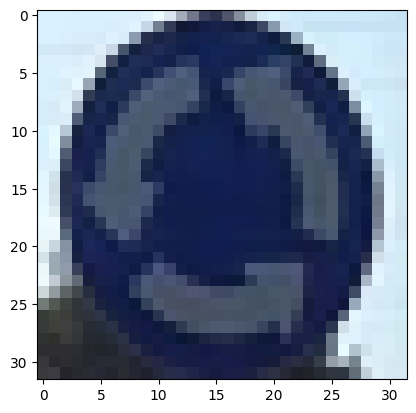

The traffic is: C-12 | Model predicted: C-12 | Class name: Ruch okrężny


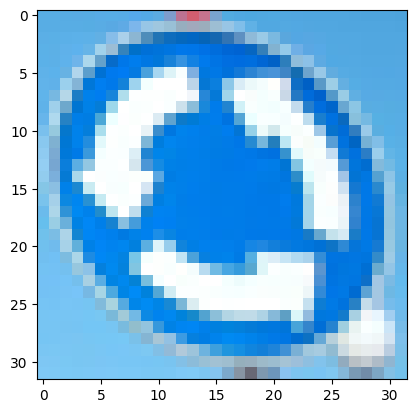

The traffic is: C-12 | Model predicted: C-12 | Class name: Ruch okrężny


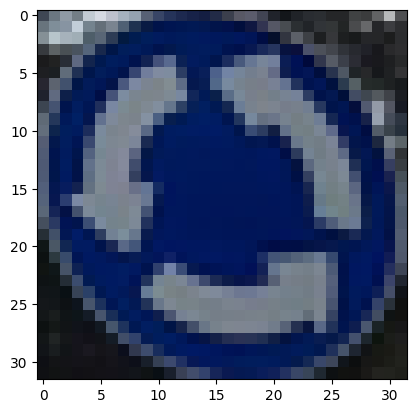

The traffic is: C-12 | Model predicted: C-12 | Class name: Ruch okrężny


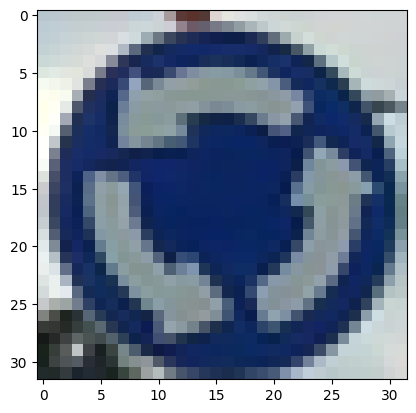

The traffic is: C-12 | Model predicted: C-12 | Class name: Ruch okrężny


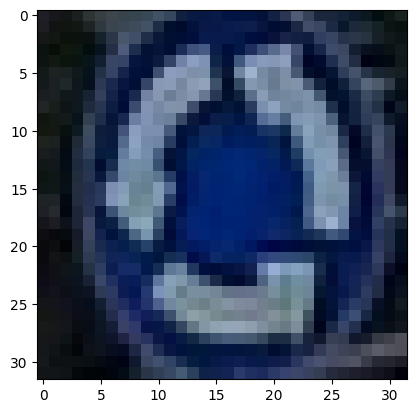

The traffic is: C-12 | Model predicted: C-12 | Class name: Ruch okrężny


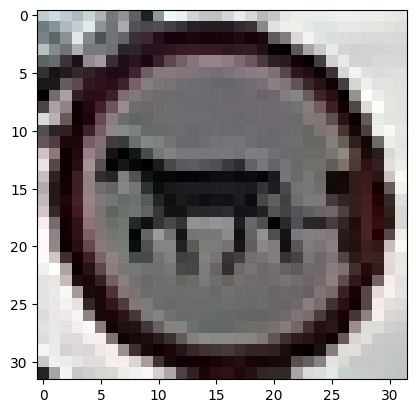

The traffic is: B-8 | Model predicted: B-43 | Class name: Strefa ograniczonej prędkości


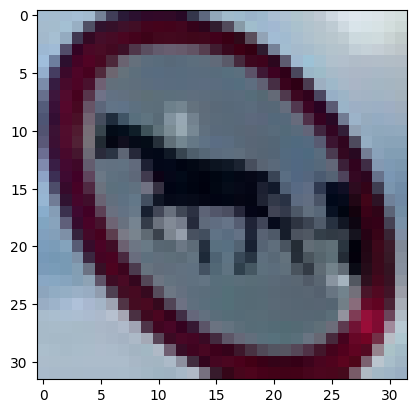

The traffic is: B-8 | Model predicted: B-8 | Class name: Zakaz wjazdu pojazdów zaprzęgowych


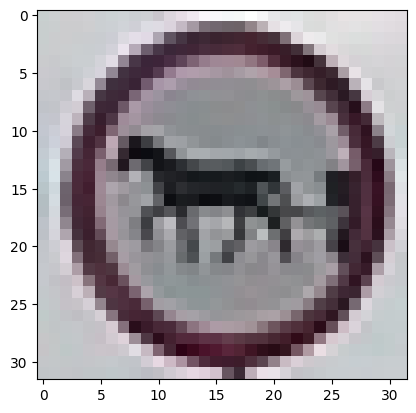

The traffic is: B-8 | Model predicted: B-8 | Class name: Zakaz wjazdu pojazdów zaprzęgowych


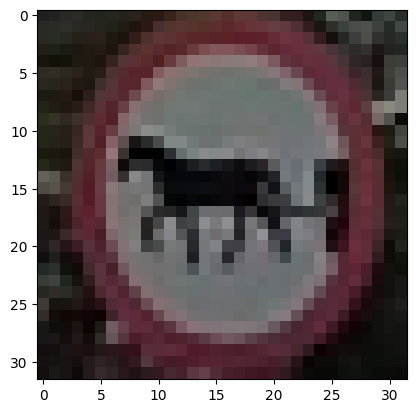

The traffic is: B-8 | Model predicted: B-8 | Class name: Zakaz wjazdu pojazdów zaprzęgowych


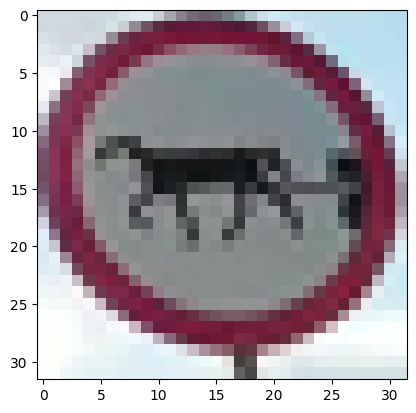

The traffic is: B-8 | Model predicted: B-21 | Class name: Zakaz skręcania w lewo


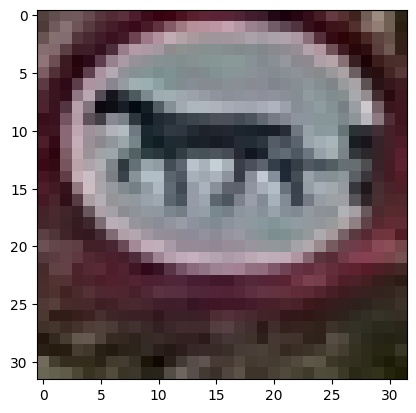

The traffic is: B-8 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


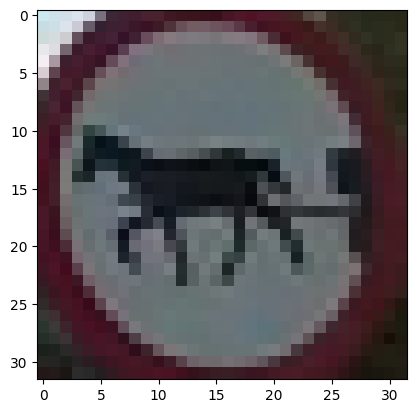

The traffic is: B-8 | Model predicted: B-43 | Class name: Strefa ograniczonej prędkości


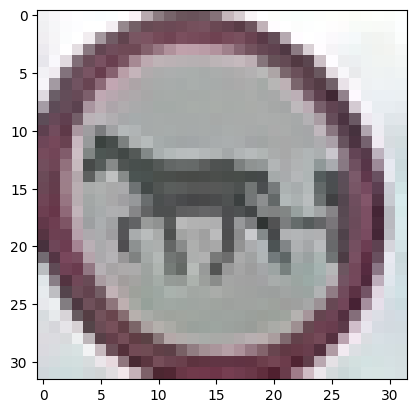

The traffic is: B-8 | Model predicted: D-26c | Class name: Toaleta publiczna


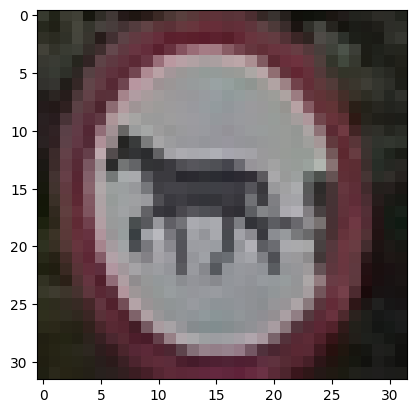

The traffic is: B-8 | Model predicted: B-33 | Class name: Ograniczenie prędkości


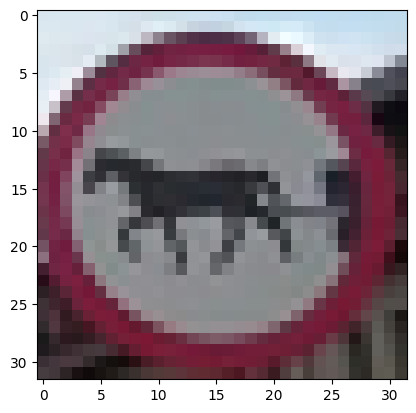

The traffic is: B-8 | Model predicted: B-8 | Class name: Zakaz wjazdu pojazdów zaprzęgowych


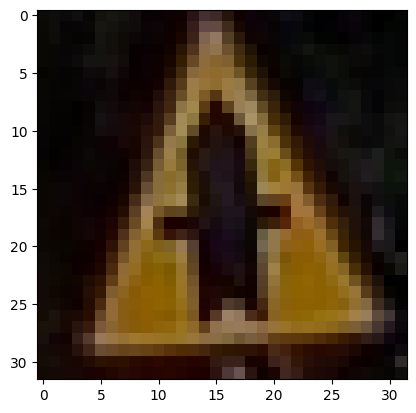

The traffic is: A-6a | Model predicted: A-6a | Class name: Skrzyżowanie z drogą podporządkowaną występującą po obu stronach


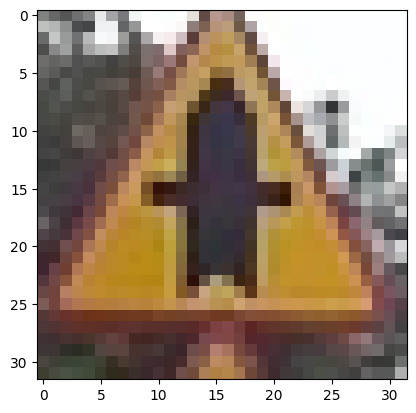

The traffic is: A-6a | Model predicted: A-6a | Class name: Skrzyżowanie z drogą podporządkowaną występującą po obu stronach


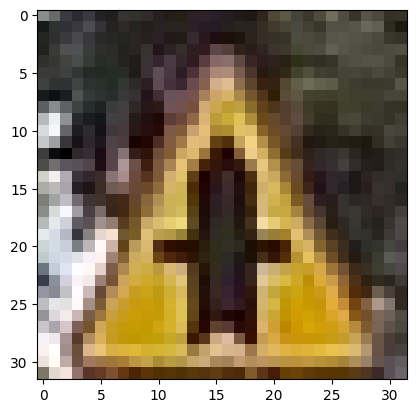

The traffic is: A-6a | Model predicted: A-6a | Class name: Skrzyżowanie z drogą podporządkowaną występującą po obu stronach


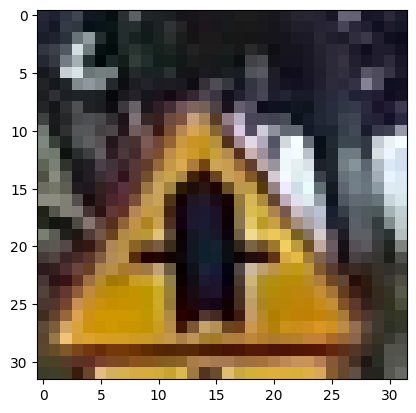

The traffic is: A-6a | Model predicted: A-32 | Class name: Oszronienie jezdni


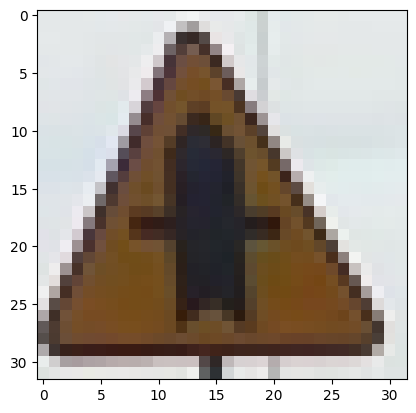

The traffic is: A-6a | Model predicted: A-6a | Class name: Skrzyżowanie z drogą podporządkowaną występującą po obu stronach


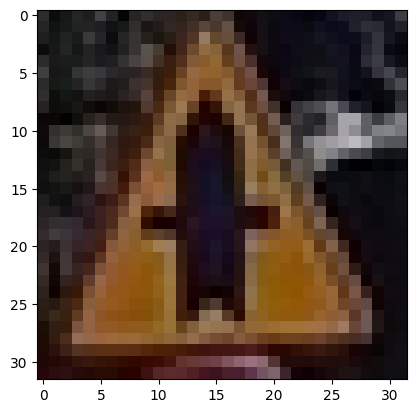

The traffic is: A-6a | Model predicted: A-6a | Class name: Skrzyżowanie z drogą podporządkowaną występującą po obu stronach


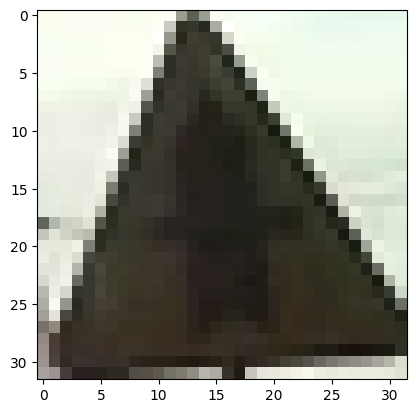

The traffic is: A-6a | Model predicted: A-6a | Class name: Skrzyżowanie z drogą podporządkowaną występującą po obu stronach


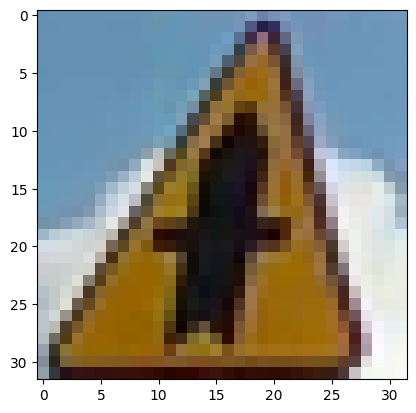

The traffic is: A-6a | Model predicted: A-6a | Class name: Skrzyżowanie z drogą podporządkowaną występującą po obu stronach


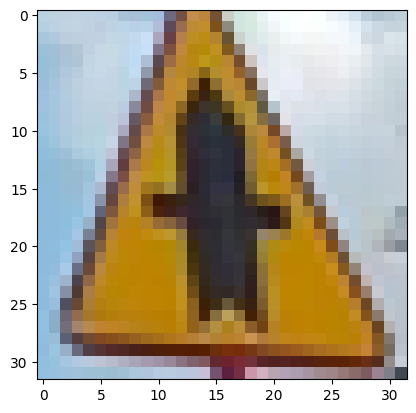

The traffic is: A-6a | Model predicted: A-6a | Class name: Skrzyżowanie z drogą podporządkowaną występującą po obu stronach


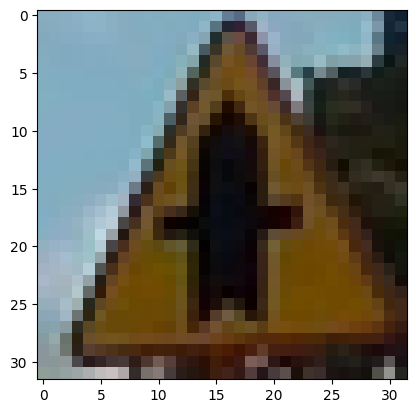

The traffic is: A-6a | Model predicted: A-6a | Class name: Skrzyżowanie z drogą podporządkowaną występującą po obu stronach


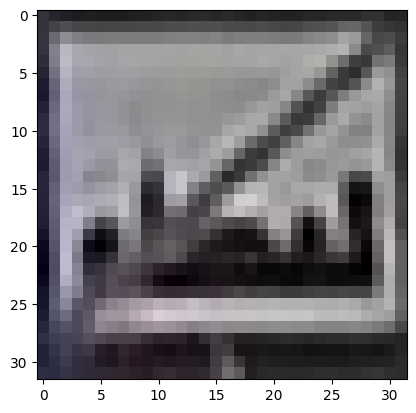

The traffic is: D-43 | Model predicted: D-43 | Class name: Koniec obszaru zabudowanego


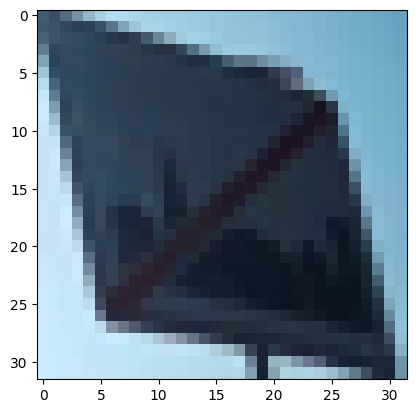

The traffic is: D-43 | Model predicted: D-43 | Class name: Koniec obszaru zabudowanego


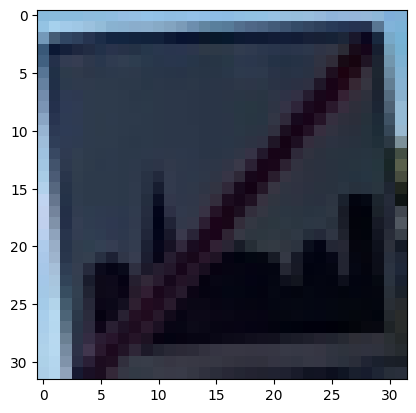

The traffic is: D-43 | Model predicted: D-43 | Class name: Koniec obszaru zabudowanego


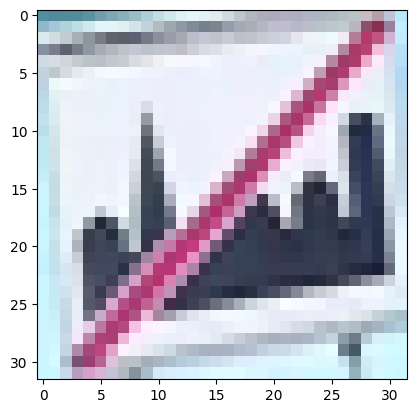

The traffic is: D-43 | Model predicted: D-43 | Class name: Koniec obszaru zabudowanego


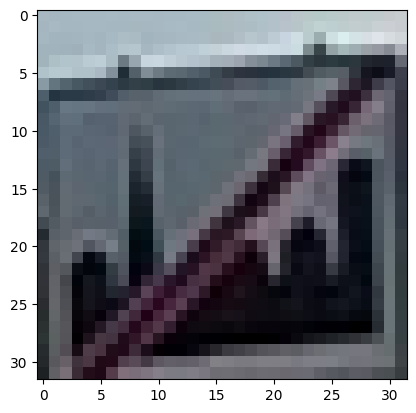

The traffic is: D-43 | Model predicted: D-43 | Class name: Koniec obszaru zabudowanego


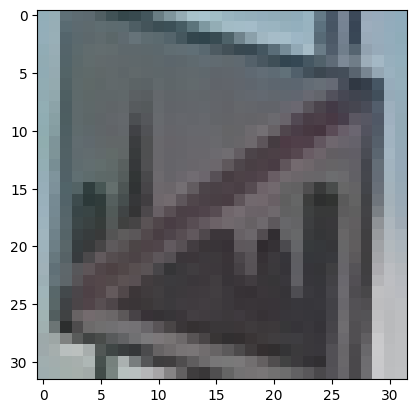

The traffic is: D-43 | Model predicted: D-43 | Class name: Koniec obszaru zabudowanego


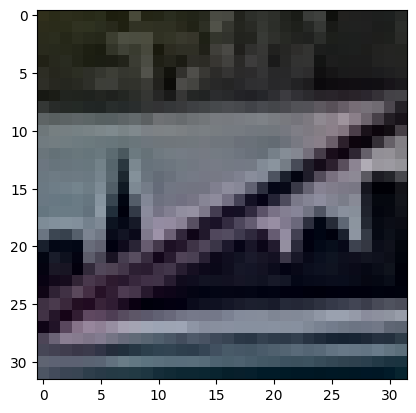

The traffic is: D-43 | Model predicted: D-42 | Class name: Obszar zabudowany


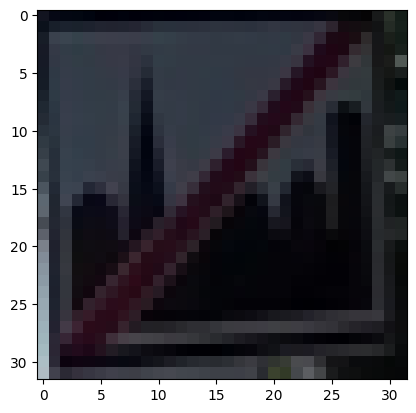

The traffic is: D-43 | Model predicted: D-43 | Class name: Koniec obszaru zabudowanego


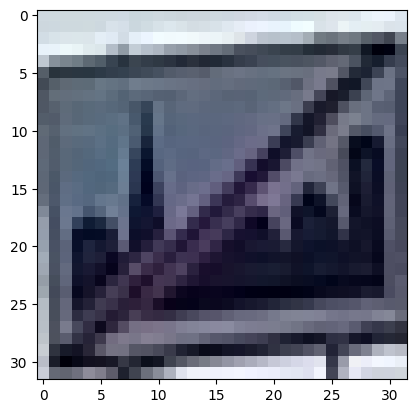

The traffic is: D-43 | Model predicted: D-43 | Class name: Koniec obszaru zabudowanego


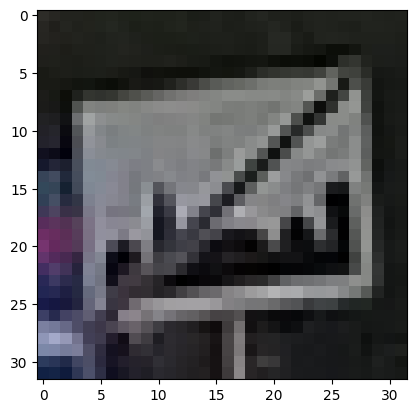

The traffic is: D-43 | Model predicted: D-43 | Class name: Koniec obszaru zabudowanego


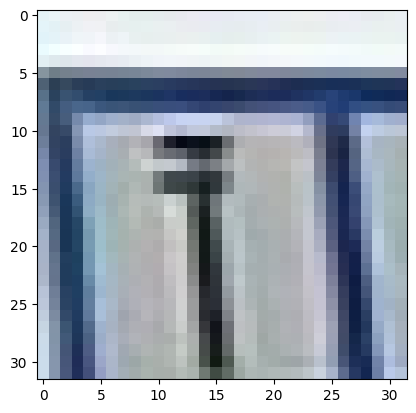

The traffic is: D-26 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


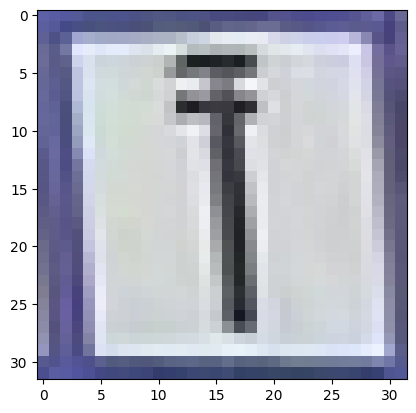

The traffic is: D-26 | Model predicted: D-26 | Class name: Stacja obsługi technicznej


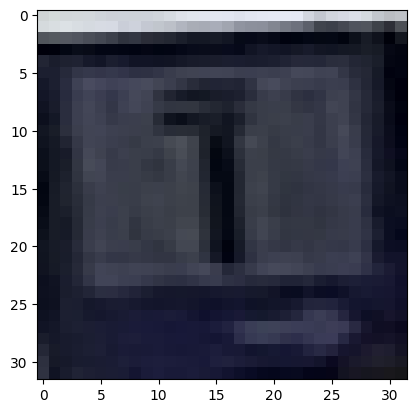

The traffic is: D-26 | Model predicted: D-26 | Class name: Stacja obsługi technicznej


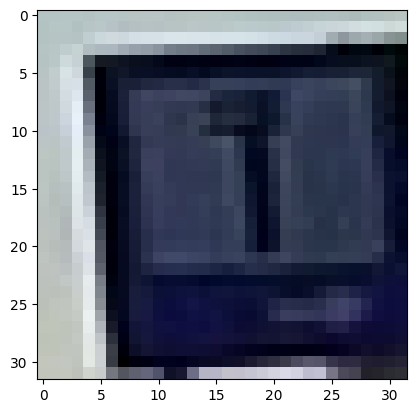

The traffic is: D-26 | Model predicted: B-33 | Class name: Ograniczenie prędkości


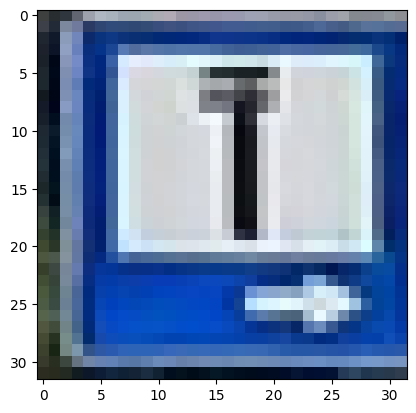

The traffic is: D-26 | Model predicted: D-26 | Class name: Stacja obsługi technicznej


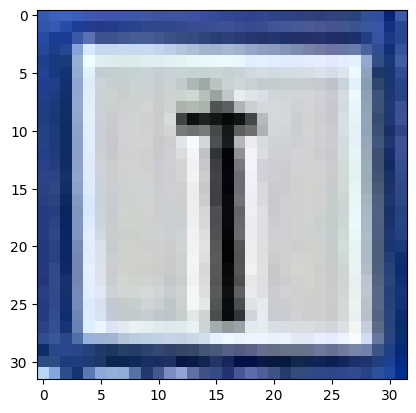

The traffic is: D-26 | Model predicted: D-26 | Class name: Stacja obsługi technicznej


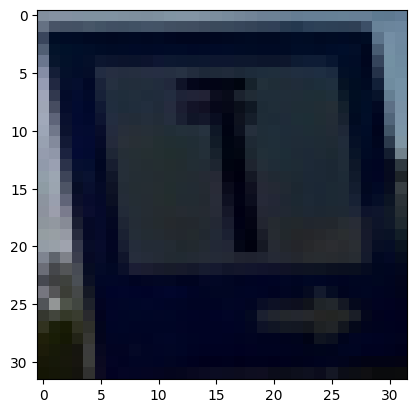

The traffic is: D-26 | Model predicted: D-26 | Class name: Stacja obsługi technicznej


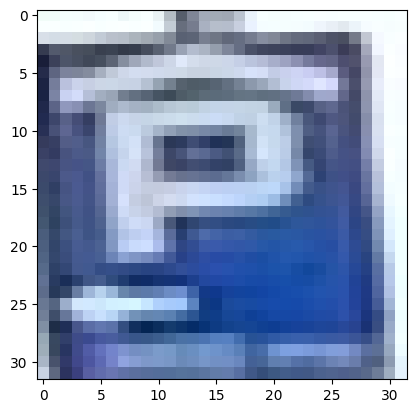

The traffic is: D-18b | Model predicted: D-18b | Class name: Parking zadaszony


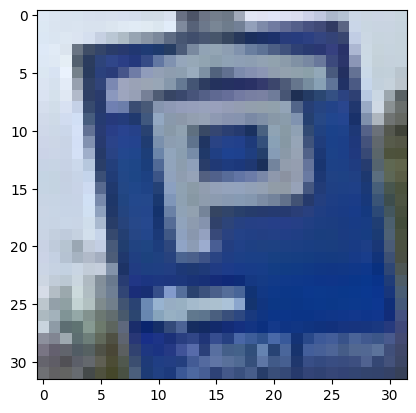

The traffic is: D-18b | Model predicted: D-18 | Class name: Parking


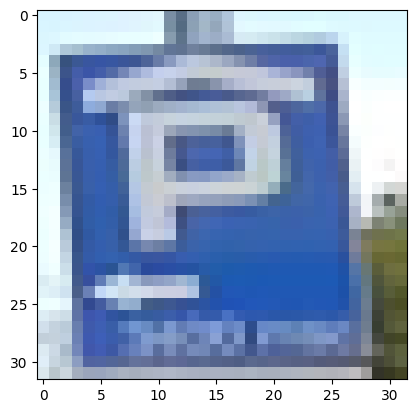

The traffic is: D-18b | Model predicted: D-18b | Class name: Parking zadaszony


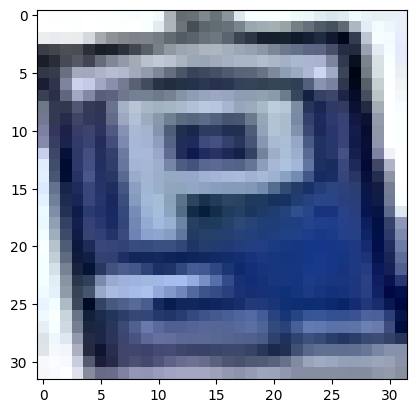

The traffic is: D-18b | Model predicted: D-18b | Class name: Parking zadaszony


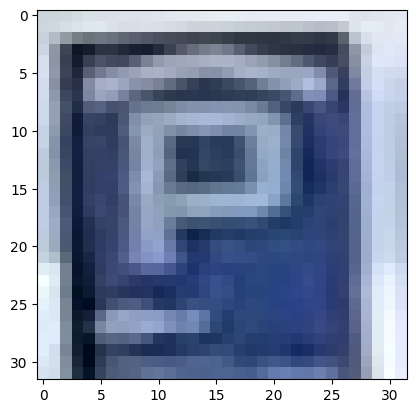

The traffic is: D-18b | Model predicted: D-18b | Class name: Parking zadaszony


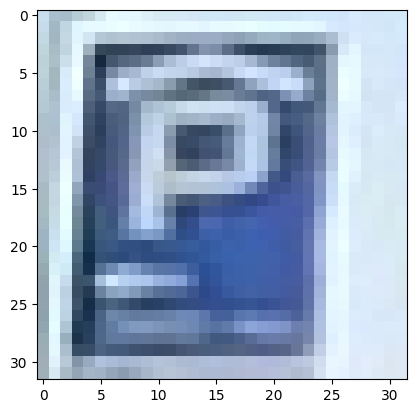

The traffic is: D-18b | Model predicted: D-23 | Class name: Stacja paliwowa


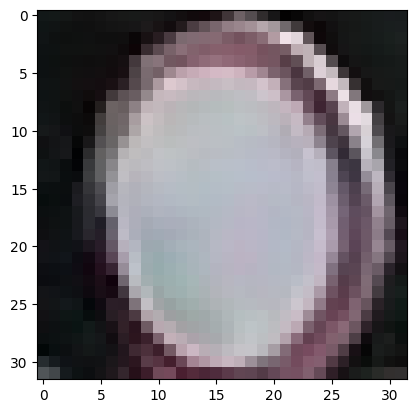

The traffic is: B-1 | Model predicted: B-33 | Class name: Ograniczenie prędkości


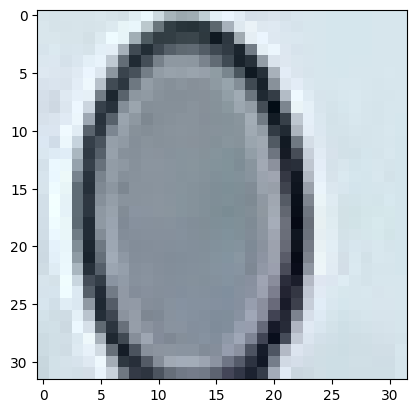

The traffic is: B-1 | Model predicted: B-33 | Class name: Ograniczenie prędkości


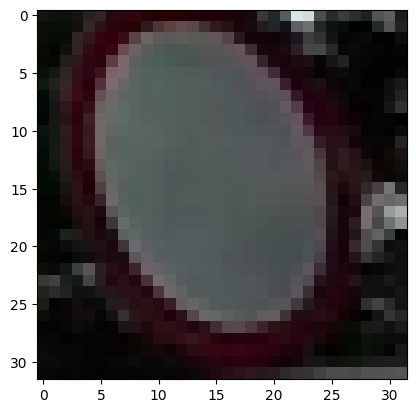

The traffic is: B-1 | Model predicted: B-1 | Class name: Zakaz ruchu w obu kierunkach


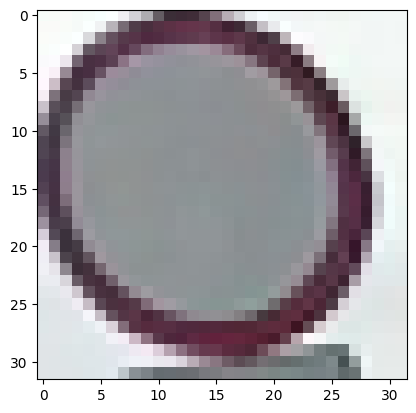

The traffic is: B-1 | Model predicted: B-1 | Class name: Zakaz ruchu w obu kierunkach


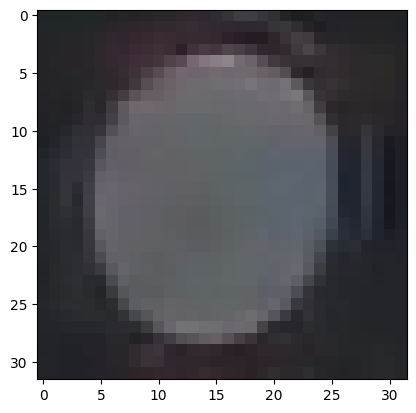

The traffic is: B-1 | Model predicted: B-1 | Class name: Zakaz ruchu w obu kierunkach


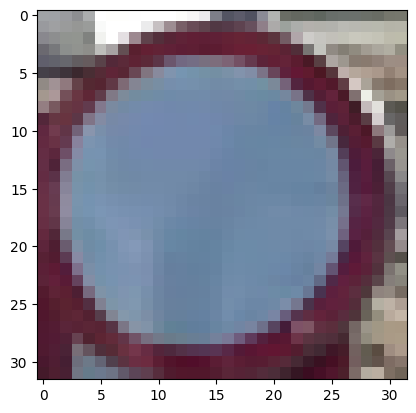

The traffic is: B-1 | Model predicted: B-1 | Class name: Zakaz ruchu w obu kierunkach


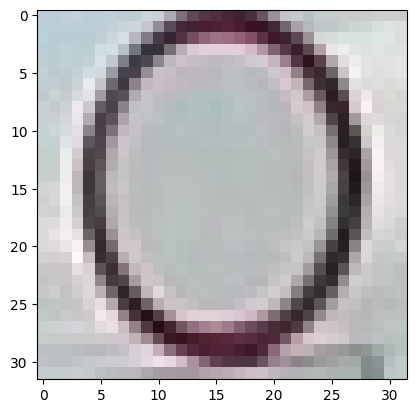

The traffic is: B-1 | Model predicted: B-1 | Class name: Zakaz ruchu w obu kierunkach


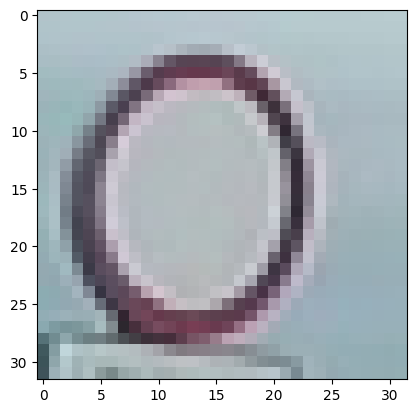

The traffic is: B-1 | Model predicted: B-33 | Class name: Ograniczenie prędkości


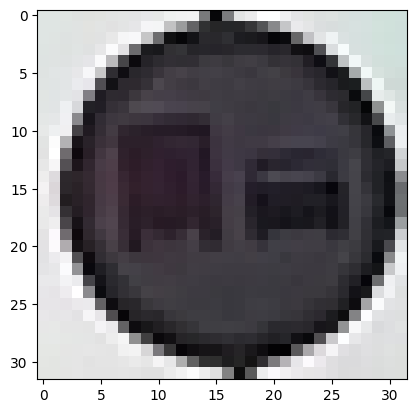

The traffic is: B-26 | Model predicted: B-26 | Class name: Zakaz wyprzedzania przez samochody ciężarowe


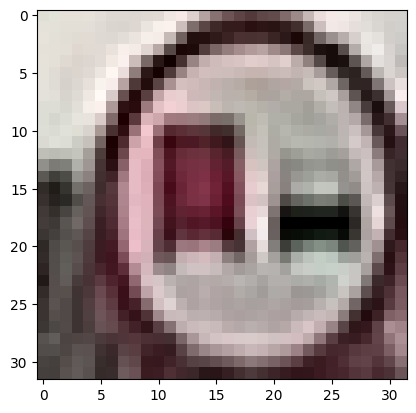

The traffic is: B-26 | Model predicted: B-33 | Class name: Ograniczenie prędkości


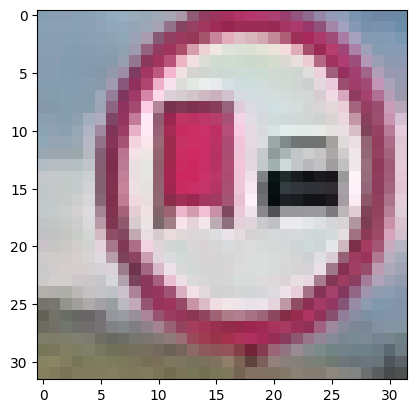

The traffic is: B-26 | Model predicted: B-33 | Class name: Ograniczenie prędkości


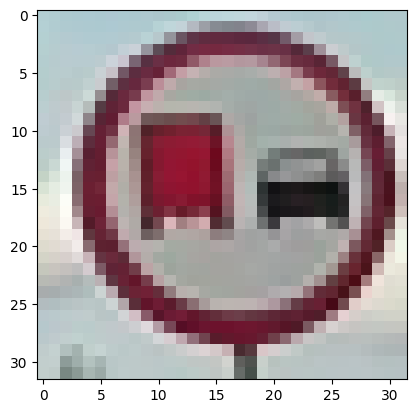

The traffic is: B-26 | Model predicted: B-26 | Class name: Zakaz wyprzedzania przez samochody ciężarowe


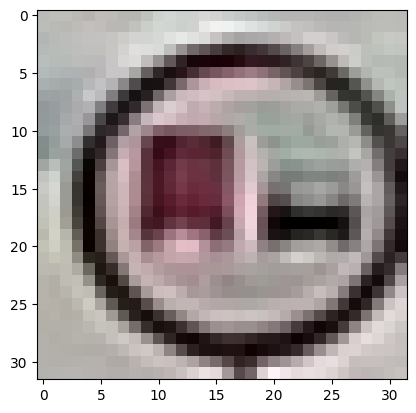

The traffic is: B-26 | Model predicted: B-33 | Class name: Ograniczenie prędkości


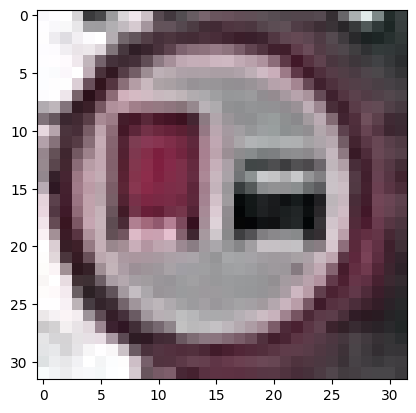

The traffic is: B-26 | Model predicted: B-26 | Class name: Zakaz wyprzedzania przez samochody ciężarowe


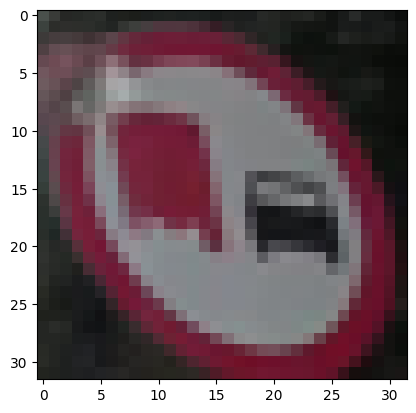

The traffic is: B-26 | Model predicted: B-26 | Class name: Zakaz wyprzedzania przez samochody ciężarowe


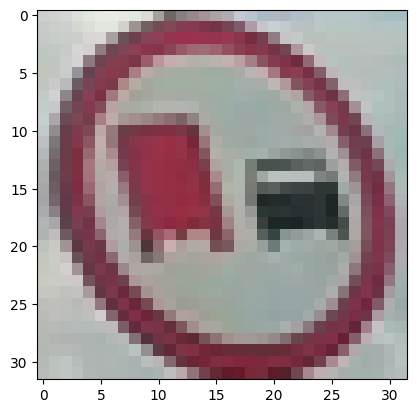

The traffic is: B-26 | Model predicted: B-26 | Class name: Zakaz wyprzedzania przez samochody ciężarowe


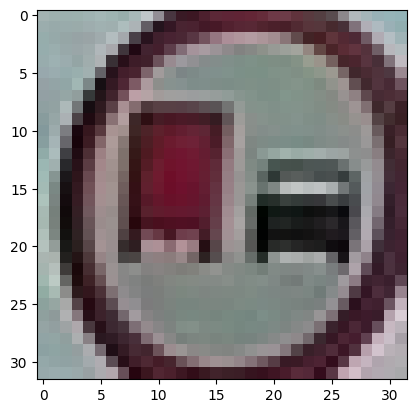

The traffic is: B-26 | Model predicted: B-43 | Class name: Strefa ograniczonej prędkości


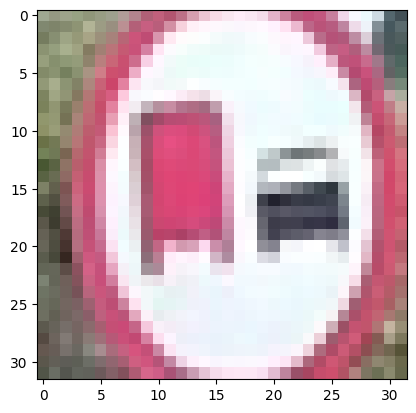

The traffic is: B-26 | Model predicted: B-43 | Class name: Strefa ograniczonej prędkości


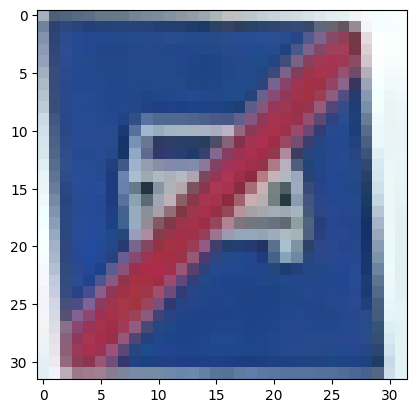

The traffic is: D-8 | Model predicted: D-8 | Class name: Koniec drogi ekspresowej


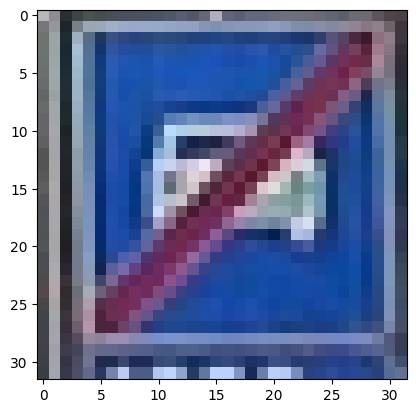

The traffic is: D-8 | Model predicted: D-8 | Class name: Koniec drogi ekspresowej


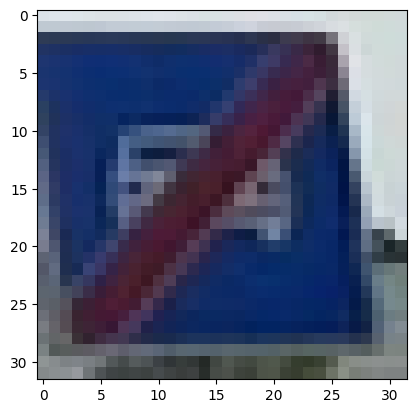

The traffic is: D-8 | Model predicted: D-8 | Class name: Koniec drogi ekspresowej


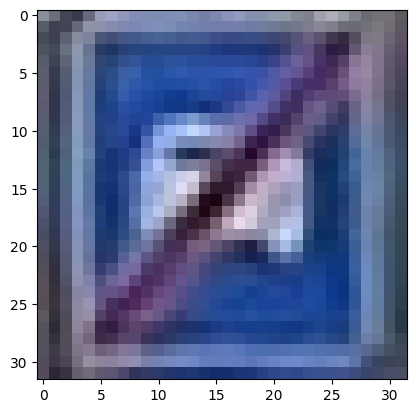

The traffic is: D-8 | Model predicted: D-8 | Class name: Koniec drogi ekspresowej


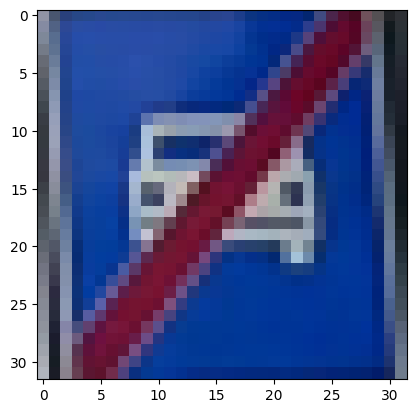

The traffic is: D-8 | Model predicted: D-8 | Class name: Koniec drogi ekspresowej


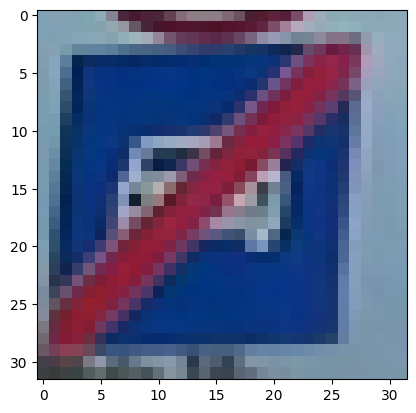

The traffic is: D-8 | Model predicted: D-8 | Class name: Koniec drogi ekspresowej


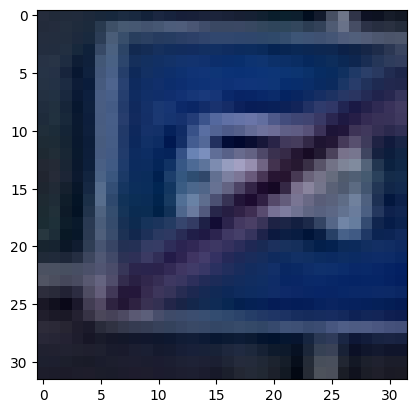

The traffic is: D-8 | Model predicted: D-7 | Class name: Droga ekspresowa


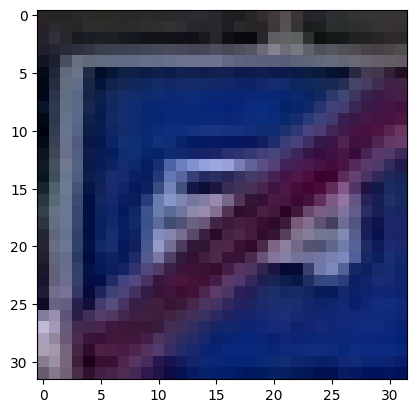

The traffic is: D-8 | Model predicted: D-6 | Class name: Przejście dla pieszych


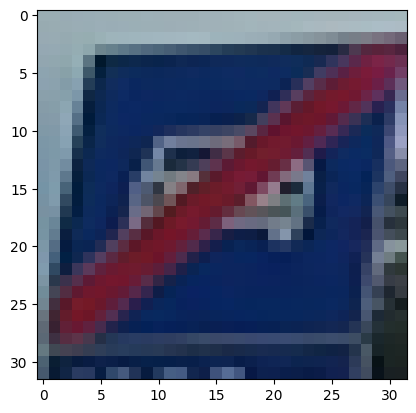

The traffic is: D-8 | Model predicted: D-8 | Class name: Koniec drogi ekspresowej


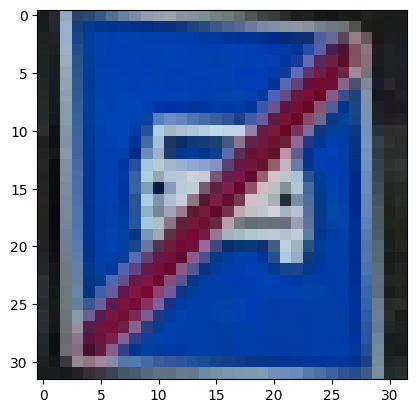

The traffic is: D-8 | Model predicted: D-8 | Class name: Koniec drogi ekspresowej


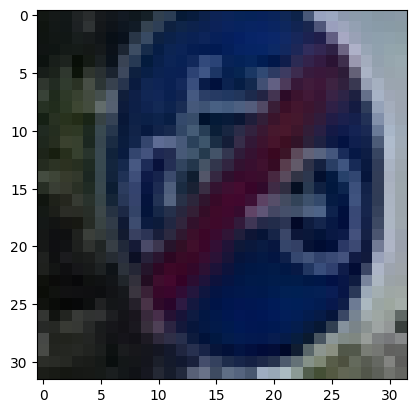

The traffic is: C-13a | Model predicted: D-8 | Class name: Koniec drogi ekspresowej


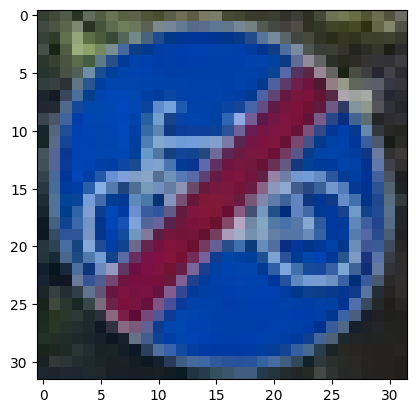

The traffic is: C-13a | Model predicted: C-13a | Class name: Koniec drogi dla rowerów


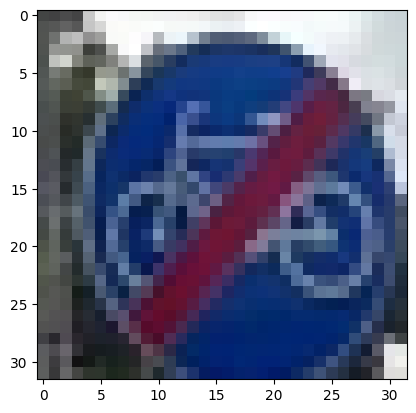

The traffic is: C-13a | Model predicted: D-8 | Class name: Koniec drogi ekspresowej


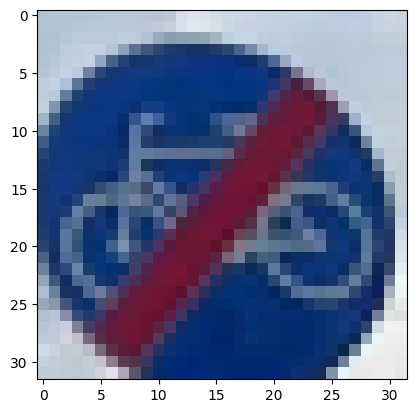

The traffic is: C-13a | Model predicted: C-13a | Class name: Koniec drogi dla rowerów


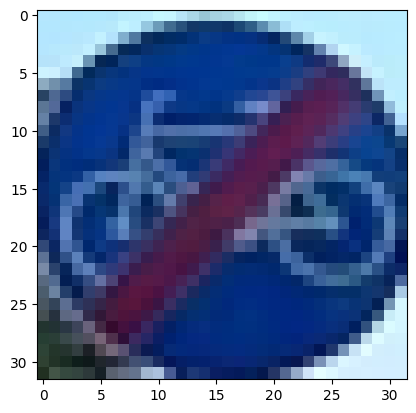

The traffic is: C-13a | Model predicted: C-13a | Class name: Koniec drogi dla rowerów


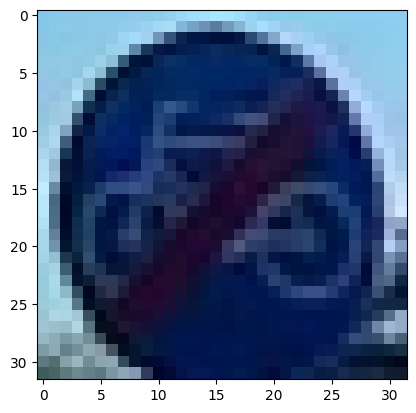

The traffic is: C-13a | Model predicted: D-8 | Class name: Koniec drogi ekspresowej


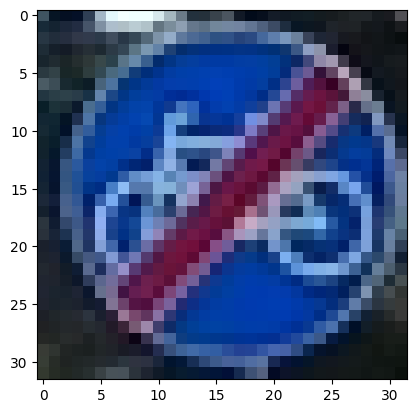

The traffic is: C-13a | Model predicted: D-8 | Class name: Koniec drogi ekspresowej


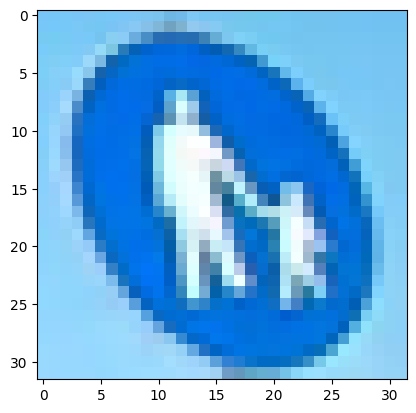

The traffic is: C-16 | Model predicted: C-16 | Class name: Droga dla pieszych


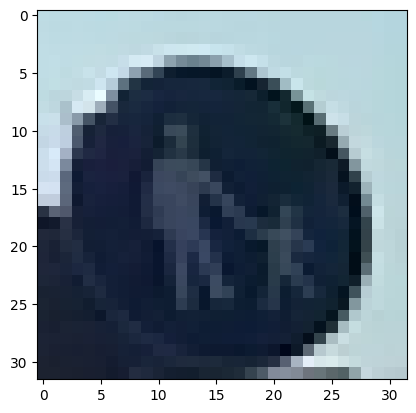

The traffic is: C-16 | Model predicted: B-33 | Class name: Ograniczenie prędkości


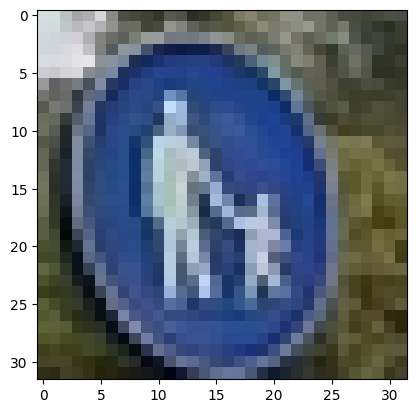

The traffic is: C-16 | Model predicted: C-16 | Class name: Droga dla pieszych


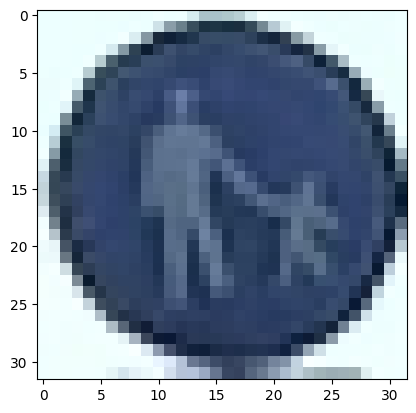

The traffic is: C-16 | Model predicted: D-3 | Class name: Droga jednokierunkowa


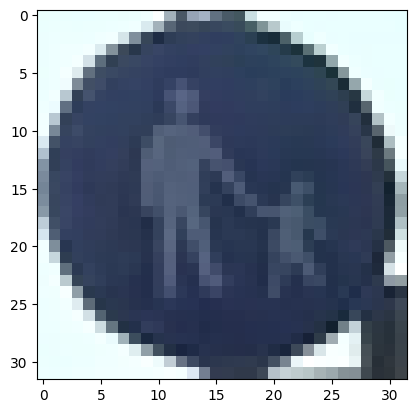

The traffic is: C-16 | Model predicted: D-3 | Class name: Droga jednokierunkowa


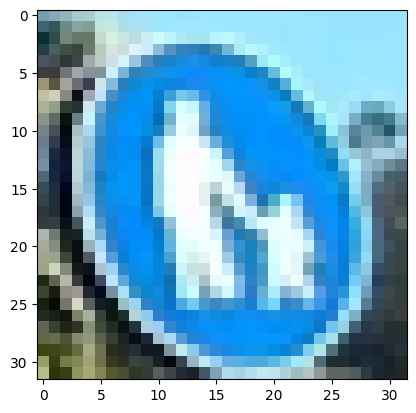

The traffic is: C-16 | Model predicted: D-6 | Class name: Przejście dla pieszych


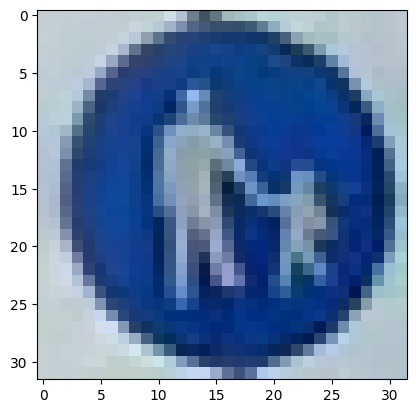

The traffic is: C-16 | Model predicted: C-16 | Class name: Droga dla pieszych


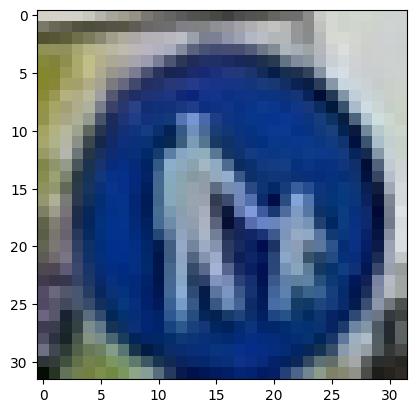

The traffic is: C-16 | Model predicted: C-16 | Class name: Droga dla pieszych


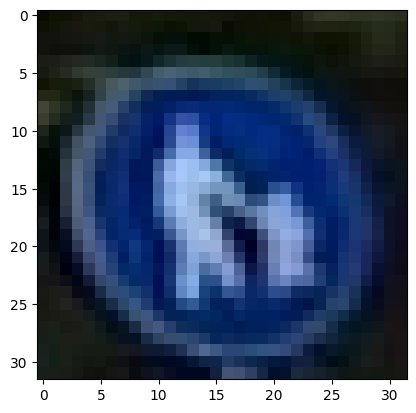

The traffic is: C-16 | Model predicted: C-16 | Class name: Droga dla pieszych


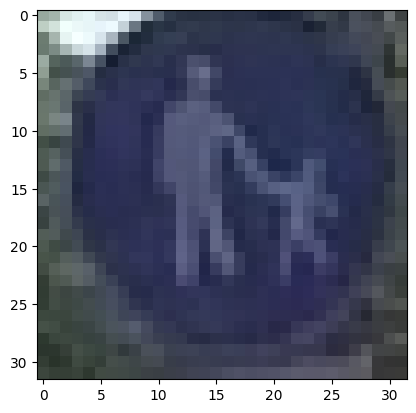

The traffic is: C-16 | Model predicted: D-3 | Class name: Droga jednokierunkowa


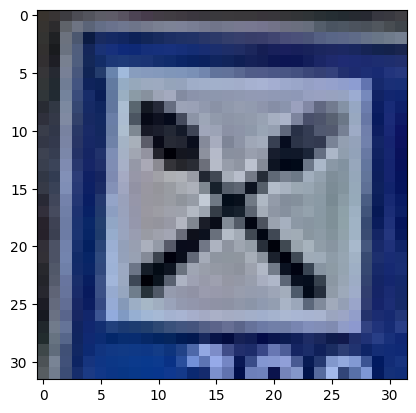

The traffic is: D-28 | Model predicted: B-33 | Class name: Ograniczenie prędkości


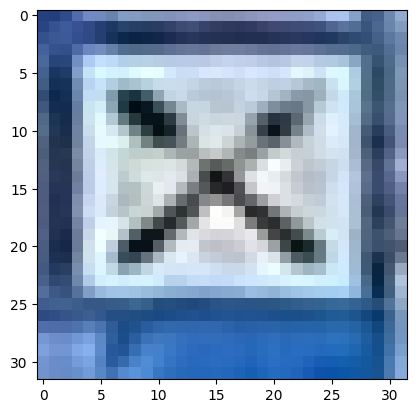

The traffic is: D-28 | Model predicted: B-33 | Class name: Ograniczenie prędkości


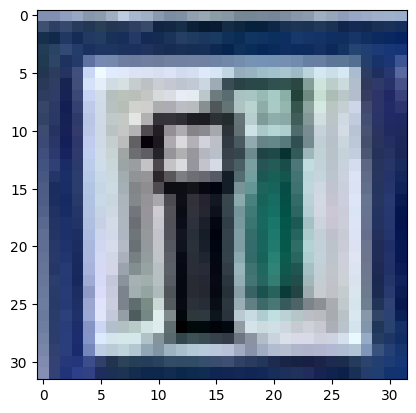

The traffic is: D-28 | Model predicted: D-23 | Class name: Stacja paliwowa


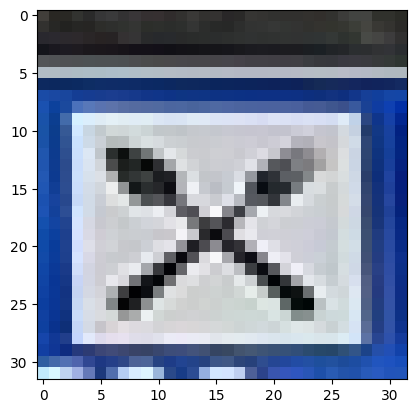

The traffic is: D-28 | Model predicted: A-7 | Class name: Ustąp pierwszeństwa


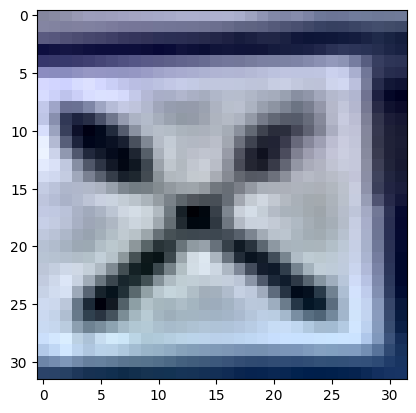

The traffic is: D-28 | Model predicted: B-33 | Class name: Ograniczenie prędkości


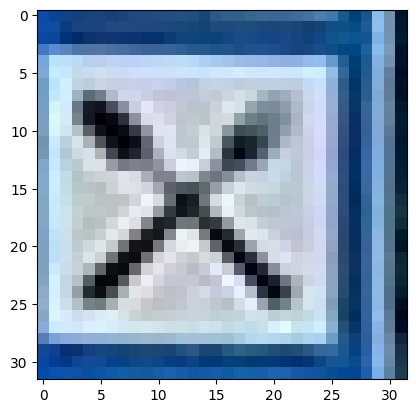

The traffic is: D-28 | Model predicted: B-33 | Class name: Ograniczenie prędkości


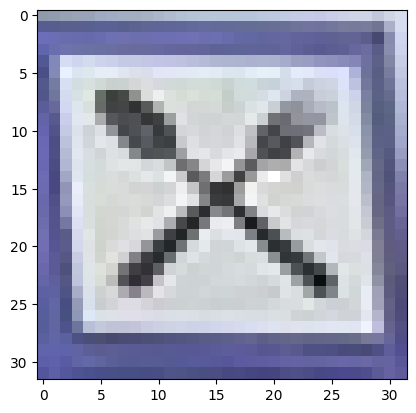

The traffic is: D-28 | Model predicted: B-33 | Class name: Ograniczenie prędkości


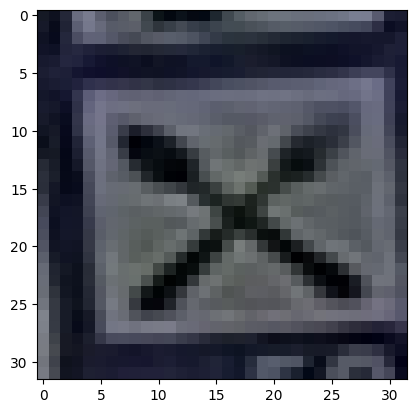

The traffic is: D-28 | Model predicted: B-33 | Class name: Ograniczenie prędkości


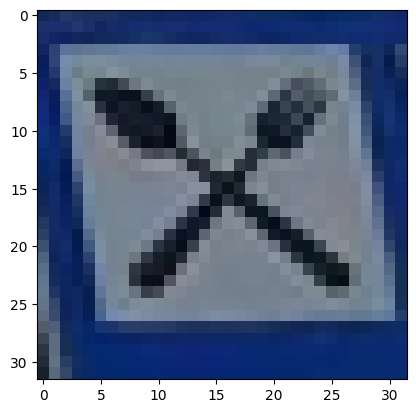

The traffic is: D-28 | Model predicted: D-28 | Class name: Restauracja


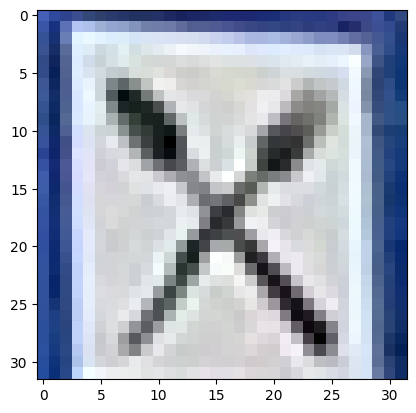

The traffic is: D-28 | Model predicted: D-6 | Class name: Przejście dla pieszych


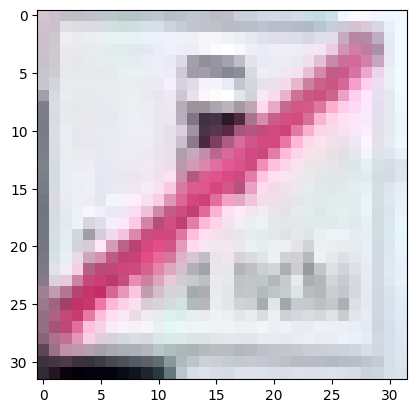

The traffic is: D-53 | Model predicted: D-53 | Class name: Koniec strefy ruchu


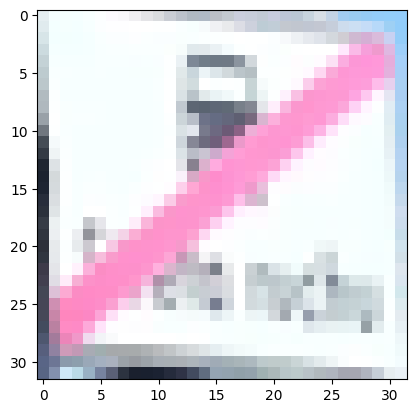

The traffic is: D-53 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


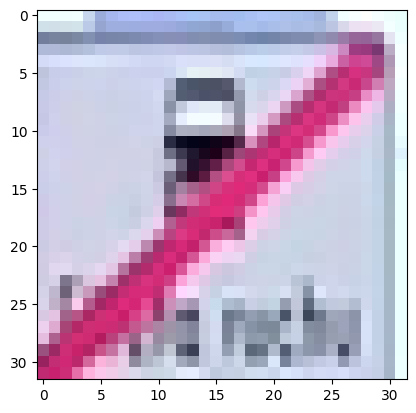

The traffic is: D-53 | Model predicted: D-23 | Class name: Stacja paliwowa


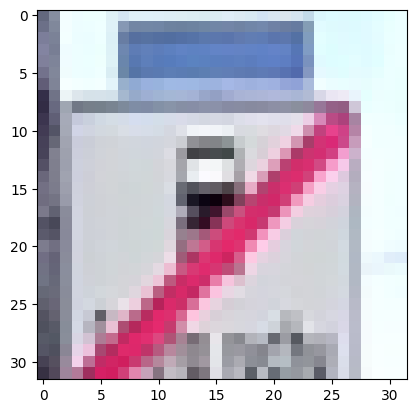

The traffic is: D-53 | Model predicted: A-32 | Class name: Oszronienie jezdni


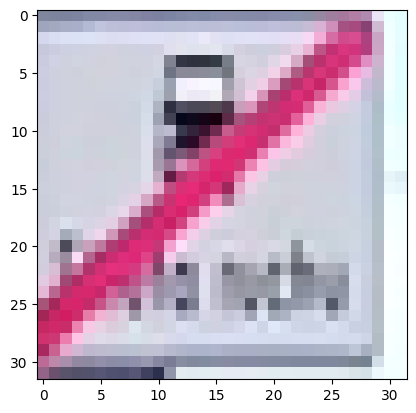

The traffic is: D-53 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


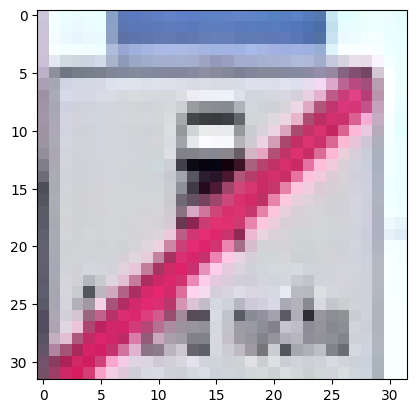

The traffic is: D-53 | Model predicted: D-23 | Class name: Stacja paliwowa


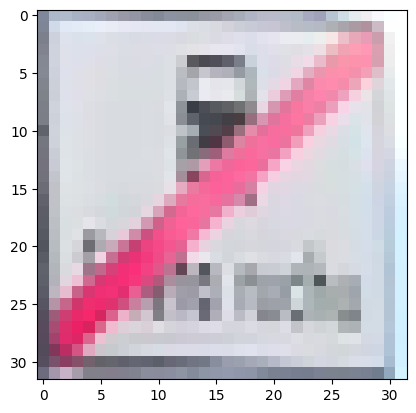

The traffic is: D-53 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


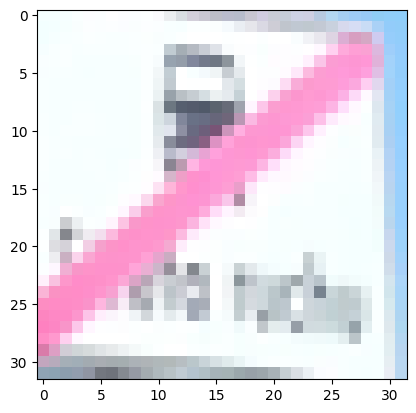

The traffic is: D-53 | Model predicted: A-30 | Class name: Inne niebezpieczeństwo


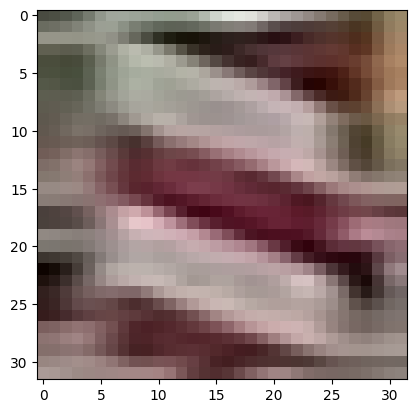

The traffic is: G-1a | Model predicted: B-25 | Class name: Zakaz wyprzedzania


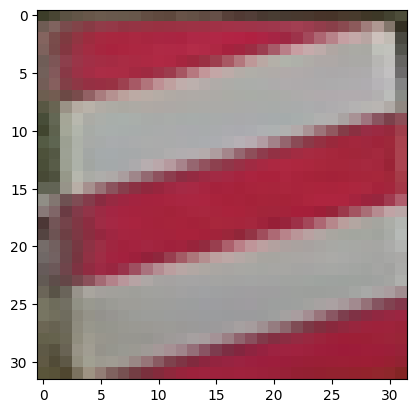

The traffic is: G-1a | Model predicted: G-1a | Class name: Słupek wskaźnikowy z trzema kreskami umieszczany po prawej stronie jezdni


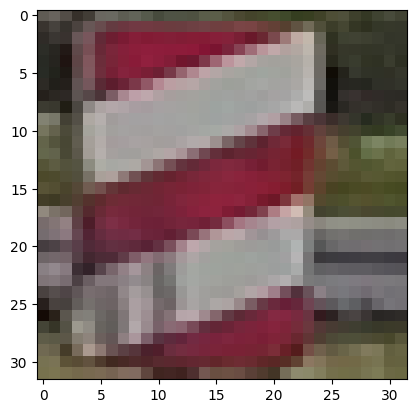

The traffic is: G-1a | Model predicted: G-1a | Class name: Słupek wskaźnikowy z trzema kreskami umieszczany po prawej stronie jezdni


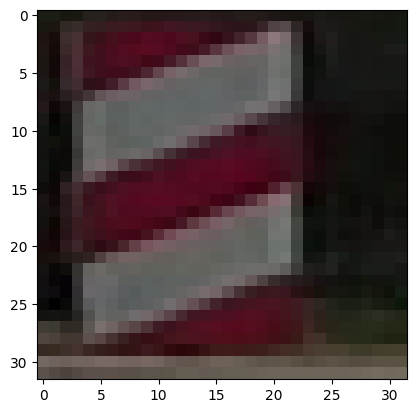

The traffic is: G-1a | Model predicted: B-33 | Class name: Ograniczenie prędkości


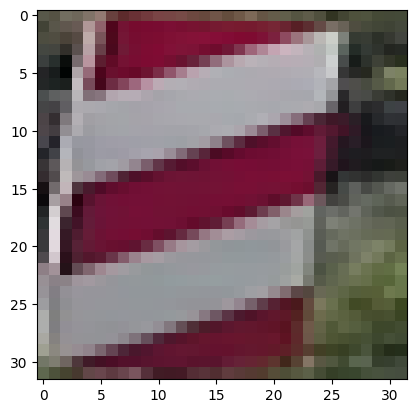

The traffic is: G-1a | Model predicted: D-26c | Class name: Toaleta publiczna


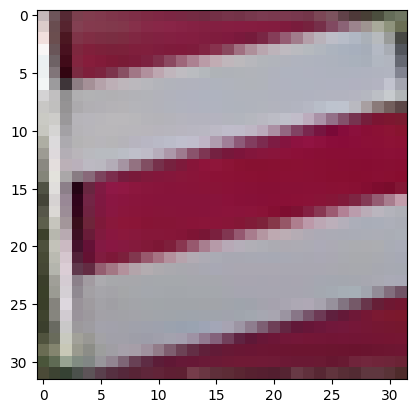

The traffic is: G-1a | Model predicted: G-1a | Class name: Słupek wskaźnikowy z trzema kreskami umieszczany po prawej stronie jezdni


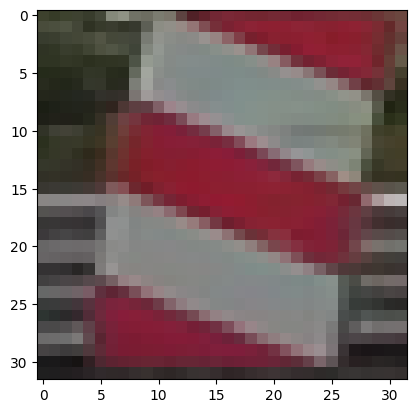

The traffic is: G-1a | Model predicted: D-1 | Class name: Droga z pierwszeństwem


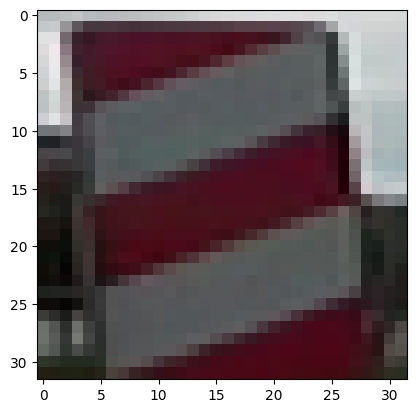

The traffic is: G-1a | Model predicted: G-1a | Class name: Słupek wskaźnikowy z trzema kreskami umieszczany po prawej stronie jezdni


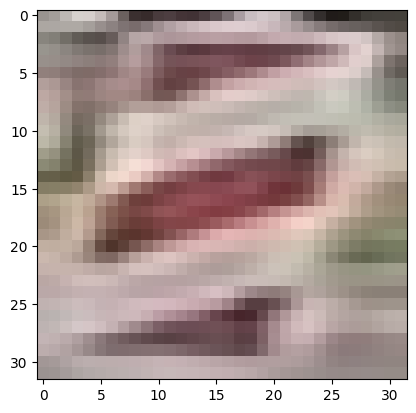

The traffic is: G-1a | Model predicted: G-1a | Class name: Słupek wskaźnikowy z trzema kreskami umieszczany po prawej stronie jezdni


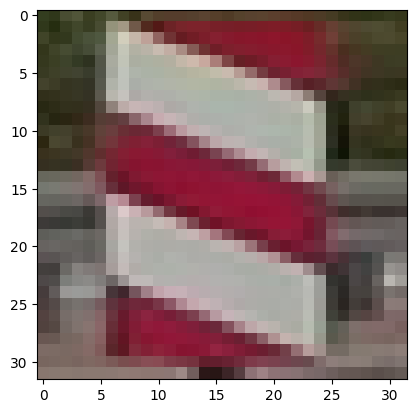

The traffic is: G-1a | Model predicted: G-1a | Class name: Słupek wskaźnikowy z trzema kreskami umieszczany po prawej stronie jezdni


In [100]:
correct_tries = 0

def select_ten_images_from_each_folder(main_folder_path):
    subfolders = [f.path for f in os.scandir(main_folder_path) if f.is_dir()]
    selected_image_paths = []
    for folder in subfolders:
        files_in_folder = [f for f in os.listdir(folder) if os.path.isfile(os.path.join(folder, f))]
        if len(files_in_folder) >= 10:
            random_files = random.sample(files_in_folder, 10)
        else:
            random_files = files_in_folder
        for file in random_files:
            file_path = os.path.join(folder, file)
            selected_image_paths.append(file_path)
    return selected_image_paths

# Original Dataset
main_folder_path = '/kaggle/working/original_dataset/test/'
selected_image_paths = select_ten_images_from_each_folder(main_folder_path)

predict_sign_from_image(model_original, selected_image_paths)